<a href="https://colab.research.google.com/github/E-Fung/Classification_PCD/blob/E-Fung-patch-1/PCD_V3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **INITIALIZE LIBRARIES AND FINAL FILE NAMES**

In [1]:
#########################################################################################################################################################################
#   Initialize libraries and such
#########################################################################################################################################################################

%tensorflow_version 2.x  # this line is not required unless you are in a notebook
from __future__ import absolute_import, division, print_function, unicode_literals
from mpl_toolkits.mplot3d import Axes3D
from google.colab import files
import seaborn as sns
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import io
import os
import math

# Print versions
!python --versions
print('Numpy ' + np.__version__)
print('TensorFlow ' + tf.__version__)
print('Keras ' + tf.keras.__version__)

tflite_model_name = 'PCD_Model'
c_model_name = 'PCD_Model'

#This is for gathering the metrics (accuracy % loss) for another set of values
class AdditionalValidationSets(tf.keras.callbacks.Callback):
    def __init__(self, validation_sets, verbose=0, batch_size=None):
        """
        :param validation_sets:
        a list of 3-tuples (validation_data, validation_targets, validation_set_name)
        or 4-tuples (validation_data, validation_targets, sample_weights, validation_set_name)
        :param verbose:
        verbosity mode, 1 or 0
        :param batch_size:
        batch size to be used when evaluating on the additional datasets
        """
        super(AdditionalValidationSets, self).__init__()
        self.validation_sets = validation_sets
        for validation_set in self.validation_sets:
            if len(validation_set) not in [3, 4]:
                raise ValueError()
        self.epoch = []
        self.history = {}
        self.verbose = verbose
        self.batch_size = batch_size

    def on_train_begin(self, logs=None):
        self.epoch = []
        self.history = {}

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        self.epoch.append(epoch)

        # record the same values as History() as well
        for k, v in logs.items():
            self.history.setdefault(k, []).append(v)

        # evaluate on the additional validation sets
        for validation_set in self.validation_sets:
            if len(validation_set) == 3:
                validation_data, validation_targets, validation_set_name = validation_set
                sample_weights = None
            elif len(validation_set) == 4:
                validation_data, validation_targets, sample_weights, validation_set_name = validation_set
            else:
                raise ValueError()

            results = self.model.evaluate(x=validation_data,
                                          y=validation_targets,
                                          verbose=self.verbose,
                                          sample_weight=sample_weights,
                                          batch_size=self.batch_size)

            for metric, result in zip(self.model.metrics_names,results):
                valuename = validation_set_name + '_' + metric
                self.history.setdefault(valuename, []).append(result)

#########################################################################################################################################################################

`%tensorflow_version` only switches the major version: 1.x or 2.x.
You set: `2.x  # this line is not required unless you are in a notebook`. This will be interpreted as: `2.x`.


TensorFlow 2.x selected.
unknown option --versions
usage: python3 [option] ... [-c cmd | -m mod | file | -] [arg] ...
Try `python -h' for more information.
Numpy 1.19.5
TensorFlow 2.4.1
Keras 2.4.0


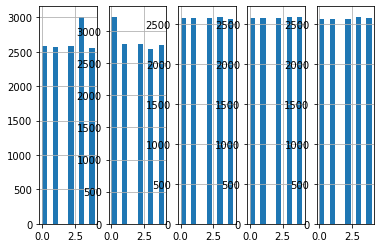

In [7]:
#Verify that the data is good
dd1 = 'data_n01'
dd2 = 'data_n02'
dd3 = 'data_n03'
dd4 = 'data_n04'
dd5 = 'data_n05'
imp_dd1 = pd.read_csv(dd1+'.csv')
imp_dd2 = pd.read_csv(dd2+'.csv')
imp_dd3 = pd.read_csv(dd3+'.csv')
imp_dd4 = pd.read_csv(dd4+'.csv')
imp_dd5 = pd.read_csv(dd5+'.csv')
plt.subplot(1,5,1)
imp_dd1.Class.hist()
plt.subplot(1,5,2)
imp_dd2.Class.hist()
plt.subplot(1,5,3)
imp_dd3.Class.hist()
plt.subplot(1,5,4)
imp_dd4.Class.hist()
plt.subplot(1,5,5)
imp_dd5.Class.hist()

# **UPLOADING**

In [6]:
#########################################################################################################################################################################
#   Uploading Files
#########################################################################################################################################################################

file_name = 'data_n01' #Change this to the name of the csv file you are uploading
uploaded = files.upload()
pd.read_csv(io.StringIO(uploaded[file_name+'.csv'].decode('utf-8')))

#########################################################################################################################################################################

Saving data_n01.csv to data_n01.csv


,x1,y1,z1,x2,y2,z2,x3,y3,z3,x4,y4,z4,Class
0,-137.34,-20.44,-30.73,-33.15,29.61,32.07,-110.11,-23.72,32.40,-37.32,-22.87,40.92,0
1,-137.15,-20.39,-30.73,-32.89,29.50,32.04,-109.86,-23.47,32.48,-37.32,-22.65,41.13,0
2,-136.97,-20.32,-30.78,-32.59,29.32,32.00,-109.56,-23.40,32.59,-37.28,-22.61,41.09,0
3,-136.56,-20.24,-31.00,-32.40,29.22,31.88,-109.07,-23.40,32.52,-37.20,-22.65,40.96,0
4,-136.23,-20.11,-30.98,-32.15,29.05,31.72,-108.81,-23.49,32.29,-37.08,-22.82,40.60,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
13317,-162.82,-29.32,-14.40,-77.08,33.76,20.25,-71.05,-17.47,29.64,-24.99,-29.29,26.26,4
13318,-162.50,-29.40,-14.42,-76.97,33.79,20.52,-70.66,-17.44,29.33,-25.56,-29.60,26.08,4
13319,-162.36,-29.44,-14.79,-76.92,34.08,20.78,-70.58,-17.45,28.94,-26.17,-29.76,25.90,4
13320,-161.97,-29.45,-14.99,-77.04,34.23,20.62,-70.86,-17.59,28.86,-26.62,-29.77,25.80,4


# **PROCESSING**

In [8]:
#########################################################################################################################################################################
#   This block of code is for processing the data, made into a function to implement n-fold cross validation
#########################################################################################################################################################################

def get_data(i):

  #Change these
  train_row_increments = 5
  test_row_increments = 5

  data_arr = ['data_n01','data_n02','data_n03','data_n04','data_n05']
  test_data = data_arr[i]
  data_arr.remove(data_arr[i])

  train_data_01 = data_arr[0]
  train_data_02 = data_arr[1]
  train_data_03 = data_arr[2]
  train_data_04 = data_arr[3]

  #Initialize dataframes for storing the data and combine them to increase effectiveness of model
  train_data1 = pd.read_csv(train_data_01+'.csv')
  train_data2 = pd.read_csv(train_data_02+'.csv')
  train_data3 = pd.read_csv(train_data_03+'.csv')
  train_data4 = pd.read_csv(train_data_04+'.csv')
  train_data_combined = pd.concat([train_data1,train_data2,train_data3,train_data4],ignore_index=True)

  #Process the data::
  train_data_sampled = train_data_combined[1::train_row_increments]#sample every 'train_row_increments' row (IMUs give data very frequently so the data is very similar)
  data_shuffled = train_data_sampled.sample(frac=1).reset_index(drop=True)#shuffle it
  d0 = data_shuffled.loc[data_shuffled['Class'] == 0]#how much data for each posture
  d1 = data_shuffled.loc[data_shuffled['Class'] == 1]
  d2 = data_shuffled.loc[data_shuffled['Class'] == 2]
  d3 = data_shuffled.loc[data_shuffled['Class'] == 3]
  d4 = data_shuffled.loc[data_shuffled['Class'] == 4]
  min_class = min(len(d0),len(d1),len(d2),len(d3),len(d4))
  d0_split = d0.sample(frac=(min_class/len(d0)),random_state=1) #get the same amount for each posture
  d1_split = d1.sample(frac=(min_class/len(d1)),random_state=1) 
  d2_split = d2.sample(frac=(min_class/len(d2)),random_state=1) 
  d3_split = d3.sample(frac=(min_class/len(d3)),random_state=1) 
  d4_split = d4.sample(frac=(min_class/len(d4)),random_state=1) 
  data_final_combine = pd.concat([d0_split,d1_split,d2_split,d3_split,d4_split],ignore_index=True)#combine
  data_processed = data_final_combine.sample(frac=1).reset_index(drop=True)#shuffle again
  posture_processed = data_processed.pop('Class')
  data_processed = data_processed/180

  global x_val,x_train,y_val,y_train,test,test_pop

  #Split the data into 3 sets:: Training, Validation(used to check against overfitting, you dont want training accuracy to be over validation) 
  val_ratio = 0.3    # Percentage of samples that should be held for validation set
  length_data_processed = data_processed.shape[0]
  val_split = int(val_ratio * length_data_processed)
  x_val, x_train = np.split(data_processed, [val_split])
  y_val, y_train = np.split(posture_processed, [val_split])
  assert(x_train.size + x_val.size) == data_processed.size

  #Process the data for the testing data (This will be data from a new user that has never had their data in the training set)
  test = pd.read_csv(test_data+'.csv')
  test = test [1::test_row_increments]
  test = test.sample(frac=1).reset_index(drop=True)
  test_pop = test.pop('Class')
  test = test / 180

#########################################################################################################################################################################

# **TRAINING**

Model: "sequential_316"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_316 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_632 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2280      
_________________________________________________________________
dropout_633 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,410
Trainable params: 3,410
Non-trainable params: 0
__________________________________________________

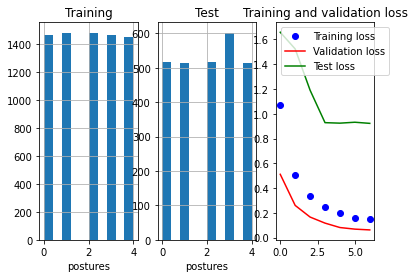

84/84 - 0s - loss: 0.9222 - accuracy: 0.6904

Test accuracy: 0.690431535243988


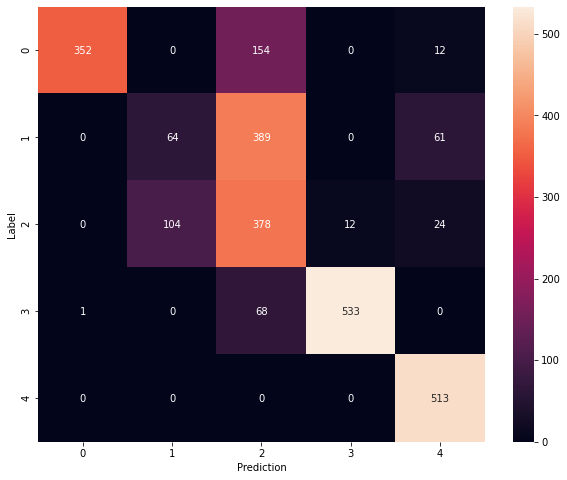

Model: "sequential_317"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_317 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_634 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2280      
_________________________________________________________________
dropout_635 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,410
Trainable params: 3,410
Non-trainable params: 0
__________________________________________________

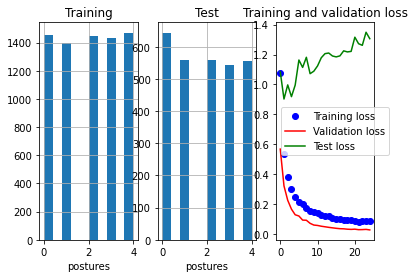

90/90 - 0s - loss: 1.3060 - accuracy: 0.7616

Test accuracy: 0.7616218328475952


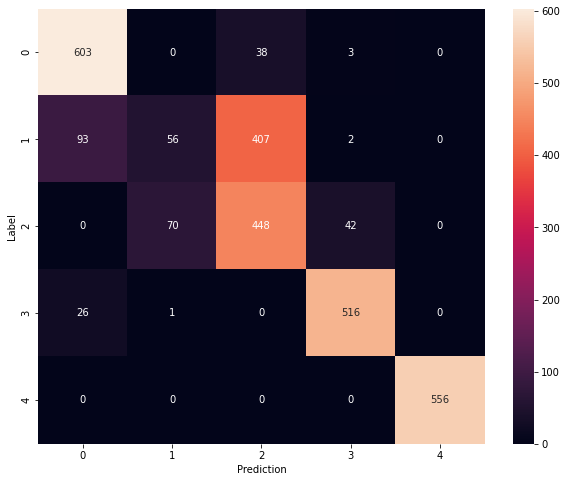

Model: "sequential_318"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_318 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_636 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2280      
_________________________________________________________________
dropout_637 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,410
Trainable params: 3,410
Non-trainable params: 0
__________________________________________________

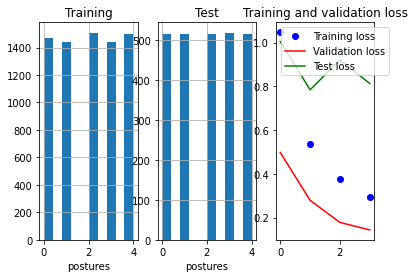

81/81 - 0s - loss: 0.8131 - accuracy: 0.7078

Test accuracy: 0.7077997922897339


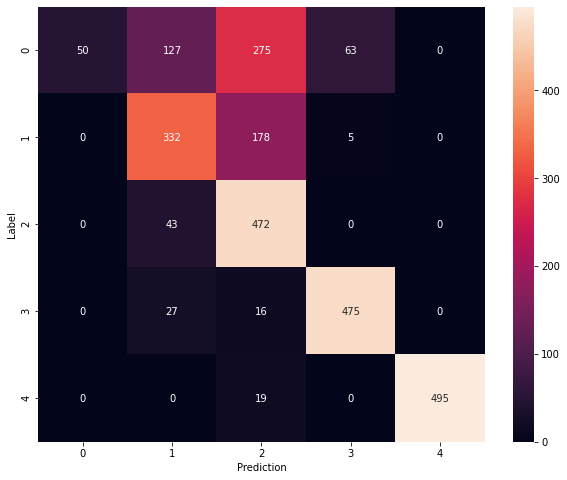

Model: "sequential_319"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_319 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_638 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2280      
_________________________________________________________________
dropout_639 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,410
Trainable params: 3,410
Non-trainable params: 0
__________________________________________________

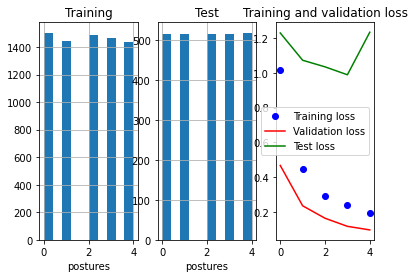

81/81 - 0s - loss: 1.2347 - accuracy: 0.5939

Test accuracy: 0.5938712358474731


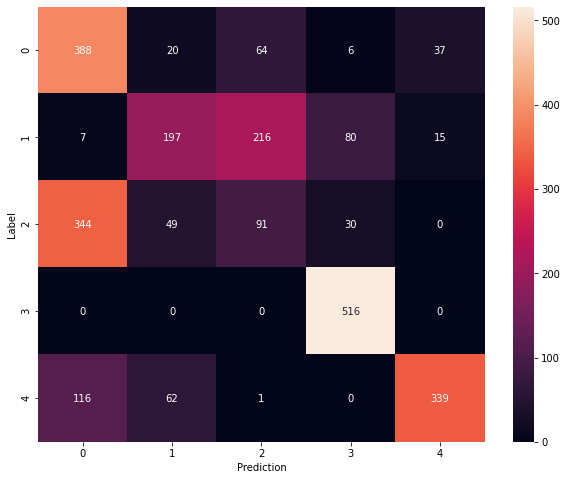

Model: "sequential_320"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_320 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_640 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2280      
_________________________________________________________________
dropout_641 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,410
Trainable params: 3,410
Non-trainable params: 0
__________________________________________________

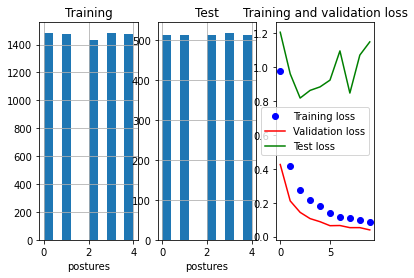

81/81 - 0s - loss: 1.1499 - accuracy: 0.7483

Test accuracy: 0.7483469247817993


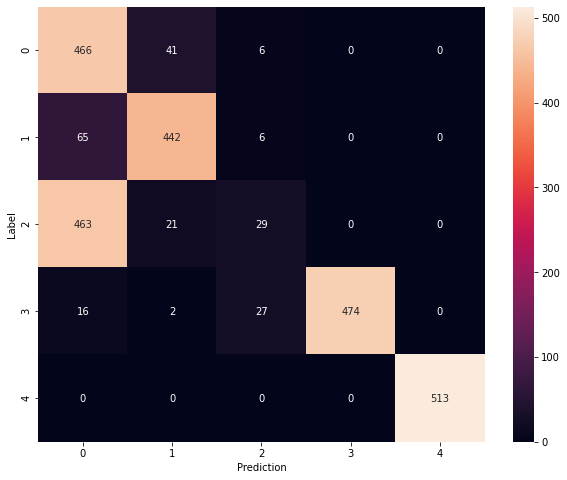

Model: "sequential_321"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_321 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_642 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2280      
_________________________________________________________________
dropout_643 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,410
Trainable params: 3,410
Non-trainable params: 0
__________________________________________________

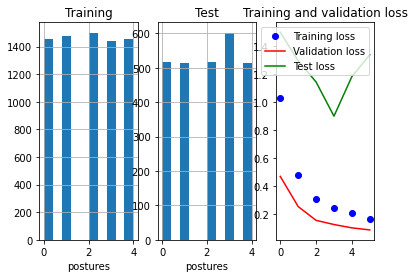

84/84 - 0s - loss: 1.3382 - accuracy: 0.6762

Test accuracy: 0.6761726140975952


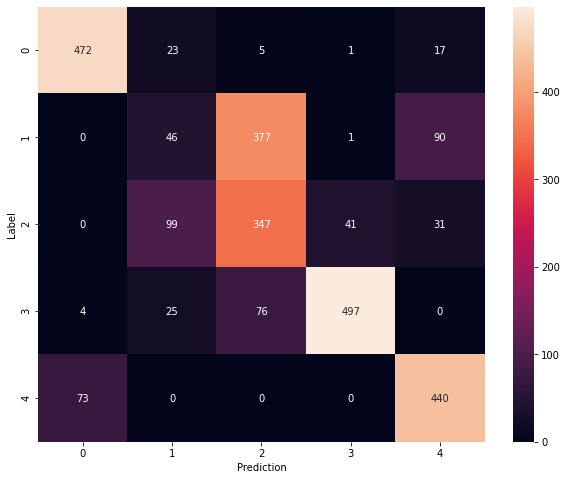

Model: "sequential_322"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_322 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_644 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2280      
_________________________________________________________________
dropout_645 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,410
Trainable params: 3,410
Non-trainable params: 0
__________________________________________________

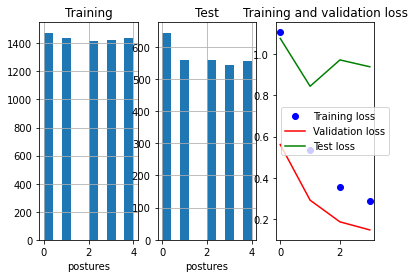

90/90 - 0s - loss: 0.9373 - accuracy: 0.6963

Test accuracy: 0.6962600350379944


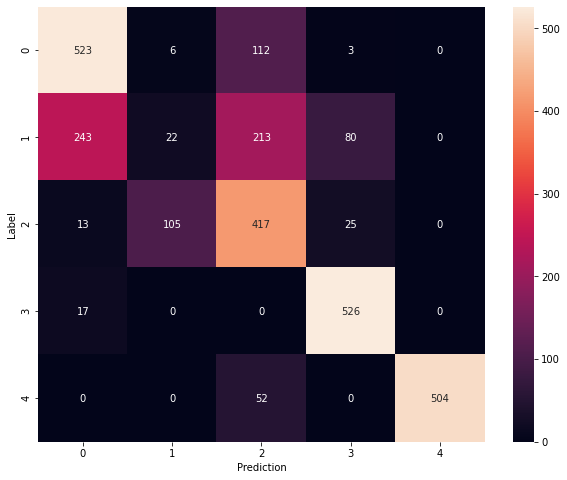

Model: "sequential_323"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_323 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_646 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2280      
_________________________________________________________________
dropout_647 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,410
Trainable params: 3,410
Non-trainable params: 0
__________________________________________________

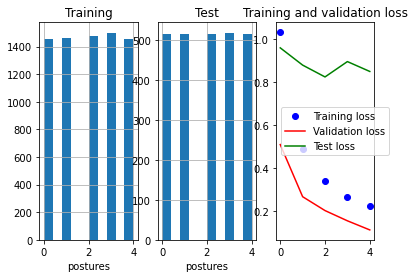

81/81 - 0s - loss: 0.8510 - accuracy: 0.6236

Test accuracy: 0.6235933303833008


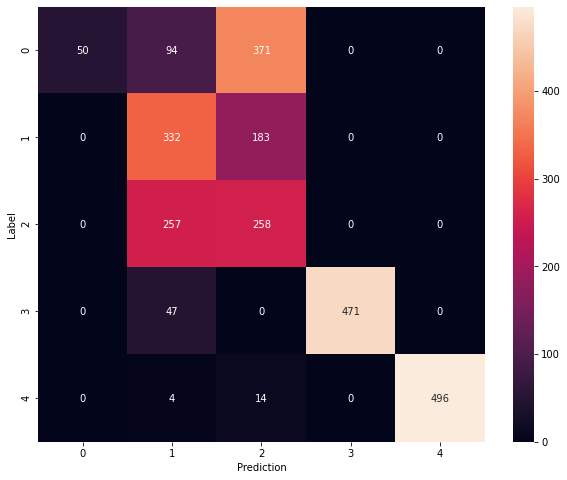

Model: "sequential_324"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_324 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_648 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2280      
_________________________________________________________________
dropout_649 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,410
Trainable params: 3,410
Non-trainable params: 0
__________________________________________________

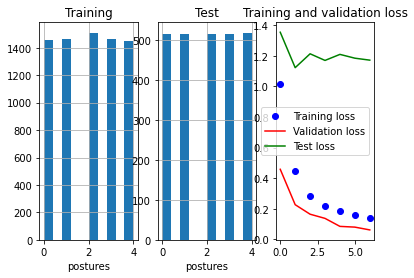

81/81 - 0s - loss: 1.1716 - accuracy: 0.5776

Test accuracy: 0.5775794982910156


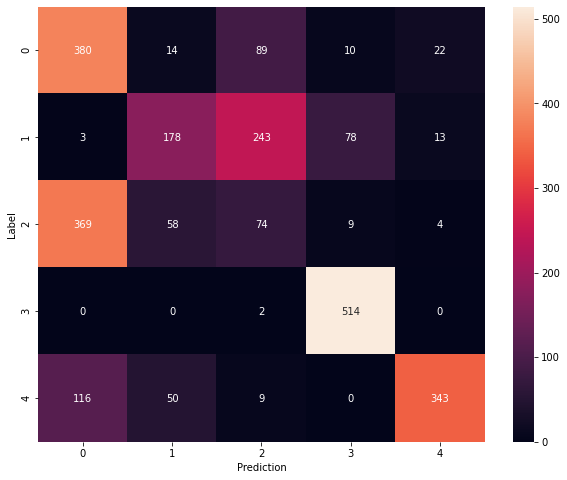

Model: "sequential_325"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_325 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_650 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2280      
_________________________________________________________________
dropout_651 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,410
Trainable params: 3,410
Non-trainable params: 0
__________________________________________________

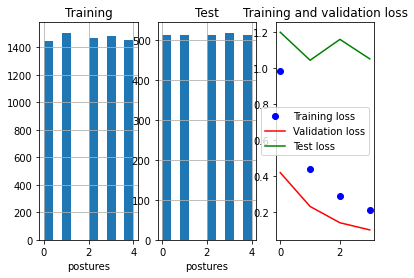

81/81 - 0s - loss: 1.0503 - accuracy: 0.6643

Test accuracy: 0.664332926273346


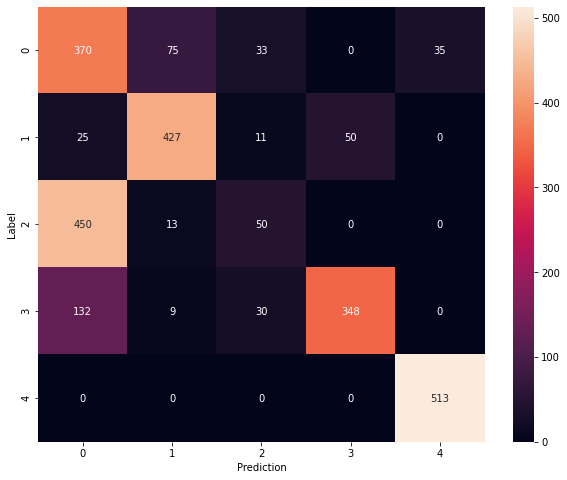

Model: "sequential_326"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_326 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_652 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                2660      
_________________________________________________________________
dropout_653 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 3,815
Trainable params: 3,815
Non-trainable params: 0
__________________________________________________

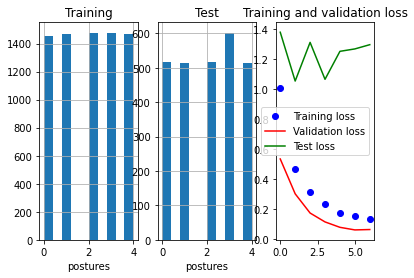

84/84 - 0s - loss: 1.2982 - accuracy: 0.6413

Test accuracy: 0.6412758231163025


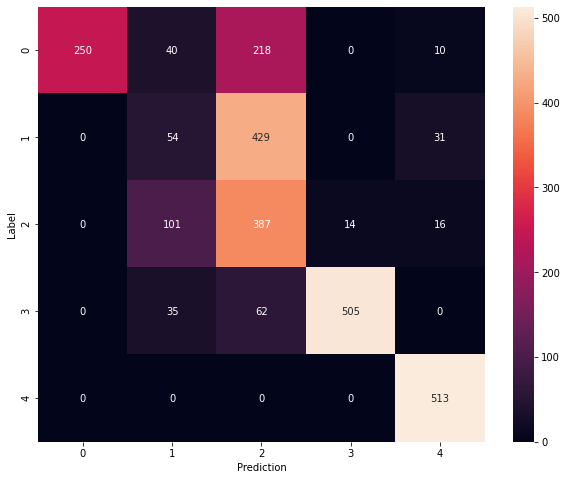

Model: "sequential_327"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_327 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_654 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                2660      
_________________________________________________________________
dropout_655 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 3,815
Trainable params: 3,815
Non-trainable params: 0
__________________________________________________

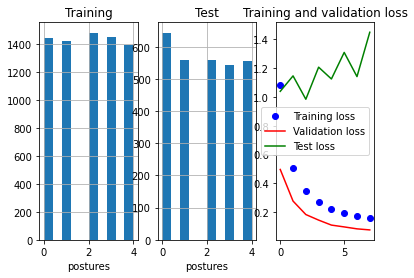

90/90 - 0s - loss: 1.4481 - accuracy: 0.6973

Test accuracy: 0.6973086595535278


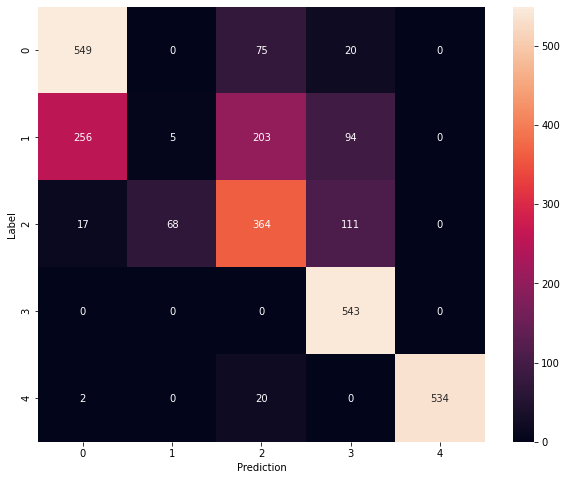

Model: "sequential_328"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_328 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_656 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                2660      
_________________________________________________________________
dropout_657 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 3,815
Trainable params: 3,815
Non-trainable params: 0
__________________________________________________

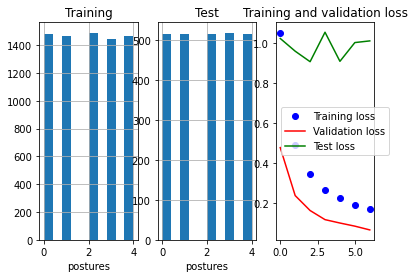

81/81 - 0s - loss: 1.0100 - accuracy: 0.7159

Test accuracy: 0.715948760509491


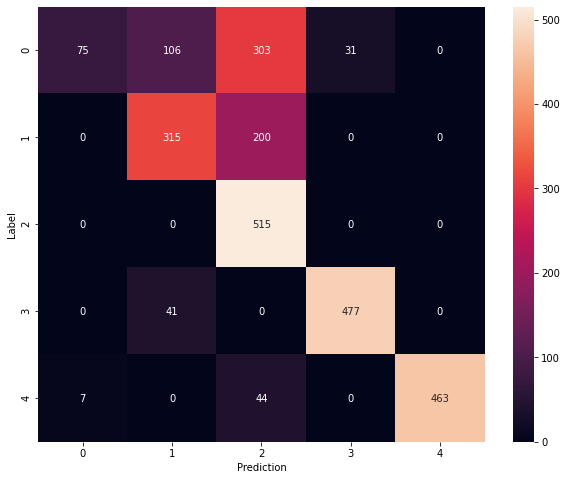

Model: "sequential_329"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_329 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_658 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                2660      
_________________________________________________________________
dropout_659 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 3,815
Trainable params: 3,815
Non-trainable params: 0
__________________________________________________

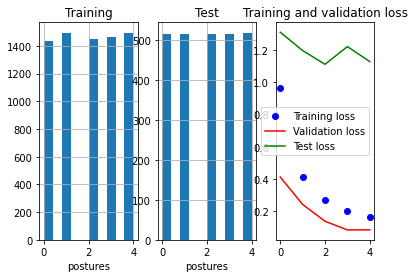

81/81 - 0s - loss: 1.1274 - accuracy: 0.5900

Test accuracy: 0.5899922251701355


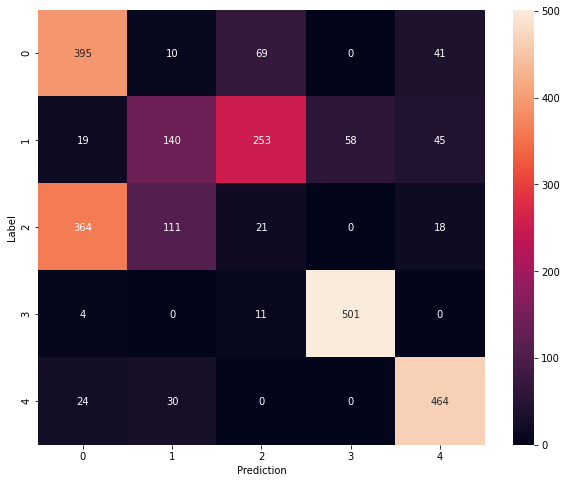

Model: "sequential_330"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_330 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_660 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                2660      
_________________________________________________________________
dropout_661 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 3,815
Trainable params: 3,815
Non-trainable params: 0
__________________________________________________

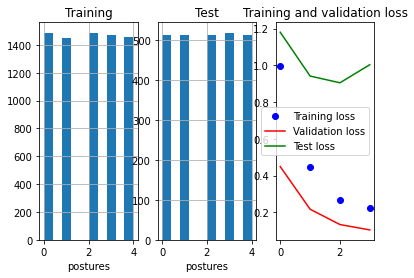

81/81 - 0s - loss: 1.0033 - accuracy: 0.6760

Test accuracy: 0.6760015487670898


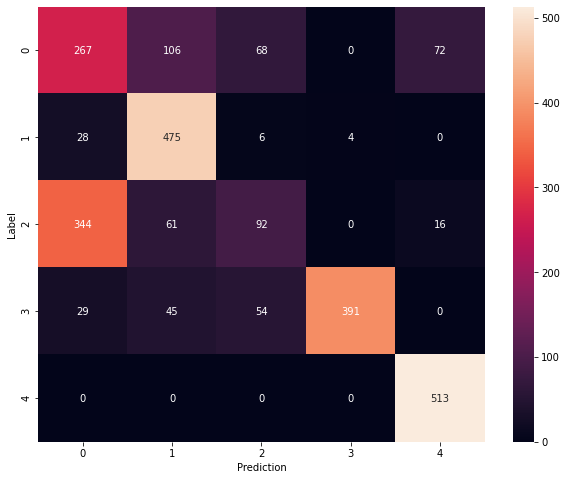

Model: "sequential_331"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_331 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_662 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                2660      
_________________________________________________________________
dropout_663 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 3,815
Trainable params: 3,815
Non-trainable params: 0
__________________________________________________

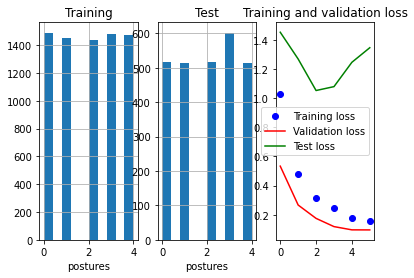

84/84 - 0s - loss: 1.3460 - accuracy: 0.6795

Test accuracy: 0.6795496940612793


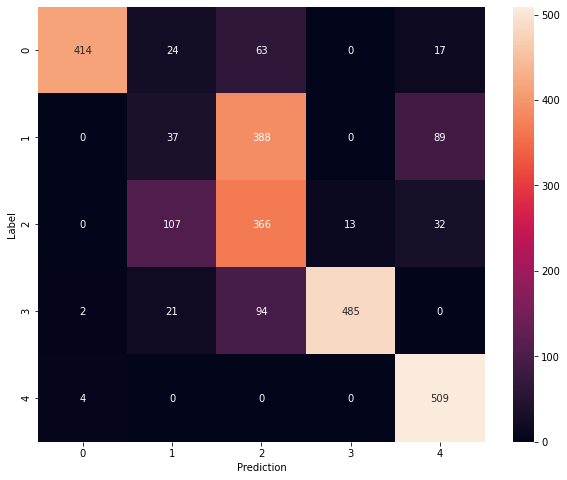

Model: "sequential_332"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_332 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_664 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                2660      
_________________________________________________________________
dropout_665 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 3,815
Trainable params: 3,815
Non-trainable params: 0
__________________________________________________

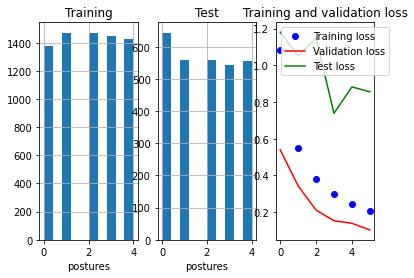

90/90 - 0s - loss: 0.8560 - accuracy: 0.7337

Test accuracy: 0.733659565448761


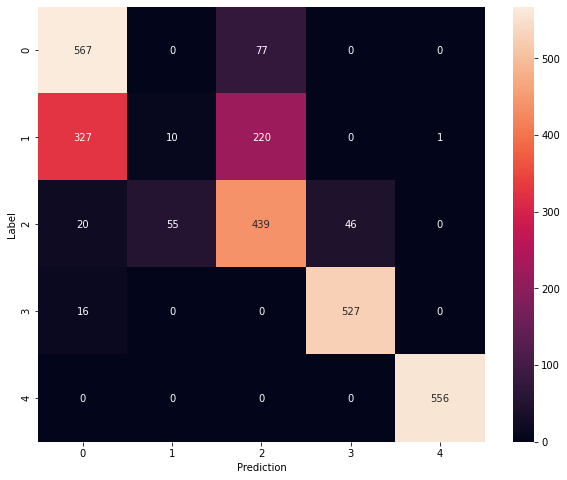

Model: "sequential_333"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_333 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_666 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                2660      
_________________________________________________________________
dropout_667 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 3,815
Trainable params: 3,815
Non-trainable params: 0
__________________________________________________

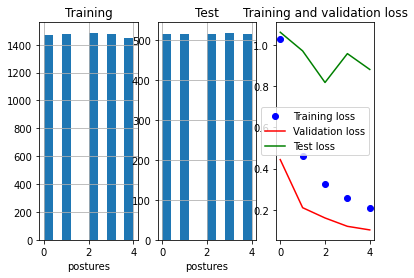

81/81 - 0s - loss: 0.8813 - accuracy: 0.6682

Test accuracy: 0.6682188510894775


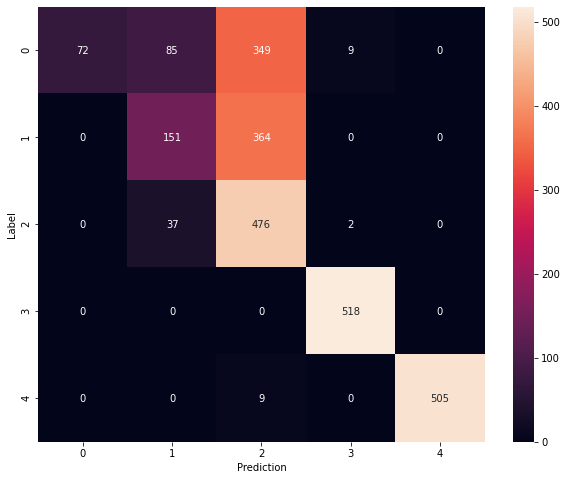

Model: "sequential_334"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_334 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_668 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                2660      
_________________________________________________________________
dropout_669 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 3,815
Trainable params: 3,815
Non-trainable params: 0
__________________________________________________

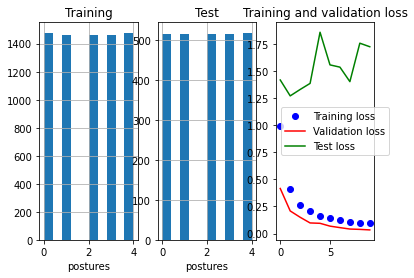

81/81 - 0s - loss: 1.7266 - accuracy: 0.5857

Test accuracy: 0.5857253670692444


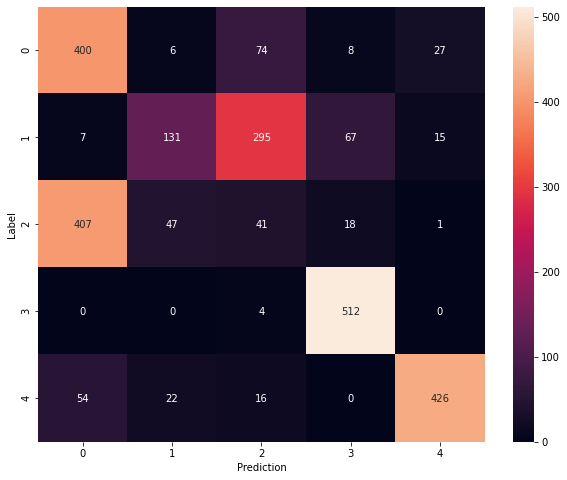

Model: "sequential_335"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_335 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_670 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                2660      
_________________________________________________________________
dropout_671 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 3,815
Trainable params: 3,815
Non-trainable params: 0
__________________________________________________

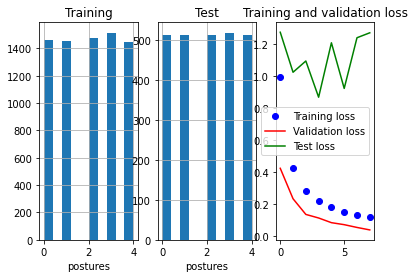

81/81 - 0s - loss: 1.2731 - accuracy: 0.7017

Test accuracy: 0.7016724944114685


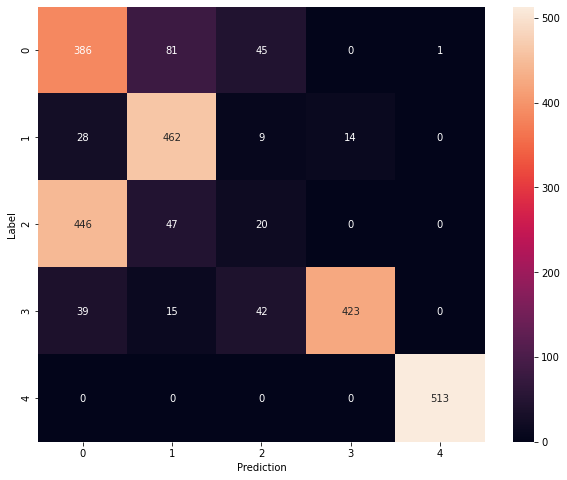

Model: "sequential_336"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_336 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_672 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3040      
_________________________________________________________________
dropout_673 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,220
Trainable params: 4,220
Non-trainable params: 0
__________________________________________________

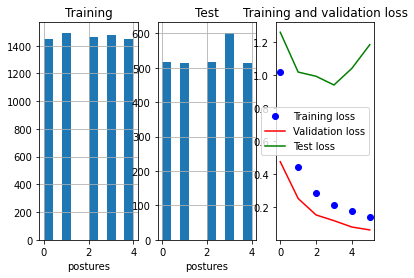

84/84 - 0s - loss: 1.1840 - accuracy: 0.6927

Test accuracy: 0.6926829218864441


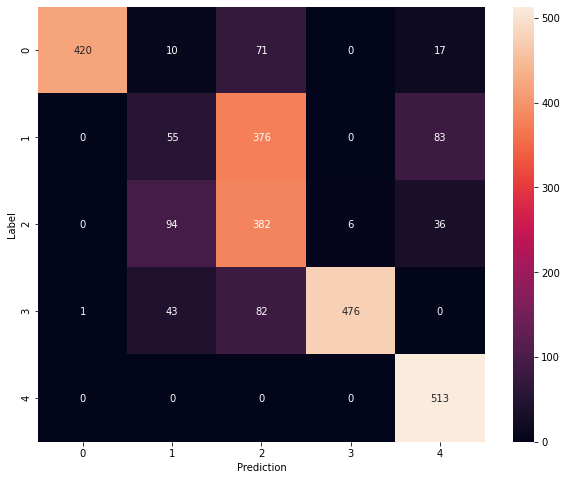

Model: "sequential_337"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_337 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_674 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3040      
_________________________________________________________________
dropout_675 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,220
Trainable params: 4,220
Non-trainable params: 0
__________________________________________________

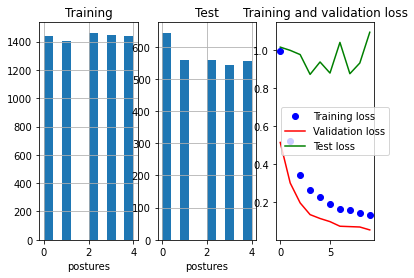

90/90 - 0s - loss: 1.0964 - accuracy: 0.7305

Test accuracy: 0.7305138111114502


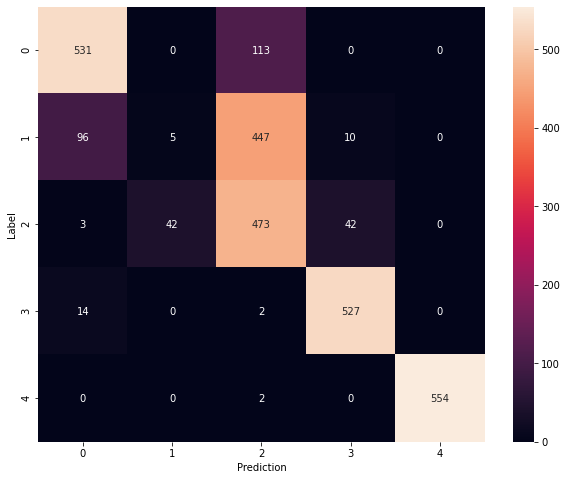

Model: "sequential_338"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_338 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_676 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3040      
_________________________________________________________________
dropout_677 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,220
Trainable params: 4,220
Non-trainable params: 0
__________________________________________________

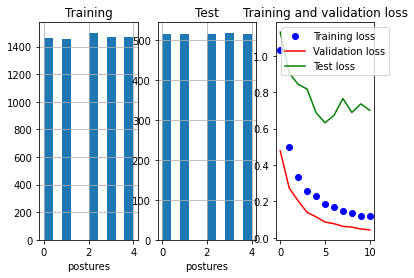

81/81 - 0s - loss: 0.7006 - accuracy: 0.7210

Test accuracy: 0.7209933996200562


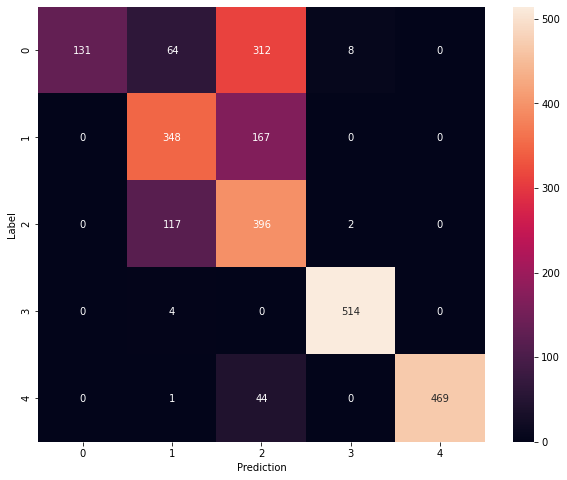

Model: "sequential_339"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_339 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_678 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3040      
_________________________________________________________________
dropout_679 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,220
Trainable params: 4,220
Non-trainable params: 0
__________________________________________________

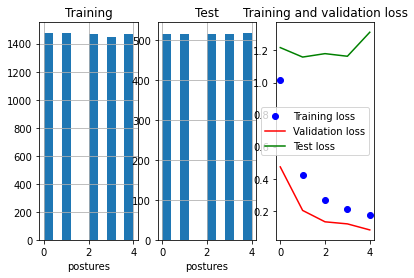

81/81 - 0s - loss: 1.3136 - accuracy: 0.5811

Test accuracy: 0.581070601940155


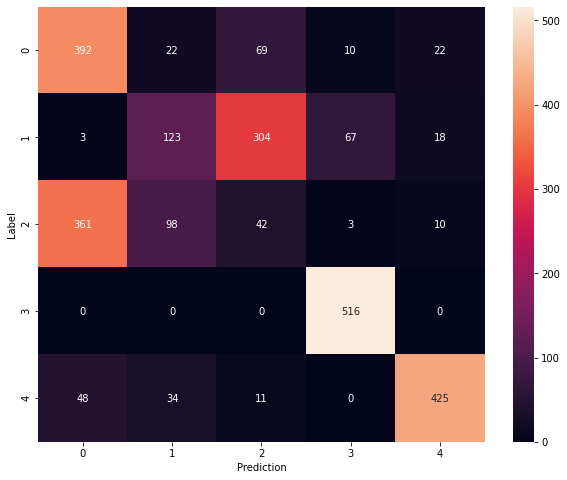

Model: "sequential_340"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_340 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_680 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3040      
_________________________________________________________________
dropout_681 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,220
Trainable params: 4,220
Non-trainable params: 0
__________________________________________________

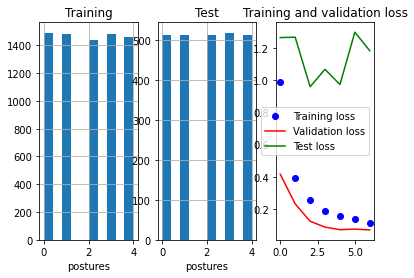

81/81 - 0s - loss: 1.1829 - accuracy: 0.6912

Test accuracy: 0.6911707520484924


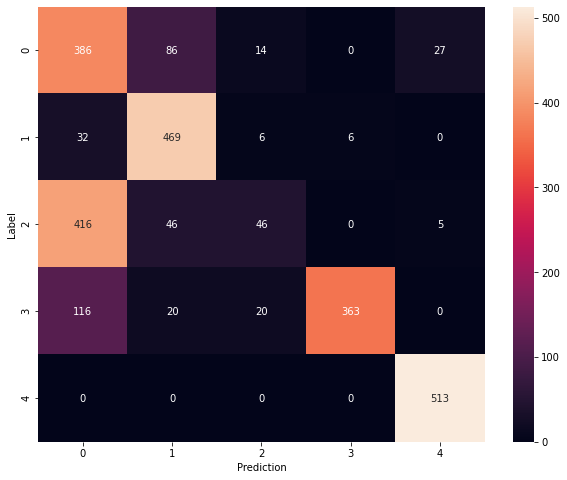

Model: "sequential_341"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_341 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_682 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3040      
_________________________________________________________________
dropout_683 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,220
Trainable params: 4,220
Non-trainable params: 0
__________________________________________________

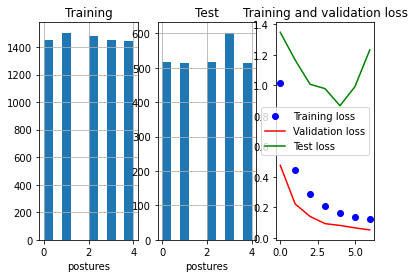

84/84 - 0s - loss: 1.2309 - accuracy: 0.6623

Test accuracy: 0.6622889041900635


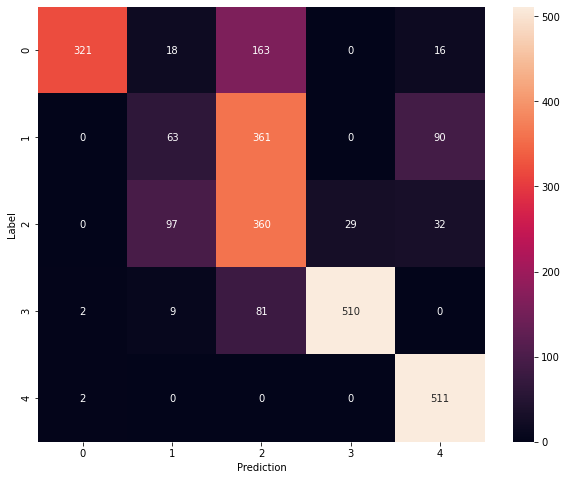

Model: "sequential_342"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_342 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_684 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3040      
_________________________________________________________________
dropout_685 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,220
Trainable params: 4,220
Non-trainable params: 0
__________________________________________________

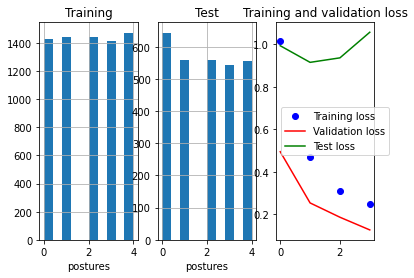

90/90 - 0s - loss: 1.0566 - accuracy: 0.7005

Test accuracy: 0.7004544138908386


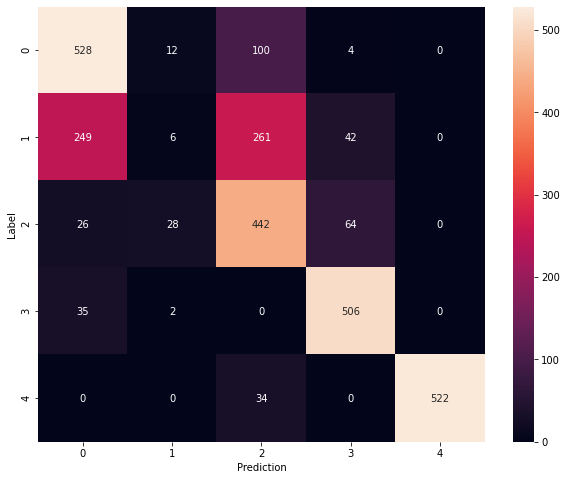

Model: "sequential_343"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_343 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_686 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3040      
_________________________________________________________________
dropout_687 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,220
Trainable params: 4,220
Non-trainable params: 0
__________________________________________________

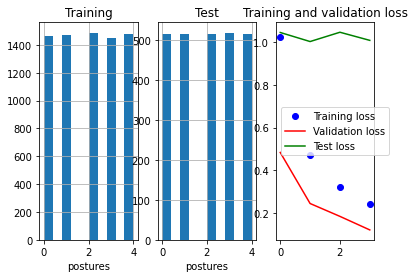

81/81 - 0s - loss: 1.0071 - accuracy: 0.6845

Test accuracy: 0.6845169067382812


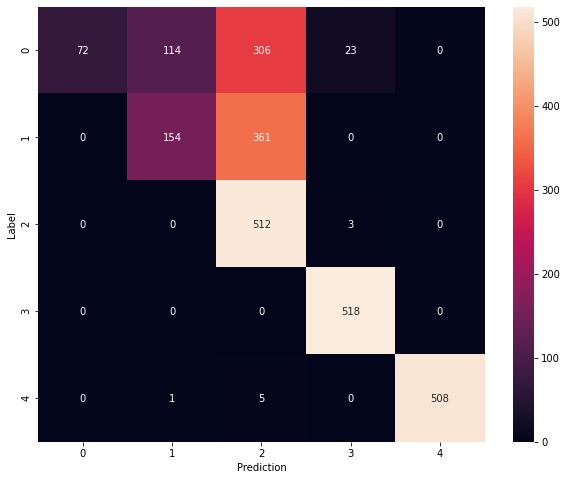

Model: "sequential_344"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_344 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_688 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3040      
_________________________________________________________________
dropout_689 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,220
Trainable params: 4,220
Non-trainable params: 0
__________________________________________________

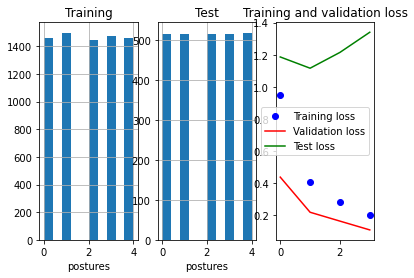

81/81 - 0s - loss: 1.3403 - accuracy: 0.5617

Test accuracy: 0.5616757273674011


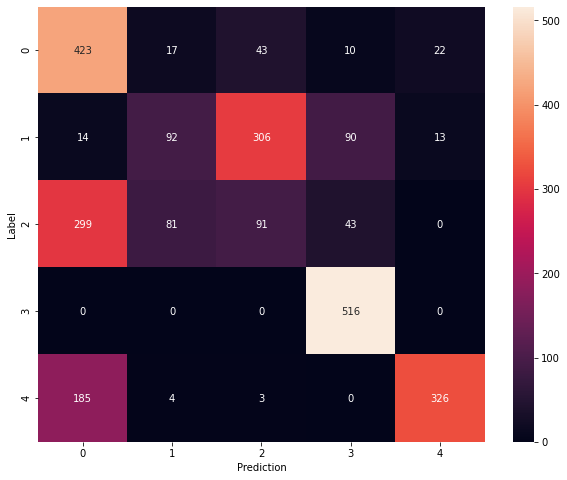

Model: "sequential_345"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_345 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 75)                975       
_________________________________________________________________
dropout_690 (Dropout)        (None, 75)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3040      
_________________________________________________________________
dropout_691 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,220
Trainable params: 4,220
Non-trainable params: 0
__________________________________________________

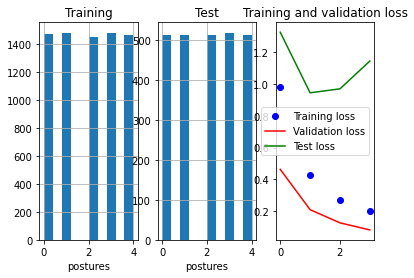

81/81 - 0s - loss: 1.1455 - accuracy: 0.6706

Test accuracy: 0.6705561876296997


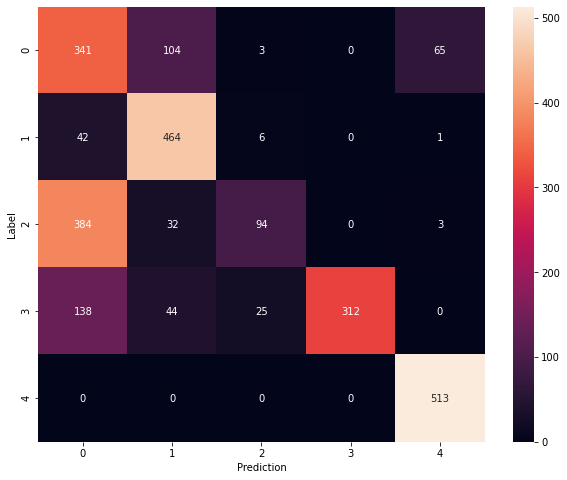

Model: "sequential_346"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_346 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_692 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2430      
_________________________________________________________________
dropout_693 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,625
Trainable params: 3,625
Non-trainable params: 0
__________________________________________________

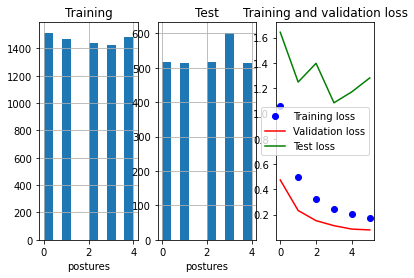

84/84 - 0s - loss: 1.2808 - accuracy: 0.6713

Test accuracy: 0.6712945699691772


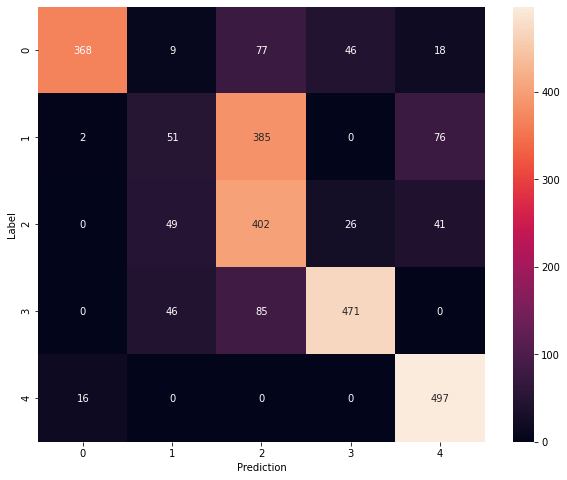

Model: "sequential_347"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_347 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_694 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2430      
_________________________________________________________________
dropout_695 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,625
Trainable params: 3,625
Non-trainable params: 0
__________________________________________________

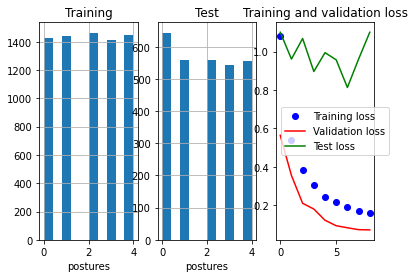

90/90 - 0s - loss: 1.1002 - accuracy: 0.6872

Test accuracy: 0.6871722936630249


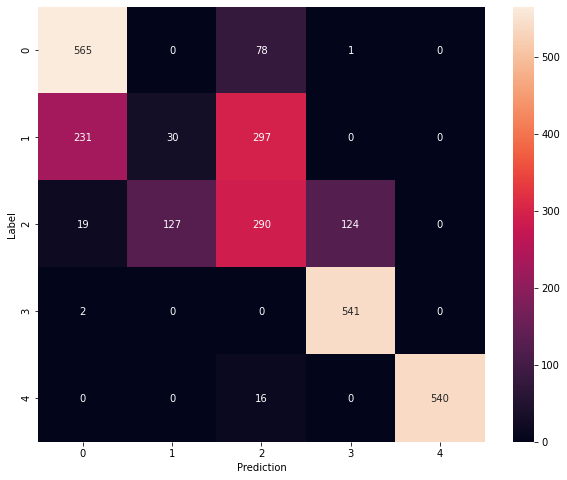

Model: "sequential_348"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_348 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_696 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2430      
_________________________________________________________________
dropout_697 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,625
Trainable params: 3,625
Non-trainable params: 0
__________________________________________________

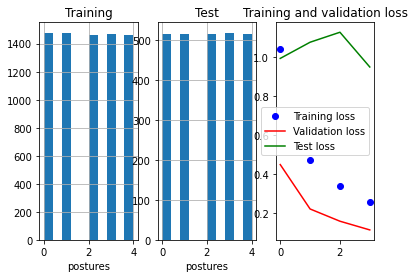

81/81 - 0s - loss: 0.9493 - accuracy: 0.6612

Test accuracy: 0.6612340211868286


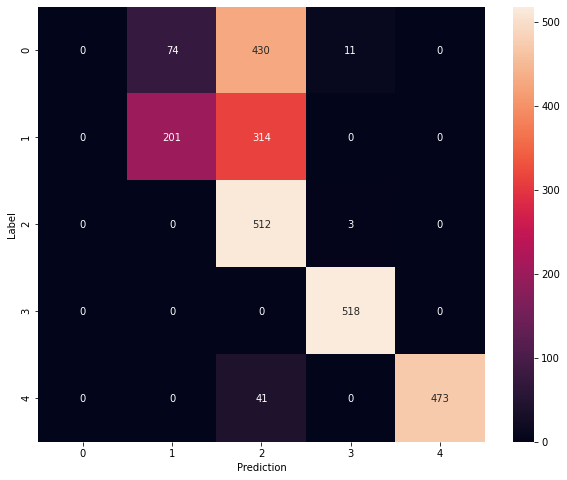

Model: "sequential_349"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_349 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_698 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2430      
_________________________________________________________________
dropout_699 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,625
Trainable params: 3,625
Non-trainable params: 0
__________________________________________________

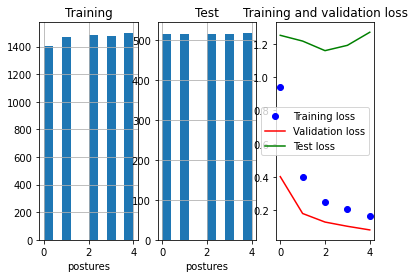

81/81 - 0s - loss: 1.2695 - accuracy: 0.5481

Test accuracy: 0.5480992794036865


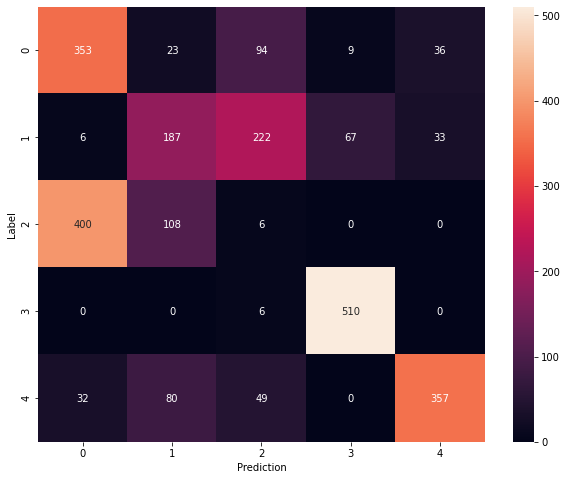

Model: "sequential_350"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_350 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_700 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2430      
_________________________________________________________________
dropout_701 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,625
Trainable params: 3,625
Non-trainable params: 0
__________________________________________________

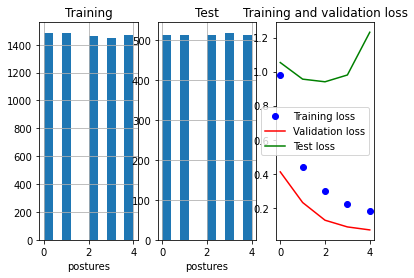

81/81 - 0s - loss: 1.2309 - accuracy: 0.6437

Test accuracy: 0.643718421459198


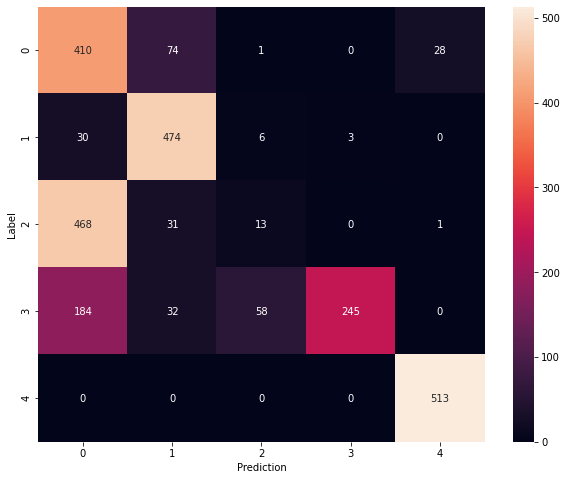

Model: "sequential_351"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_351 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_702 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2430      
_________________________________________________________________
dropout_703 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,625
Trainable params: 3,625
Non-trainable params: 0
__________________________________________________

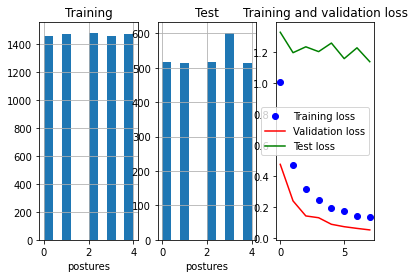

84/84 - 0s - loss: 1.1391 - accuracy: 0.6889

Test accuracy: 0.6889305710792542


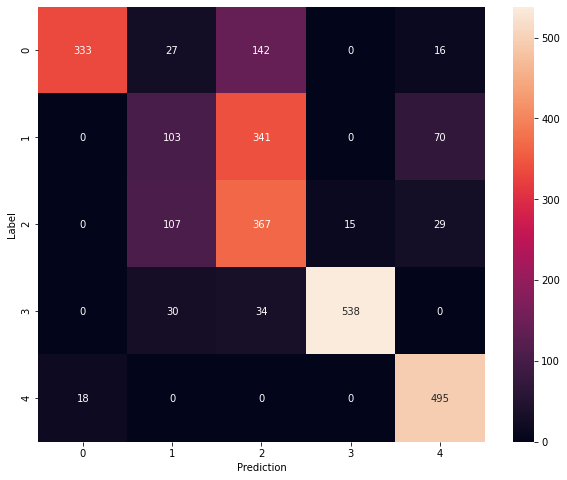

Model: "sequential_352"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_352 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_704 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2430      
_________________________________________________________________
dropout_705 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,625
Trainable params: 3,625
Non-trainable params: 0
__________________________________________________

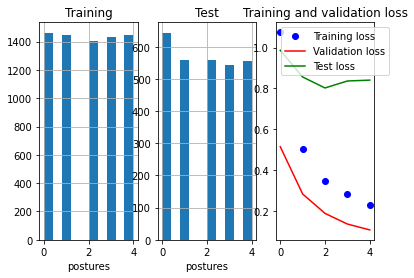

90/90 - 0s - loss: 0.8408 - accuracy: 0.7060

Test accuracy: 0.7060468196868896


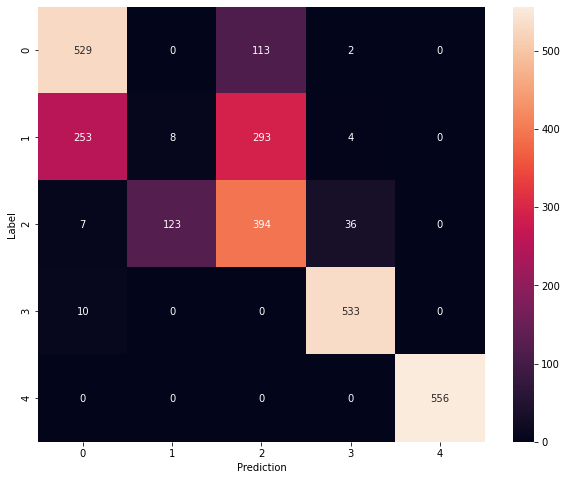

Model: "sequential_353"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_353 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_706 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2430      
_________________________________________________________________
dropout_707 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,625
Trainable params: 3,625
Non-trainable params: 0
__________________________________________________

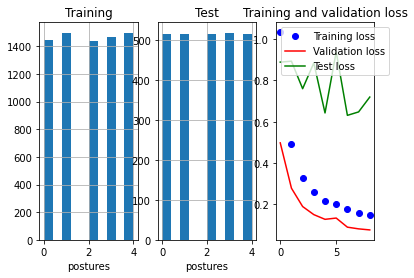

81/81 - 0s - loss: 0.7192 - accuracy: 0.7769

Test accuracy: 0.7768723368644714


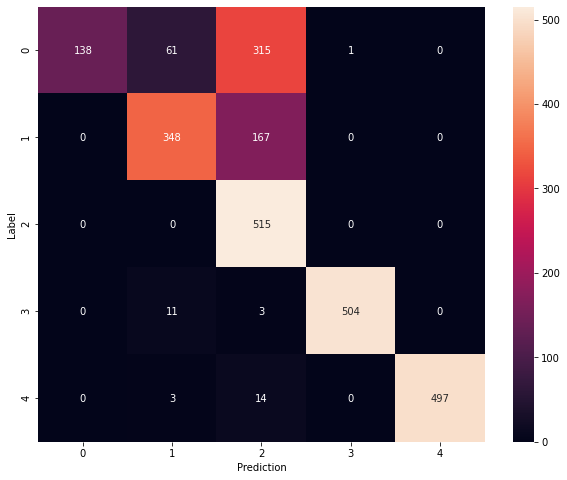

Model: "sequential_354"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_354 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_708 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2430      
_________________________________________________________________
dropout_709 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,625
Trainable params: 3,625
Non-trainable params: 0
__________________________________________________

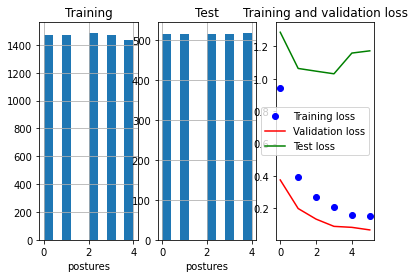

81/81 - 0s - loss: 1.1725 - accuracy: 0.6051

Test accuracy: 0.6051202416419983


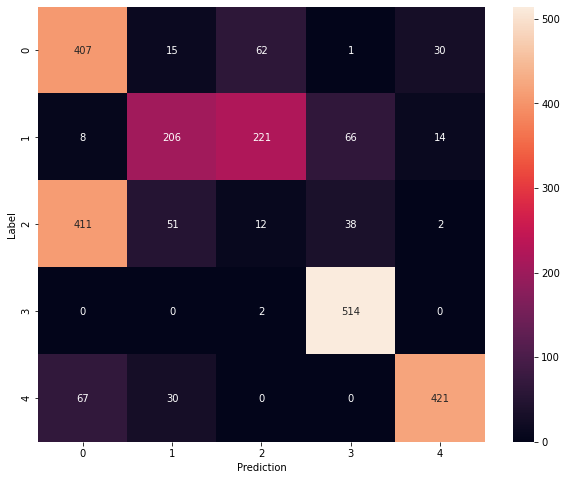

Model: "sequential_355"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_355 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_710 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2430      
_________________________________________________________________
dropout_711 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,625
Trainable params: 3,625
Non-trainable params: 0
__________________________________________________

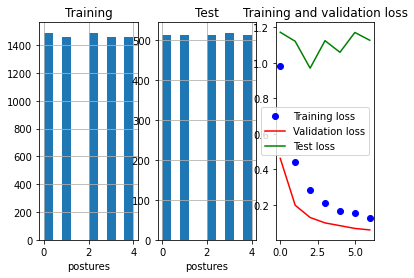

81/81 - 0s - loss: 1.1275 - accuracy: 0.7538

Test accuracy: 0.7537922859191895


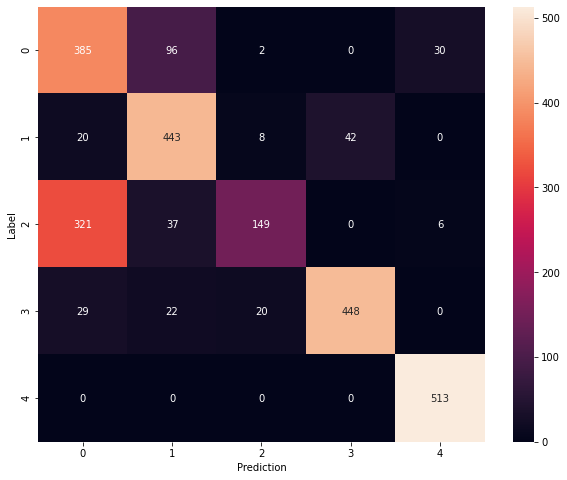

Model: "sequential_356"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_356 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_712 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                2835      
_________________________________________________________________
dropout_713 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,055
Trainable params: 4,055
Non-trainable params: 0
__________________________________________________

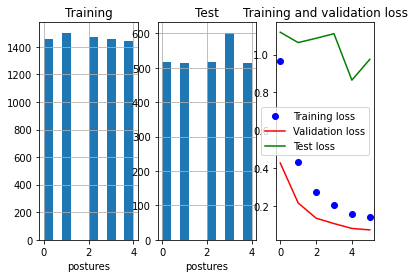

84/84 - 0s - loss: 0.9746 - accuracy: 0.7118

Test accuracy: 0.7118198871612549


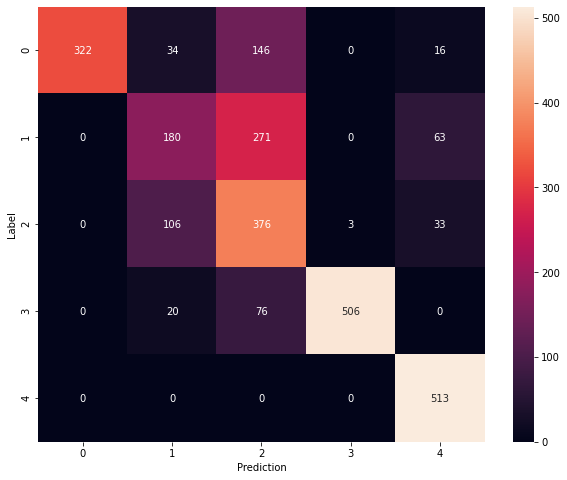

Model: "sequential_357"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_357 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_714 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                2835      
_________________________________________________________________
dropout_715 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,055
Trainable params: 4,055
Non-trainable params: 0
__________________________________________________

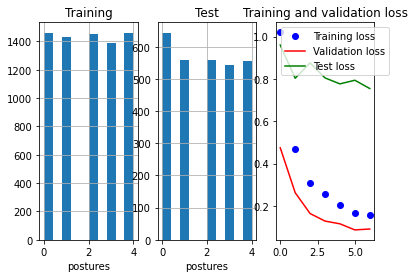

90/90 - 0s - loss: 0.7548 - accuracy: 0.7130

Test accuracy: 0.713037371635437


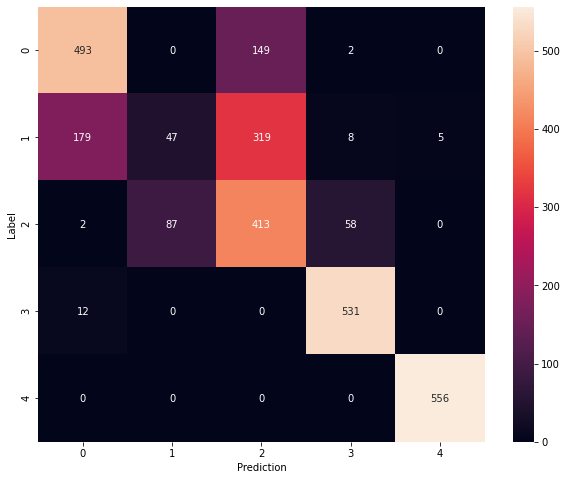

Model: "sequential_358"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_358 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_716 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                2835      
_________________________________________________________________
dropout_717 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,055
Trainable params: 4,055
Non-trainable params: 0
__________________________________________________

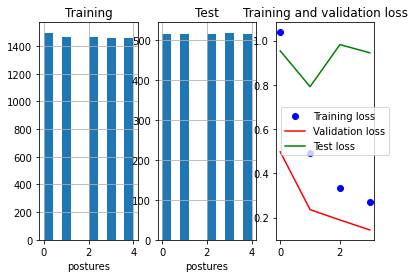

81/81 - 0s - loss: 0.9450 - accuracy: 0.6934

Test accuracy: 0.6934419870376587


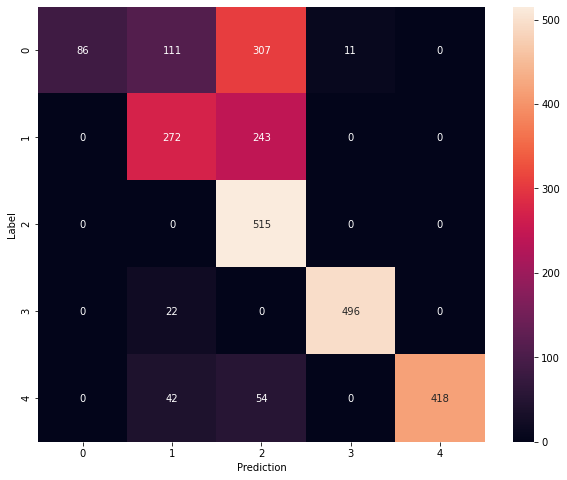

Model: "sequential_359"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_359 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_718 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                2835      
_________________________________________________________________
dropout_719 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,055
Trainable params: 4,055
Non-trainable params: 0
__________________________________________________

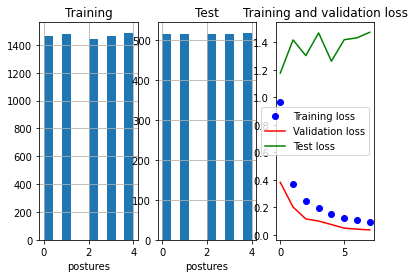

81/81 - 0s - loss: 1.4727 - accuracy: 0.5884

Test accuracy: 0.5884406566619873


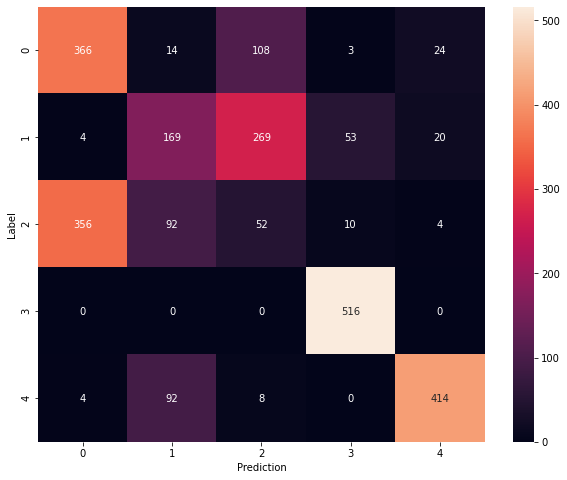

Model: "sequential_360"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_360 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_720 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                2835      
_________________________________________________________________
dropout_721 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,055
Trainable params: 4,055
Non-trainable params: 0
__________________________________________________

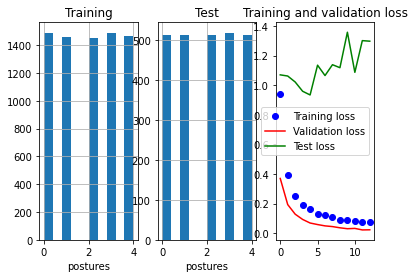

81/81 - 0s - loss: 1.2971 - accuracy: 0.7402

Test accuracy: 0.7401789426803589


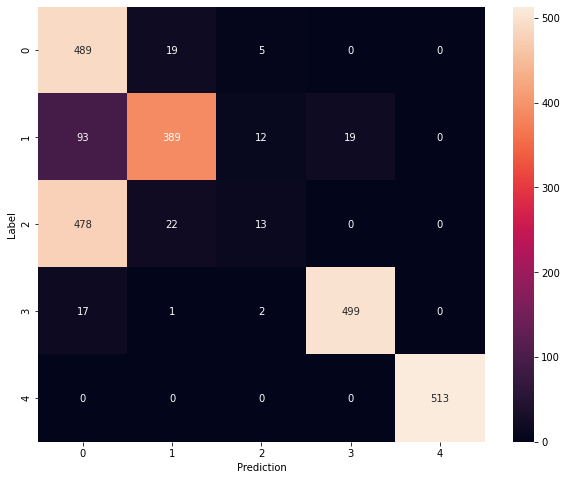

Model: "sequential_361"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_361 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_722 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                2835      
_________________________________________________________________
dropout_723 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,055
Trainable params: 4,055
Non-trainable params: 0
__________________________________________________

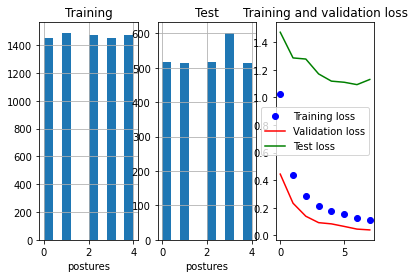

84/84 - 0s - loss: 1.1300 - accuracy: 0.6615

Test accuracy: 0.6615384817123413


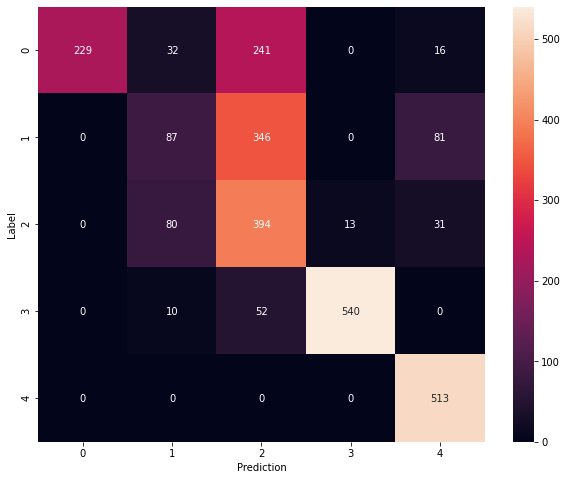

Model: "sequential_362"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_362 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_724 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                2835      
_________________________________________________________________
dropout_725 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,055
Trainable params: 4,055
Non-trainable params: 0
__________________________________________________

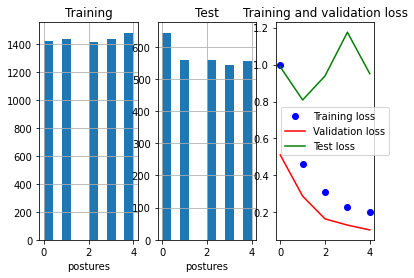

90/90 - 0s - loss: 0.9507 - accuracy: 0.6959

Test accuracy: 0.6959105134010315


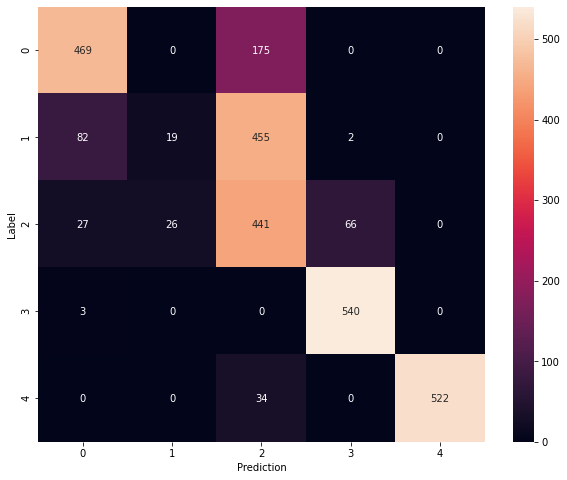

Model: "sequential_363"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_363 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_726 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                2835      
_________________________________________________________________
dropout_727 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,055
Trainable params: 4,055
Non-trainable params: 0
__________________________________________________

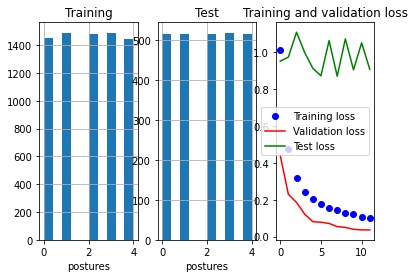

81/81 - 0s - loss: 0.9073 - accuracy: 0.7148

Test accuracy: 0.7147846221923828


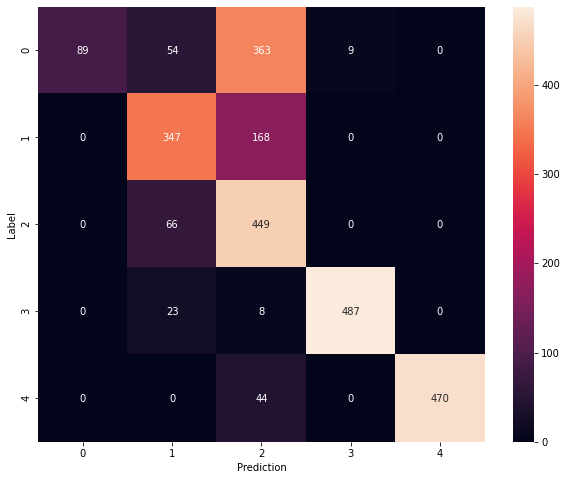

Model: "sequential_364"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_364 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_728 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                2835      
_________________________________________________________________
dropout_729 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,055
Trainable params: 4,055
Non-trainable params: 0
__________________________________________________

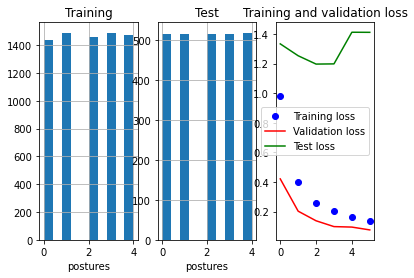

81/81 - 0s - loss: 1.4116 - accuracy: 0.5989

Test accuracy: 0.5989139080047607


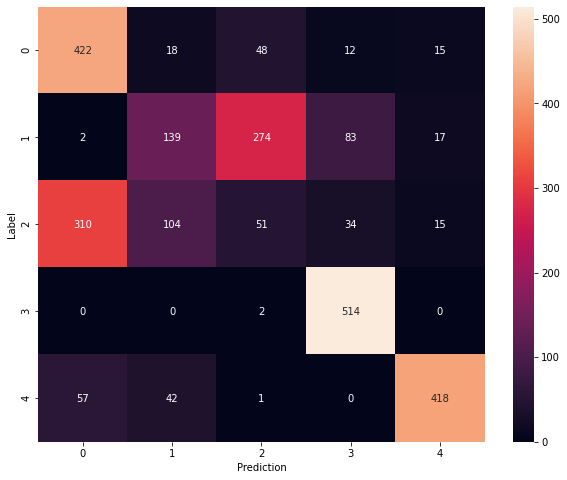

Model: "sequential_365"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_365 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_730 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                2835      
_________________________________________________________________
dropout_731 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,055
Trainable params: 4,055
Non-trainable params: 0
__________________________________________________

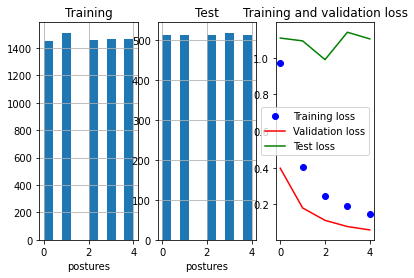

81/81 - 0s - loss: 1.1027 - accuracy: 0.6581

Test accuracy: 0.6581096649169922


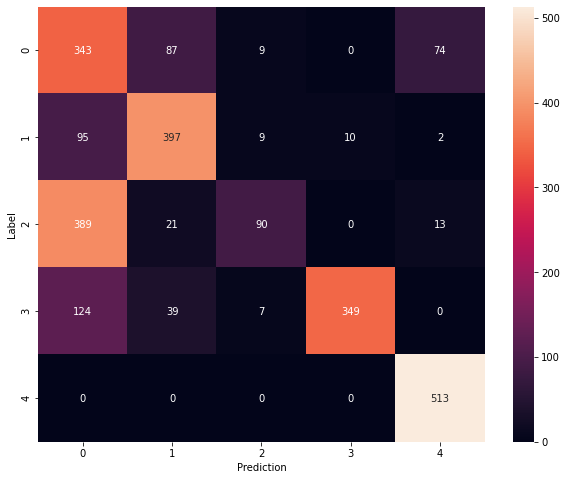

Model: "sequential_366"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_366 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_732 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3240      
_________________________________________________________________
dropout_733 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,485
Trainable params: 4,485
Non-trainable params: 0
__________________________________________________

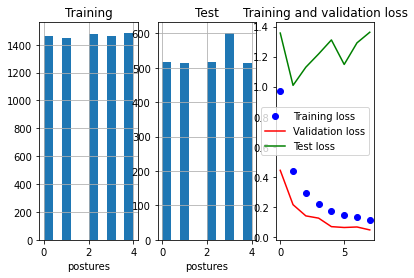

84/84 - 0s - loss: 1.3620 - accuracy: 0.6994

Test accuracy: 0.699437141418457


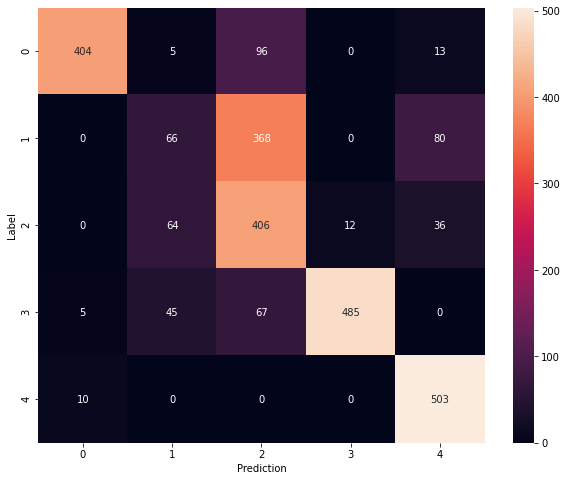

Model: "sequential_367"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_367 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_734 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3240      
_________________________________________________________________
dropout_735 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,485
Trainable params: 4,485
Non-trainable params: 0
__________________________________________________

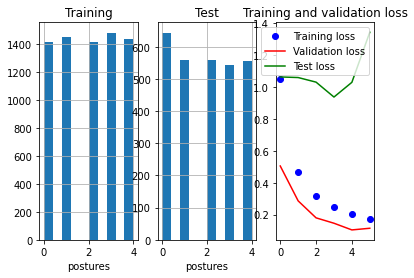

90/90 - 0s - loss: 1.3424 - accuracy: 0.7085

Test accuracy: 0.7084935307502747


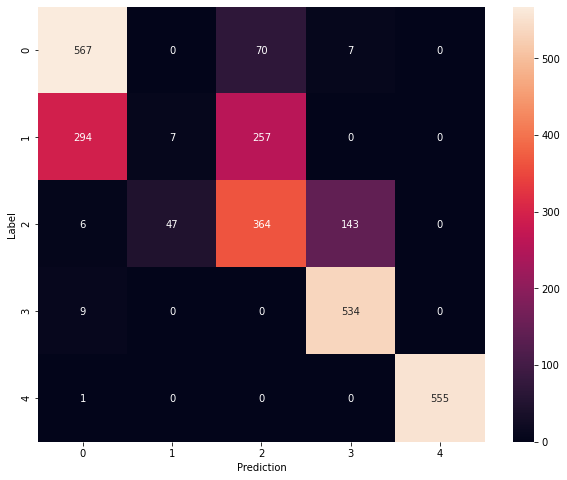

Model: "sequential_368"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_368 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_736 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3240      
_________________________________________________________________
dropout_737 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,485
Trainable params: 4,485
Non-trainable params: 0
__________________________________________________

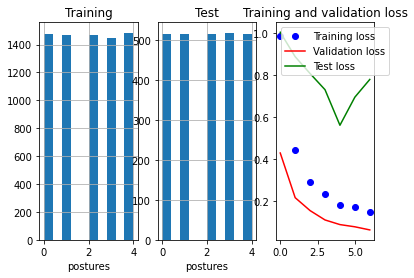

81/81 - 0s - loss: 0.7790 - accuracy: 0.6197

Test accuracy: 0.6197128295898438


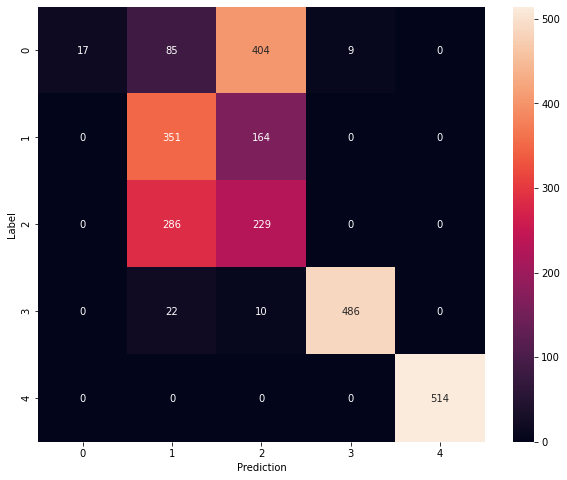

Model: "sequential_369"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_369 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_738 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3240      
_________________________________________________________________
dropout_739 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,485
Trainable params: 4,485
Non-trainable params: 0
__________________________________________________

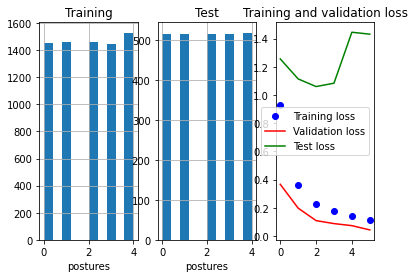

81/81 - 0s - loss: 1.4308 - accuracy: 0.6063

Test accuracy: 0.606283962726593


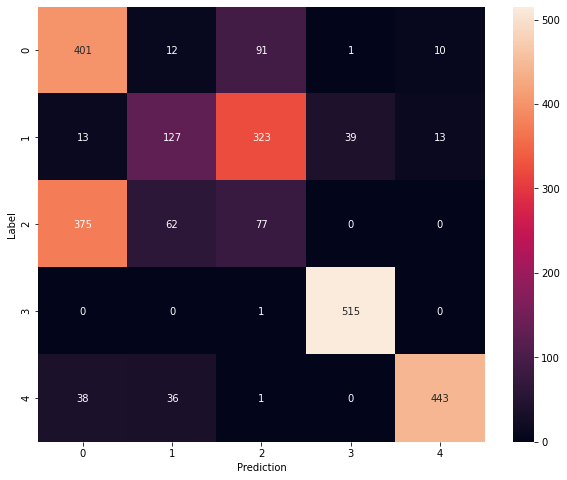

Model: "sequential_370"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_370 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_740 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3240      
_________________________________________________________________
dropout_741 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,485
Trainable params: 4,485
Non-trainable params: 0
__________________________________________________

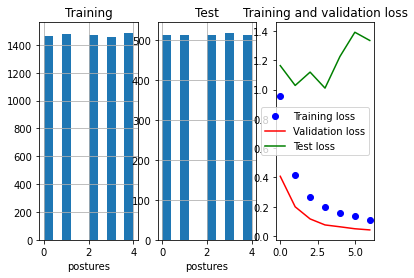

81/81 - 0s - loss: 1.3354 - accuracy: 0.6834

Test accuracy: 0.6833916902542114


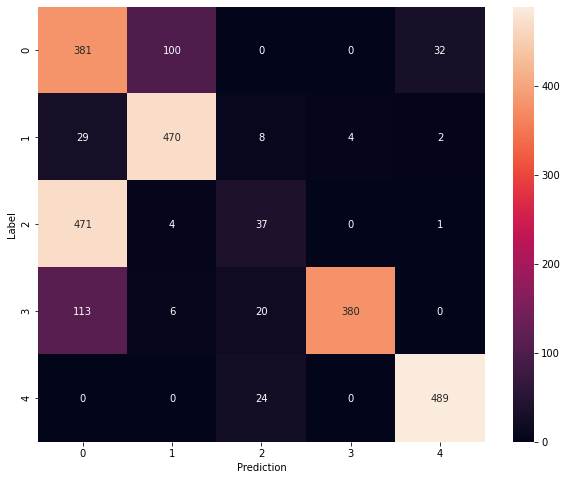

Model: "sequential_371"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_371 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_742 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3240      
_________________________________________________________________
dropout_743 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,485
Trainable params: 4,485
Non-trainable params: 0
__________________________________________________

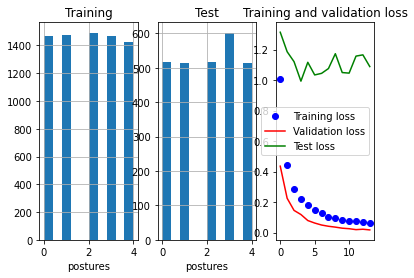

84/84 - 0s - loss: 1.0889 - accuracy: 0.7396

Test accuracy: 0.7395872473716736


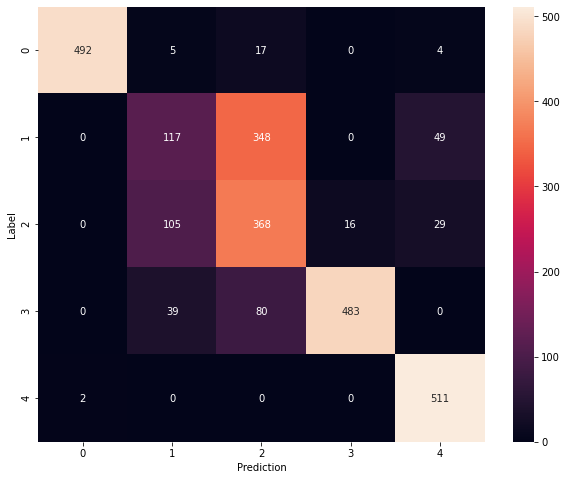

Model: "sequential_372"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_372 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_744 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3240      
_________________________________________________________________
dropout_745 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,485
Trainable params: 4,485
Non-trainable params: 0
__________________________________________________

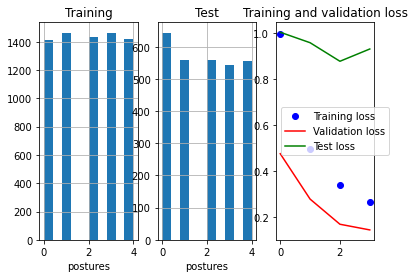

90/90 - 0s - loss: 0.9308 - accuracy: 0.6700

Test accuracy: 0.6700454354286194


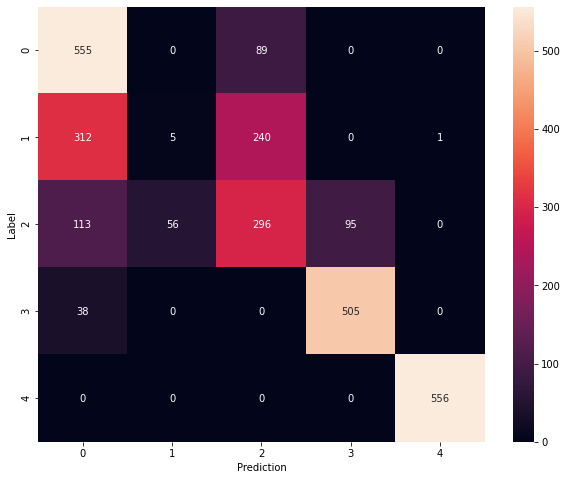

Model: "sequential_373"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_373 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_746 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3240      
_________________________________________________________________
dropout_747 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,485
Trainable params: 4,485
Non-trainable params: 0
__________________________________________________

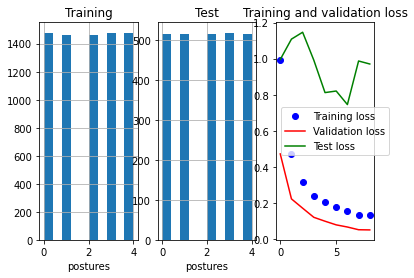

81/81 - 0s - loss: 0.9701 - accuracy: 0.7260

Test accuracy: 0.7260380387306213


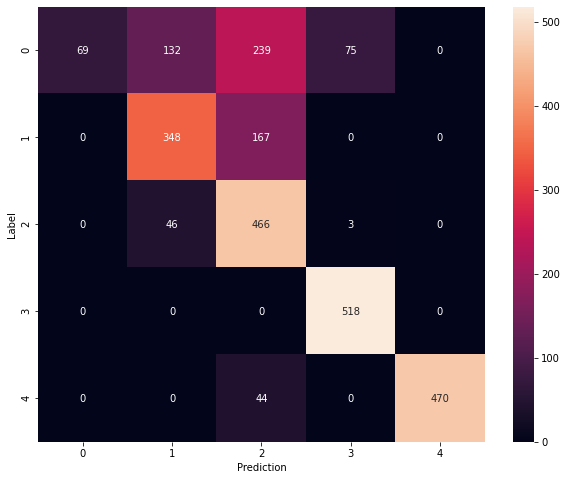

Model: "sequential_374"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_374 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_748 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3240      
_________________________________________________________________
dropout_749 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,485
Trainable params: 4,485
Non-trainable params: 0
__________________________________________________

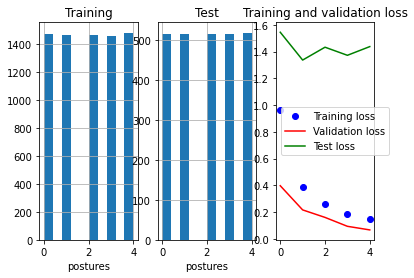

81/81 - 0s - loss: 1.4378 - accuracy: 0.5756

Test accuracy: 0.5756400227546692


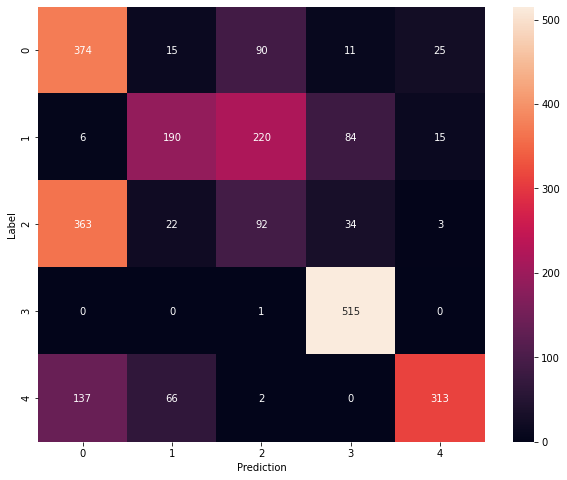

Model: "sequential_375"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_375 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 80)                1040      
_________________________________________________________________
dropout_750 (Dropout)        (None, 80)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3240      
_________________________________________________________________
dropout_751 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,485
Trainable params: 4,485
Non-trainable params: 0
__________________________________________________

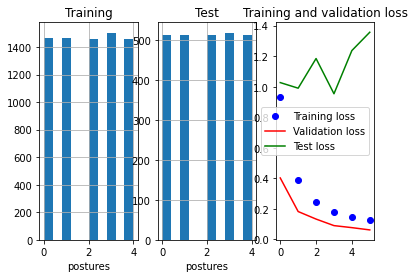

81/81 - 0s - loss: 1.3562 - accuracy: 0.6725

Test accuracy: 0.6725009679794312


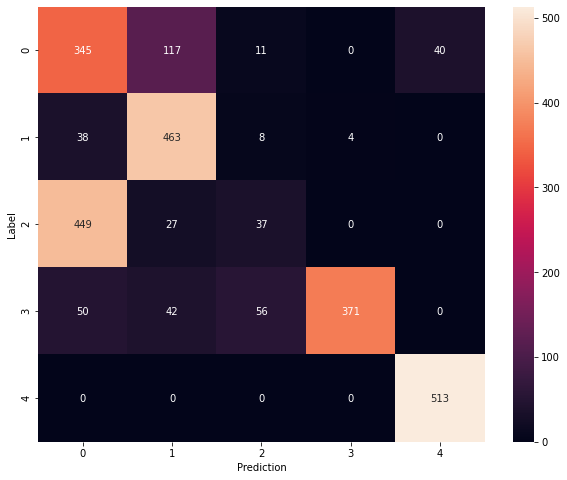

Model: "sequential_376"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_376 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_752 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2580      
_________________________________________________________________
dropout_753 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,840
Trainable params: 3,840
Non-trainable params: 0
__________________________________________________

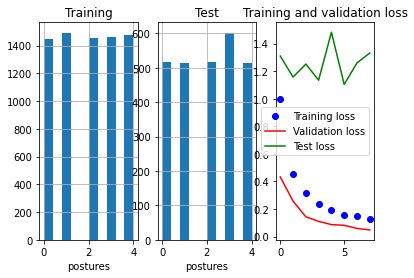

84/84 - 0s - loss: 1.3316 - accuracy: 0.6623

Test accuracy: 0.6622889041900635


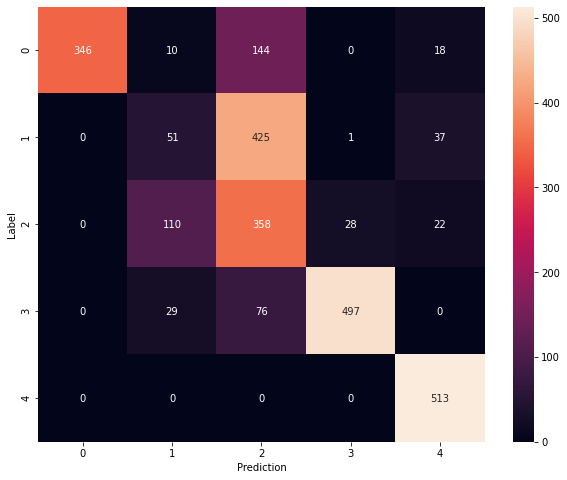

Model: "sequential_377"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_377 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_754 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2580      
_________________________________________________________________
dropout_755 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,840
Trainable params: 3,840
Non-trainable params: 0
__________________________________________________

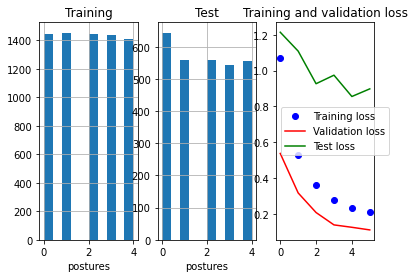

90/90 - 0s - loss: 0.8978 - accuracy: 0.7193

Test accuracy: 0.7193288803100586


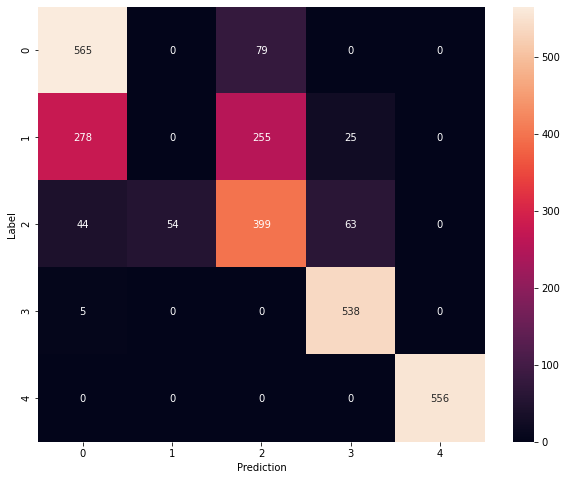

Model: "sequential_378"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_378 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_756 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2580      
_________________________________________________________________
dropout_757 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,840
Trainable params: 3,840
Non-trainable params: 0
__________________________________________________

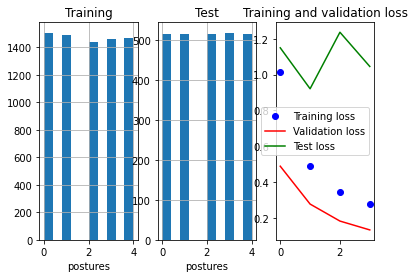

81/81 - 0s - loss: 1.0456 - accuracy: 0.6802

Test accuracy: 0.6802483797073364


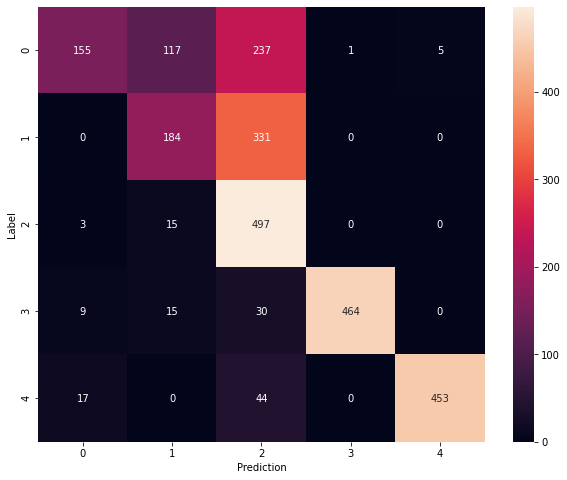

Model: "sequential_379"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_379 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_758 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2580      
_________________________________________________________________
dropout_759 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,840
Trainable params: 3,840
Non-trainable params: 0
__________________________________________________

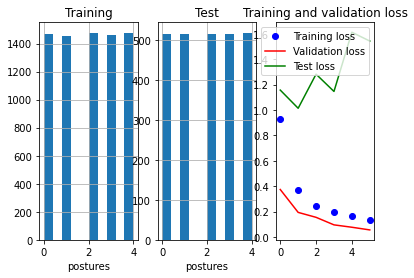

81/81 - 0s - loss: 1.5422 - accuracy: 0.5912

Test accuracy: 0.5911559462547302


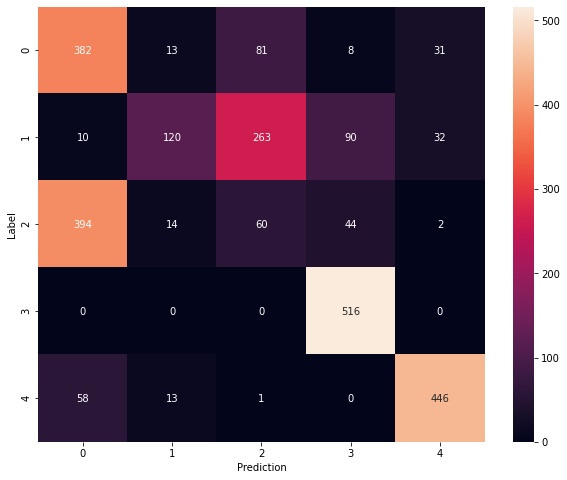

Model: "sequential_380"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_380 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_760 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2580      
_________________________________________________________________
dropout_761 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,840
Trainable params: 3,840
Non-trainable params: 0
__________________________________________________

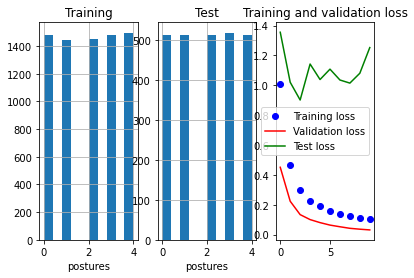

81/81 - 0s - loss: 1.2530 - accuracy: 0.7118

Test accuracy: 0.7117853164672852


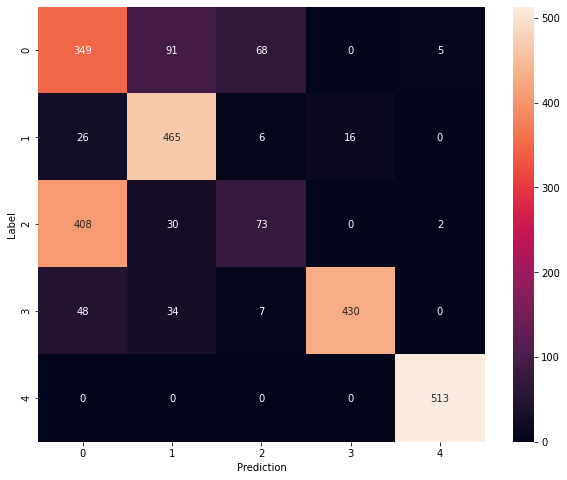

Model: "sequential_381"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_381 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_762 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2580      
_________________________________________________________________
dropout_763 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,840
Trainable params: 3,840
Non-trainable params: 0
__________________________________________________

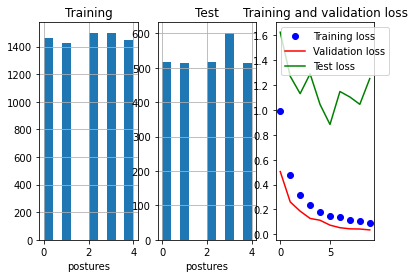

84/84 - 0s - loss: 1.2530 - accuracy: 0.6912

Test accuracy: 0.691182017326355


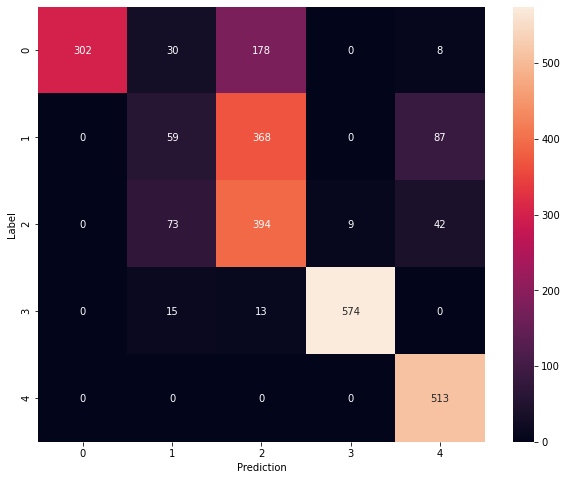

Model: "sequential_382"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_382 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_764 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2580      
_________________________________________________________________
dropout_765 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,840
Trainable params: 3,840
Non-trainable params: 0
__________________________________________________

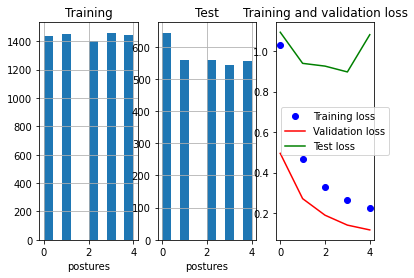

90/90 - 0s - loss: 1.0810 - accuracy: 0.7186

Test accuracy: 0.7186298370361328


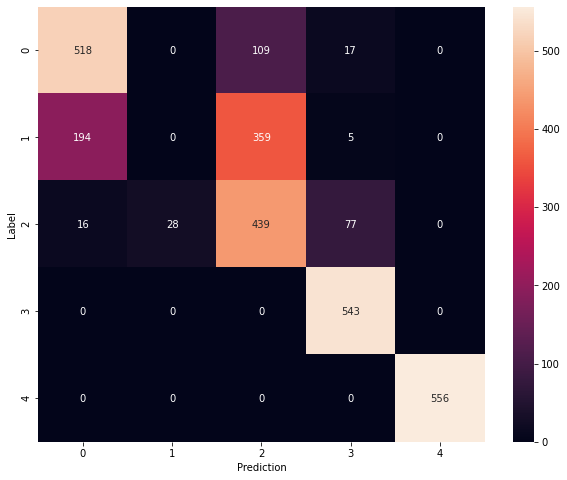

Model: "sequential_383"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_383 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_766 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2580      
_________________________________________________________________
dropout_767 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,840
Trainable params: 3,840
Non-trainable params: 0
__________________________________________________

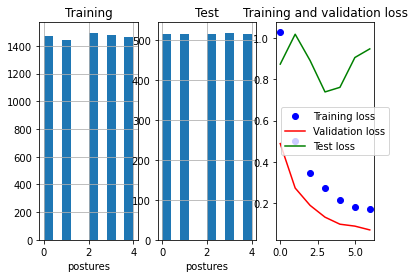

81/81 - 0s - loss: 0.9484 - accuracy: 0.7668

Test accuracy: 0.7667830586433411


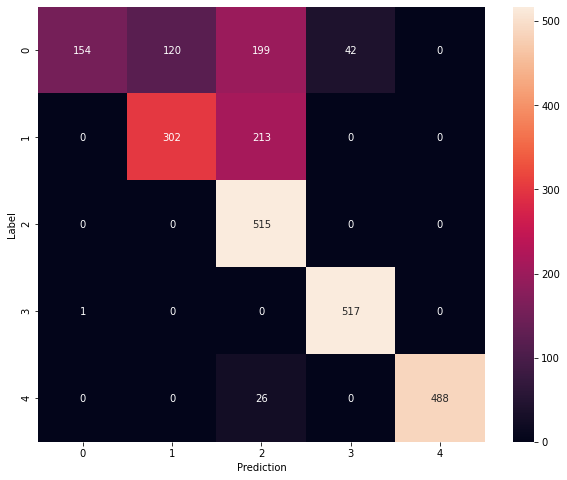

Model: "sequential_384"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_384 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_768 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2580      
_________________________________________________________________
dropout_769 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,840
Trainable params: 3,840
Non-trainable params: 0
__________________________________________________

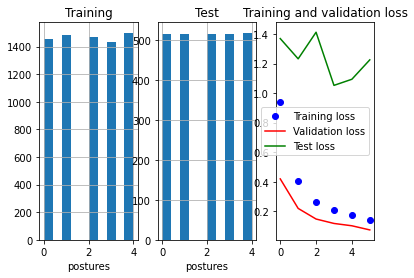

81/81 - 0s - loss: 1.2247 - accuracy: 0.5784

Test accuracy: 0.5783553123474121


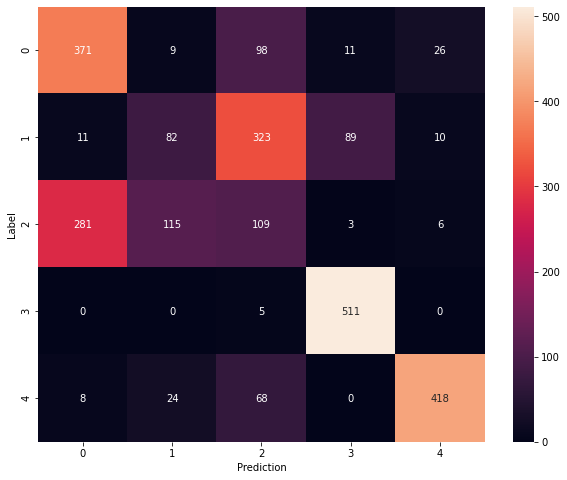

Model: "sequential_385"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_385 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_770 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2580      
_________________________________________________________________
dropout_771 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 3,840
Trainable params: 3,840
Non-trainable params: 0
__________________________________________________

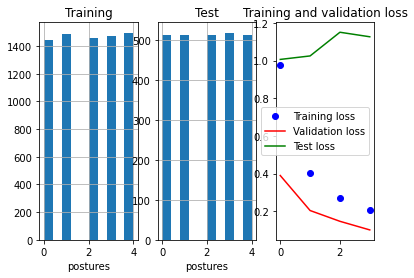

81/81 - 0s - loss: 1.1262 - accuracy: 0.6686

Test accuracy: 0.6686114072799683


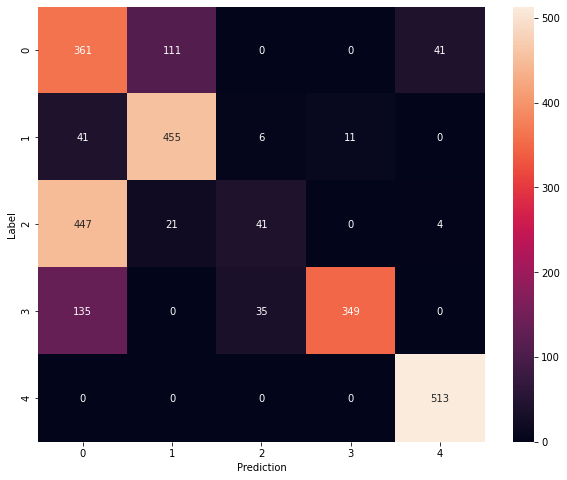

Model: "sequential_386"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_386 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_772 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3010      
_________________________________________________________________
dropout_773 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,295
Trainable params: 4,295
Non-trainable params: 0
__________________________________________________

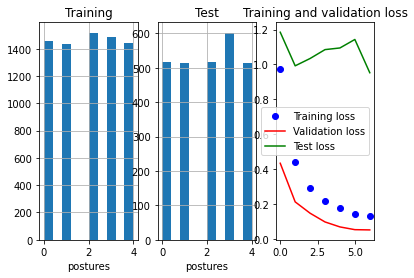

84/84 - 0s - loss: 0.9528 - accuracy: 0.6615

Test accuracy: 0.6615384817123413


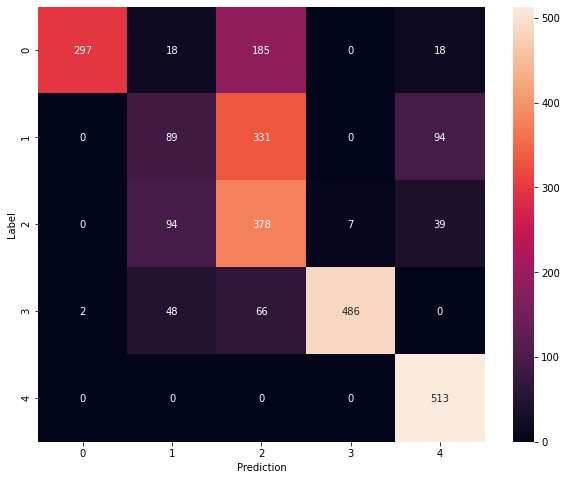

Model: "sequential_387"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_387 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_774 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3010      
_________________________________________________________________
dropout_775 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,295
Trainable params: 4,295
Non-trainable params: 0
__________________________________________________

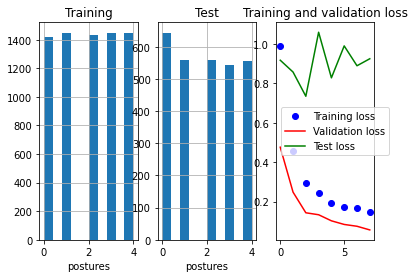

90/90 - 0s - loss: 0.9244 - accuracy: 0.7148

Test accuracy: 0.7147850394248962


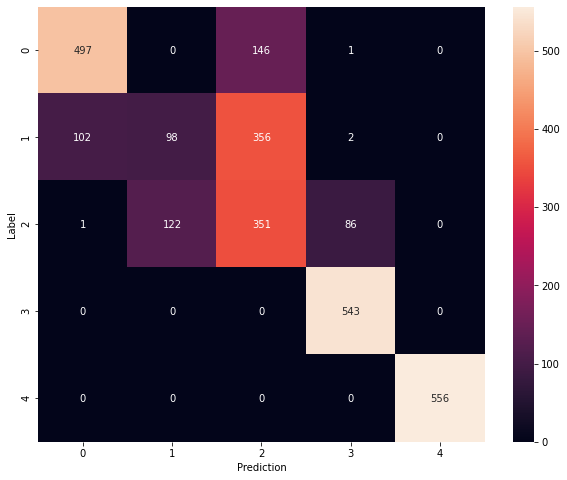

Model: "sequential_388"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_388 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_776 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3010      
_________________________________________________________________
dropout_777 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,295
Trainable params: 4,295
Non-trainable params: 0
__________________________________________________

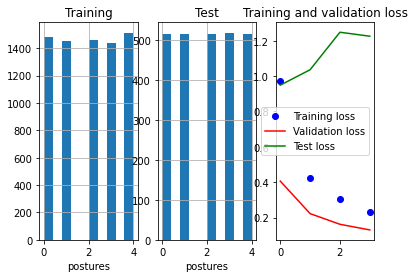

81/81 - 0s - loss: 1.2255 - accuracy: 0.6511

Test accuracy: 0.6511447429656982


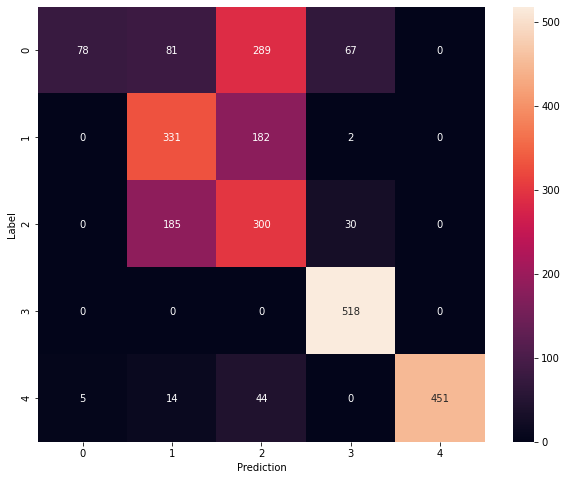

Model: "sequential_389"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_389 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_778 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3010      
_________________________________________________________________
dropout_779 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,295
Trainable params: 4,295
Non-trainable params: 0
__________________________________________________

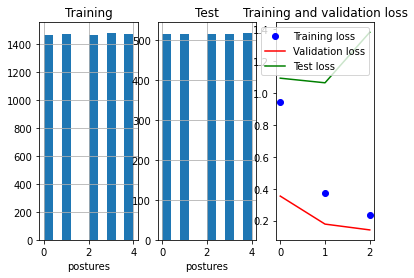

81/81 - 0s - loss: 1.3820 - accuracy: 0.5388

Test accuracy: 0.5387897491455078


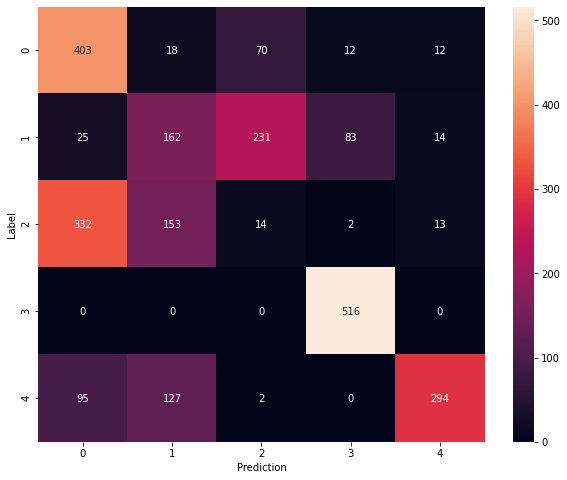

Model: "sequential_390"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_390 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_780 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3010      
_________________________________________________________________
dropout_781 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,295
Trainable params: 4,295
Non-trainable params: 0
__________________________________________________

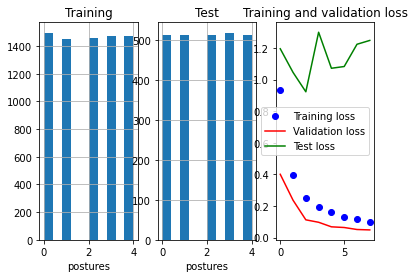

81/81 - 0s - loss: 1.2483 - accuracy: 0.7048

Test accuracy: 0.7047841548919678


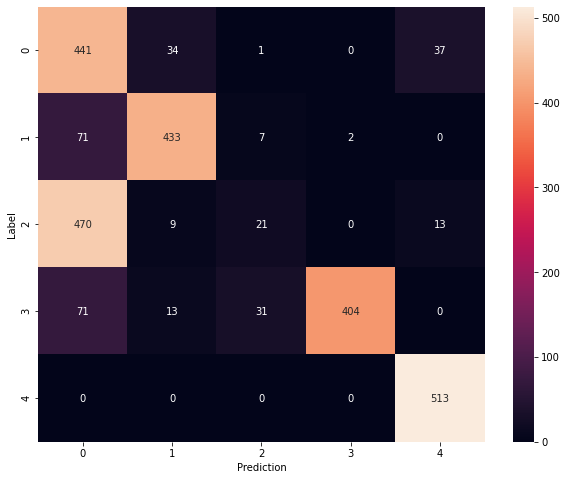

Model: "sequential_391"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_391 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_782 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3010      
_________________________________________________________________
dropout_783 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,295
Trainable params: 4,295
Non-trainable params: 0
__________________________________________________

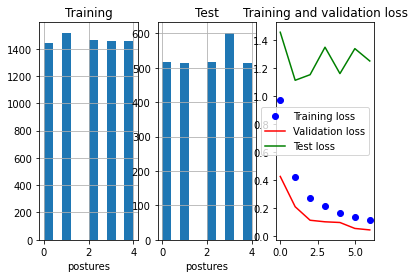

84/84 - 0s - loss: 1.2520 - accuracy: 0.6649

Test accuracy: 0.6649155616760254


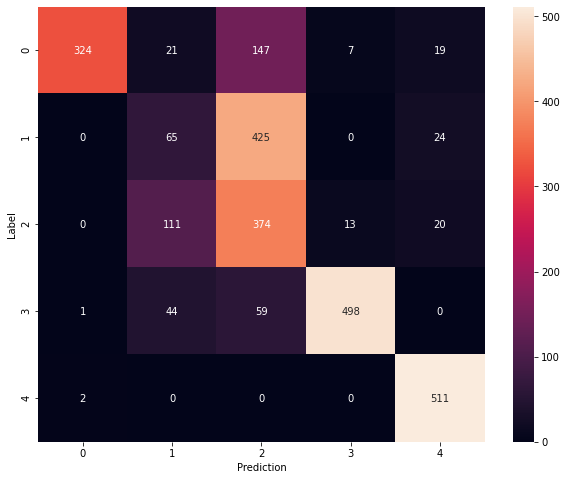

Model: "sequential_392"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_392 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_784 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3010      
_________________________________________________________________
dropout_785 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,295
Trainable params: 4,295
Non-trainable params: 0
__________________________________________________

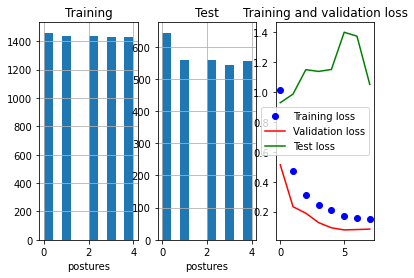

90/90 - 0s - loss: 1.0501 - accuracy: 0.6753

Test accuracy: 0.6752883791923523


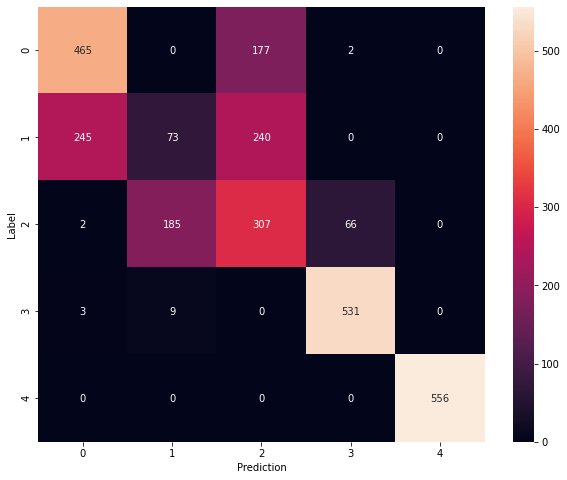

Model: "sequential_393"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_393 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_786 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3010      
_________________________________________________________________
dropout_787 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,295
Trainable params: 4,295
Non-trainable params: 0
__________________________________________________

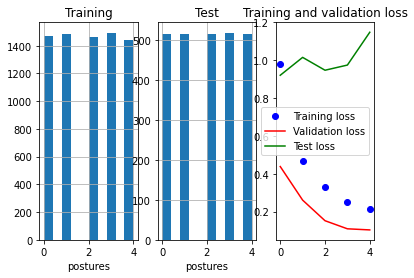

81/81 - 0s - loss: 1.1483 - accuracy: 0.5898

Test accuracy: 0.58983314037323


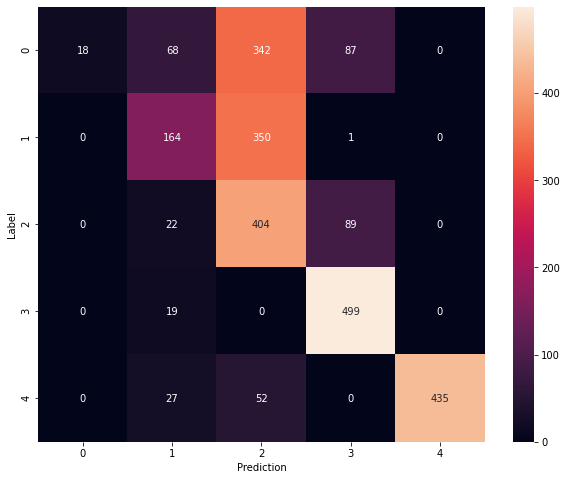

Model: "sequential_394"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_394 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_788 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3010      
_________________________________________________________________
dropout_789 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,295
Trainable params: 4,295
Non-trainable params: 0
__________________________________________________

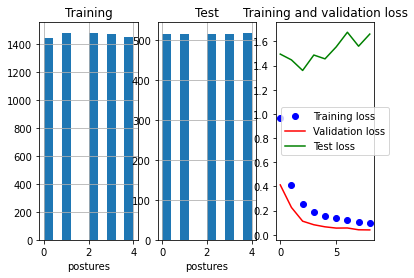

81/81 - 0s - loss: 1.6603 - accuracy: 0.5431

Test accuracy: 0.5430566072463989


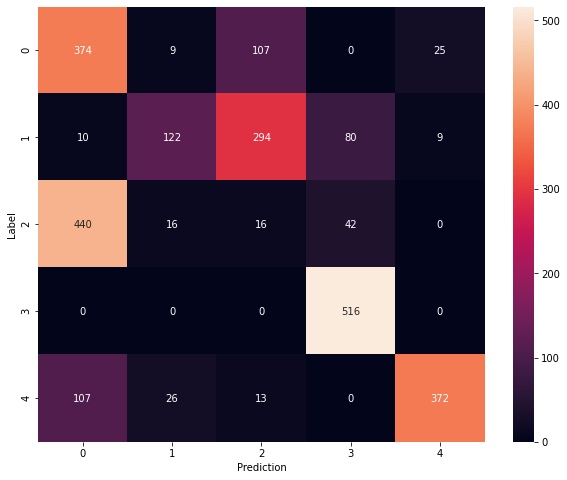

Model: "sequential_395"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_395 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_790 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3010      
_________________________________________________________________
dropout_791 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,295
Trainable params: 4,295
Non-trainable params: 0
__________________________________________________

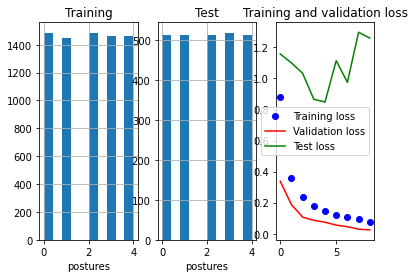

81/81 - 0s - loss: 1.2604 - accuracy: 0.7305

Test accuracy: 0.7304551005363464


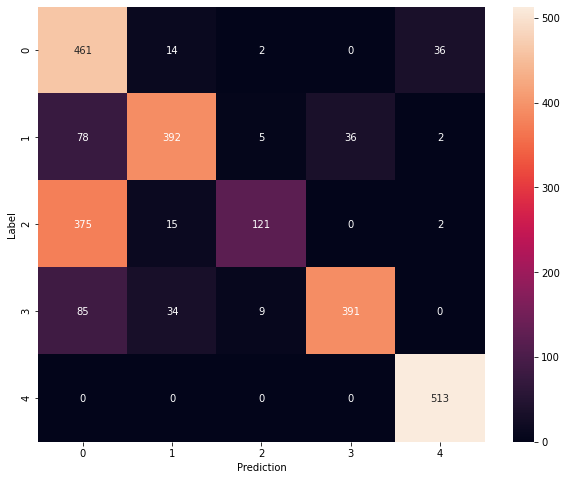

Model: "sequential_396"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_396 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_792 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3440      
_________________________________________________________________
dropout_793 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,750
Trainable params: 4,750
Non-trainable params: 0
__________________________________________________

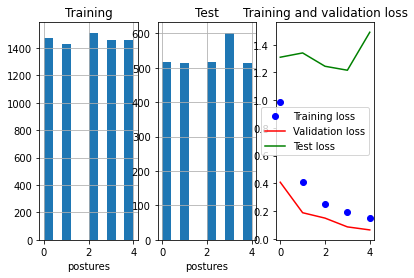

84/84 - 0s - loss: 1.4898 - accuracy: 0.6477

Test accuracy: 0.6476547718048096


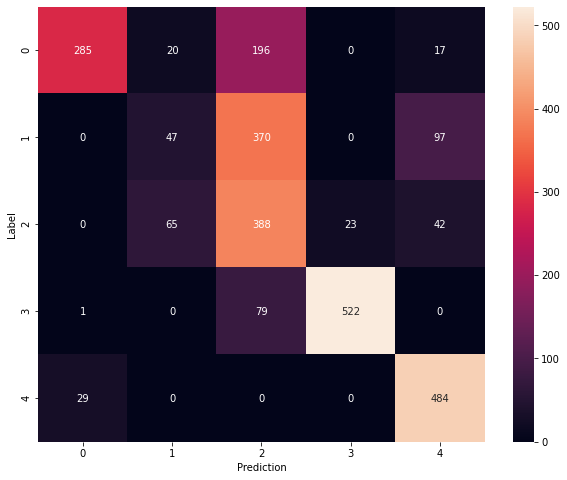

Model: "sequential_397"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_397 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_794 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3440      
_________________________________________________________________
dropout_795 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,750
Trainable params: 4,750
Non-trainable params: 0
__________________________________________________

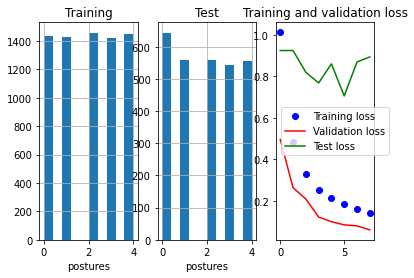

90/90 - 0s - loss: 0.8935 - accuracy: 0.7151

Test accuracy: 0.7151345610618591


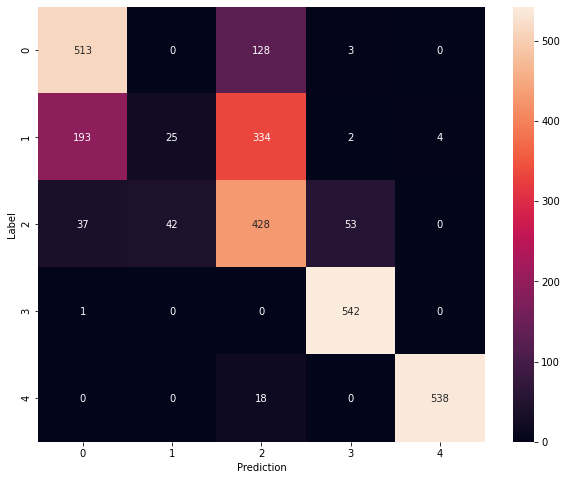

Model: "sequential_398"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_398 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_796 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3440      
_________________________________________________________________
dropout_797 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,750
Trainable params: 4,750
Non-trainable params: 0
__________________________________________________

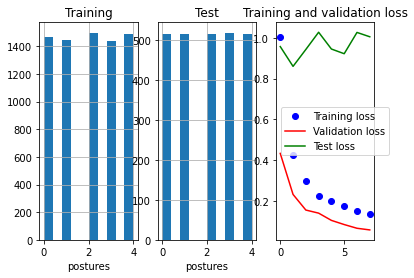

81/81 - 0s - loss: 1.0049 - accuracy: 0.7128

Test accuracy: 0.7128443717956543


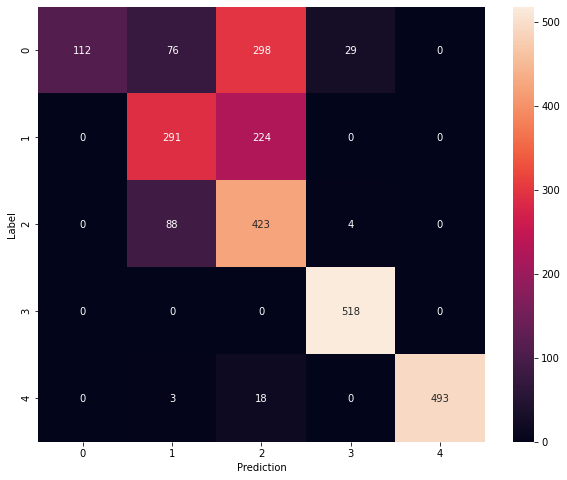

Model: "sequential_399"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_399 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_798 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3440      
_________________________________________________________________
dropout_799 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,750
Trainable params: 4,750
Non-trainable params: 0
__________________________________________________

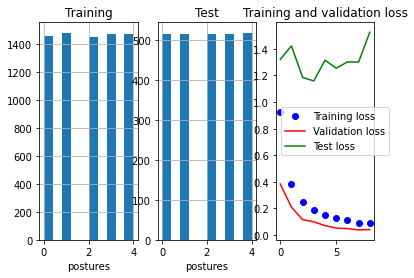

81/81 - 0s - loss: 1.5251 - accuracy: 0.5621

Test accuracy: 0.5620636343955994


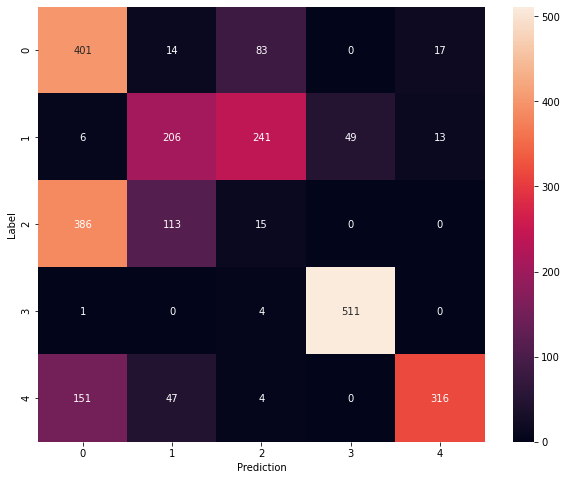

Model: "sequential_400"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_400 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_800 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3440      
_________________________________________________________________
dropout_801 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,750
Trainable params: 4,750
Non-trainable params: 0
__________________________________________________

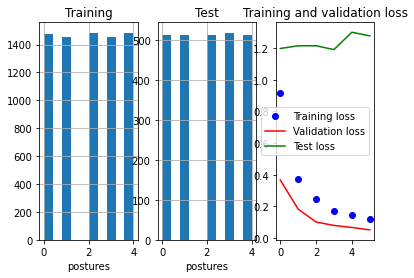

81/81 - 0s - loss: 1.2777 - accuracy: 0.6888

Test accuracy: 0.6888370513916016


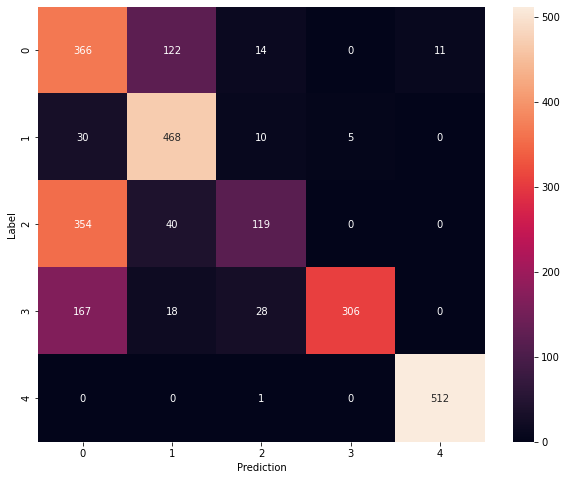

Model: "sequential_401"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_401 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_802 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3440      
_________________________________________________________________
dropout_803 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,750
Trainable params: 4,750
Non-trainable params: 0
__________________________________________________

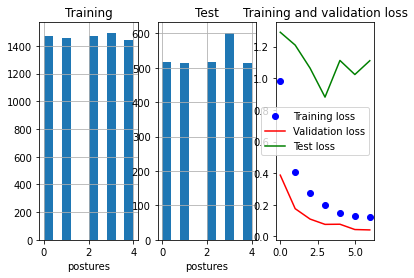

84/84 - 0s - loss: 1.1103 - accuracy: 0.7028

Test accuracy: 0.7028142809867859


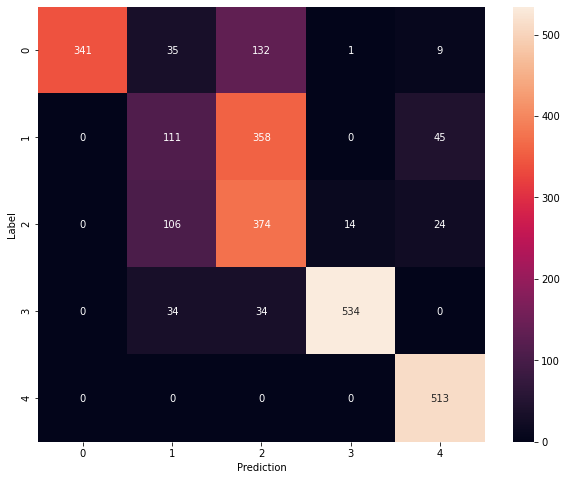

Model: "sequential_402"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_402 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_804 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3440      
_________________________________________________________________
dropout_805 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,750
Trainable params: 4,750
Non-trainable params: 0
__________________________________________________

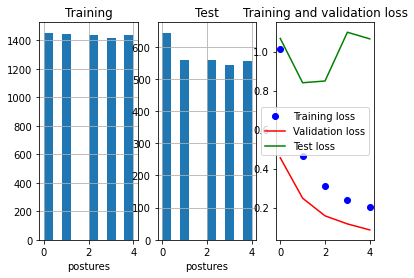

90/90 - 0s - loss: 1.0654 - accuracy: 0.7015

Test accuracy: 0.7015029788017273


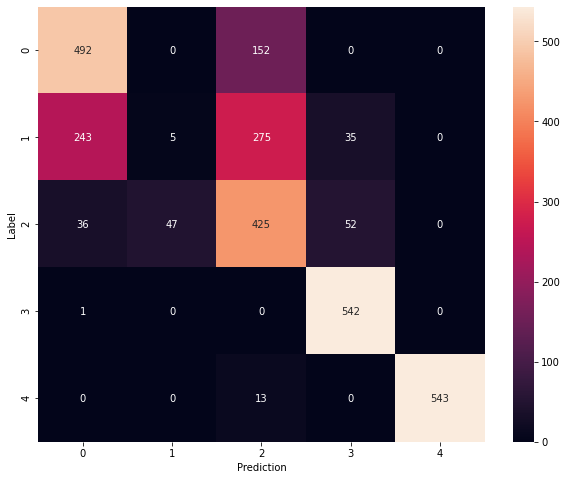

Model: "sequential_403"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_403 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_806 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3440      
_________________________________________________________________
dropout_807 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,750
Trainable params: 4,750
Non-trainable params: 0
__________________________________________________

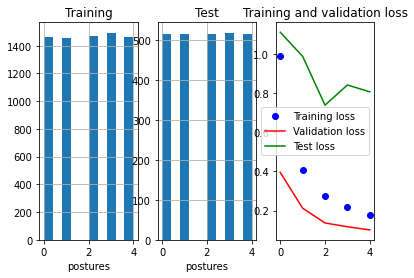

81/81 - 0s - loss: 0.8054 - accuracy: 0.6414

Test accuracy: 0.6414435505867004


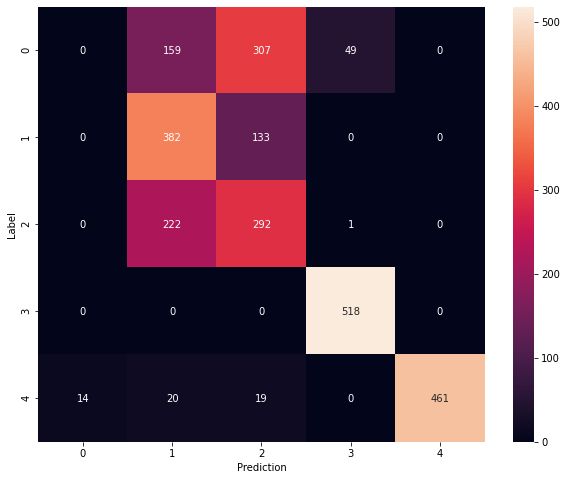

Model: "sequential_404"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_404 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_808 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3440      
_________________________________________________________________
dropout_809 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,750
Trainable params: 4,750
Non-trainable params: 0
__________________________________________________

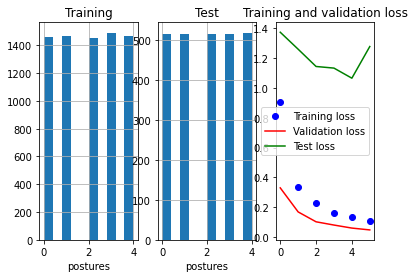

81/81 - 0s - loss: 1.2767 - accuracy: 0.5807

Test accuracy: 0.5806826949119568


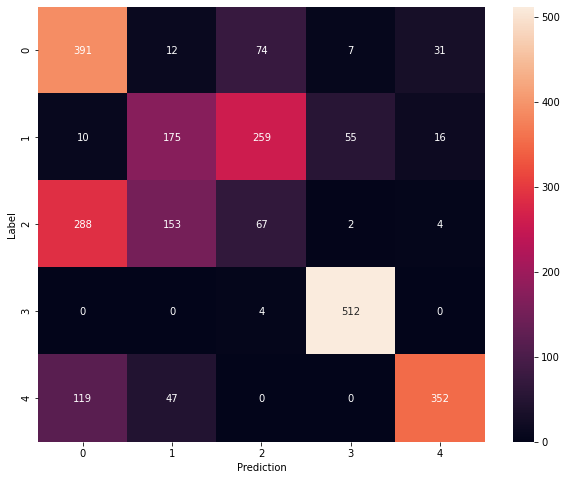

Model: "sequential_405"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_405 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 85)                1105      
_________________________________________________________________
dropout_810 (Dropout)        (None, 85)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3440      
_________________________________________________________________
dropout_811 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 4,750
Trainable params: 4,750
Non-trainable params: 0
__________________________________________________

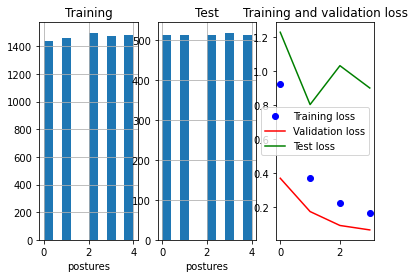

81/81 - 0s - loss: 0.8999 - accuracy: 0.7530

Test accuracy: 0.7530143857002258


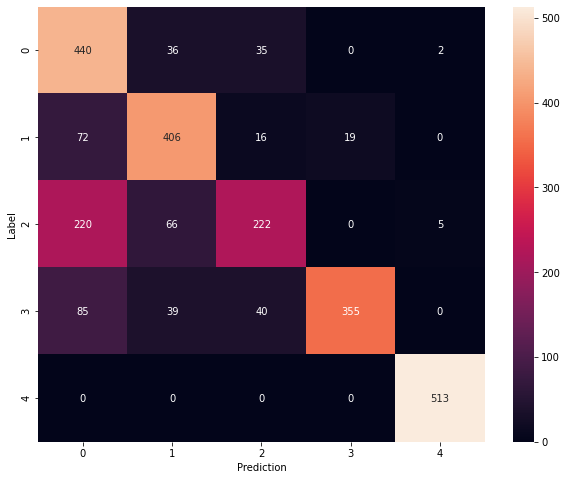

Model: "sequential_406"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_406 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_812 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2730      
_________________________________________________________________
dropout_813 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,055
Trainable params: 4,055
Non-trainable params: 0
__________________________________________________

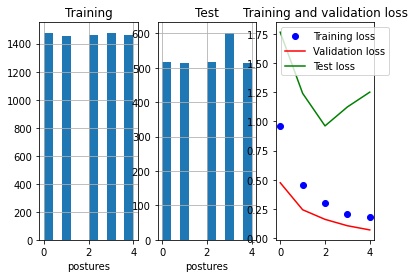

84/84 - 0s - loss: 1.2516 - accuracy: 0.7122

Test accuracy: 0.712195098400116


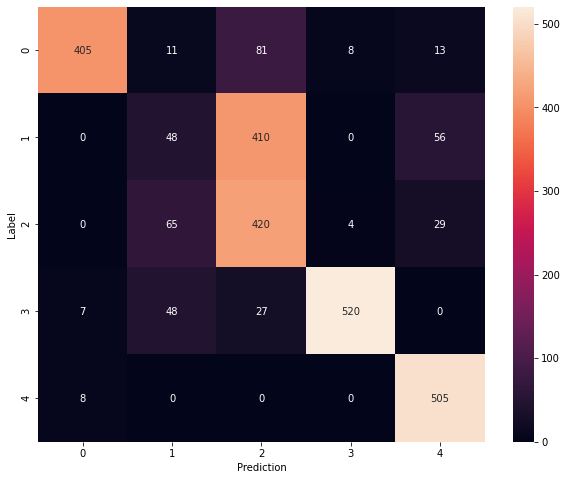

Model: "sequential_407"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_407 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_814 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2730      
_________________________________________________________________
dropout_815 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,055
Trainable params: 4,055
Non-trainable params: 0
__________________________________________________

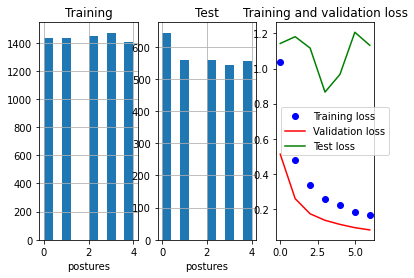

90/90 - 0s - loss: 1.1327 - accuracy: 0.7221

Test accuracy: 0.7221251130104065


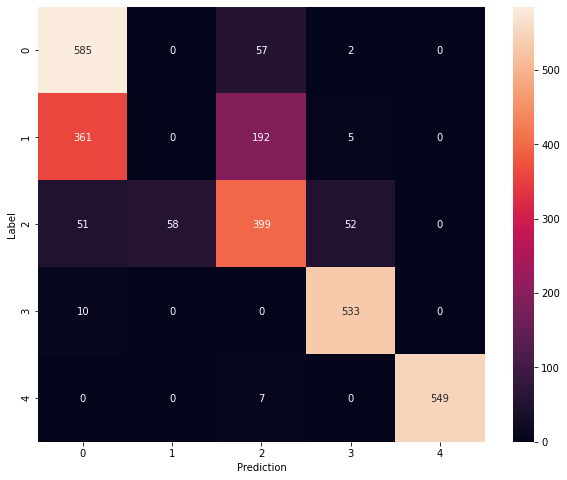

Model: "sequential_408"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_408 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_816 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2730      
_________________________________________________________________
dropout_817 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,055
Trainable params: 4,055
Non-trainable params: 0
__________________________________________________

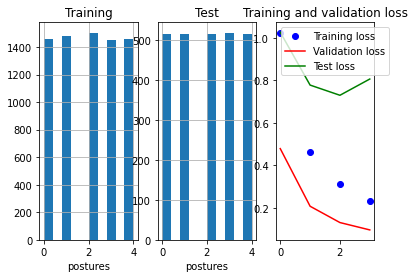

81/81 - 0s - loss: 0.8059 - accuracy: 0.6550

Test accuracy: 0.6550252437591553


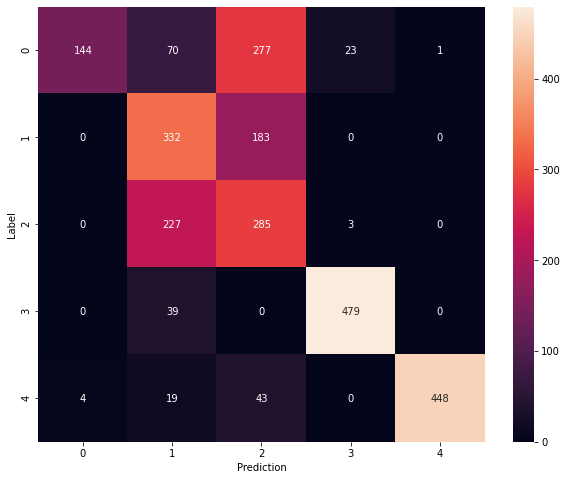

Model: "sequential_409"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_409 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_818 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2730      
_________________________________________________________________
dropout_819 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,055
Trainable params: 4,055
Non-trainable params: 0
__________________________________________________

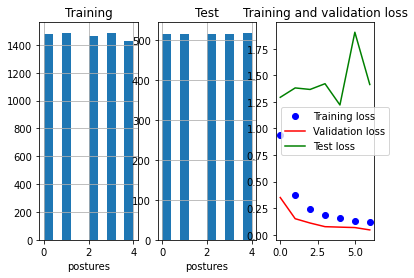

81/81 - 0s - loss: 1.4138 - accuracy: 0.5834

Test accuracy: 0.5833979845046997


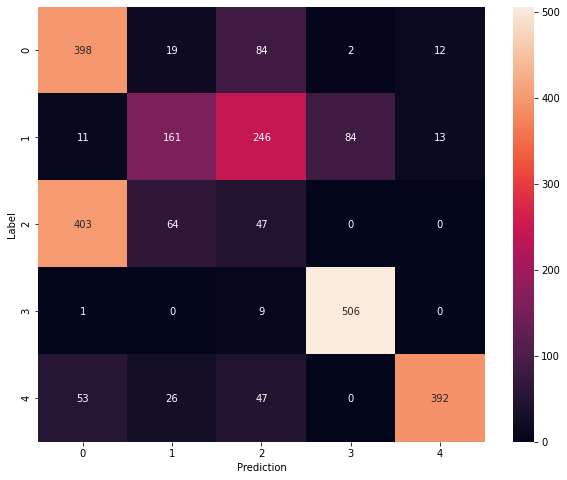

Model: "sequential_410"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_410 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_820 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2730      
_________________________________________________________________
dropout_821 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,055
Trainable params: 4,055
Non-trainable params: 0
__________________________________________________

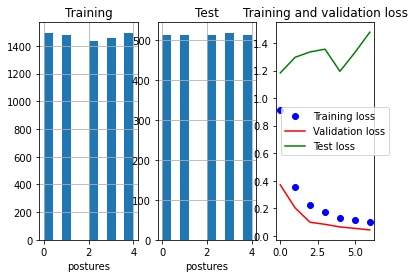

81/81 - 0s - loss: 1.4778 - accuracy: 0.6811

Test accuracy: 0.6810579299926758


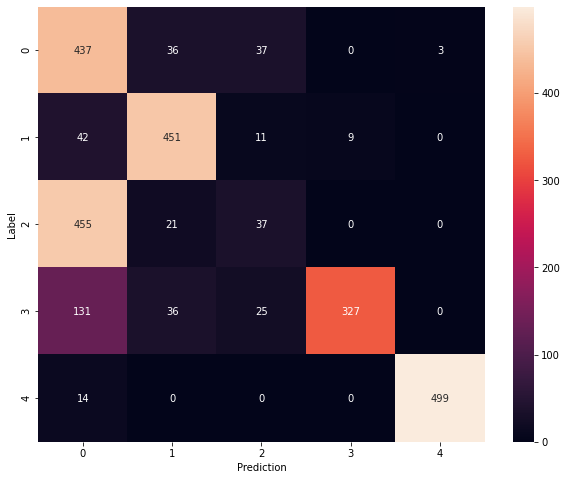

Model: "sequential_411"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_411 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_822 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2730      
_________________________________________________________________
dropout_823 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,055
Trainable params: 4,055
Non-trainable params: 0
__________________________________________________

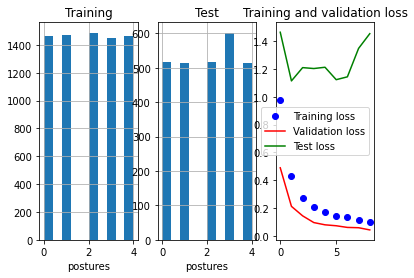

84/84 - 0s - loss: 1.4550 - accuracy: 0.6961

Test accuracy: 0.696060061454773


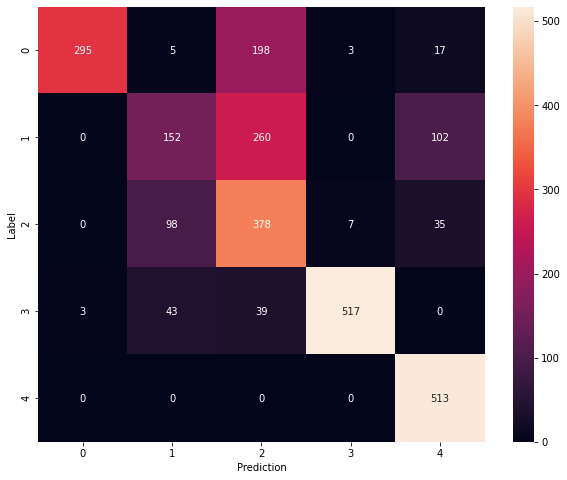

Model: "sequential_412"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_412 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_824 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2730      
_________________________________________________________________
dropout_825 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,055
Trainable params: 4,055
Non-trainable params: 0
__________________________________________________

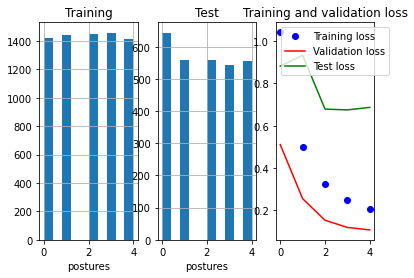

90/90 - 0s - loss: 0.6867 - accuracy: 0.7288

Test accuracy: 0.728766143321991


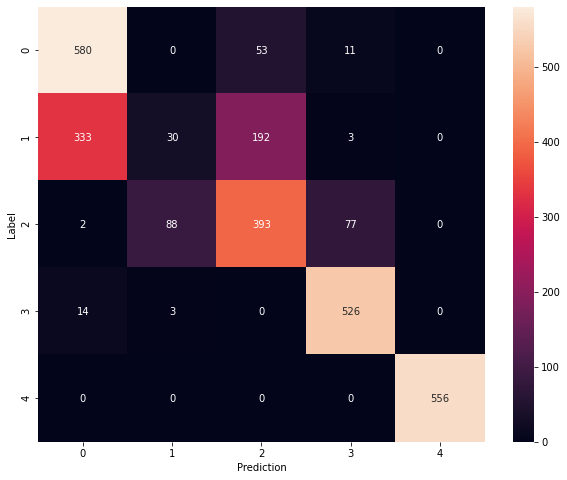

Model: "sequential_413"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_413 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_826 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2730      
_________________________________________________________________
dropout_827 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,055
Trainable params: 4,055
Non-trainable params: 0
__________________________________________________

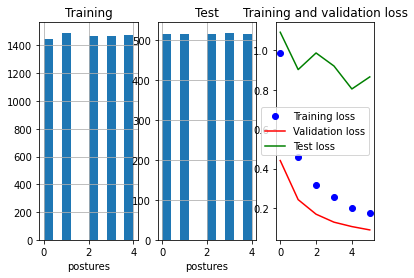

81/81 - 0s - loss: 0.8654 - accuracy: 0.6628

Test accuracy: 0.6627861857414246


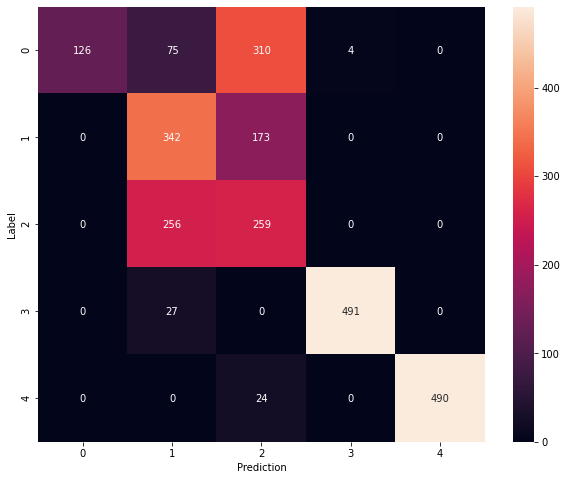

Model: "sequential_414"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_414 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_828 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2730      
_________________________________________________________________
dropout_829 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,055
Trainable params: 4,055
Non-trainable params: 0
__________________________________________________

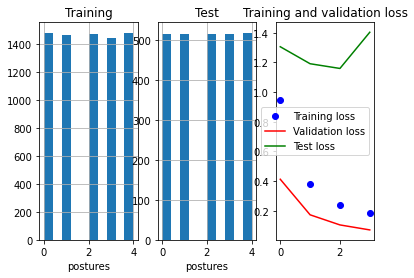

81/81 - 0s - loss: 1.4038 - accuracy: 0.5609

Test accuracy: 0.5608999133110046


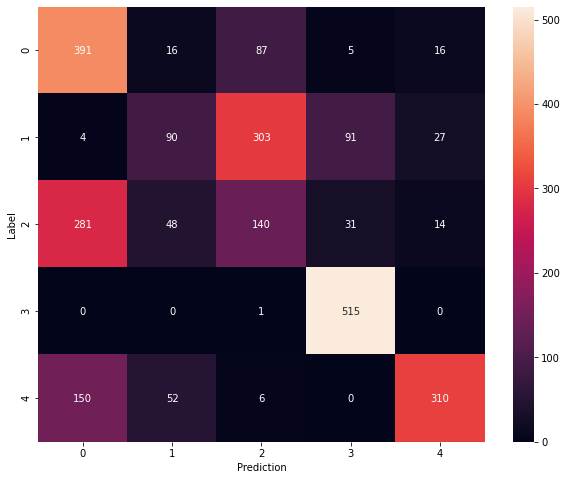

Model: "sequential_415"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_415 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_830 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2730      
_________________________________________________________________
dropout_831 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,055
Trainable params: 4,055
Non-trainable params: 0
__________________________________________________

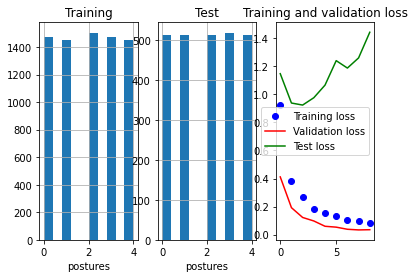

81/81 - 0s - loss: 1.4436 - accuracy: 0.6737

Test accuracy: 0.673667848110199


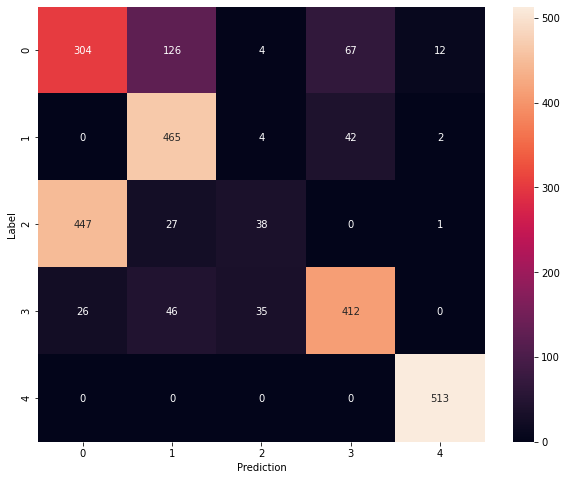

Model: "sequential_416"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_416 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_832 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3185      
_________________________________________________________________
dropout_833 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,535
Trainable params: 4,535
Non-trainable params: 0
__________________________________________________

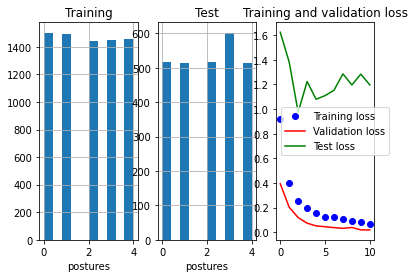

84/84 - 0s - loss: 1.1969 - accuracy: 0.7445

Test accuracy: 0.7444652915000916


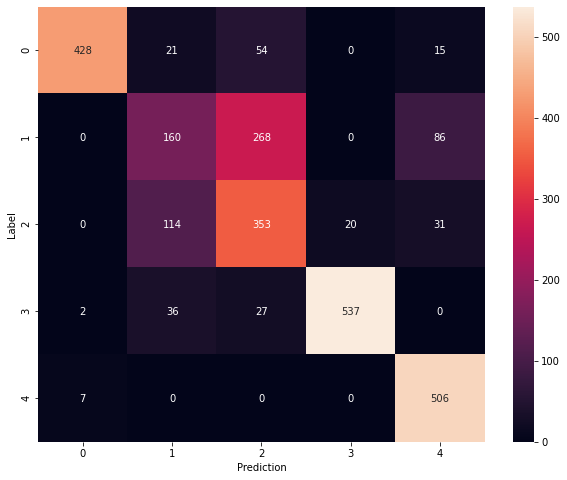

Model: "sequential_417"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_417 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_834 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3185      
_________________________________________________________________
dropout_835 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,535
Trainable params: 4,535
Non-trainable params: 0
__________________________________________________

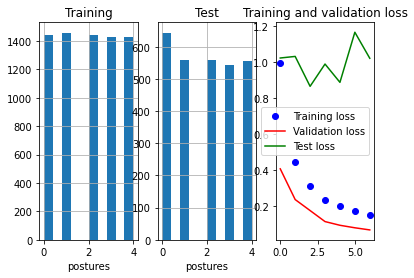

90/90 - 0s - loss: 1.0228 - accuracy: 0.7005

Test accuracy: 0.7004544138908386


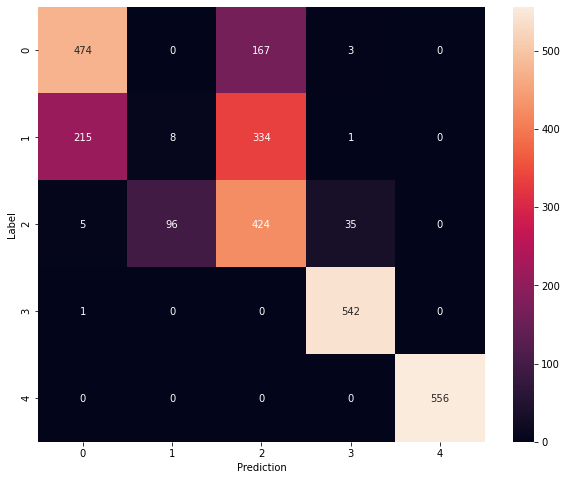

Model: "sequential_418"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_418 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_836 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3185      
_________________________________________________________________
dropout_837 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,535
Trainable params: 4,535
Non-trainable params: 0
__________________________________________________

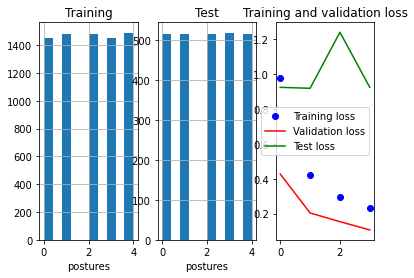

81/81 - 0s - loss: 0.9237 - accuracy: 0.6740

Test accuracy: 0.6740396022796631


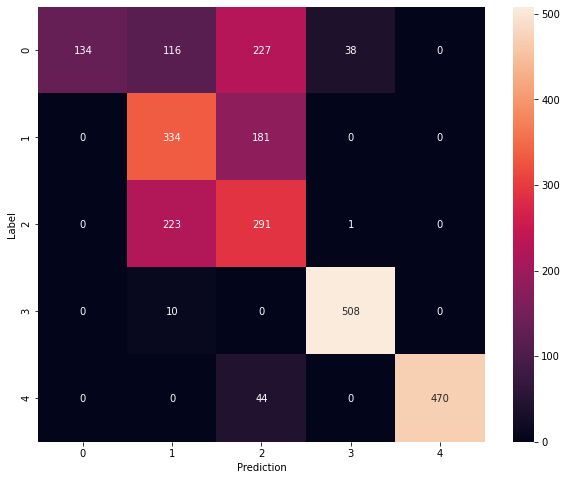

Model: "sequential_419"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_419 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_838 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3185      
_________________________________________________________________
dropout_839 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,535
Trainable params: 4,535
Non-trainable params: 0
__________________________________________________

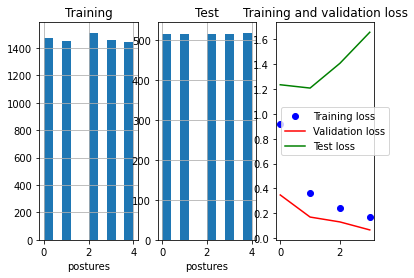

81/81 - 0s - loss: 1.6557 - accuracy: 0.5535

Test accuracy: 0.5535298585891724


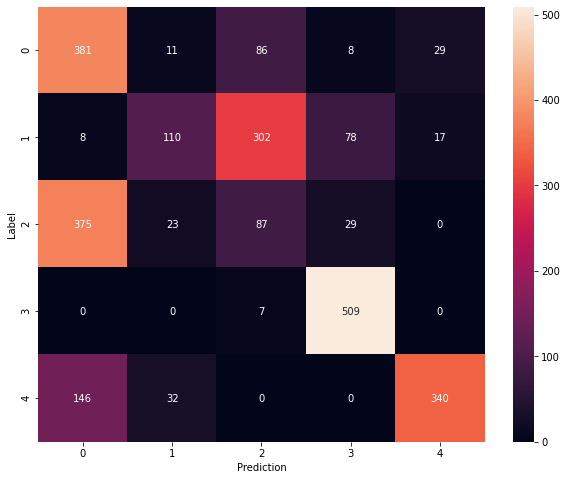

Model: "sequential_420"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_420 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_840 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3185      
_________________________________________________________________
dropout_841 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,535
Trainable params: 4,535
Non-trainable params: 0
__________________________________________________

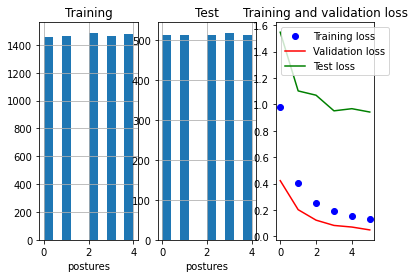

81/81 - 0s - loss: 0.9424 - accuracy: 0.7207

Test accuracy: 0.720731258392334


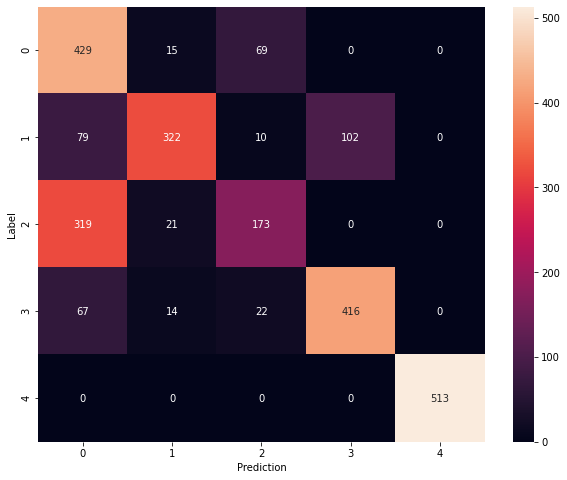

Model: "sequential_421"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_421 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_842 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3185      
_________________________________________________________________
dropout_843 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,535
Trainable params: 4,535
Non-trainable params: 0
__________________________________________________

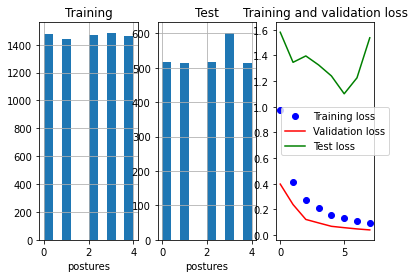

84/84 - 0s - loss: 1.5374 - accuracy: 0.6747

Test accuracy: 0.6746716499328613


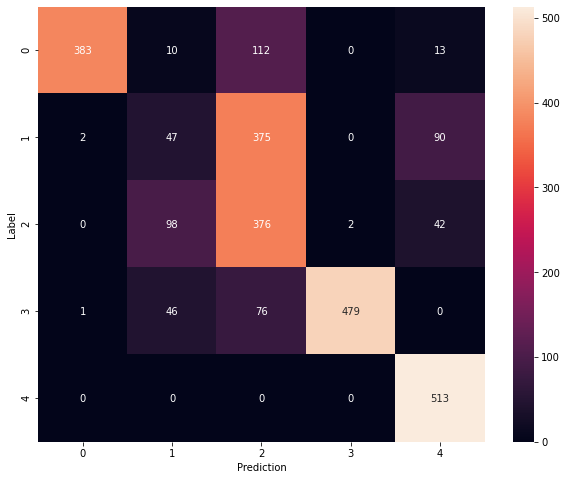

Model: "sequential_422"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_422 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_844 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3185      
_________________________________________________________________
dropout_845 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,535
Trainable params: 4,535
Non-trainable params: 0
__________________________________________________

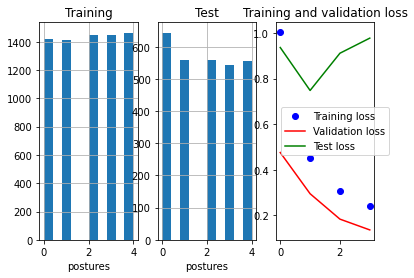

90/90 - 0s - loss: 0.9778 - accuracy: 0.6942

Test accuracy: 0.694162905216217


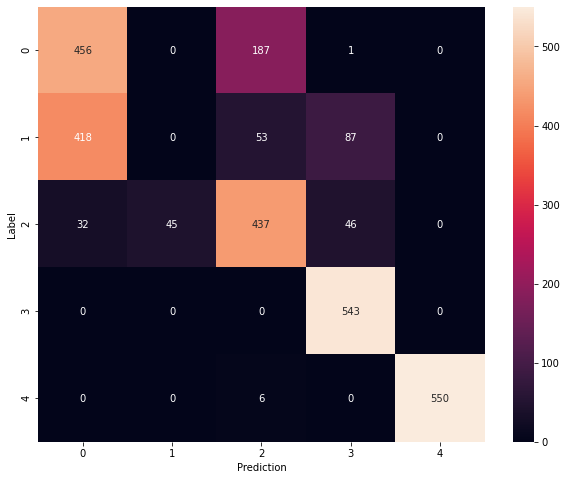

Model: "sequential_423"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_423 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_846 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3185      
_________________________________________________________________
dropout_847 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,535
Trainable params: 4,535
Non-trainable params: 0
__________________________________________________

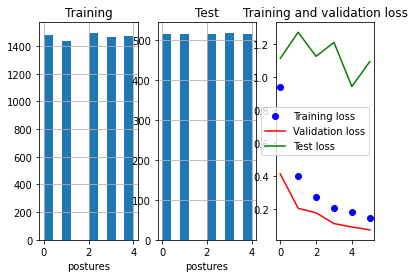

81/81 - 0s - loss: 1.0934 - accuracy: 0.6391

Test accuracy: 0.6391152739524841


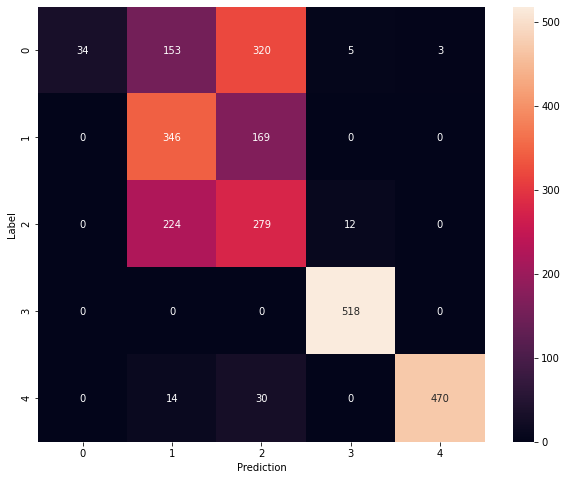

Model: "sequential_424"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_424 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_848 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3185      
_________________________________________________________________
dropout_849 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,535
Trainable params: 4,535
Non-trainable params: 0
__________________________________________________

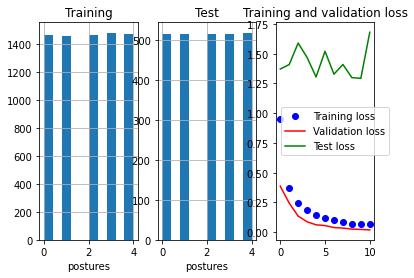

81/81 - 0s - loss: 1.6806 - accuracy: 0.6090

Test accuracy: 0.6089992523193359


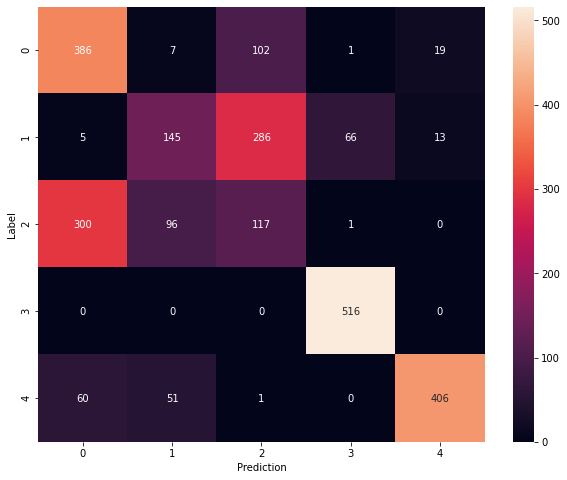

Model: "sequential_425"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_425 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_850 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3185      
_________________________________________________________________
dropout_851 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,535
Trainable params: 4,535
Non-trainable params: 0
__________________________________________________

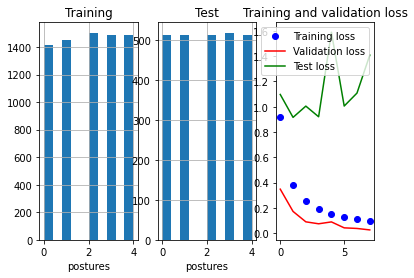

81/81 - 0s - loss: 1.4077 - accuracy: 0.6939

Test accuracy: 0.6938934326171875


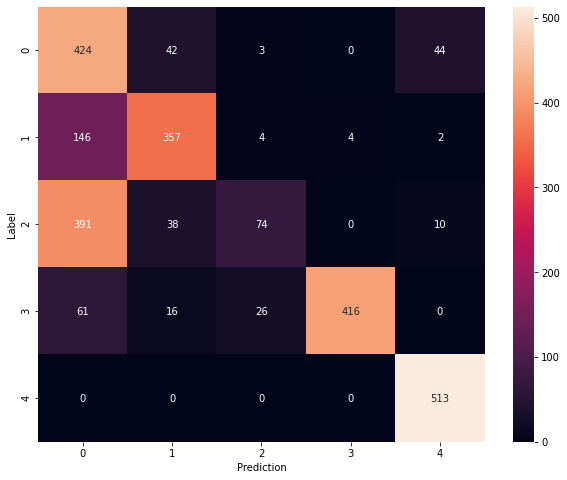

Model: "sequential_426"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_426 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_852 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3640      
_________________________________________________________________
dropout_853 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,015
Trainable params: 5,015
Non-trainable params: 0
__________________________________________________

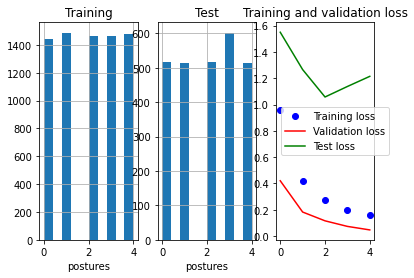

84/84 - 0s - loss: 1.2143 - accuracy: 0.6514

Test accuracy: 0.6514071226119995


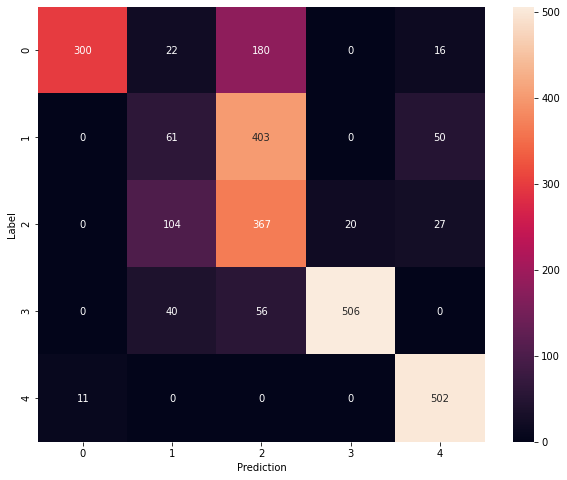

Model: "sequential_427"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_427 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_854 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3640      
_________________________________________________________________
dropout_855 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,015
Trainable params: 5,015
Non-trainable params: 0
__________________________________________________

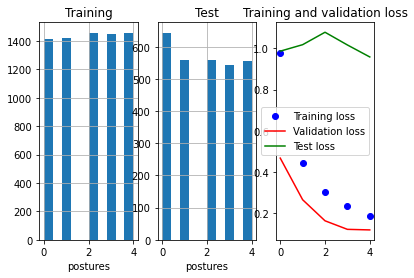

90/90 - 0s - loss: 0.9587 - accuracy: 0.6704

Test accuracy: 0.6703949570655823


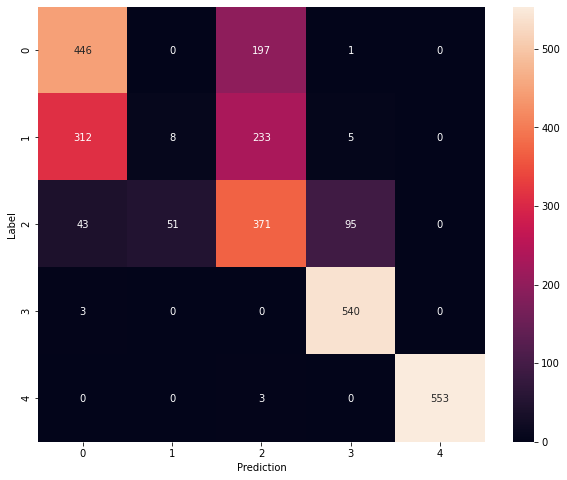

Model: "sequential_428"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_428 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_856 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3640      
_________________________________________________________________
dropout_857 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,015
Trainable params: 5,015
Non-trainable params: 0
__________________________________________________

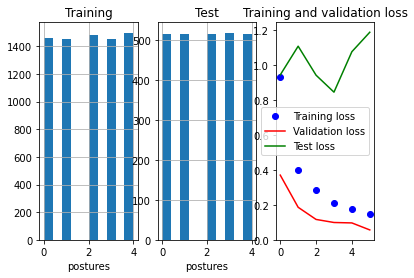

81/81 - 0s - loss: 1.1888 - accuracy: 0.6934

Test accuracy: 0.6934419870376587


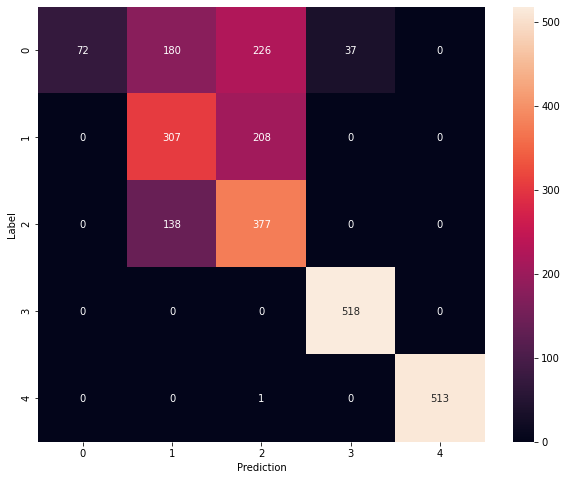

Model: "sequential_429"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_429 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_858 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3640      
_________________________________________________________________
dropout_859 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,015
Trainable params: 5,015
Non-trainable params: 0
__________________________________________________

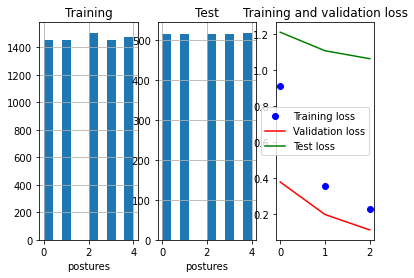

81/81 - 0s - loss: 1.0630 - accuracy: 0.5493

Test accuracy: 0.5492630004882812


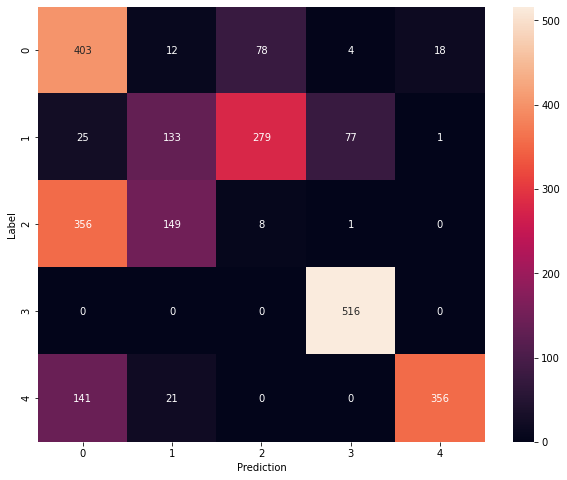

Model: "sequential_430"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_430 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_860 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3640      
_________________________________________________________________
dropout_861 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,015
Trainable params: 5,015
Non-trainable params: 0
__________________________________________________

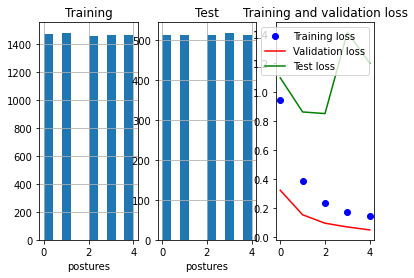

81/81 - 0s - loss: 1.1982 - accuracy: 0.6628

Test accuracy: 0.6627771258354187


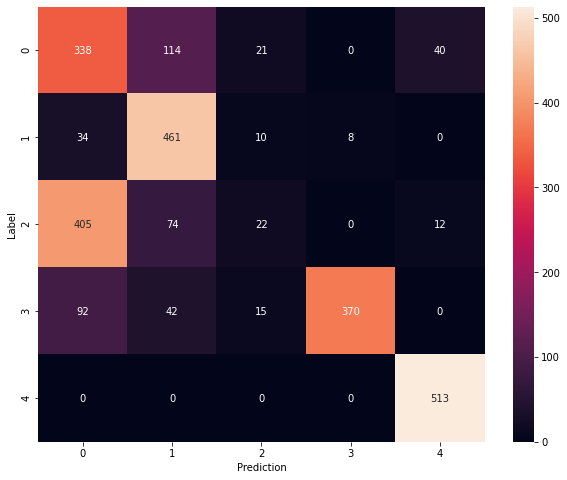

Model: "sequential_431"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_431 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_862 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3640      
_________________________________________________________________
dropout_863 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,015
Trainable params: 5,015
Non-trainable params: 0
__________________________________________________

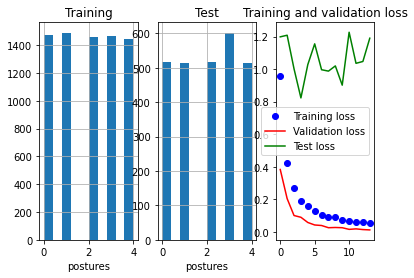

84/84 - 0s - loss: 1.1899 - accuracy: 0.6754

Test accuracy: 0.6754221320152283


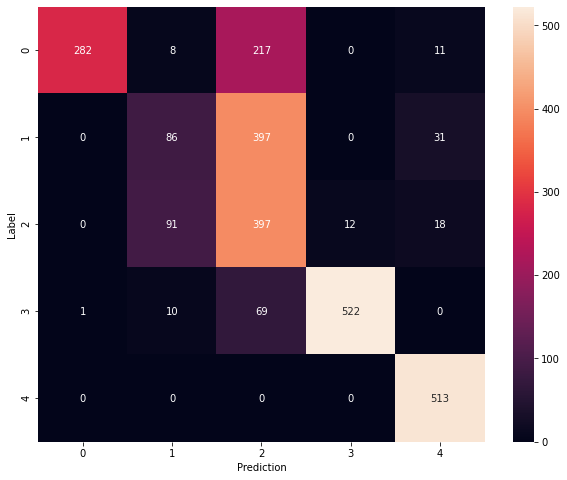

Model: "sequential_432"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_432 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_864 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3640      
_________________________________________________________________
dropout_865 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,015
Trainable params: 5,015
Non-trainable params: 0
__________________________________________________

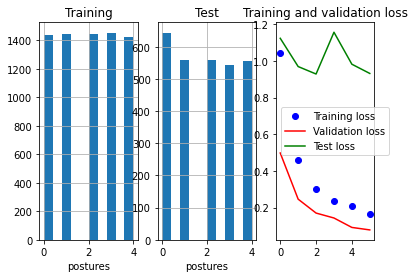

90/90 - 0s - loss: 0.9320 - accuracy: 0.6945

Test accuracy: 0.6945124268531799


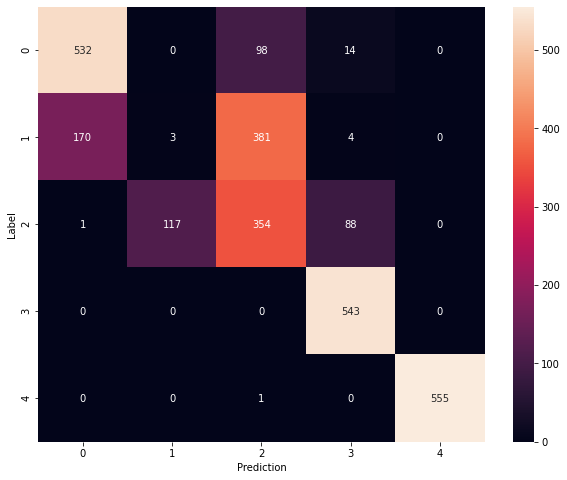

Model: "sequential_433"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_433 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_866 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3640      
_________________________________________________________________
dropout_867 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,015
Trainable params: 5,015
Non-trainable params: 0
__________________________________________________

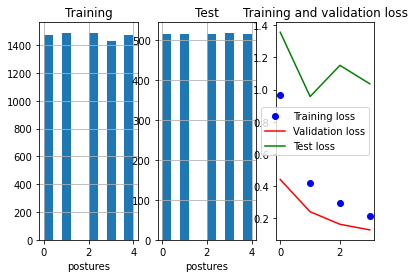

81/81 - 0s - loss: 1.0356 - accuracy: 0.7051

Test accuracy: 0.705083429813385


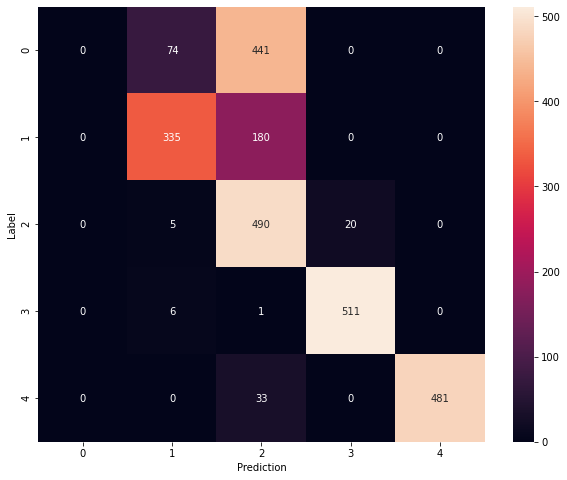

Model: "sequential_434"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_434 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_868 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3640      
_________________________________________________________________
dropout_869 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,015
Trainable params: 5,015
Non-trainable params: 0
__________________________________________________

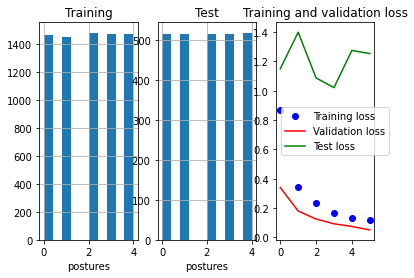

81/81 - 0s - loss: 1.2539 - accuracy: 0.5997

Test accuracy: 0.5996896624565125


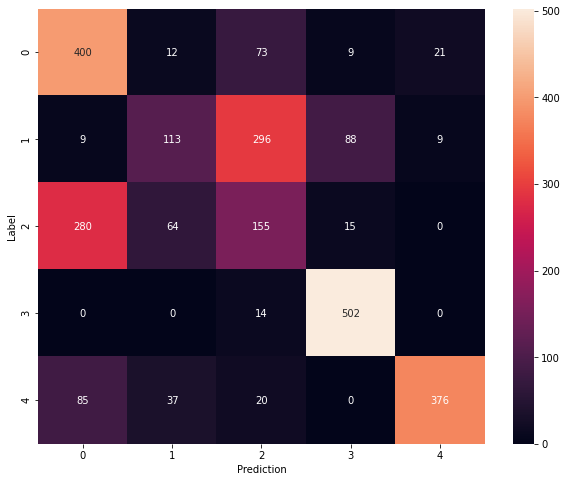

Model: "sequential_435"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_435 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 90)                1170      
_________________________________________________________________
dropout_870 (Dropout)        (None, 90)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3640      
_________________________________________________________________
dropout_871 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,015
Trainable params: 5,015
Non-trainable params: 0
__________________________________________________

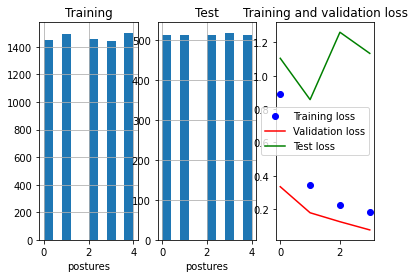

81/81 - 0s - loss: 1.1343 - accuracy: 0.6807

Test accuracy: 0.6806690096855164


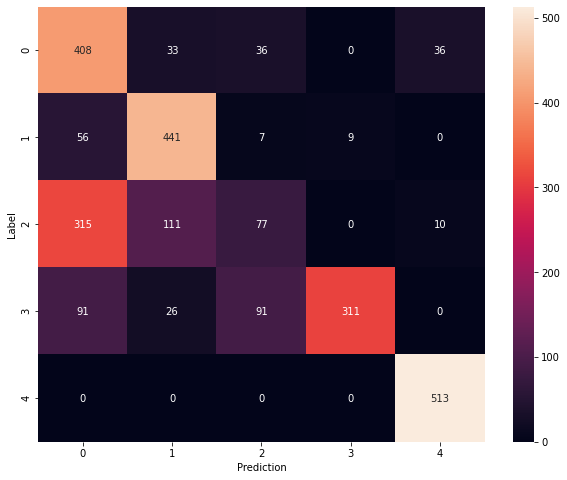

Model: "sequential_436"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_436 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_872 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2880      
_________________________________________________________________
dropout_873 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,270
Trainable params: 4,270
Non-trainable params: 0
__________________________________________________

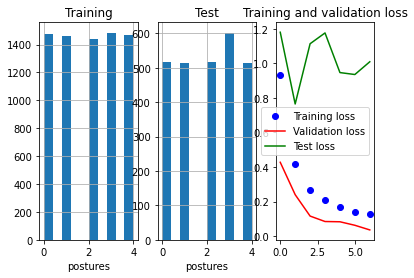

84/84 - 0s - loss: 1.0088 - accuracy: 0.7006

Test accuracy: 0.7005628347396851


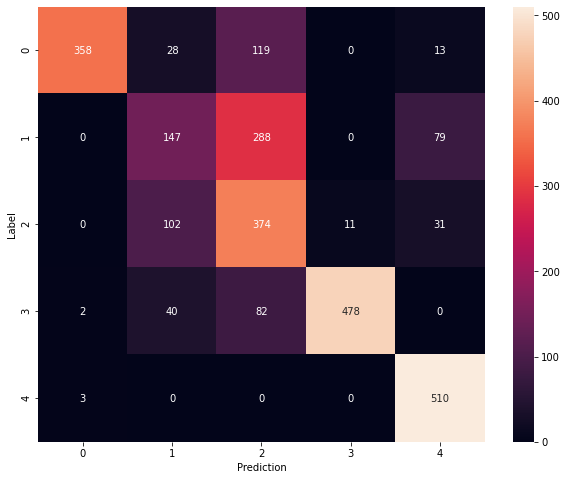

Model: "sequential_437"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_437 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_874 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2880      
_________________________________________________________________
dropout_875 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,270
Trainable params: 4,270
Non-trainable params: 0
__________________________________________________

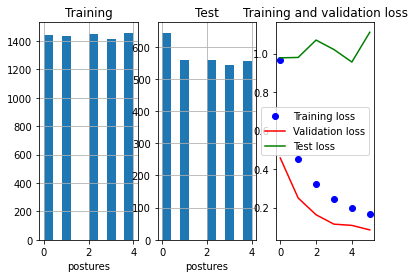

90/90 - 0s - loss: 1.1107 - accuracy: 0.6767

Test accuracy: 0.6766864657402039


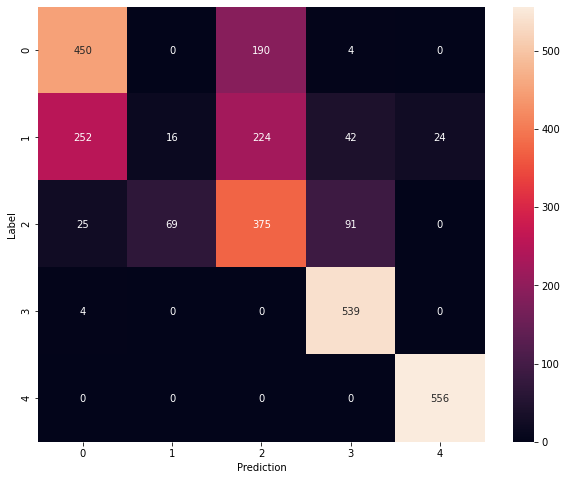

Model: "sequential_438"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_438 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_876 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2880      
_________________________________________________________________
dropout_877 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,270
Trainable params: 4,270
Non-trainable params: 0
__________________________________________________

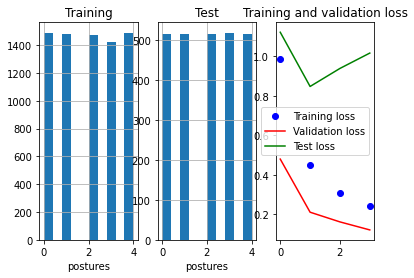

81/81 - 0s - loss: 1.0171 - accuracy: 0.7163

Test accuracy: 0.7163368463516235


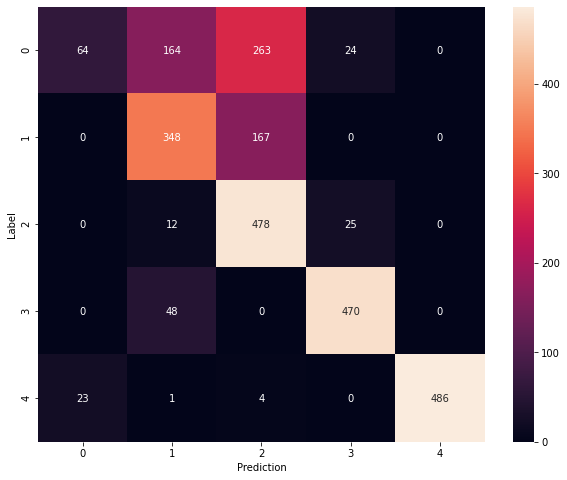

Model: "sequential_439"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_439 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_878 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2880      
_________________________________________________________________
dropout_879 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,270
Trainable params: 4,270
Non-trainable params: 0
__________________________________________________

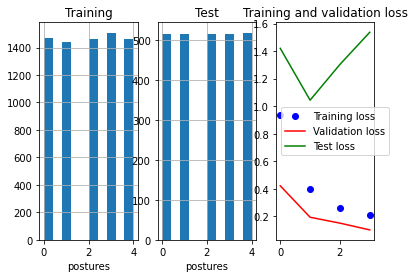

81/81 - 0s - loss: 1.5368 - accuracy: 0.5721

Test accuracy: 0.5721489787101746


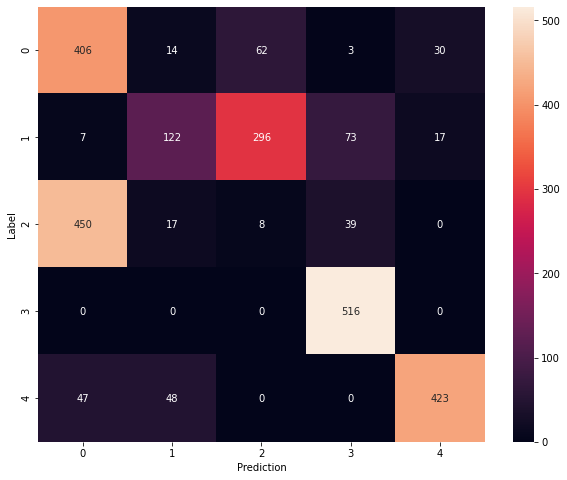

Model: "sequential_440"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_440 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_880 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2880      
_________________________________________________________________
dropout_881 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,270
Trainable params: 4,270
Non-trainable params: 0
__________________________________________________

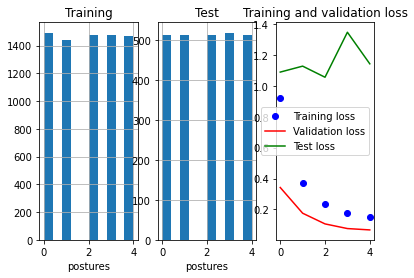

81/81 - 0s - loss: 1.1435 - accuracy: 0.6616

Test accuracy: 0.6616102457046509


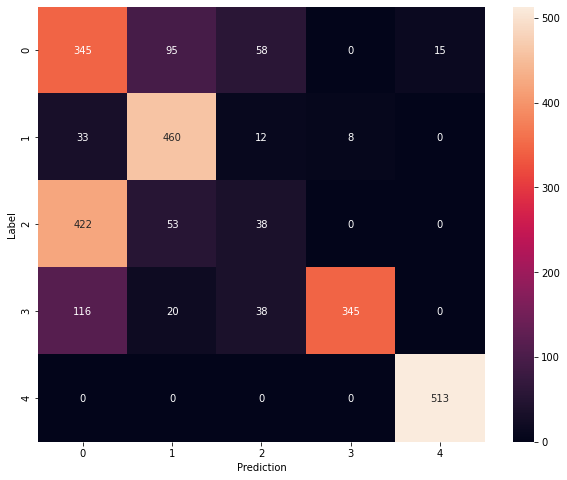

Model: "sequential_441"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_441 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_882 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2880      
_________________________________________________________________
dropout_883 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,270
Trainable params: 4,270
Non-trainable params: 0
__________________________________________________

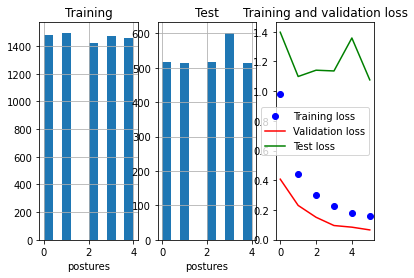

84/84 - 0s - loss: 1.0759 - accuracy: 0.7246

Test accuracy: 0.7245778441429138


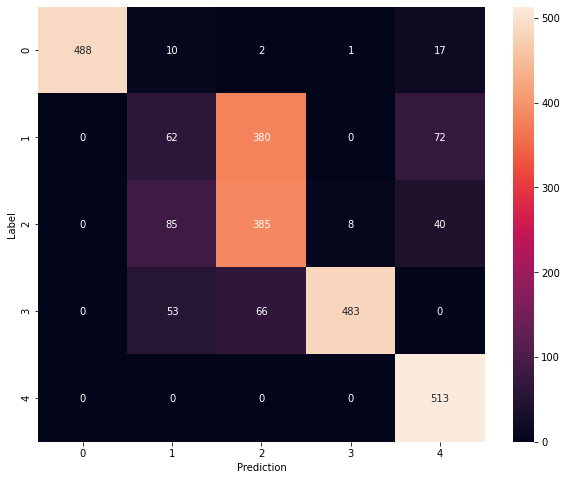

Model: "sequential_442"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_442 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_884 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2880      
_________________________________________________________________
dropout_885 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,270
Trainable params: 4,270
Non-trainable params: 0
__________________________________________________

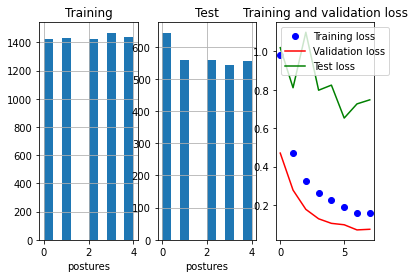

90/90 - 0s - loss: 0.7472 - accuracy: 0.7186

Test accuracy: 0.7186298370361328


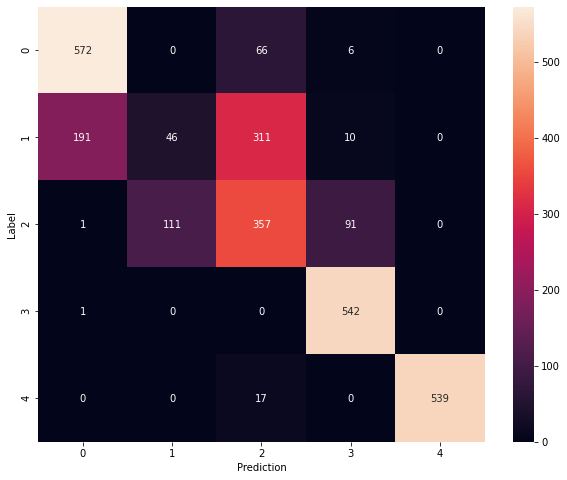

Model: "sequential_443"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_443 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_886 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2880      
_________________________________________________________________
dropout_887 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,270
Trainable params: 4,270
Non-trainable params: 0
__________________________________________________

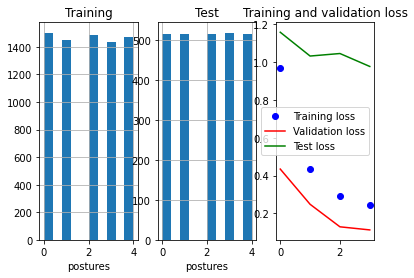

81/81 - 0s - loss: 0.9773 - accuracy: 0.6255

Test accuracy: 0.6255335807800293


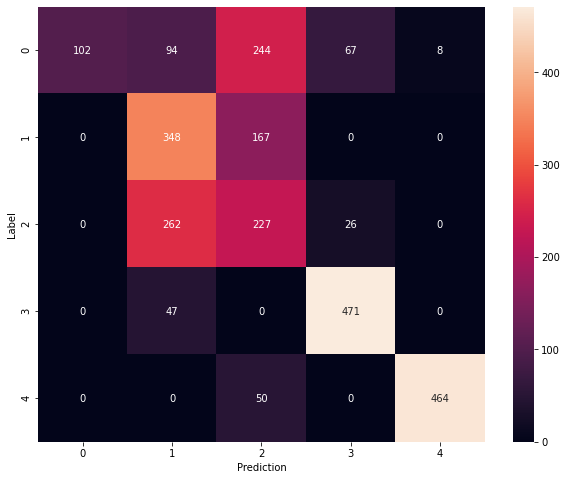

Model: "sequential_444"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_444 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_888 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2880      
_________________________________________________________________
dropout_889 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,270
Trainable params: 4,270
Non-trainable params: 0
__________________________________________________

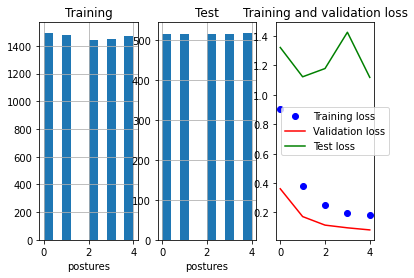

81/81 - 0s - loss: 1.1189 - accuracy: 0.5605

Test accuracy: 0.5605120062828064


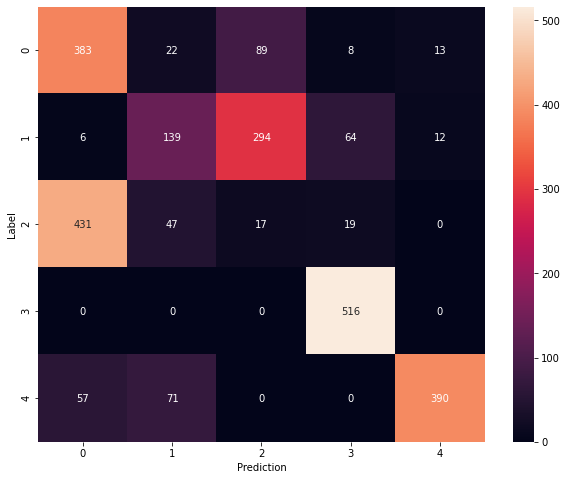

Model: "sequential_445"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_445 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_890 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                2880      
_________________________________________________________________
dropout_891 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,270
Trainable params: 4,270
Non-trainable params: 0
__________________________________________________

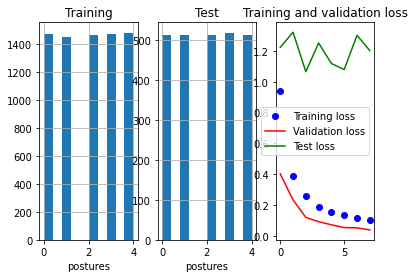

81/81 - 0s - loss: 1.2023 - accuracy: 0.7133

Test accuracy: 0.7133411169052124


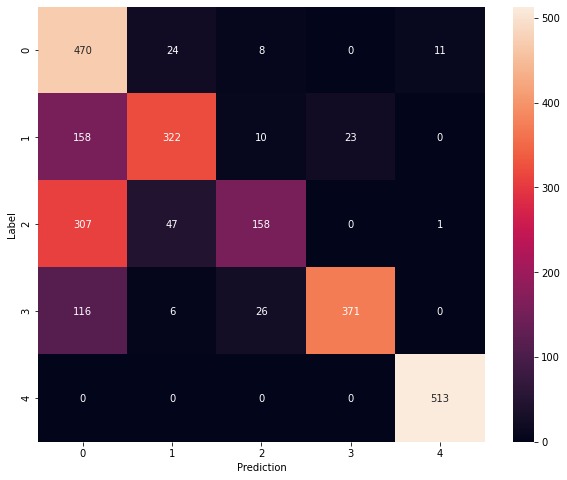

Model: "sequential_446"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_446 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_892 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3360      
_________________________________________________________________
dropout_893 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,775
Trainable params: 4,775
Non-trainable params: 0
__________________________________________________

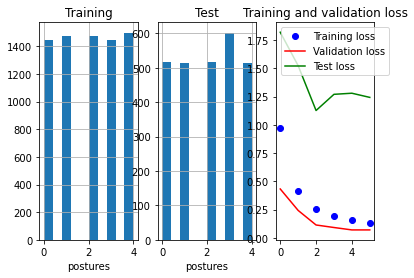

84/84 - 0s - loss: 1.2425 - accuracy: 0.7111

Test accuracy: 0.7110694050788879


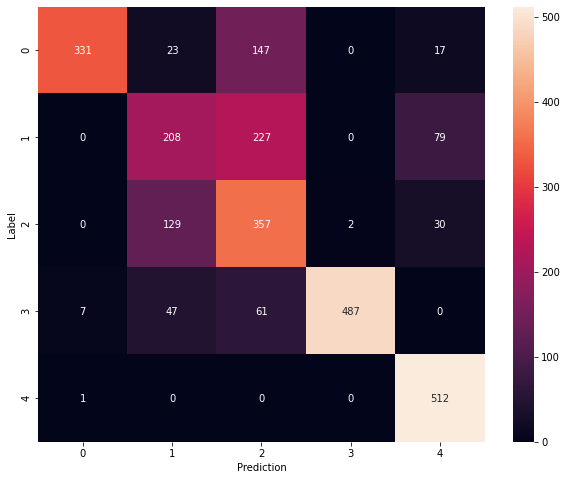

Model: "sequential_447"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_447 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_894 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3360      
_________________________________________________________________
dropout_895 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,775
Trainable params: 4,775
Non-trainable params: 0
__________________________________________________

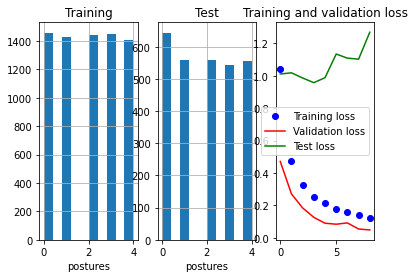

90/90 - 0s - loss: 1.2691 - accuracy: 0.7043

Test accuracy: 0.7042992115020752


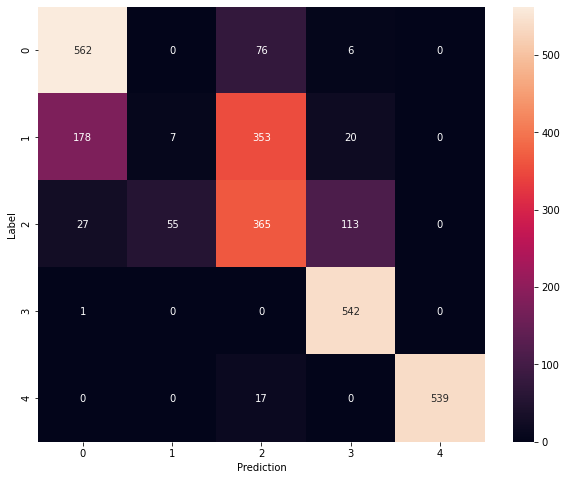

Model: "sequential_448"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_448 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_896 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3360      
_________________________________________________________________
dropout_897 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,775
Trainable params: 4,775
Non-trainable params: 0
__________________________________________________

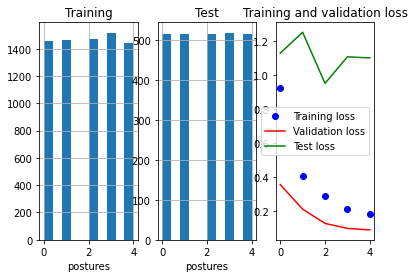

81/81 - 0s - loss: 1.0994 - accuracy: 0.6430

Test accuracy: 0.6429957151412964


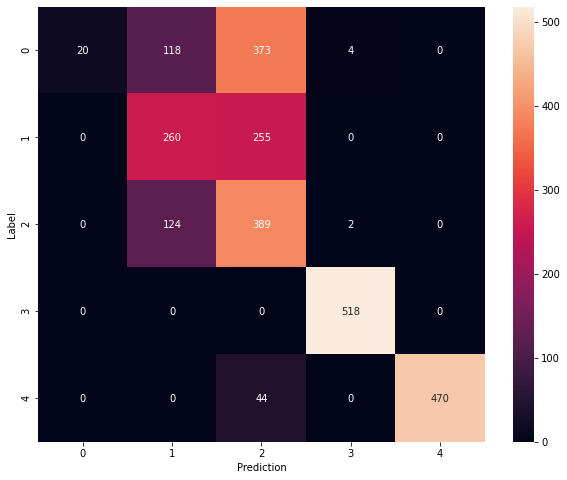

Model: "sequential_449"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_449 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_898 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3360      
_________________________________________________________________
dropout_899 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,775
Trainable params: 4,775
Non-trainable params: 0
__________________________________________________

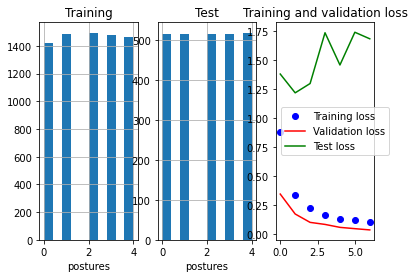

81/81 - 0s - loss: 1.6838 - accuracy: 0.6365

Test accuracy: 0.6365399360656738


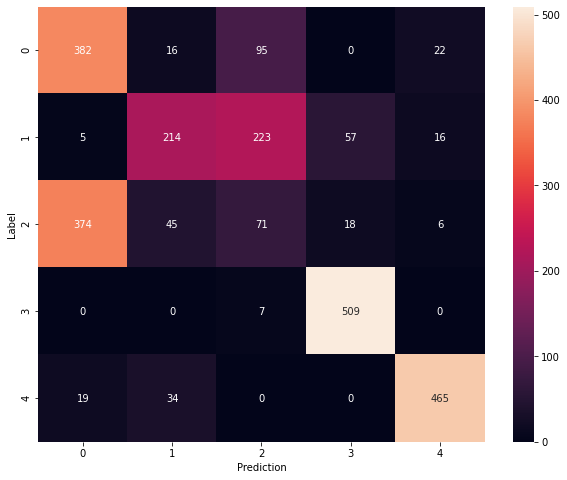

Model: "sequential_450"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_450 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_900 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3360      
_________________________________________________________________
dropout_901 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,775
Trainable params: 4,775
Non-trainable params: 0
__________________________________________________

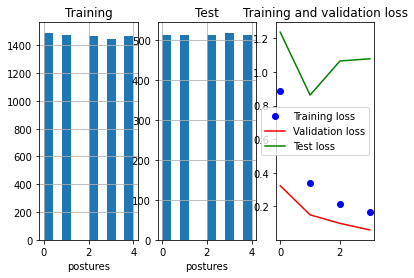

81/81 - 0s - loss: 1.0781 - accuracy: 0.7017

Test accuracy: 0.7016724944114685


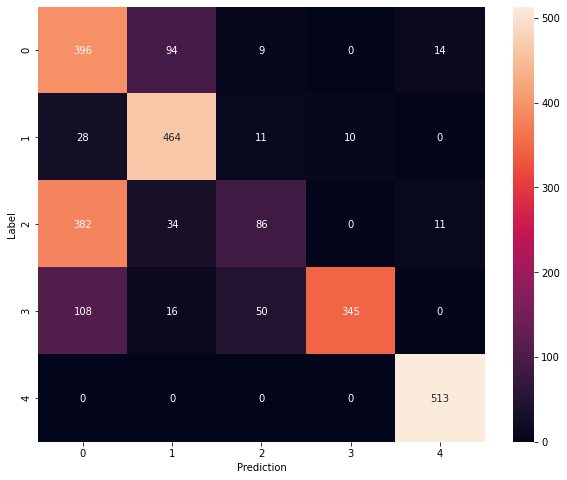

Model: "sequential_451"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_451 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_902 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3360      
_________________________________________________________________
dropout_903 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,775
Trainable params: 4,775
Non-trainable params: 0
__________________________________________________

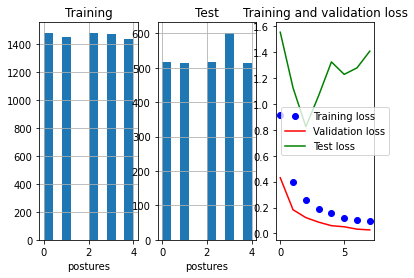

84/84 - 0s - loss: 1.4060 - accuracy: 0.6964

Test accuracy: 0.696435272693634


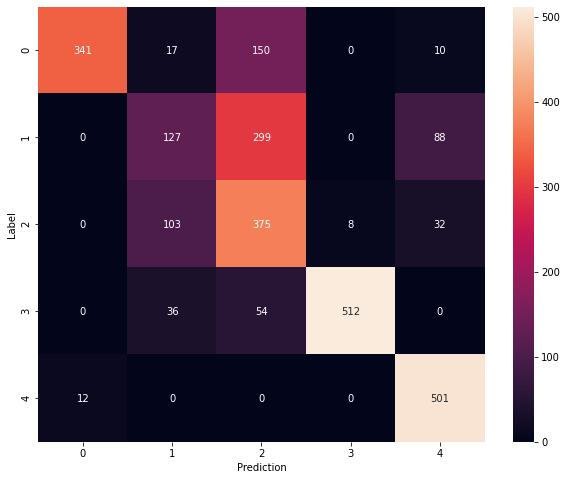

Model: "sequential_452"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_452 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_904 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3360      
_________________________________________________________________
dropout_905 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,775
Trainable params: 4,775
Non-trainable params: 0
__________________________________________________

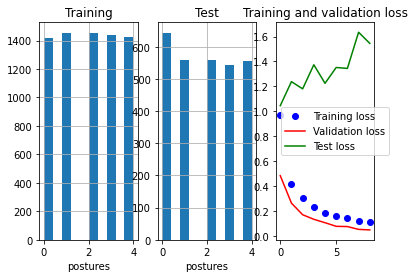

90/90 - 0s - loss: 1.5450 - accuracy: 0.7176

Test accuracy: 0.7175812721252441


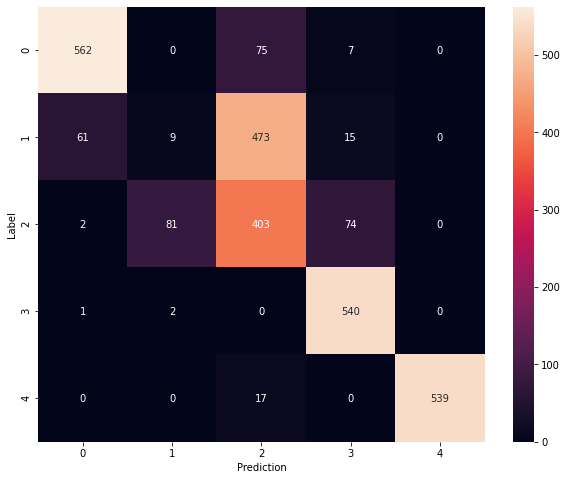

Model: "sequential_453"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_453 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_906 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3360      
_________________________________________________________________
dropout_907 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,775
Trainable params: 4,775
Non-trainable params: 0
__________________________________________________

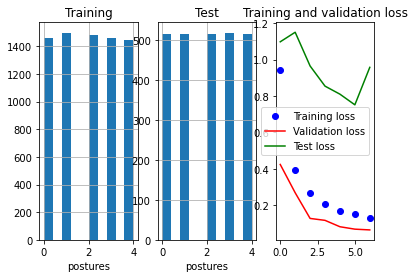

81/81 - 0s - loss: 0.9571 - accuracy: 0.7074

Test accuracy: 0.7074117064476013


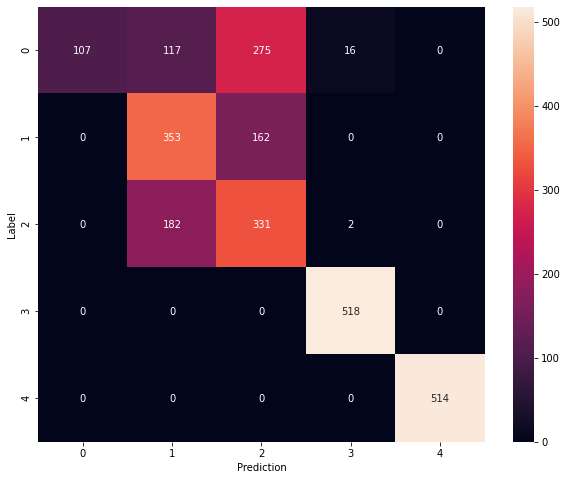

Model: "sequential_454"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_454 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_908 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3360      
_________________________________________________________________
dropout_909 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,775
Trainable params: 4,775
Non-trainable params: 0
__________________________________________________

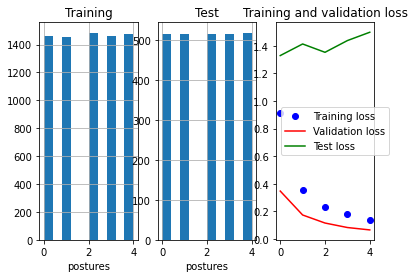

81/81 - 0s - loss: 1.4988 - accuracy: 0.5520

Test accuracy: 0.5519782900810242


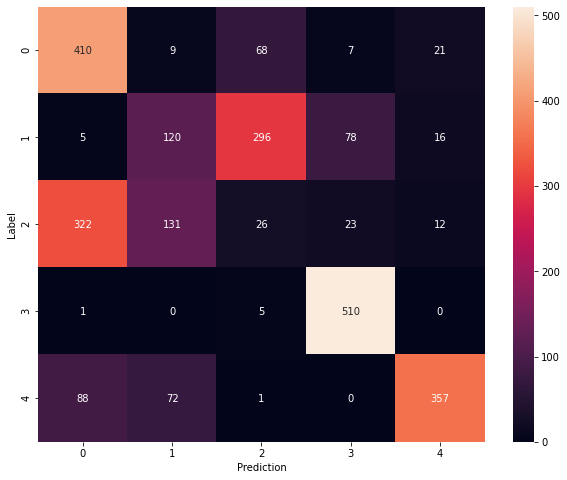

Model: "sequential_455"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_455 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_910 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3360      
_________________________________________________________________
dropout_911 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 4,775
Trainable params: 4,775
Non-trainable params: 0
__________________________________________________

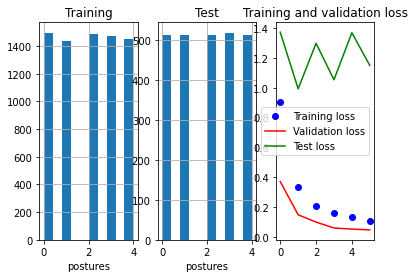

81/81 - 0s - loss: 1.1499 - accuracy: 0.7235

Test accuracy: 0.7234538793563843


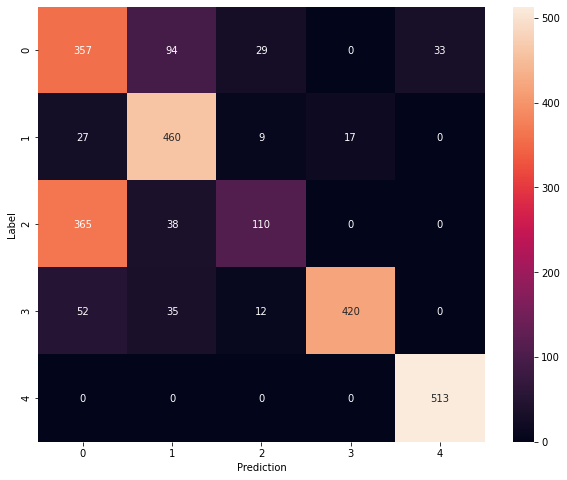

Model: "sequential_456"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_456 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_912 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3840      
_________________________________________________________________
dropout_913 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,280
Trainable params: 5,280
Non-trainable params: 0
__________________________________________________

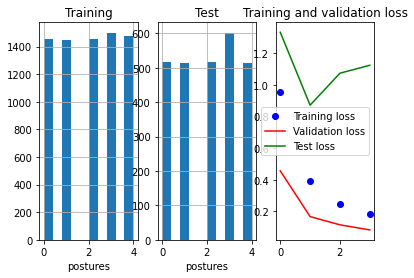

84/84 - 0s - loss: 1.1254 - accuracy: 0.6593

Test accuracy: 0.6592870354652405


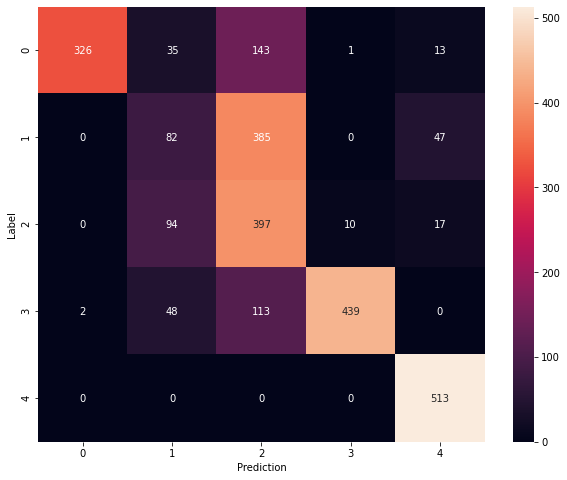

Model: "sequential_457"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_457 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_914 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3840      
_________________________________________________________________
dropout_915 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,280
Trainable params: 5,280
Non-trainable params: 0
__________________________________________________

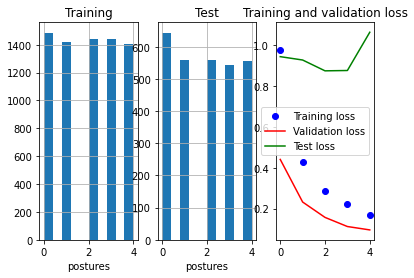

90/90 - 0s - loss: 1.0633 - accuracy: 0.6823

Test accuracy: 0.6822789311408997


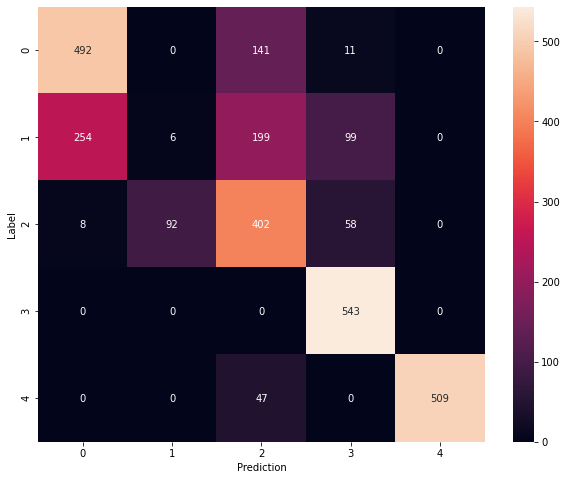

Model: "sequential_458"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_458 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_916 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3840      
_________________________________________________________________
dropout_917 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,280
Trainable params: 5,280
Non-trainable params: 0
__________________________________________________

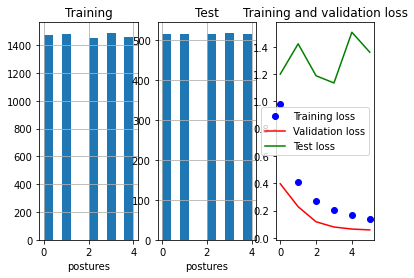

81/81 - 0s - loss: 1.3594 - accuracy: 0.6302

Test accuracy: 0.6301901340484619


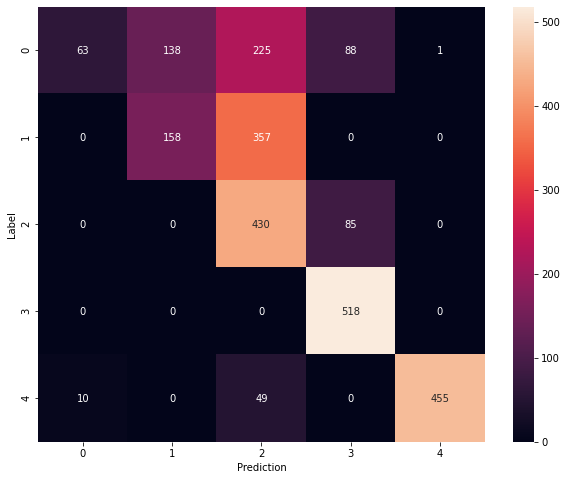

Model: "sequential_459"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_459 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_918 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3840      
_________________________________________________________________
dropout_919 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,280
Trainable params: 5,280
Non-trainable params: 0
__________________________________________________

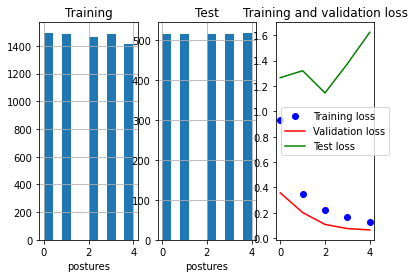

81/81 - 0s - loss: 1.6228 - accuracy: 0.5617

Test accuracy: 0.5616757273674011


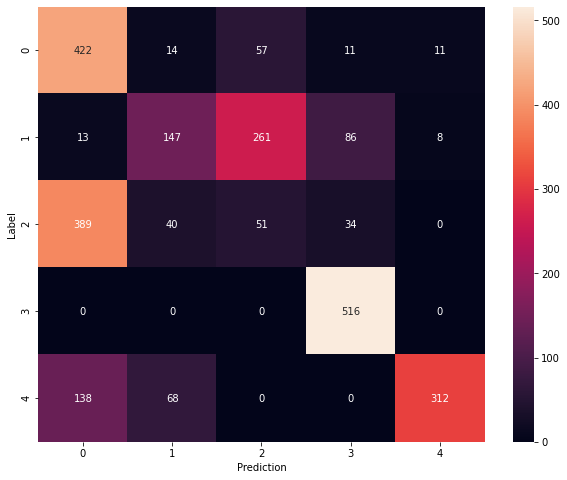

Model: "sequential_460"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_460 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_920 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3840      
_________________________________________________________________
dropout_921 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,280
Trainable params: 5,280
Non-trainable params: 0
__________________________________________________

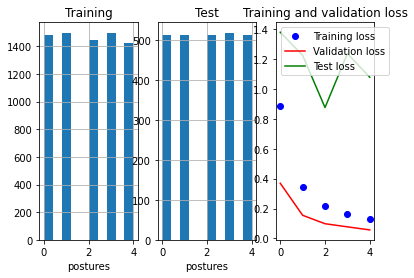

81/81 - 0s - loss: 1.0792 - accuracy: 0.7184

Test accuracy: 0.7183974981307983


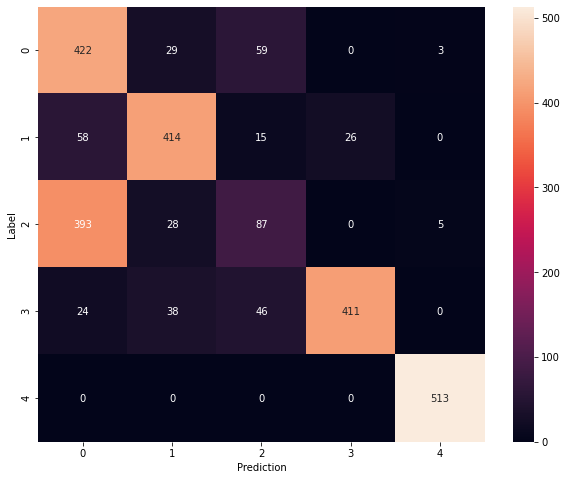

Model: "sequential_461"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_461 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_922 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3840      
_________________________________________________________________
dropout_923 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,280
Trainable params: 5,280
Non-trainable params: 0
__________________________________________________

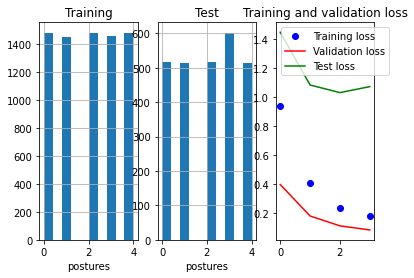

84/84 - 0s - loss: 1.0716 - accuracy: 0.6499

Test accuracy: 0.6499062180519104


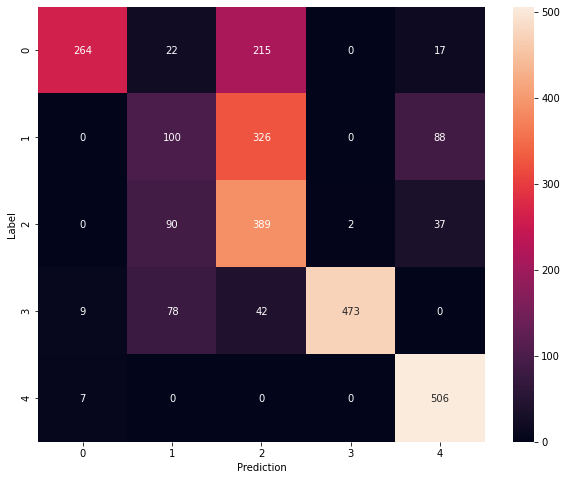

Model: "sequential_462"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_462 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_924 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3840      
_________________________________________________________________
dropout_925 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,280
Trainable params: 5,280
Non-trainable params: 0
__________________________________________________

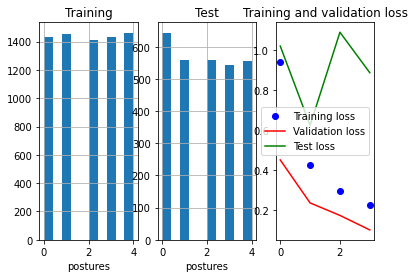

90/90 - 0s - loss: 0.8881 - accuracy: 0.7095

Test accuracy: 0.7095420956611633


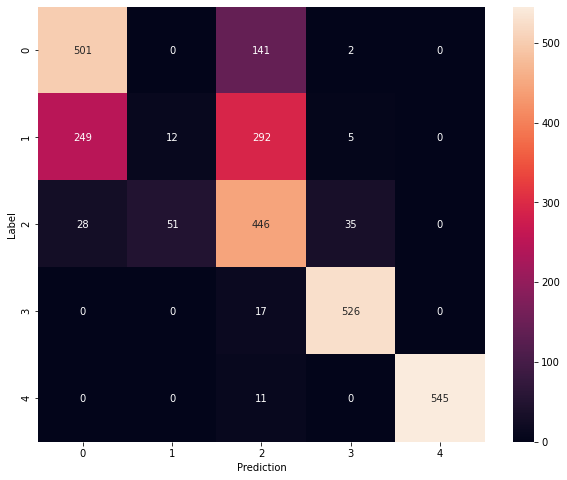

Model: "sequential_463"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_463 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_926 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3840      
_________________________________________________________________
dropout_927 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,280
Trainable params: 5,280
Non-trainable params: 0
__________________________________________________

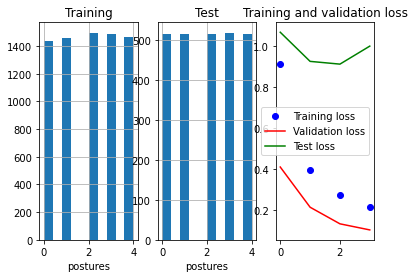

81/81 - 0s - loss: 1.0002 - accuracy: 0.7117

Test accuracy: 0.7116802334785461


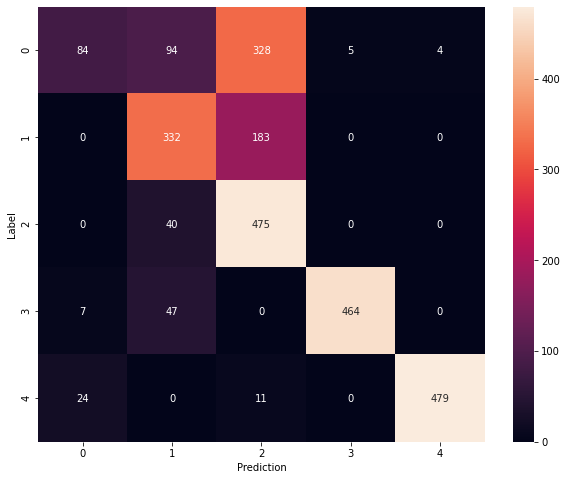

Model: "sequential_464"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_464 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_928 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3840      
_________________________________________________________________
dropout_929 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,280
Trainable params: 5,280
Non-trainable params: 0
__________________________________________________

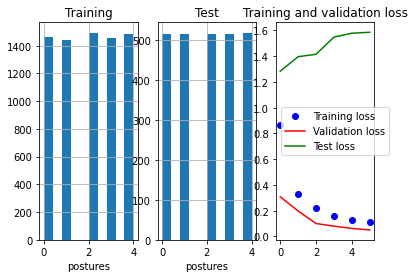

81/81 - 0s - loss: 1.5857 - accuracy: 0.5877

Test accuracy: 0.5876648426055908


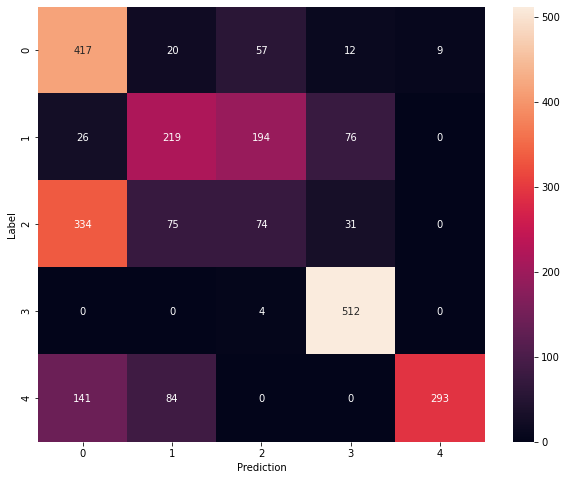

Model: "sequential_465"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_465 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 95)                1235      
_________________________________________________________________
dropout_930 (Dropout)        (None, 95)                0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                3840      
_________________________________________________________________
dropout_931 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,280
Trainable params: 5,280
Non-trainable params: 0
__________________________________________________

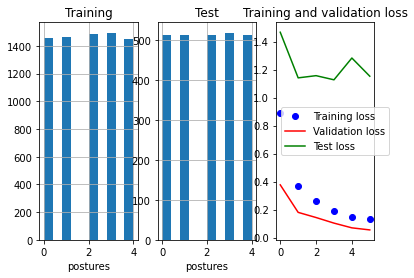

81/81 - 0s - loss: 1.1530 - accuracy: 0.6698

Test accuracy: 0.6697782874107361


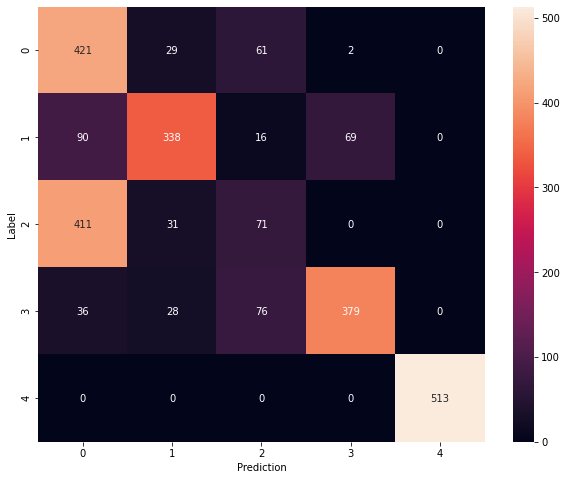

Model: "sequential_466"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_466 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_932 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3030      
_________________________________________________________________
dropout_933 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,485
Trainable params: 4,485
Non-trainable params: 0
__________________________________________________

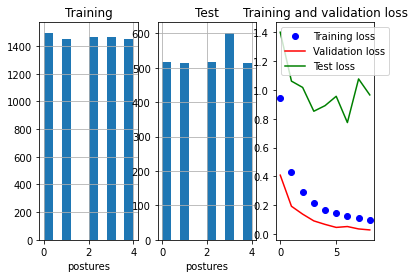

84/84 - 0s - loss: 0.9644 - accuracy: 0.7122

Test accuracy: 0.712195098400116


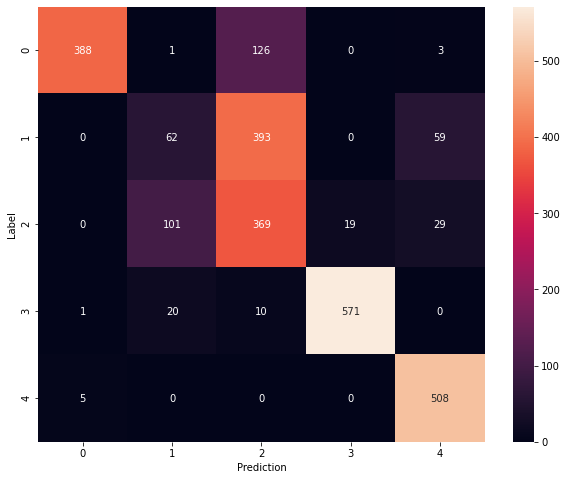

Model: "sequential_467"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_467 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_934 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3030      
_________________________________________________________________
dropout_935 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,485
Trainable params: 4,485
Non-trainable params: 0
__________________________________________________

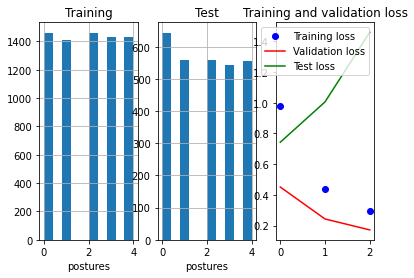

90/90 - 0s - loss: 1.4592 - accuracy: 0.5739

Test accuracy: 0.5739251971244812


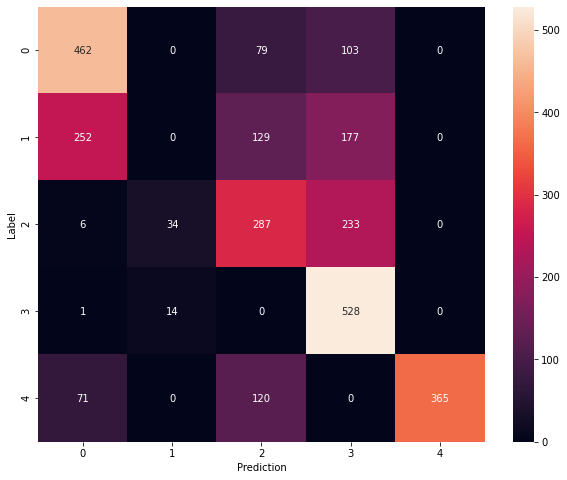

Model: "sequential_468"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_468 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_936 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3030      
_________________________________________________________________
dropout_937 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,485
Trainable params: 4,485
Non-trainable params: 0
__________________________________________________

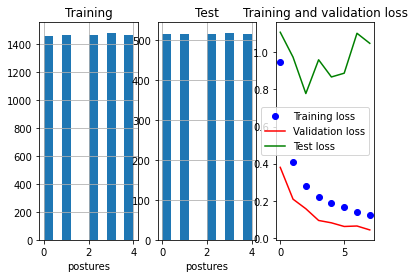

81/81 - 0s - loss: 1.0486 - accuracy: 0.6993

Test accuracy: 0.6992627382278442


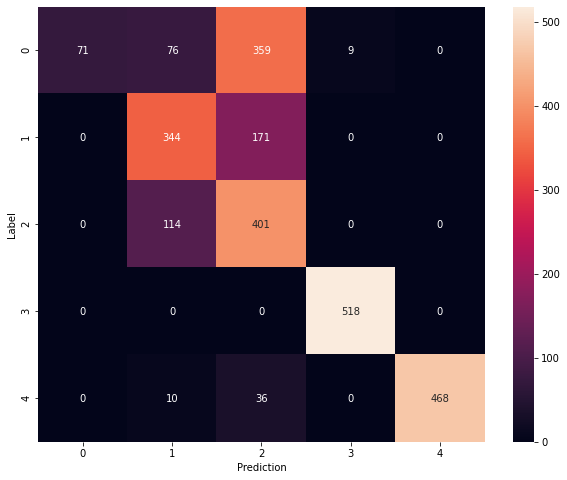

Model: "sequential_469"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_469 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_938 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3030      
_________________________________________________________________
dropout_939 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,485
Trainable params: 4,485
Non-trainable params: 0
__________________________________________________

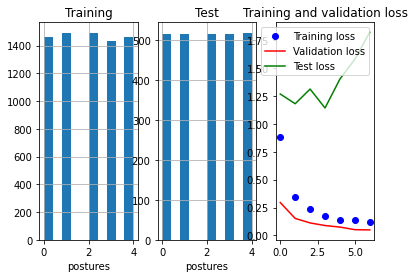

81/81 - 0s - loss: 1.8197 - accuracy: 0.5710

Test accuracy: 0.5709852576255798


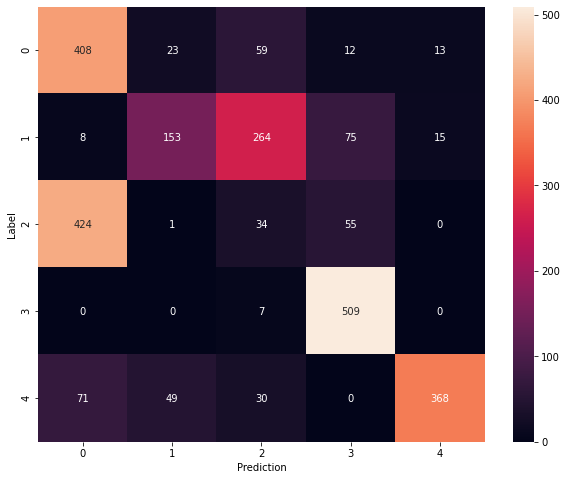

Model: "sequential_470"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_470 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_940 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3030      
_________________________________________________________________
dropout_941 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,485
Trainable params: 4,485
Non-trainable params: 0
__________________________________________________

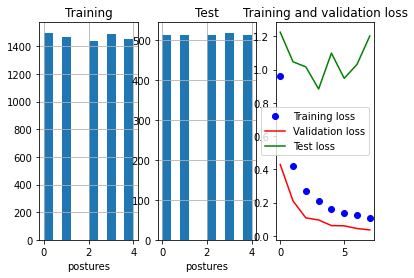

81/81 - 0s - loss: 1.2020 - accuracy: 0.7079

Test accuracy: 0.7078957557678223


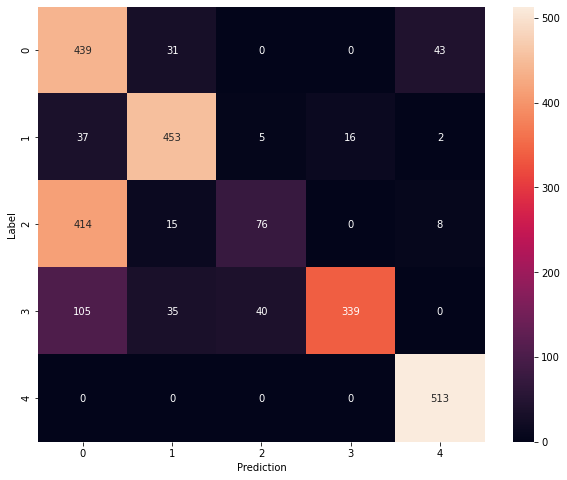

Model: "sequential_471"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_471 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_942 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3030      
_________________________________________________________________
dropout_943 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,485
Trainable params: 4,485
Non-trainable params: 0
__________________________________________________

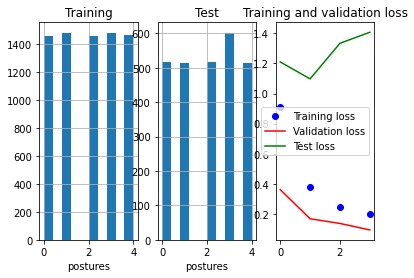

84/84 - 0s - loss: 1.4076 - accuracy: 0.6225

Test accuracy: 0.6225140690803528


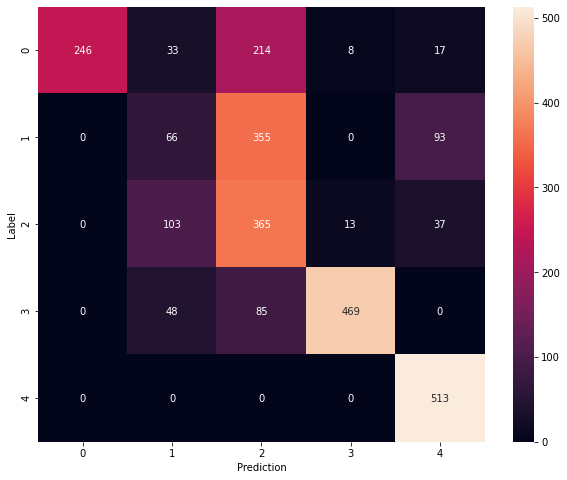

Model: "sequential_472"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_472 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_944 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3030      
_________________________________________________________________
dropout_945 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,485
Trainable params: 4,485
Non-trainable params: 0
__________________________________________________

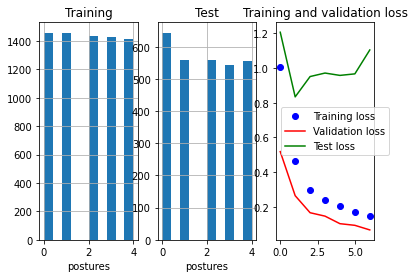

90/90 - 0s - loss: 1.1032 - accuracy: 0.6858

Test accuracy: 0.6857742071151733


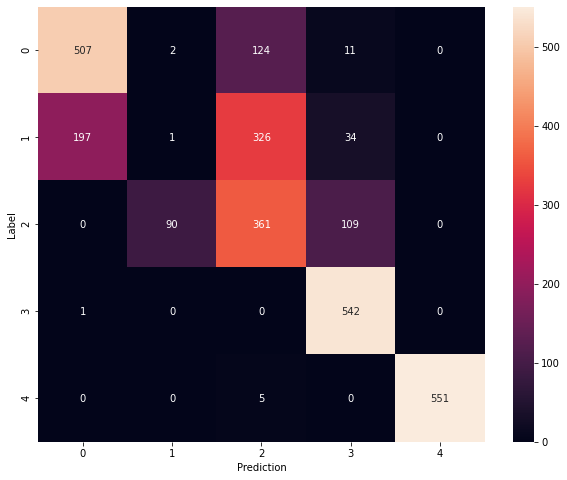

Model: "sequential_473"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_473 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_946 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3030      
_________________________________________________________________
dropout_947 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,485
Trainable params: 4,485
Non-trainable params: 0
__________________________________________________

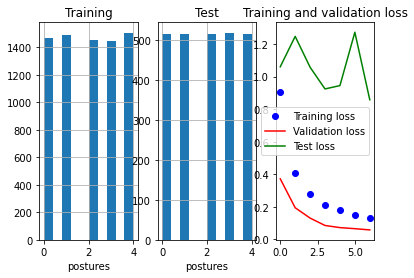

81/81 - 0s - loss: 0.8578 - accuracy: 0.6802

Test accuracy: 0.6802483797073364


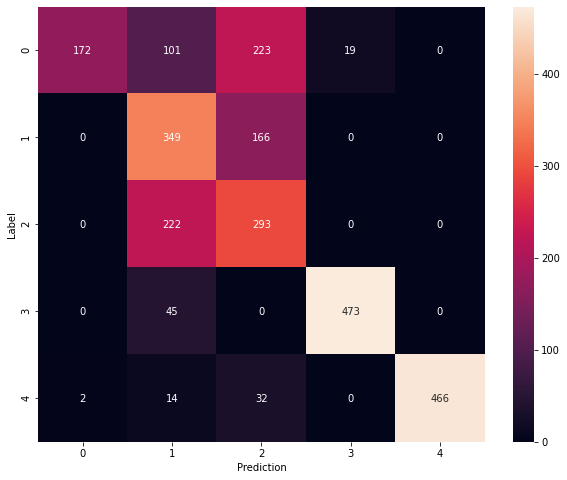

Model: "sequential_474"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_474 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_948 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3030      
_________________________________________________________________
dropout_949 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,485
Trainable params: 4,485
Non-trainable params: 0
__________________________________________________

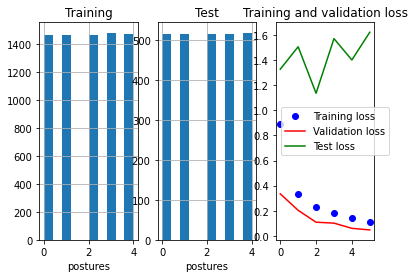

81/81 - 0s - loss: 1.6224 - accuracy: 0.5830

Test accuracy: 0.5830100774765015


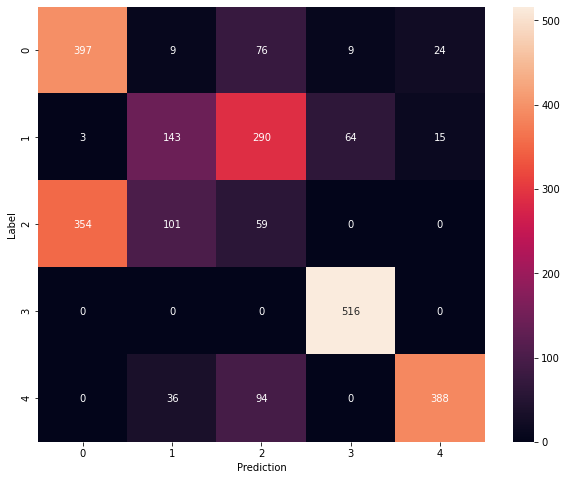

Model: "sequential_475"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_475 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_950 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3030      
_________________________________________________________________
dropout_951 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,485
Trainable params: 4,485
Non-trainable params: 0
__________________________________________________

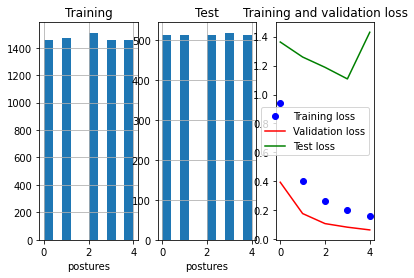

81/81 - 0s - loss: 1.4303 - accuracy: 0.5963

Test accuracy: 0.5962660312652588


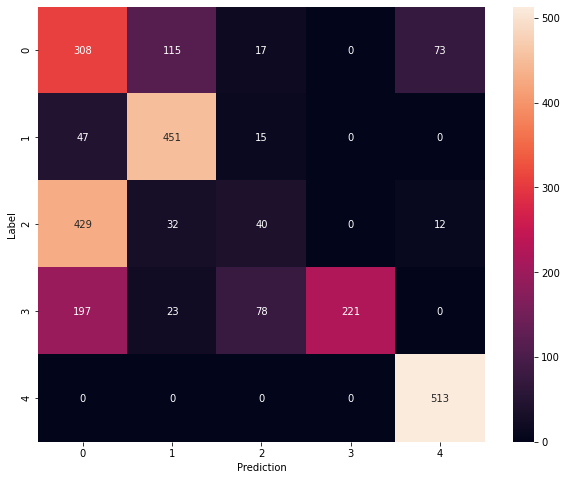

Model: "sequential_476"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_476 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_952 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3535      
_________________________________________________________________
dropout_953 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,015
Trainable params: 5,015
Non-trainable params: 0
__________________________________________________

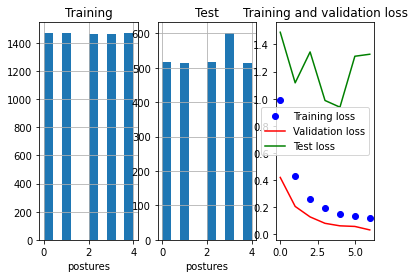

84/84 - 0s - loss: 1.3276 - accuracy: 0.6533

Test accuracy: 0.6532832980155945


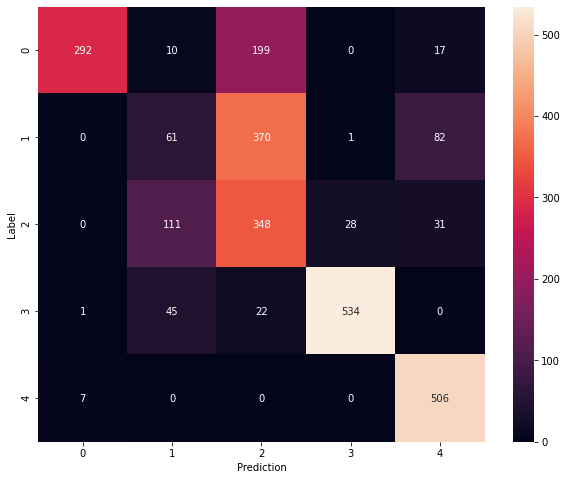

Model: "sequential_477"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_477 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_954 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3535      
_________________________________________________________________
dropout_955 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,015
Trainable params: 5,015
Non-trainable params: 0
__________________________________________________

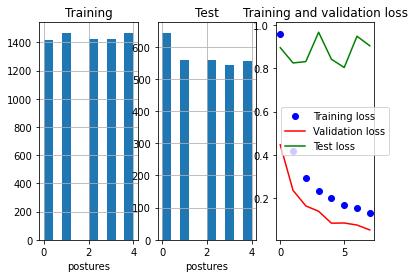

90/90 - 0s - loss: 0.9033 - accuracy: 0.7078

Test accuracy: 0.7077944874763489


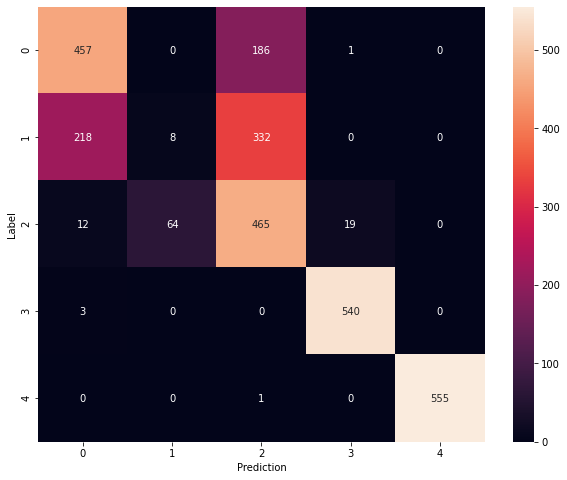

Model: "sequential_478"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_478 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_956 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3535      
_________________________________________________________________
dropout_957 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,015
Trainable params: 5,015
Non-trainable params: 0
__________________________________________________

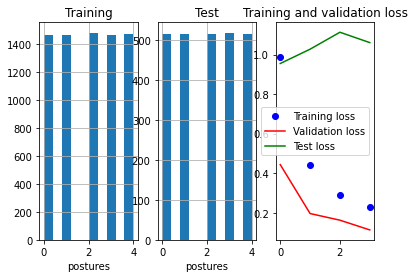

81/81 - 0s - loss: 1.0606 - accuracy: 0.7016

Test accuracy: 0.7015910148620605


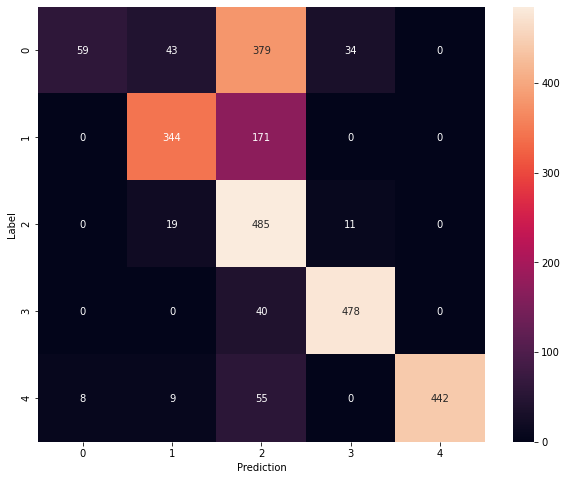

Model: "sequential_479"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_479 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_958 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3535      
_________________________________________________________________
dropout_959 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,015
Trainable params: 5,015
Non-trainable params: 0
__________________________________________________

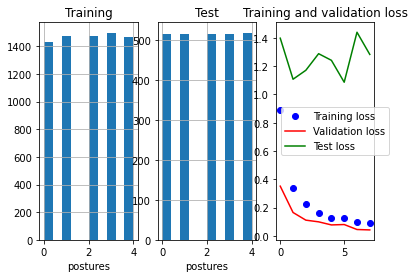

81/81 - 0s - loss: 1.2831 - accuracy: 0.5943

Test accuracy: 0.5942591428756714


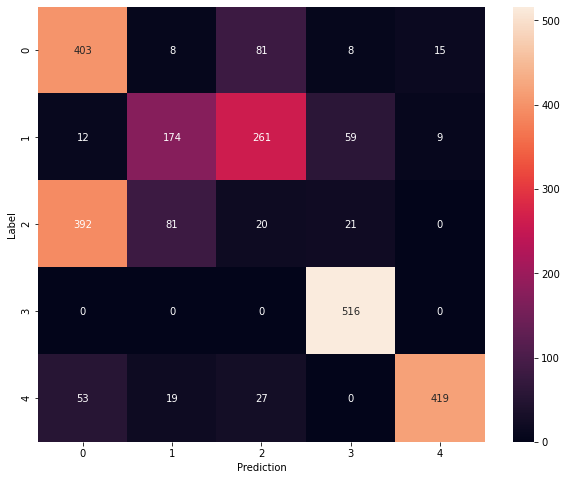

Model: "sequential_480"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_480 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_960 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3535      
_________________________________________________________________
dropout_961 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,015
Trainable params: 5,015
Non-trainable params: 0
__________________________________________________

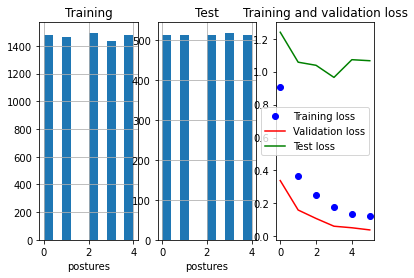

81/81 - 0s - loss: 1.0663 - accuracy: 0.7246

Test accuracy: 0.7246207594871521


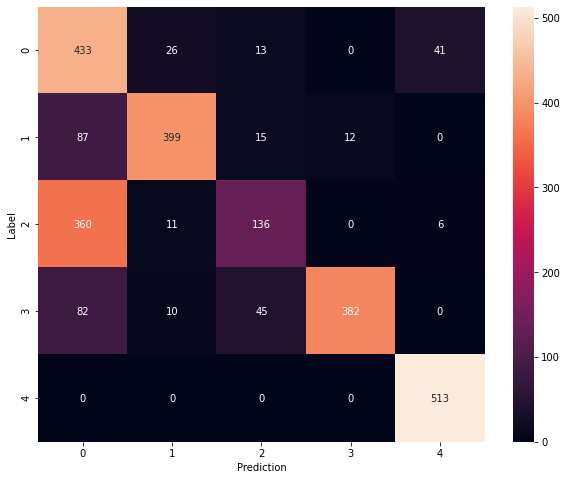

Model: "sequential_481"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_481 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_962 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3535      
_________________________________________________________________
dropout_963 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,015
Trainable params: 5,015
Non-trainable params: 0
__________________________________________________

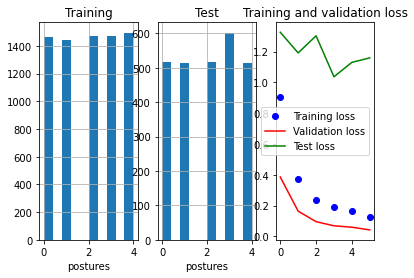

84/84 - 0s - loss: 1.1586 - accuracy: 0.6522

Test accuracy: 0.6521576046943665


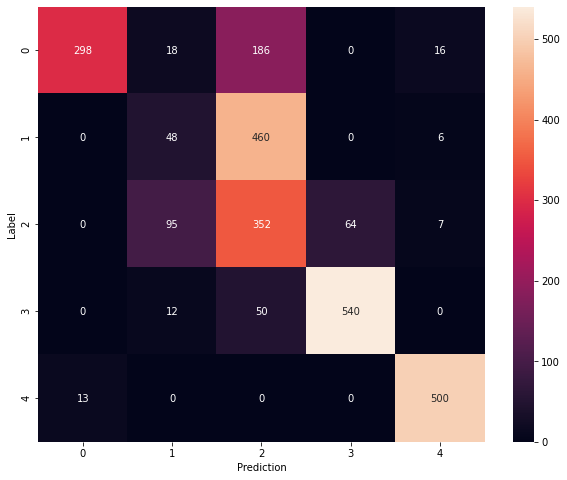

Model: "sequential_482"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_482 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_964 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3535      
_________________________________________________________________
dropout_965 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,015
Trainable params: 5,015
Non-trainable params: 0
__________________________________________________

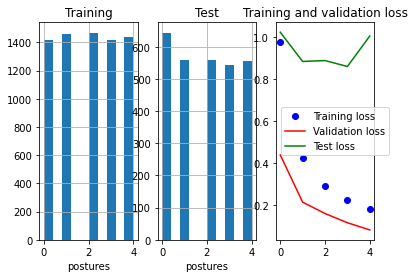

90/90 - 0s - loss: 1.0047 - accuracy: 0.7249

Test accuracy: 0.7249213457107544


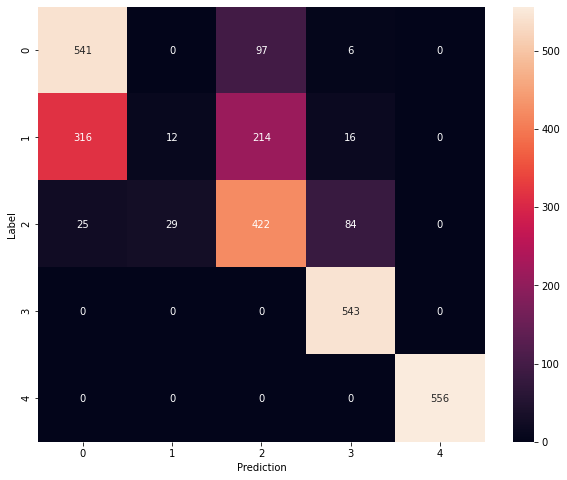

Model: "sequential_483"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_483 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_966 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3535      
_________________________________________________________________
dropout_967 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,015
Trainable params: 5,015
Non-trainable params: 0
__________________________________________________

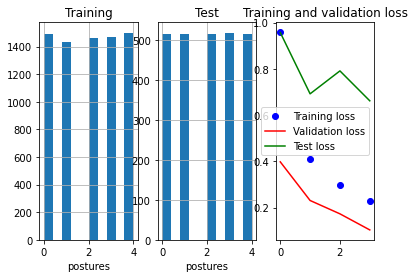

81/81 - 0s - loss: 0.6618 - accuracy: 0.7051

Test accuracy: 0.705083429813385


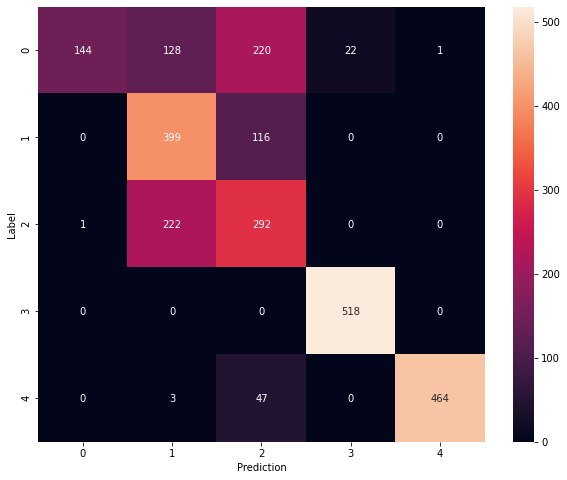

Model: "sequential_484"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_484 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_968 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3535      
_________________________________________________________________
dropout_969 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,015
Trainable params: 5,015
Non-trainable params: 0
__________________________________________________

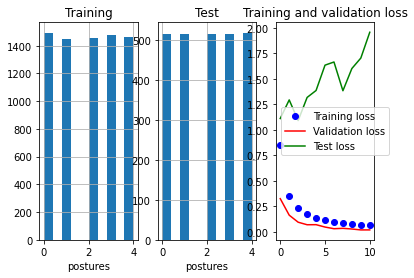

81/81 - 0s - loss: 1.9581 - accuracy: 0.6268

Test accuracy: 0.6268424987792969


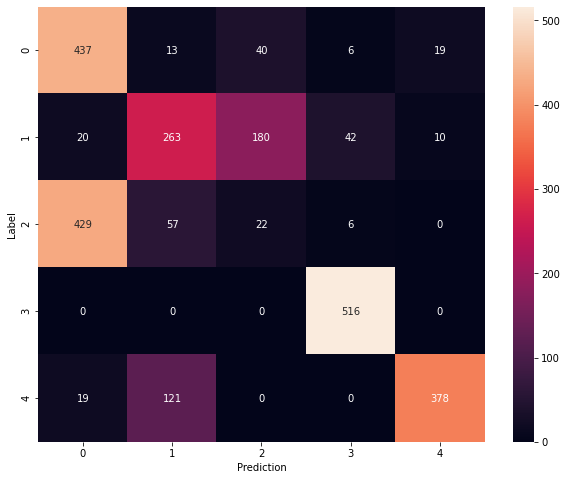

Model: "sequential_485"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_485 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_970 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3535      
_________________________________________________________________
dropout_971 (Dropout)        (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,015
Trainable params: 5,015
Non-trainable params: 0
__________________________________________________

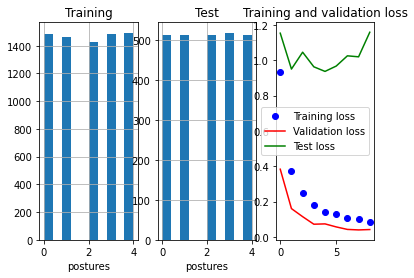

81/81 - 0s - loss: 1.1578 - accuracy: 0.7153

Test accuracy: 0.7152858972549438


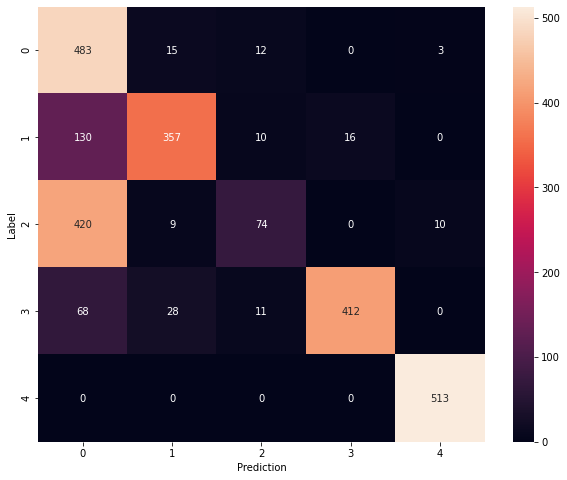

Model: "sequential_486"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_486 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_972 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4040      
_________________________________________________________________
dropout_973 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,545
Trainable params: 5,545
Non-trainable params: 0
__________________________________________________

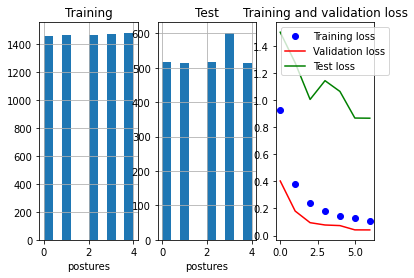

84/84 - 0s - loss: 0.8654 - accuracy: 0.7208

Test accuracy: 0.7208254933357239


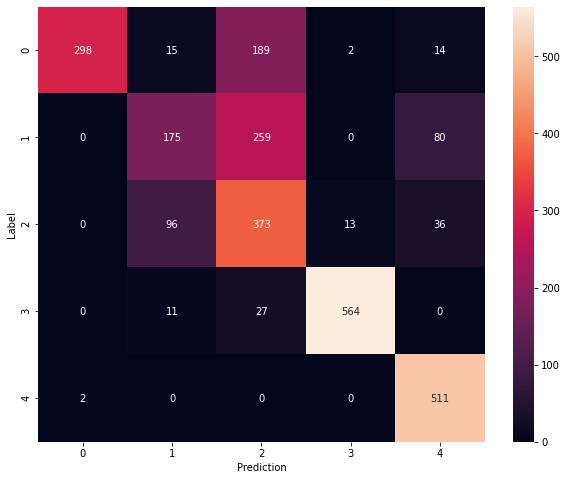

Model: "sequential_487"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_487 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_974 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4040      
_________________________________________________________________
dropout_975 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,545
Trainable params: 5,545
Non-trainable params: 0
__________________________________________________

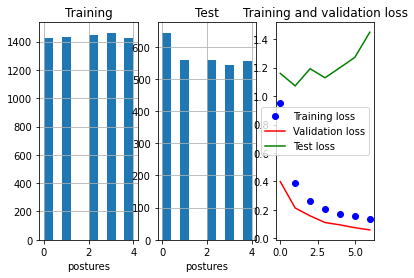

90/90 - 0s - loss: 1.4489 - accuracy: 0.6777

Test accuracy: 0.6777350306510925


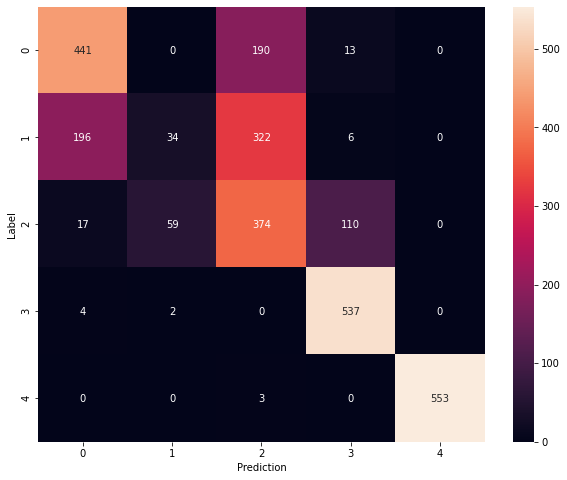

Model: "sequential_488"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_488 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_976 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4040      
_________________________________________________________________
dropout_977 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,545
Trainable params: 5,545
Non-trainable params: 0
__________________________________________________

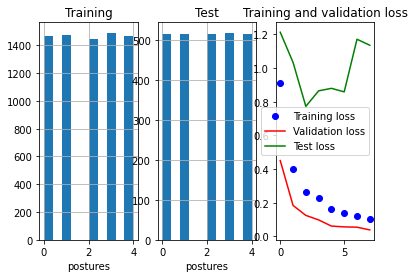

81/81 - 0s - loss: 1.1350 - accuracy: 0.6632

Test accuracy: 0.6631742119789124


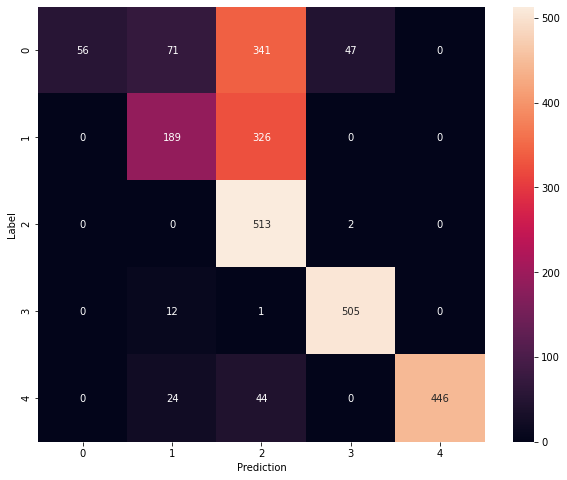

Model: "sequential_489"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_489 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_978 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4040      
_________________________________________________________________
dropout_979 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,545
Trainable params: 5,545
Non-trainable params: 0
__________________________________________________

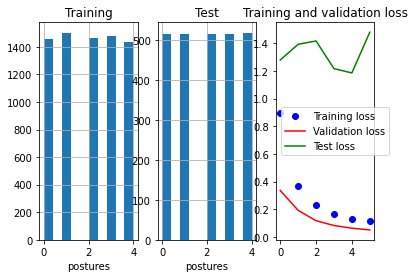

81/81 - 0s - loss: 1.4806 - accuracy: 0.5791

Test accuracy: 0.5791311264038086


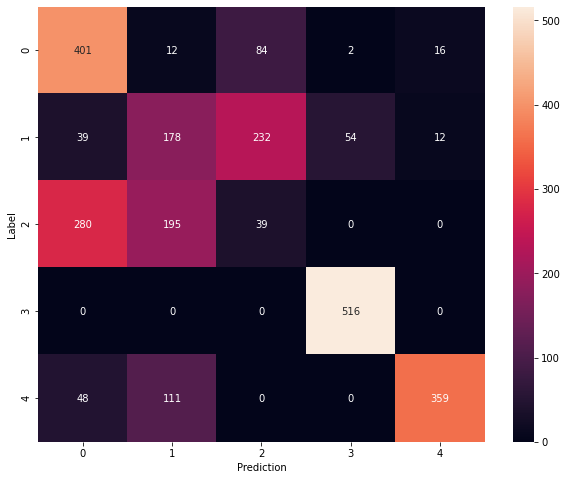

Model: "sequential_490"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_490 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_980 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4040      
_________________________________________________________________
dropout_981 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,545
Trainable params: 5,545
Non-trainable params: 0
__________________________________________________

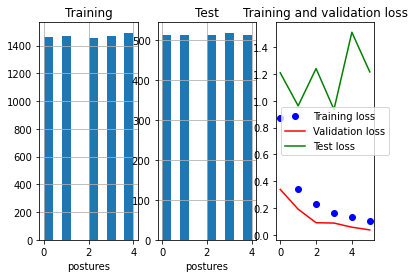

81/81 - 0s - loss: 1.2154 - accuracy: 0.6916

Test accuracy: 0.6915597319602966


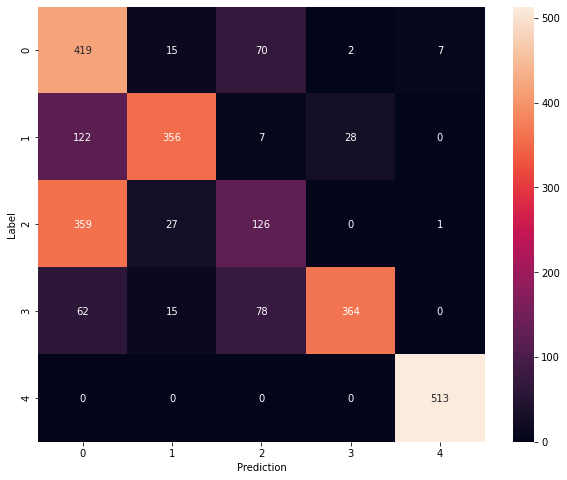

Model: "sequential_491"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_491 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_982 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4040      
_________________________________________________________________
dropout_983 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,545
Trainable params: 5,545
Non-trainable params: 0
__________________________________________________

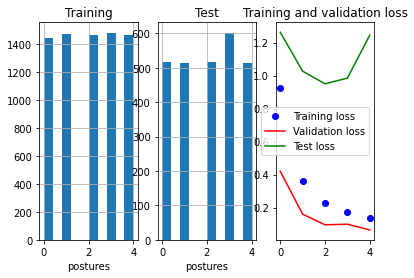

84/84 - 0s - loss: 1.2453 - accuracy: 0.6822

Test accuracy: 0.6821763515472412


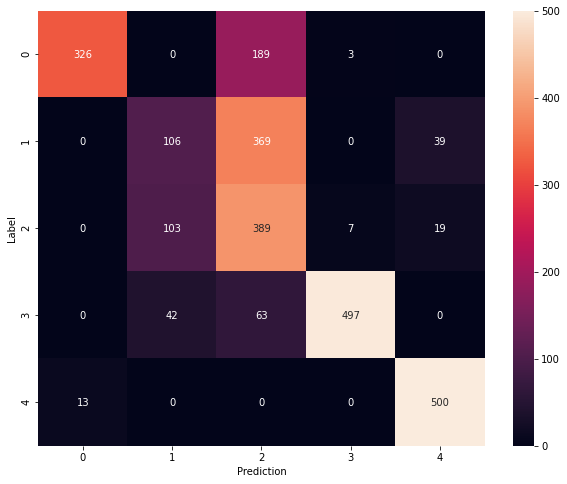

Model: "sequential_492"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_492 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_984 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4040      
_________________________________________________________________
dropout_985 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,545
Trainable params: 5,545
Non-trainable params: 0
__________________________________________________

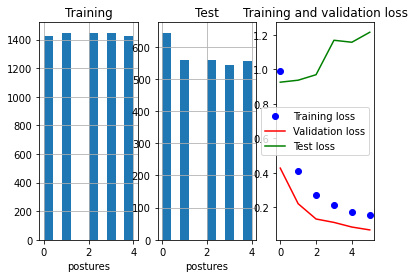

90/90 - 0s - loss: 1.2147 - accuracy: 0.6526

Test accuracy: 0.652569055557251


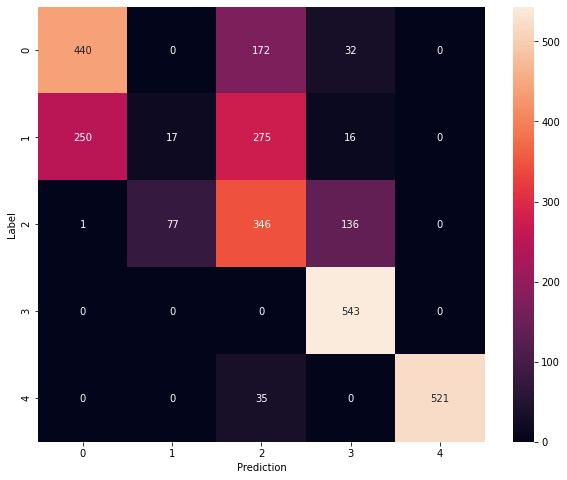

Model: "sequential_493"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_493 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_986 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4040      
_________________________________________________________________
dropout_987 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,545
Trainable params: 5,545
Non-trainable params: 0
__________________________________________________

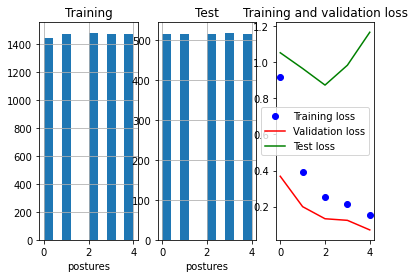

81/81 - 0s - loss: 1.1664 - accuracy: 0.6057

Test accuracy: 0.6057431101799011


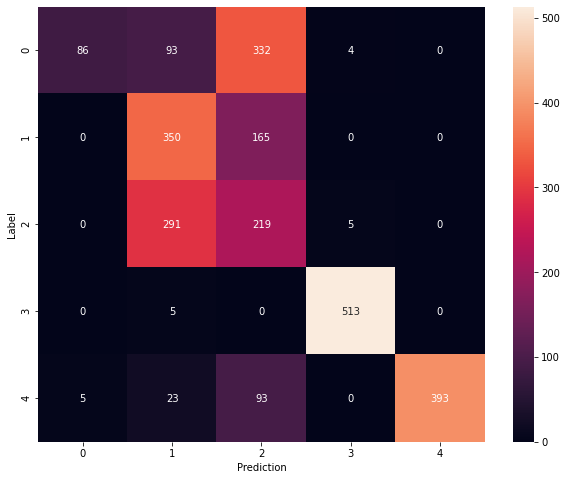

Model: "sequential_494"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_494 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_988 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4040      
_________________________________________________________________
dropout_989 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,545
Trainable params: 5,545
Non-trainable params: 0
__________________________________________________

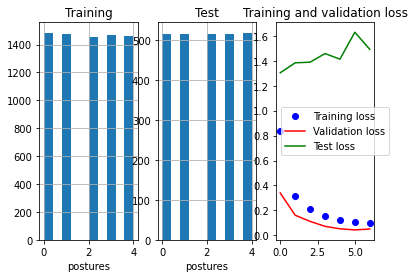

81/81 - 0s - loss: 1.4917 - accuracy: 0.6505

Test accuracy: 0.6505042910575867


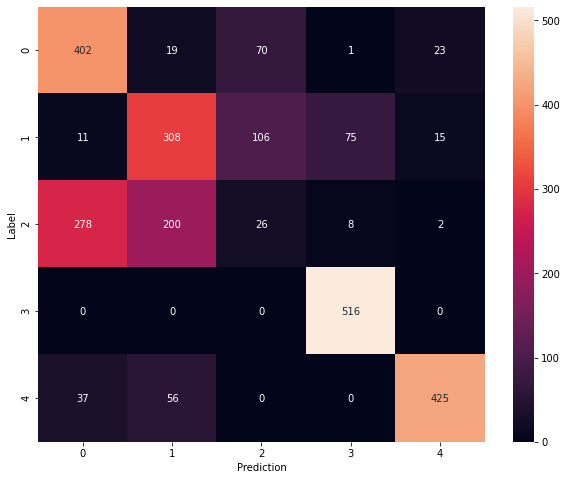

Model: "sequential_495"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_495 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 100)               1300      
_________________________________________________________________
dropout_990 (Dropout)        (None, 100)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4040      
_________________________________________________________________
dropout_991 (Dropout)        (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,545
Trainable params: 5,545
Non-trainable params: 0
__________________________________________________

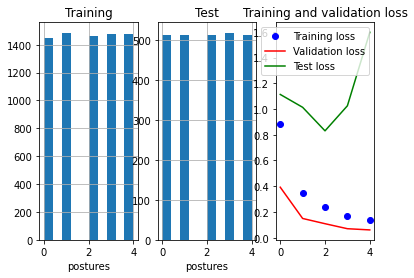

81/81 - 0s - loss: 1.5964 - accuracy: 0.6449

Test accuracy: 0.644885241985321


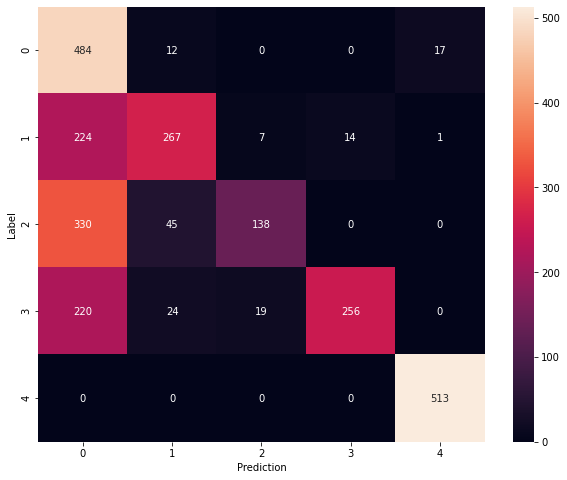

Model: "sequential_496"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_496 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_992 (Dropout)        (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3180      
_________________________________________________________________
dropout_993 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,700
Trainable params: 4,700
Non-trainable params: 0
__________________________________________________

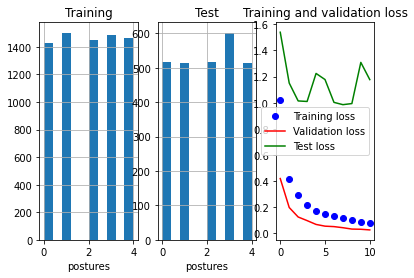

84/84 - 0s - loss: 1.1766 - accuracy: 0.7077

Test accuracy: 0.7076923251152039


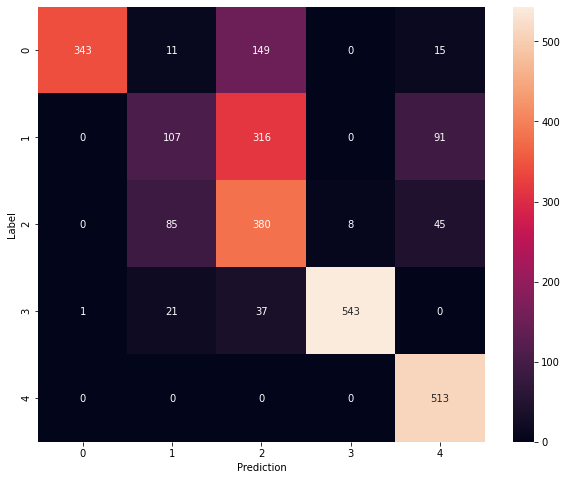

Model: "sequential_497"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_497 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_994 (Dropout)        (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3180      
_________________________________________________________________
dropout_995 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,700
Trainable params: 4,700
Non-trainable params: 0
__________________________________________________

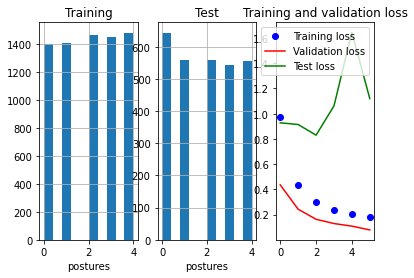

90/90 - 0s - loss: 1.1200 - accuracy: 0.7046

Test accuracy: 0.7046487331390381


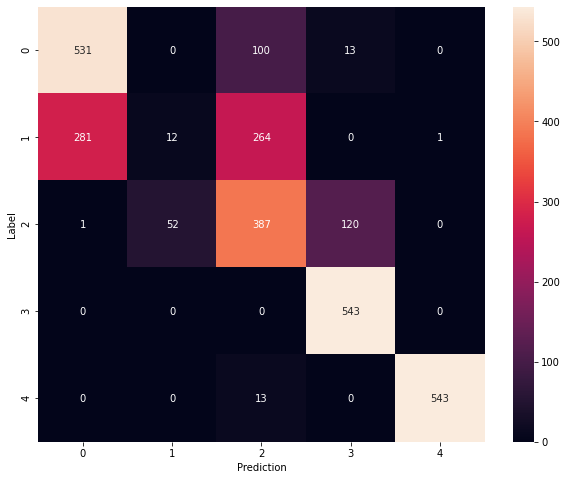

Model: "sequential_498"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_498 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_996 (Dropout)        (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3180      
_________________________________________________________________
dropout_997 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,700
Trainable params: 4,700
Non-trainable params: 0
__________________________________________________

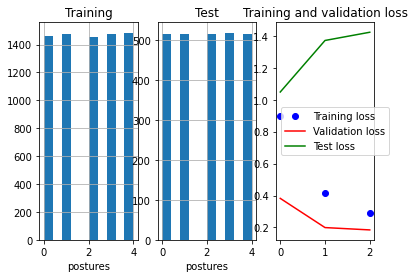

81/81 - 0s - loss: 1.4221 - accuracy: 0.5867

Test accuracy: 0.5867287516593933


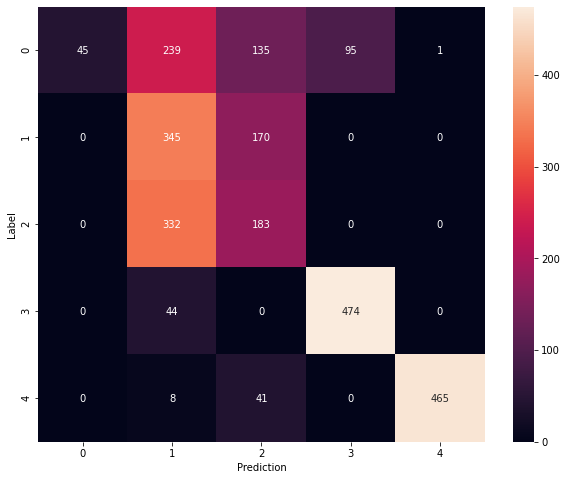

Model: "sequential_499"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_499 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_998 (Dropout)        (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3180      
_________________________________________________________________
dropout_999 (Dropout)        (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,700
Trainable params: 4,700
Non-trainable params: 0
__________________________________________________

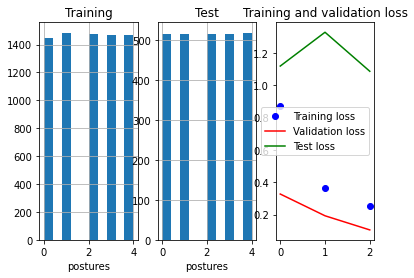

81/81 - 0s - loss: 1.0855 - accuracy: 0.5912

Test accuracy: 0.5911559462547302


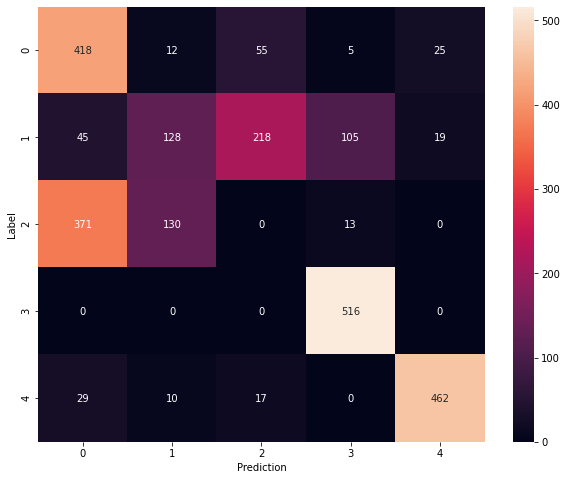

Model: "sequential_500"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_500 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1000 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3180      
_________________________________________________________________
dropout_1001 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,700
Trainable params: 4,700
Non-trainable params: 0
__________________________________________________

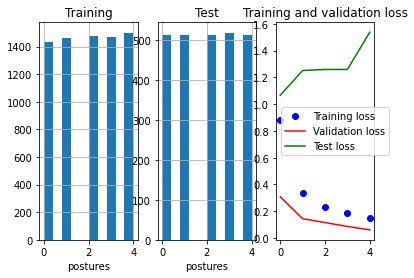

81/81 - 0s - loss: 1.5370 - accuracy: 0.6445

Test accuracy: 0.6444963216781616


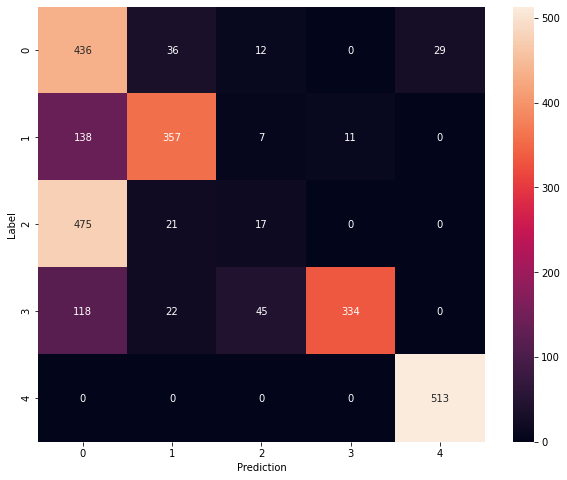

Model: "sequential_501"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_501 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1002 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3180      
_________________________________________________________________
dropout_1003 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,700
Trainable params: 4,700
Non-trainable params: 0
__________________________________________________

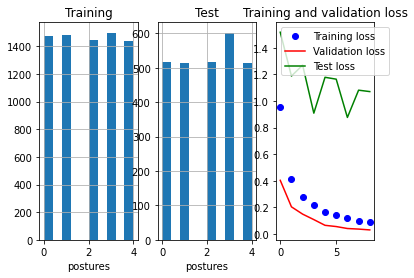

84/84 - 0s - loss: 1.0703 - accuracy: 0.7471

Test accuracy: 0.7470919489860535


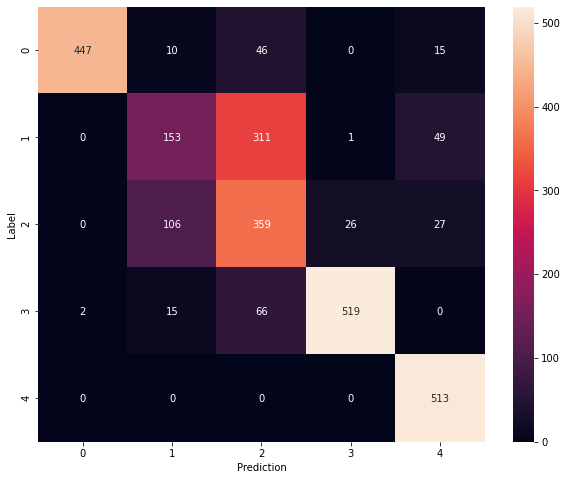

Model: "sequential_502"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_502 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1004 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3180      
_________________________________________________________________
dropout_1005 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,700
Trainable params: 4,700
Non-trainable params: 0
__________________________________________________

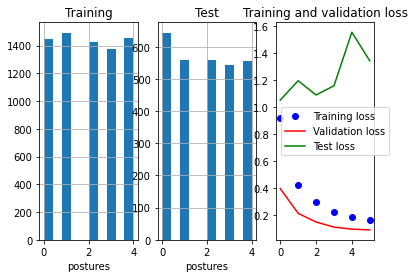

90/90 - 0s - loss: 1.3404 - accuracy: 0.6686

Test accuracy: 0.6686473488807678


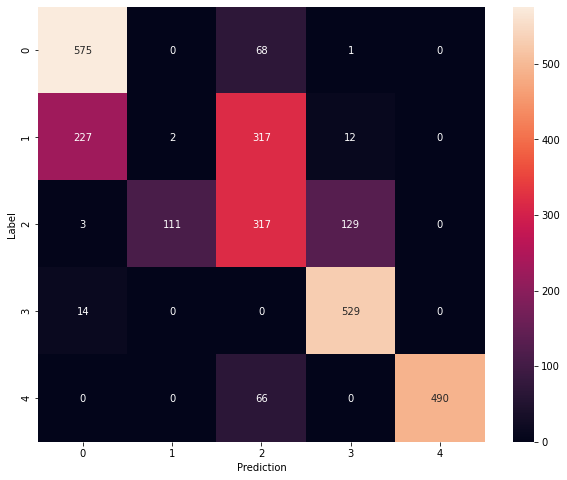

Model: "sequential_503"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_503 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1006 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3180      
_________________________________________________________________
dropout_1007 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,700
Trainable params: 4,700
Non-trainable params: 0
__________________________________________________

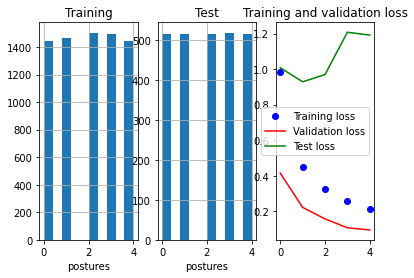

81/81 - 0s - loss: 1.1913 - accuracy: 0.7136

Test accuracy: 0.7136204838752747


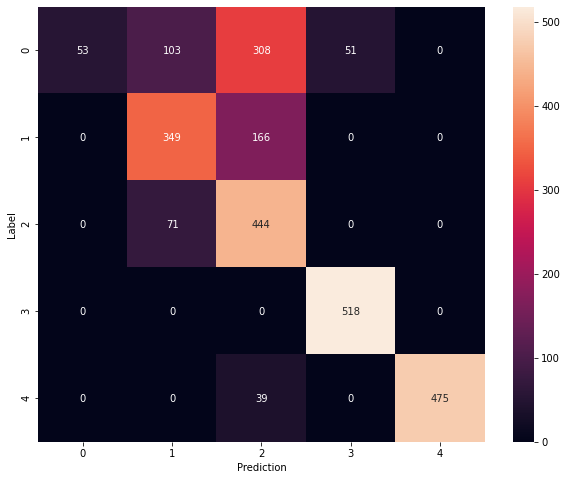

Model: "sequential_504"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_504 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1008 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3180      
_________________________________________________________________
dropout_1009 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,700
Trainable params: 4,700
Non-trainable params: 0
__________________________________________________

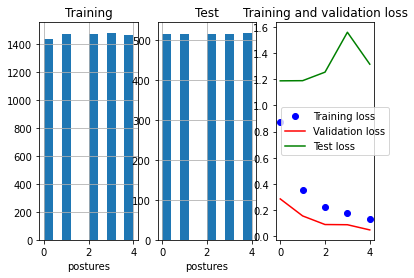

81/81 - 0s - loss: 1.3155 - accuracy: 0.5900

Test accuracy: 0.5899922251701355


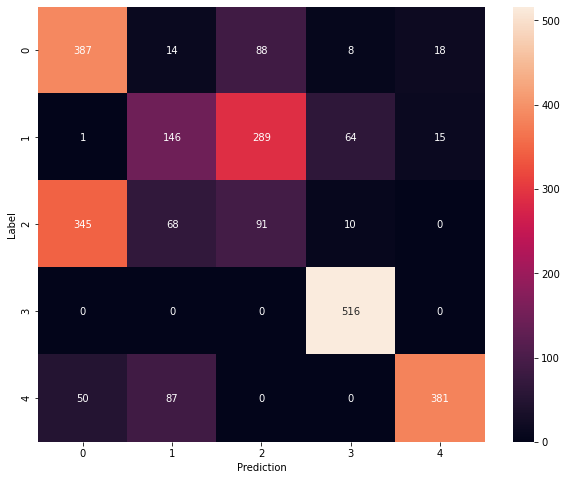

Model: "sequential_505"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_505 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1010 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3180      
_________________________________________________________________
dropout_1011 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,700
Trainable params: 4,700
Non-trainable params: 0
__________________________________________________

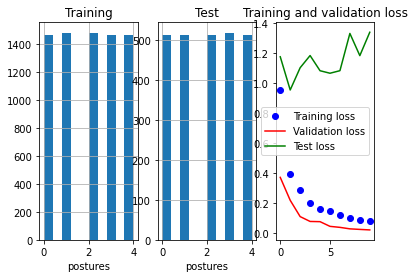

81/81 - 0s - loss: 1.3390 - accuracy: 0.7165

Test accuracy: 0.7164527177810669


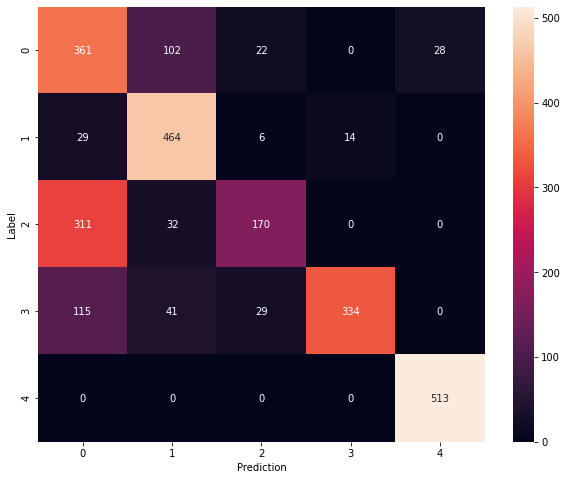

Model: "sequential_506"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_506 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1012 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3710      
_________________________________________________________________
dropout_1013 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,255
Trainable params: 5,255
Non-trainable params: 0
__________________________________________________

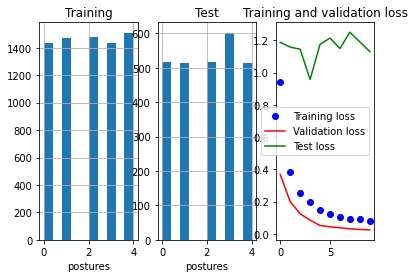

84/84 - 0s - loss: 1.1304 - accuracy: 0.7111

Test accuracy: 0.7110694050788879


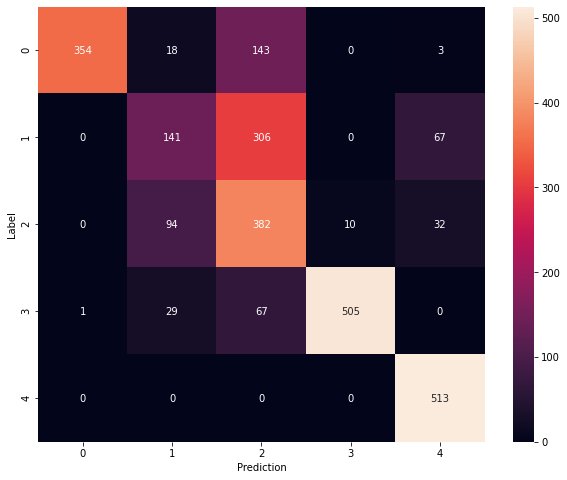

Model: "sequential_507"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_507 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1014 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3710      
_________________________________________________________________
dropout_1015 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,255
Trainable params: 5,255
Non-trainable params: 0
__________________________________________________

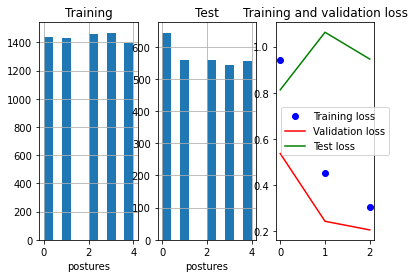

90/90 - 0s - loss: 0.9457 - accuracy: 0.6194

Test accuracy: 0.6193638443946838


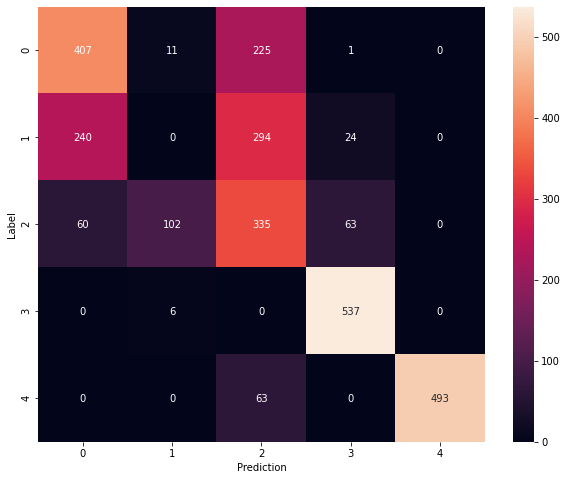

Model: "sequential_508"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_508 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1016 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3710      
_________________________________________________________________
dropout_1017 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,255
Trainable params: 5,255
Non-trainable params: 0
__________________________________________________

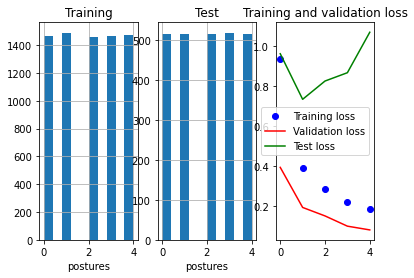

81/81 - 0s - loss: 1.0675 - accuracy: 0.6317

Test accuracy: 0.6317423582077026


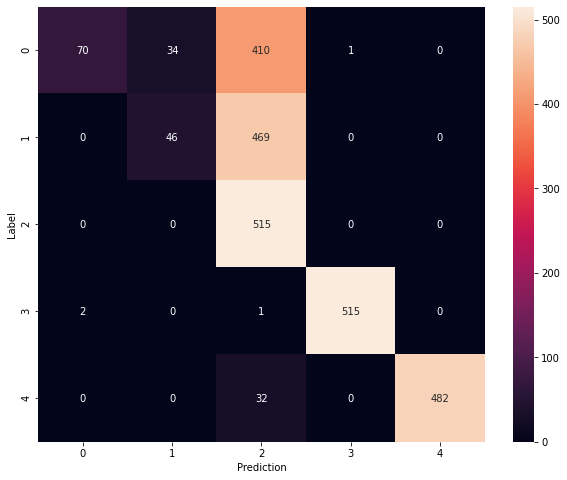

Model: "sequential_509"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_509 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1018 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3710      
_________________________________________________________________
dropout_1019 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,255
Trainable params: 5,255
Non-trainable params: 0
__________________________________________________

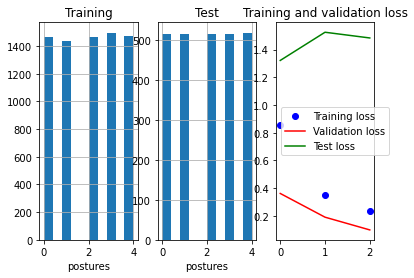

81/81 - 0s - loss: 1.4841 - accuracy: 0.5656

Test accuracy: 0.565554678440094


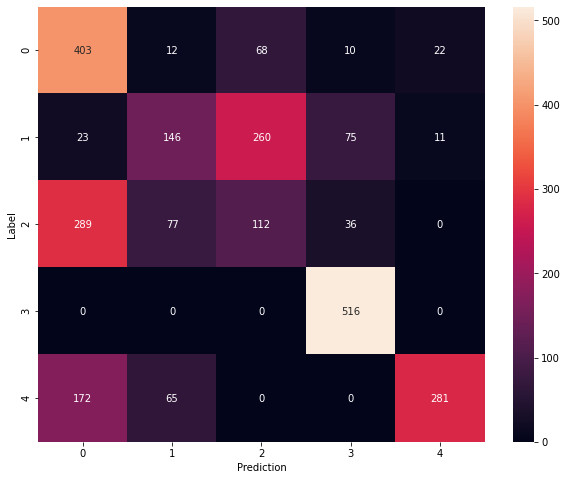

Model: "sequential_510"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_510 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1020 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3710      
_________________________________________________________________
dropout_1021 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,255
Trainable params: 5,255
Non-trainable params: 0
__________________________________________________

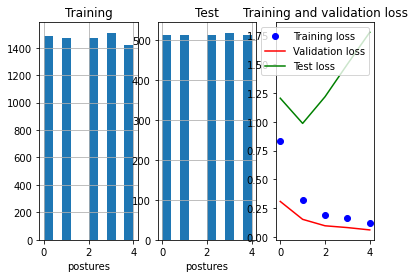

81/81 - 0s - loss: 1.7775 - accuracy: 0.6025

Test accuracy: 0.6024892926216125


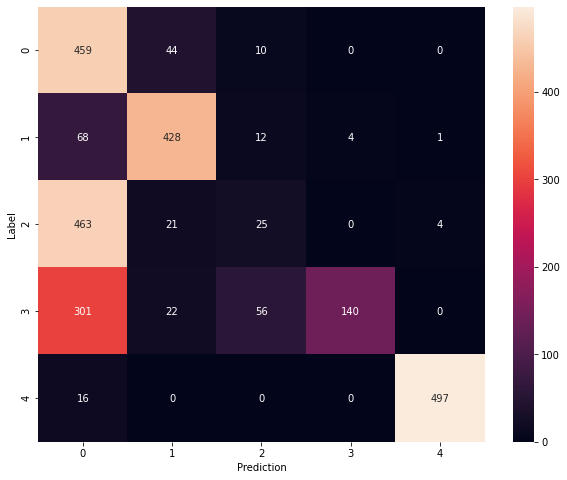

Model: "sequential_511"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_511 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1022 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3710      
_________________________________________________________________
dropout_1023 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,255
Trainable params: 5,255
Non-trainable params: 0
__________________________________________________

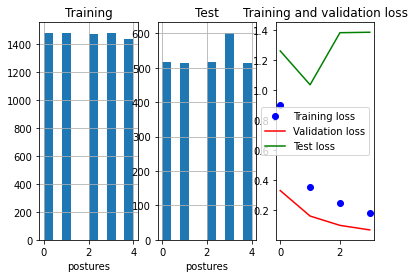

84/84 - 0s - loss: 1.3875 - accuracy: 0.6597

Test accuracy: 0.6596623063087463


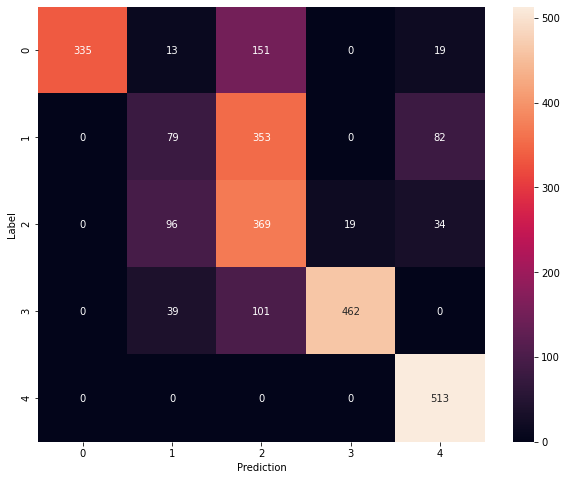

Model: "sequential_512"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_512 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1024 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3710      
_________________________________________________________________
dropout_1025 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,255
Trainable params: 5,255
Non-trainable params: 0
__________________________________________________

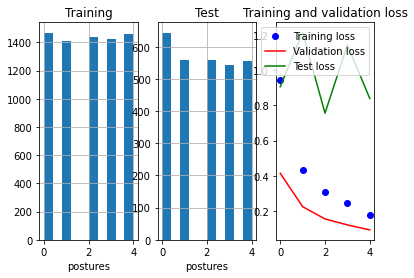

90/90 - 0s - loss: 0.8388 - accuracy: 0.7085

Test accuracy: 0.7084935307502747


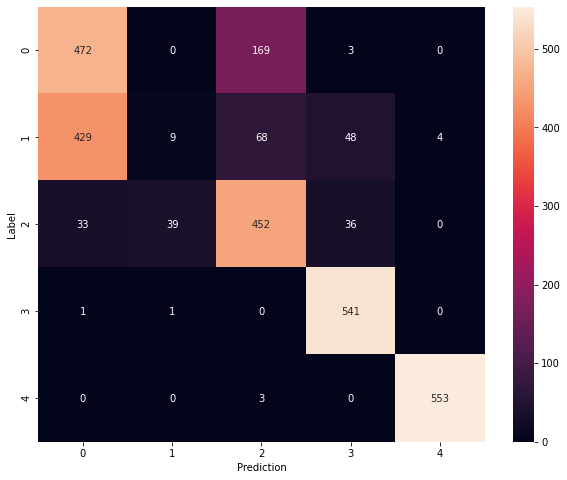

Model: "sequential_513"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_513 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1026 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3710      
_________________________________________________________________
dropout_1027 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,255
Trainable params: 5,255
Non-trainable params: 0
__________________________________________________

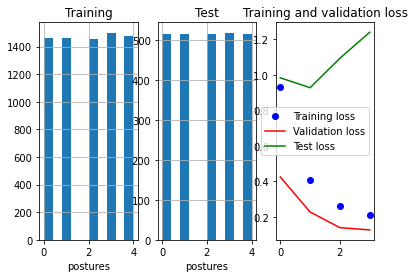

81/81 - 0s - loss: 1.2400 - accuracy: 0.6251

Test accuracy: 0.6251454949378967


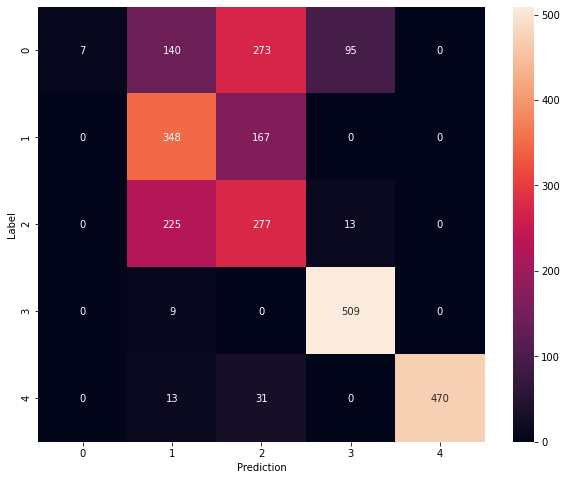

Model: "sequential_514"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_514 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1028 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3710      
_________________________________________________________________
dropout_1029 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,255
Trainable params: 5,255
Non-trainable params: 0
__________________________________________________

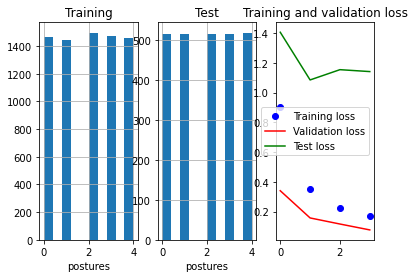

81/81 - 0s - loss: 1.1408 - accuracy: 0.6191

Test accuracy: 0.6190845370292664


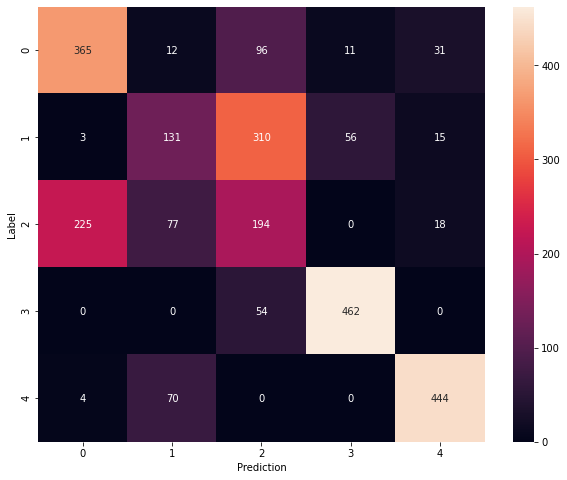

Model: "sequential_515"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_515 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1030 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3710      
_________________________________________________________________
dropout_1031 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,255
Trainable params: 5,255
Non-trainable params: 0
__________________________________________________

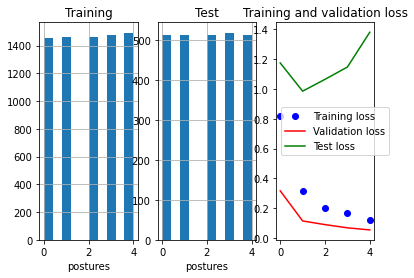

81/81 - 0s - loss: 1.3814 - accuracy: 0.6453

Test accuracy: 0.6452742218971252


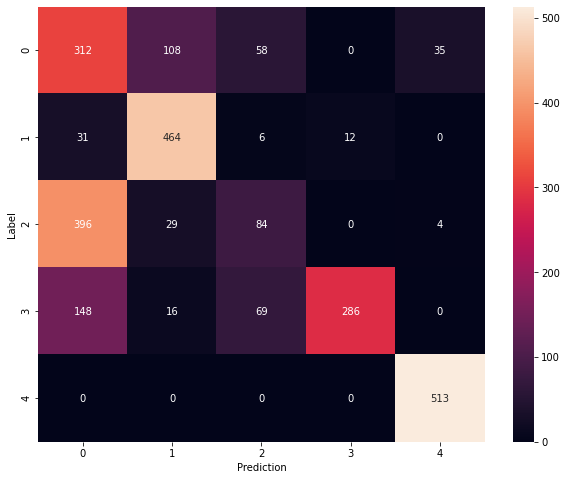

Model: "sequential_516"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_516 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1032 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4240      
_________________________________________________________________
dropout_1033 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,810
Trainable params: 5,810
Non-trainable params: 0
__________________________________________________

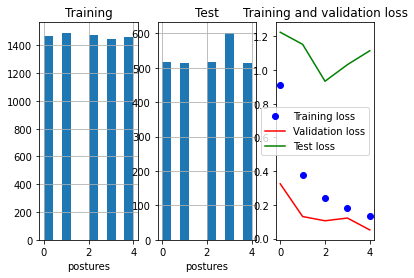

84/84 - 0s - loss: 1.1149 - accuracy: 0.6762

Test accuracy: 0.6761726140975952


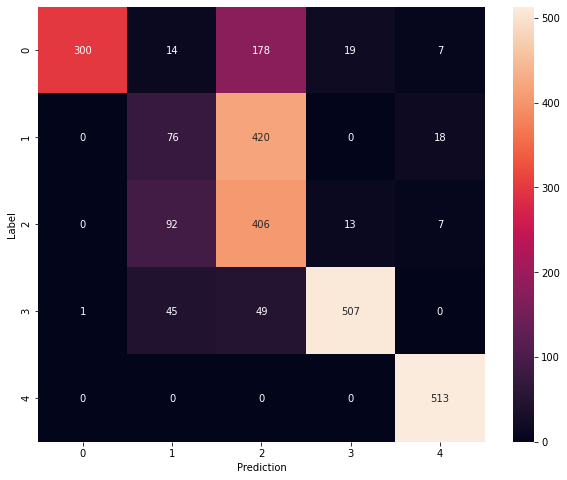

Model: "sequential_517"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_517 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1034 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4240      
_________________________________________________________________
dropout_1035 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,810
Trainable params: 5,810
Non-trainable params: 0
__________________________________________________

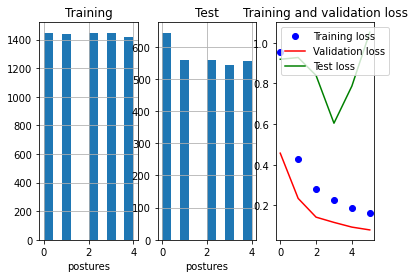

90/90 - 0s - loss: 1.0518 - accuracy: 0.6844

Test accuracy: 0.6843761205673218


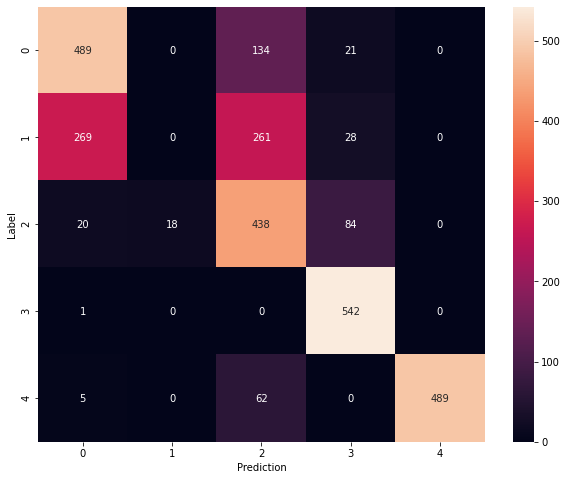

Model: "sequential_518"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_518 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1036 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4240      
_________________________________________________________________
dropout_1037 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,810
Trainable params: 5,810
Non-trainable params: 0
__________________________________________________

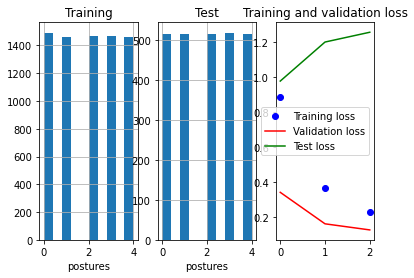

81/81 - 0s - loss: 1.2564 - accuracy: 0.6737

Test accuracy: 0.6736515164375305


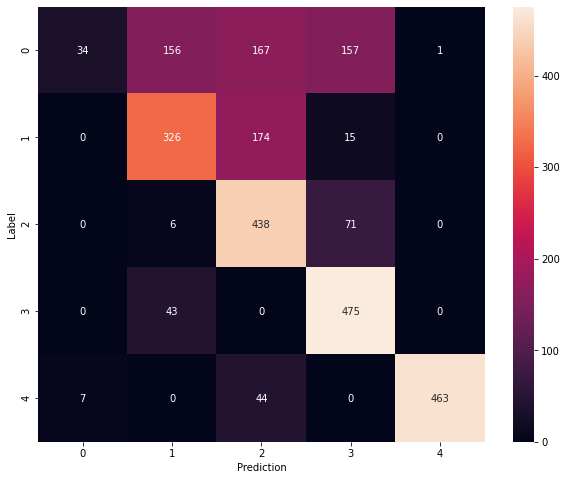

Model: "sequential_519"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_519 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1038 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4240      
_________________________________________________________________
dropout_1039 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,810
Trainable params: 5,810
Non-trainable params: 0
__________________________________________________

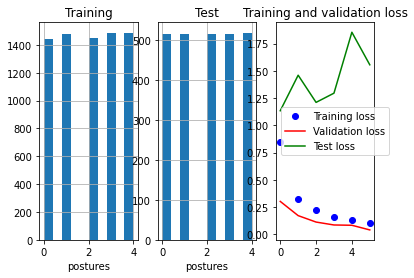

81/81 - 0s - loss: 1.5558 - accuracy: 0.5772

Test accuracy: 0.5771916508674622


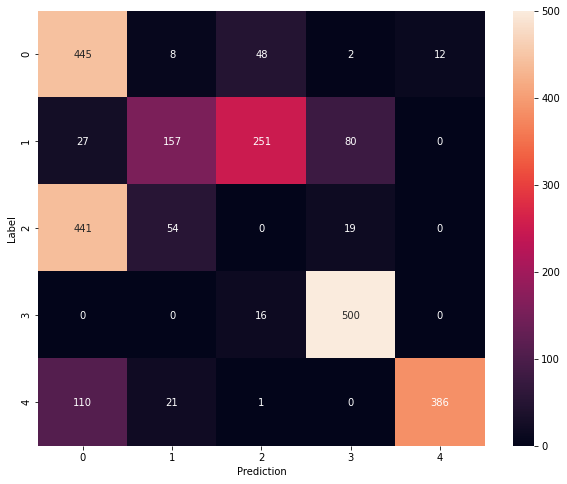

Model: "sequential_520"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_520 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1040 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4240      
_________________________________________________________________
dropout_1041 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,810
Trainable params: 5,810
Non-trainable params: 0
__________________________________________________

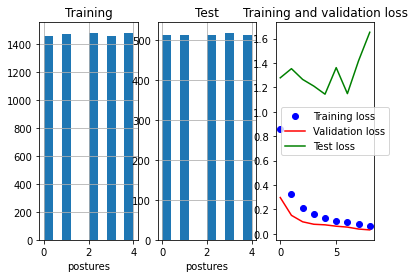

81/81 - 0s - loss: 1.6526 - accuracy: 0.7149

Test accuracy: 0.7148969173431396


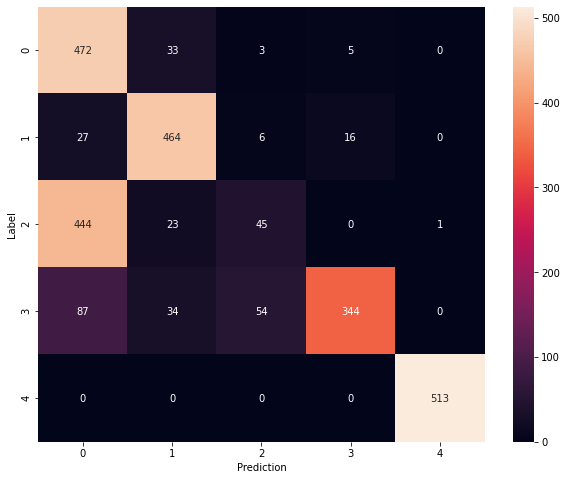

Model: "sequential_521"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_521 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1042 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4240      
_________________________________________________________________
dropout_1043 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,810
Trainable params: 5,810
Non-trainable params: 0
__________________________________________________

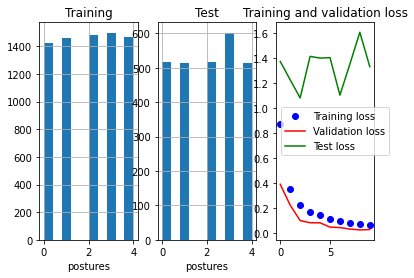

84/84 - 0s - loss: 1.3299 - accuracy: 0.6856

Test accuracy: 0.6855534911155701


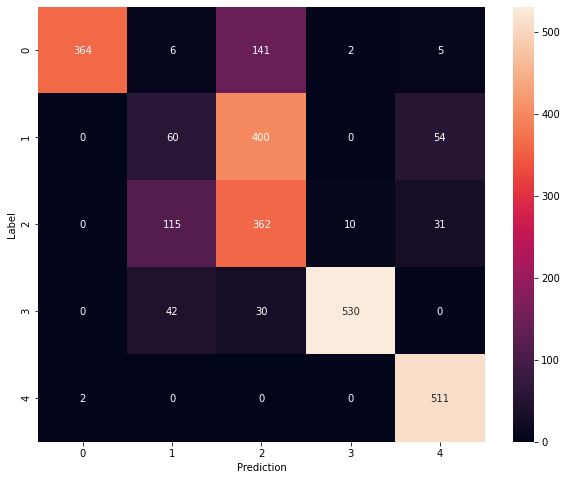

Model: "sequential_522"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_522 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1044 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4240      
_________________________________________________________________
dropout_1045 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,810
Trainable params: 5,810
Non-trainable params: 0
__________________________________________________

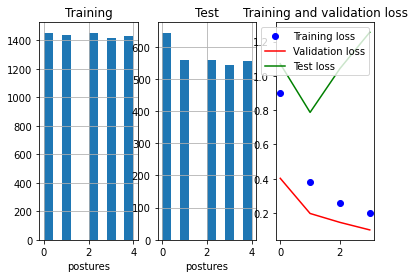

90/90 - 0s - loss: 1.2544 - accuracy: 0.6417

Test accuracy: 0.6417336463928223


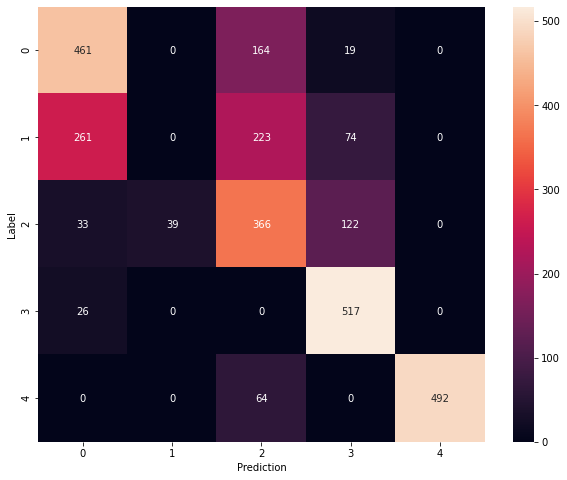

Model: "sequential_523"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_523 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1046 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4240      
_________________________________________________________________
dropout_1047 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,810
Trainable params: 5,810
Non-trainable params: 0
__________________________________________________

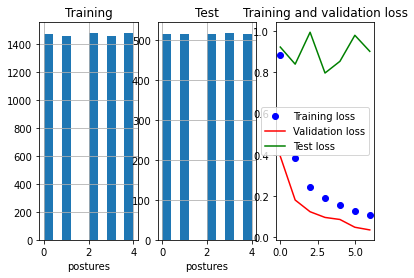

81/81 - 0s - loss: 0.9007 - accuracy: 0.7024

Test accuracy: 0.7023670673370361


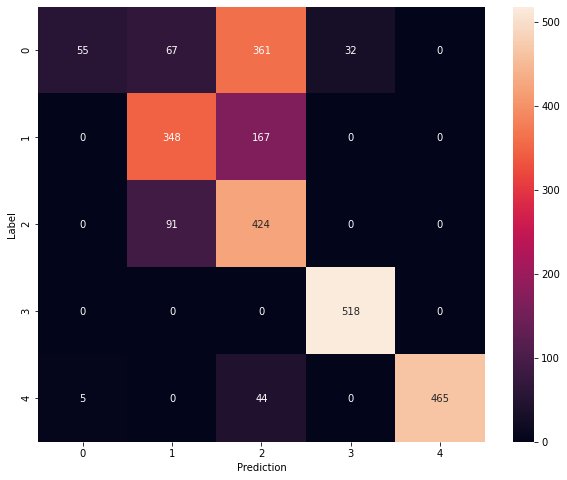

Model: "sequential_524"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_524 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1048 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4240      
_________________________________________________________________
dropout_1049 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,810
Trainable params: 5,810
Non-trainable params: 0
__________________________________________________

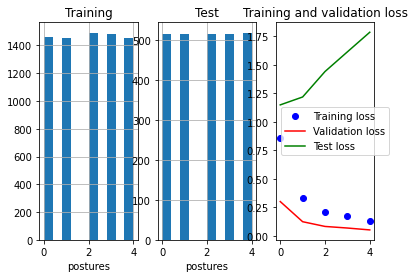

81/81 - 0s - loss: 1.7846 - accuracy: 0.5415

Test accuracy: 0.5415050387382507


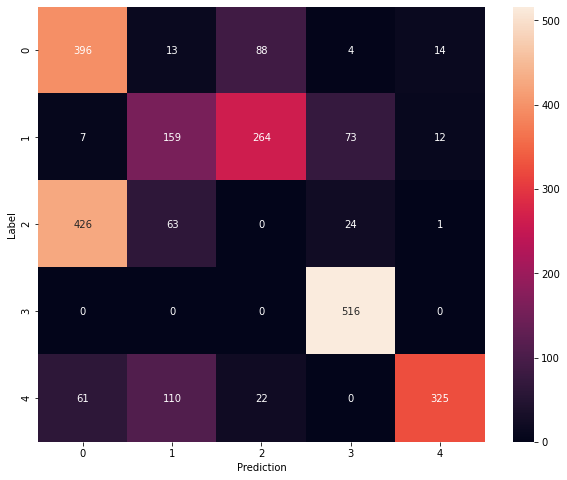

Model: "sequential_525"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_525 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 105)               1365      
_________________________________________________________________
dropout_1050 (Dropout)       (None, 105)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4240      
_________________________________________________________________
dropout_1051 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 5,810
Trainable params: 5,810
Non-trainable params: 0
__________________________________________________

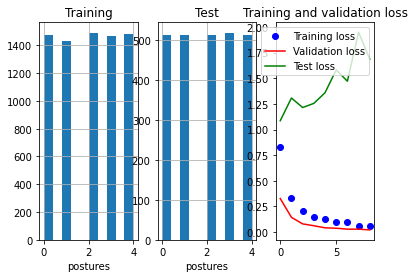

81/81 - 0s - loss: 1.6864 - accuracy: 0.6822

Test accuracy: 0.6822248101234436


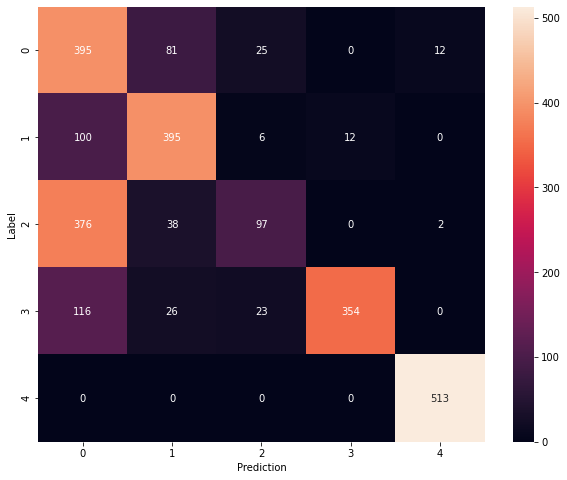

Model: "sequential_526"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_526 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1052 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3330      
_________________________________________________________________
dropout_1053 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,915
Trainable params: 4,915
Non-trainable params: 0
__________________________________________________

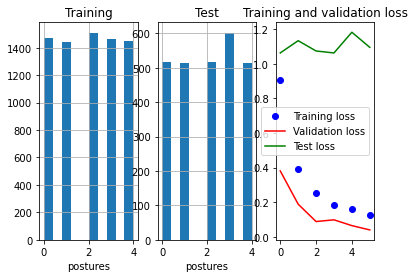

84/84 - 0s - loss: 1.0944 - accuracy: 0.6818

Test accuracy: 0.6818011403083801


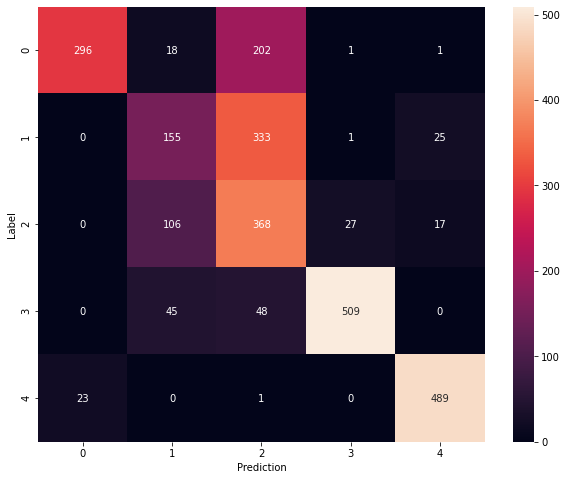

Model: "sequential_527"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_527 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1054 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3330      
_________________________________________________________________
dropout_1055 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,915
Trainable params: 4,915
Non-trainable params: 0
__________________________________________________

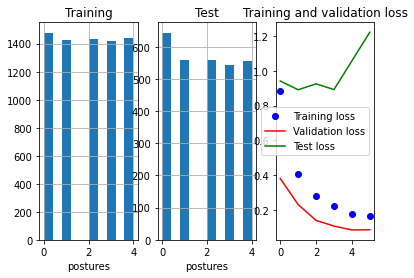

90/90 - 0s - loss: 1.2225 - accuracy: 0.6725

Test accuracy: 0.6724921464920044


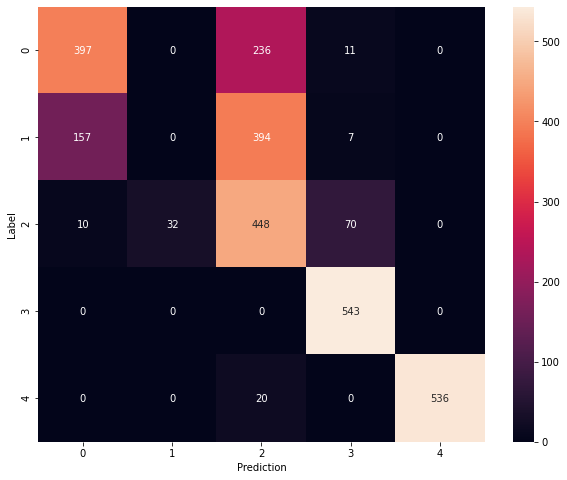

Model: "sequential_528"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_528 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1056 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3330      
_________________________________________________________________
dropout_1057 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,915
Trainable params: 4,915
Non-trainable params: 0
__________________________________________________

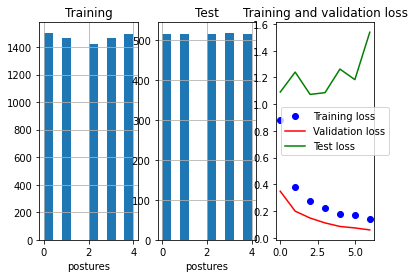

81/81 - 0s - loss: 1.5388 - accuracy: 0.5960

Test accuracy: 0.5960419178009033


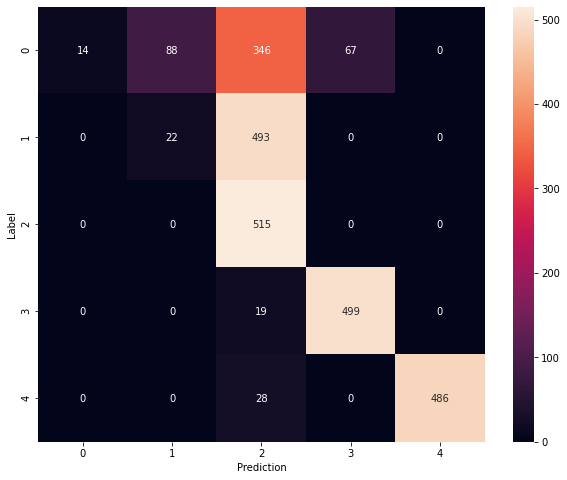

Model: "sequential_529"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_529 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1058 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3330      
_________________________________________________________________
dropout_1059 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,915
Trainable params: 4,915
Non-trainable params: 0
__________________________________________________

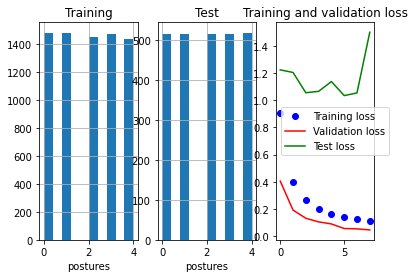

81/81 - 0s - loss: 1.5015 - accuracy: 0.5958

Test accuracy: 0.5958107113838196


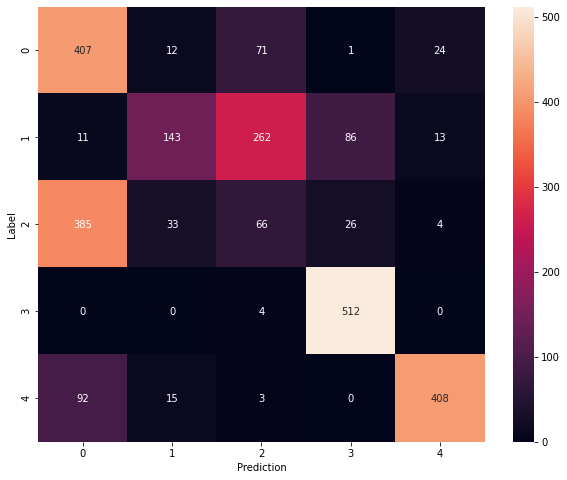

Model: "sequential_530"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_530 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1060 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3330      
_________________________________________________________________
dropout_1061 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,915
Trainable params: 4,915
Non-trainable params: 0
__________________________________________________

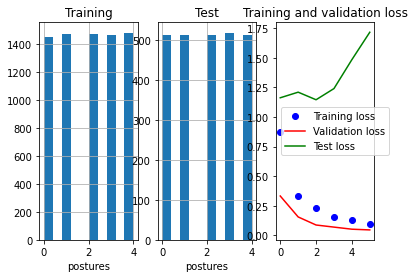

81/81 - 0s - loss: 1.7169 - accuracy: 0.6414

Test accuracy: 0.6413846611976624


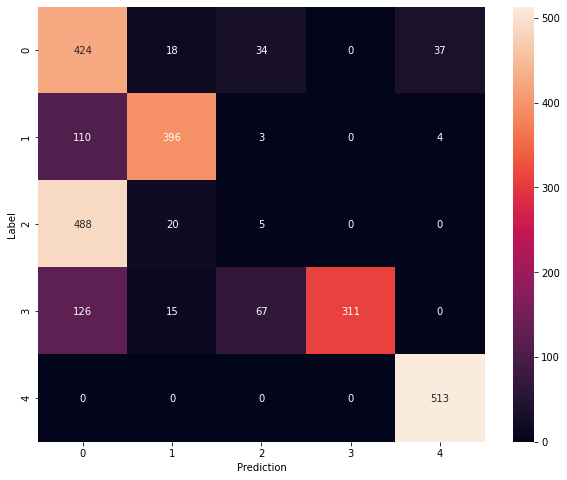

Model: "sequential_531"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_531 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1062 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3330      
_________________________________________________________________
dropout_1063 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,915
Trainable params: 4,915
Non-trainable params: 0
__________________________________________________

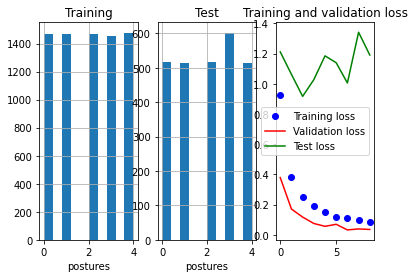

84/84 - 0s - loss: 1.1901 - accuracy: 0.7047

Test accuracy: 0.7046904563903809


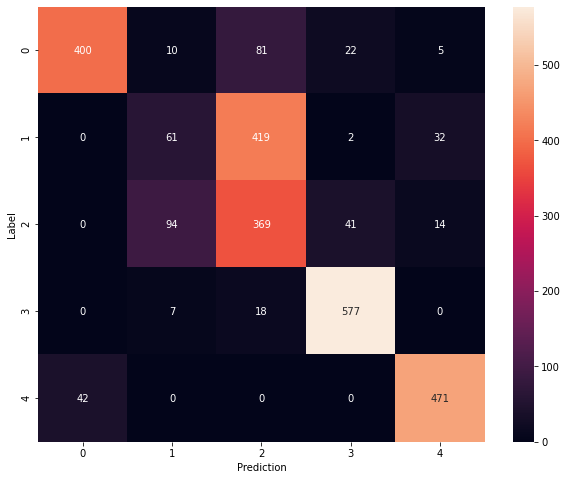

Model: "sequential_532"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_532 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1064 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3330      
_________________________________________________________________
dropout_1065 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,915
Trainable params: 4,915
Non-trainable params: 0
__________________________________________________

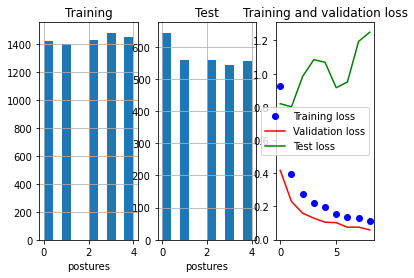

90/90 - 0s - loss: 1.2497 - accuracy: 0.6746

Test accuracy: 0.6745892763137817


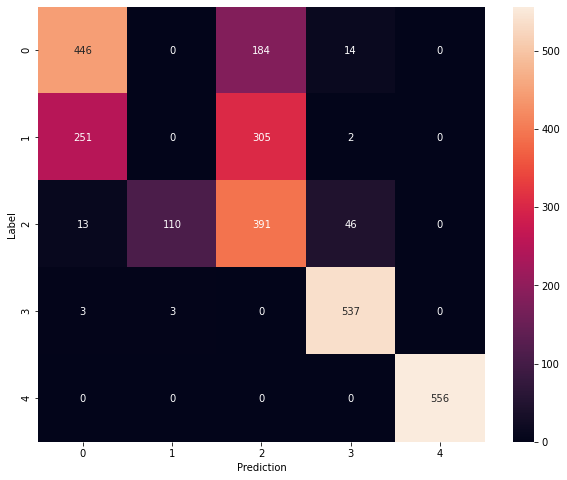

Model: "sequential_533"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_533 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1066 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3330      
_________________________________________________________________
dropout_1067 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,915
Trainable params: 4,915
Non-trainable params: 0
__________________________________________________

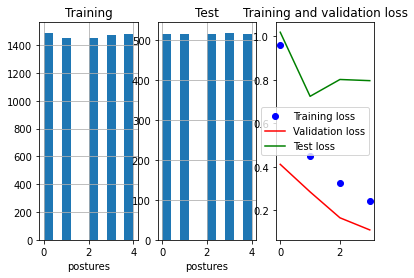

81/81 - 0s - loss: 0.7958 - accuracy: 0.7206

Test accuracy: 0.7206053733825684


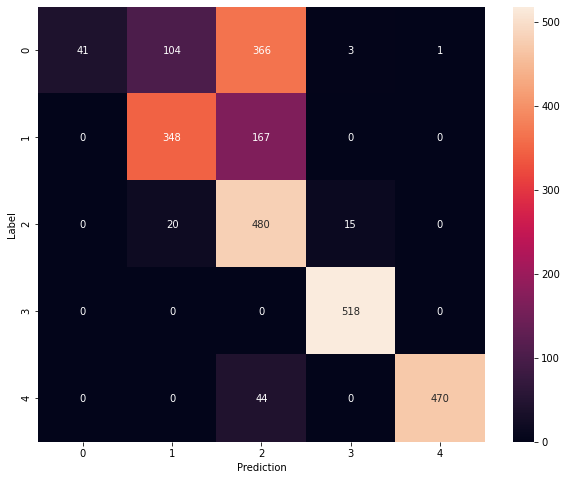

Model: "sequential_534"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_534 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1068 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3330      
_________________________________________________________________
dropout_1069 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,915
Trainable params: 4,915
Non-trainable params: 0
__________________________________________________

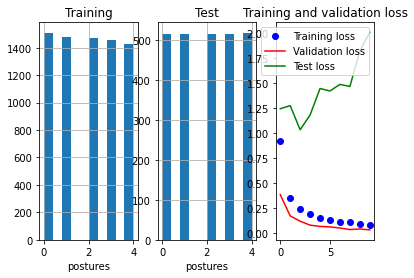

81/81 - 0s - loss: 2.0090 - accuracy: 0.5884

Test accuracy: 0.5884406566619873


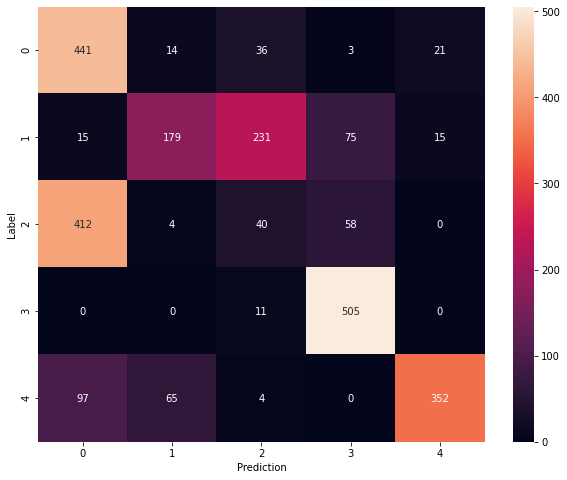

Model: "sequential_535"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_535 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1070 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3330      
_________________________________________________________________
dropout_1071 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 4,915
Trainable params: 4,915
Non-trainable params: 0
__________________________________________________

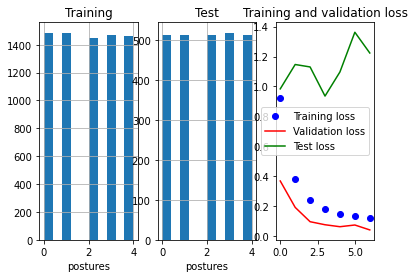

81/81 - 0s - loss: 1.2236 - accuracy: 0.7172

Test accuracy: 0.7172306776046753


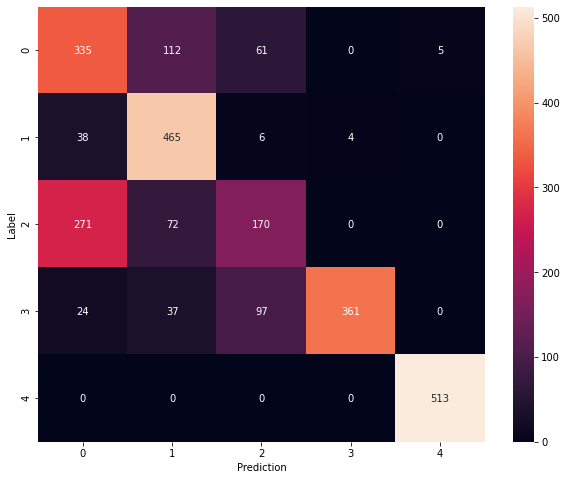

Model: "sequential_536"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_536 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1072 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3885      
_________________________________________________________________
dropout_1073 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,495
Trainable params: 5,495
Non-trainable params: 0
__________________________________________________

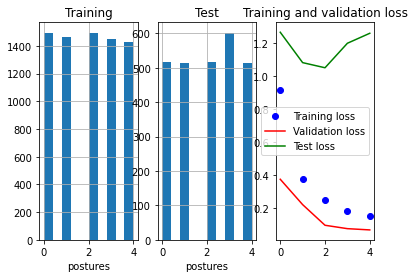

84/84 - 0s - loss: 1.2603 - accuracy: 0.7081

Test accuracy: 0.7080675363540649


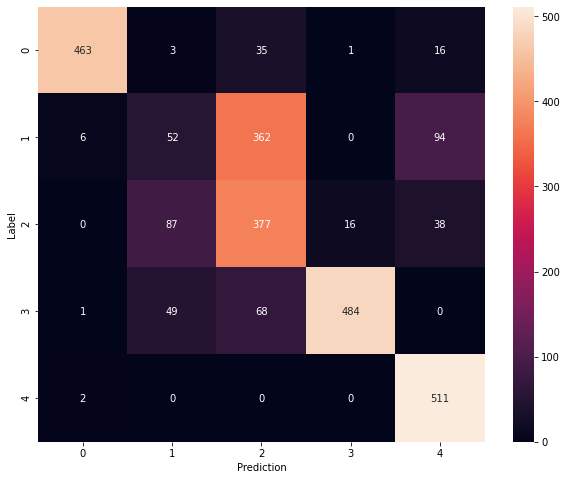

Model: "sequential_537"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_537 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1074 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3885      
_________________________________________________________________
dropout_1075 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,495
Trainable params: 5,495
Non-trainable params: 0
__________________________________________________

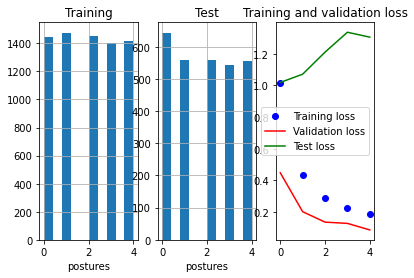

90/90 - 0s - loss: 1.3052 - accuracy: 0.6777

Test accuracy: 0.6777350306510925


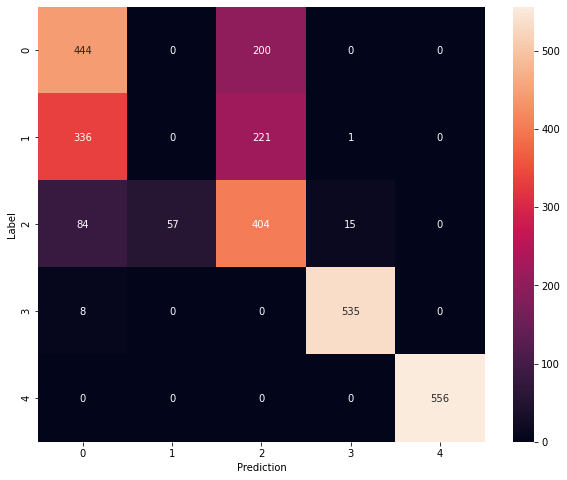

Model: "sequential_538"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_538 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1076 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3885      
_________________________________________________________________
dropout_1077 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,495
Trainable params: 5,495
Non-trainable params: 0
__________________________________________________

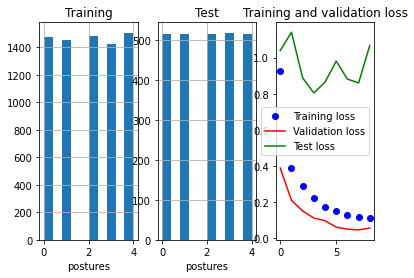

81/81 - 0s - loss: 1.0670 - accuracy: 0.6927

Test accuracy: 0.6926658749580383


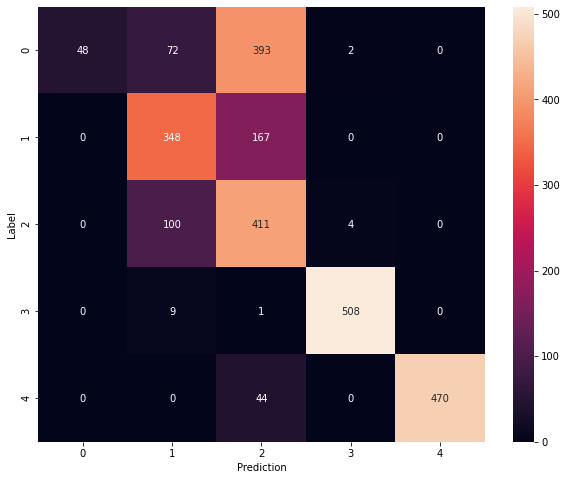

Model: "sequential_539"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_539 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1078 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3885      
_________________________________________________________________
dropout_1079 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,495
Trainable params: 5,495
Non-trainable params: 0
__________________________________________________

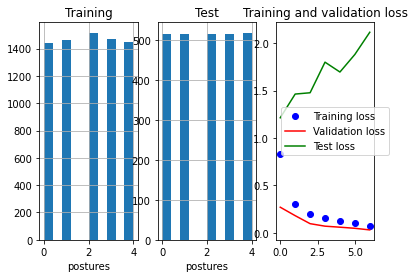

81/81 - 0s - loss: 2.1168 - accuracy: 0.5787

Test accuracy: 0.5787432193756104


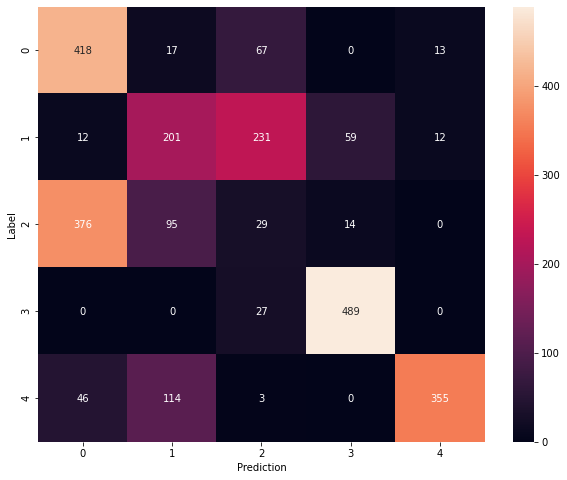

Model: "sequential_540"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_540 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1080 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3885      
_________________________________________________________________
dropout_1081 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,495
Trainable params: 5,495
Non-trainable params: 0
__________________________________________________

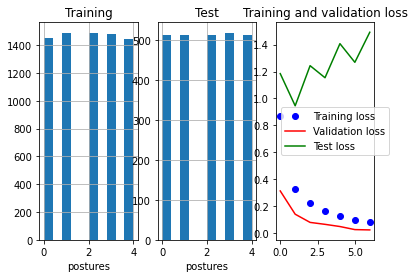

81/81 - 0s - loss: 1.4915 - accuracy: 0.7083

Test accuracy: 0.7082847356796265


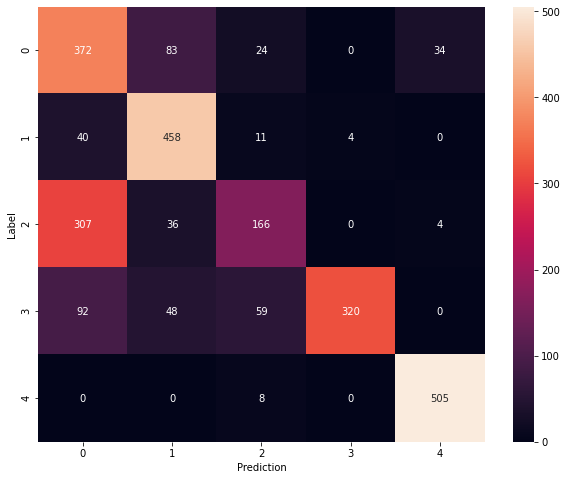

Model: "sequential_541"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_541 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1082 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3885      
_________________________________________________________________
dropout_1083 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,495
Trainable params: 5,495
Non-trainable params: 0
__________________________________________________

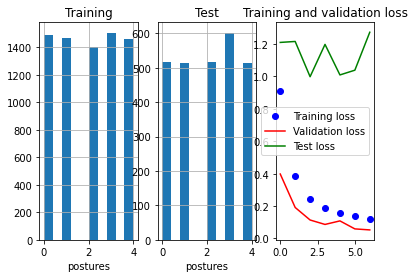

84/84 - 0s - loss: 1.2728 - accuracy: 0.6439

Test accuracy: 0.6439024209976196


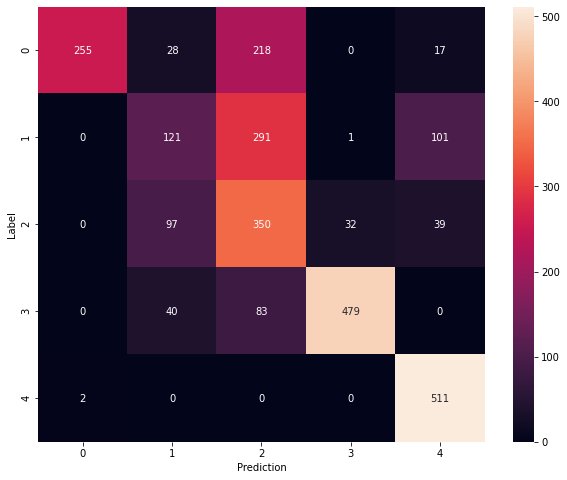

Model: "sequential_542"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_542 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1084 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3885      
_________________________________________________________________
dropout_1085 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,495
Trainable params: 5,495
Non-trainable params: 0
__________________________________________________

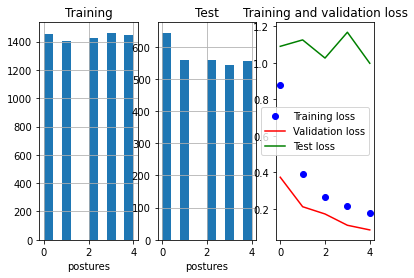

90/90 - 0s - loss: 0.9974 - accuracy: 0.6788

Test accuracy: 0.678783655166626


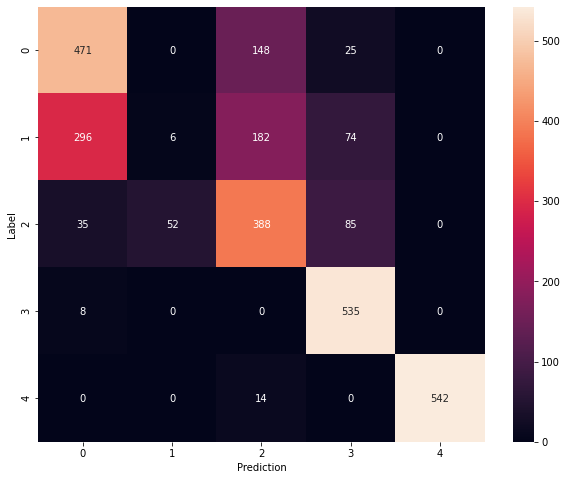

Model: "sequential_543"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_543 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1086 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3885      
_________________________________________________________________
dropout_1087 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,495
Trainable params: 5,495
Non-trainable params: 0
__________________________________________________

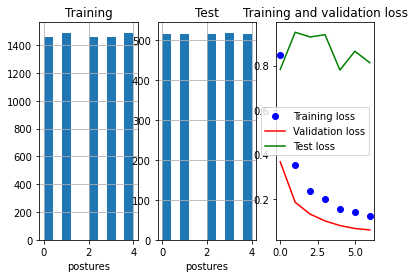

81/81 - 0s - loss: 0.8129 - accuracy: 0.7536

Test accuracy: 0.7535894513130188


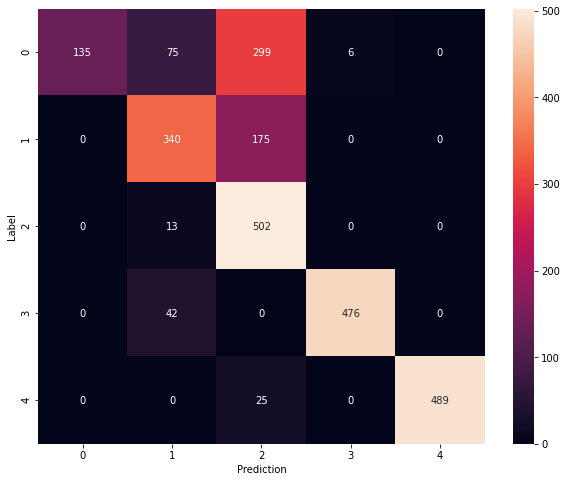

Model: "sequential_544"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_544 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1088 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3885      
_________________________________________________________________
dropout_1089 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,495
Trainable params: 5,495
Non-trainable params: 0
__________________________________________________

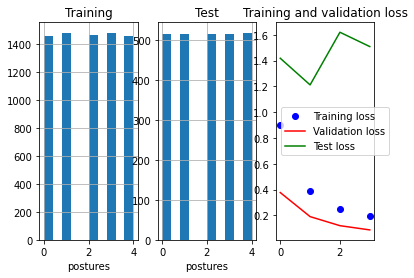

81/81 - 0s - loss: 1.5085 - accuracy: 0.5772

Test accuracy: 0.5771916508674622


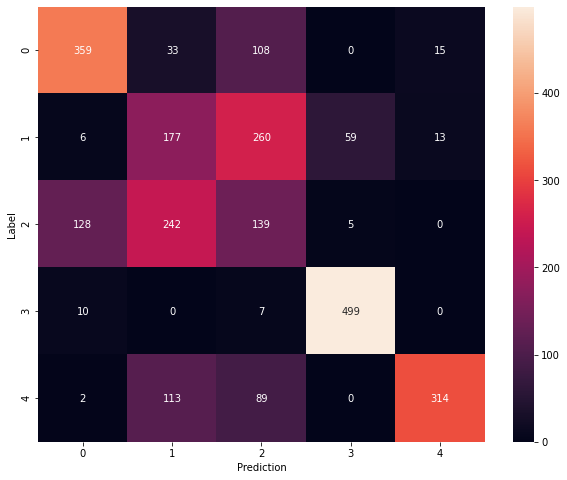

Model: "sequential_545"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_545 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1090 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                3885      
_________________________________________________________________
dropout_1091 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,495
Trainable params: 5,495
Non-trainable params: 0
__________________________________________________

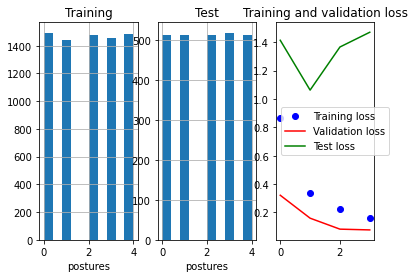

81/81 - 0s - loss: 1.4697 - accuracy: 0.6612

Test accuracy: 0.6612213253974915


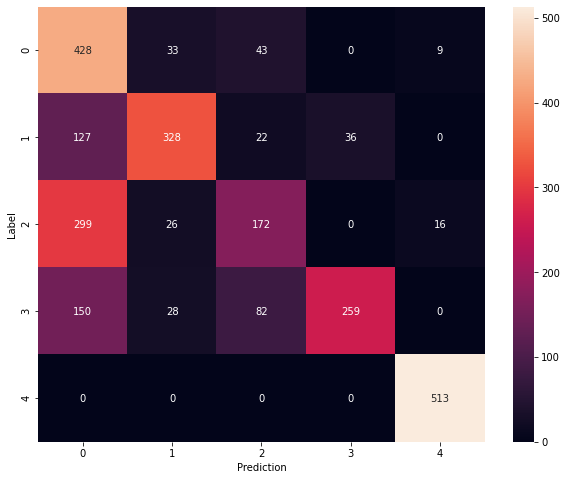

Model: "sequential_546"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_546 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1092 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4440      
_________________________________________________________________
dropout_1093 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,075
Trainable params: 6,075
Non-trainable params: 0
__________________________________________________

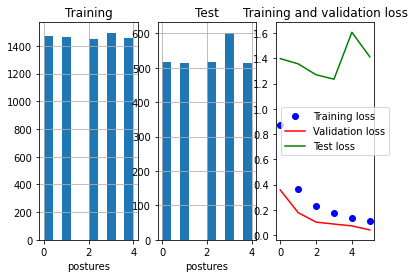

84/84 - 0s - loss: 1.4121 - accuracy: 0.7118

Test accuracy: 0.7118198871612549


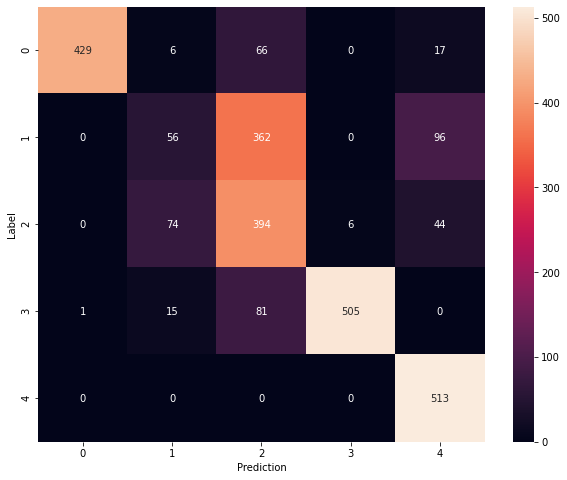

Model: "sequential_547"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_547 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1094 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4440      
_________________________________________________________________
dropout_1095 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,075
Trainable params: 6,075
Non-trainable params: 0
__________________________________________________

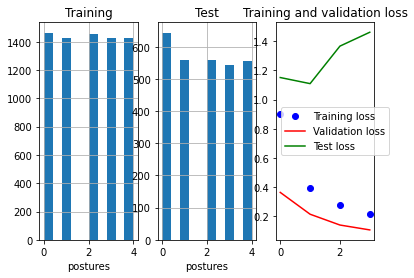

90/90 - 0s - loss: 1.4611 - accuracy: 0.6686

Test accuracy: 0.6686473488807678


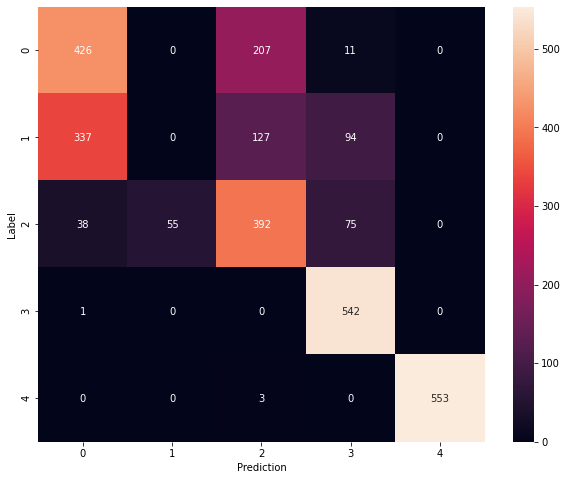

Model: "sequential_548"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_548 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1096 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4440      
_________________________________________________________________
dropout_1097 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,075
Trainable params: 6,075
Non-trainable params: 0
__________________________________________________

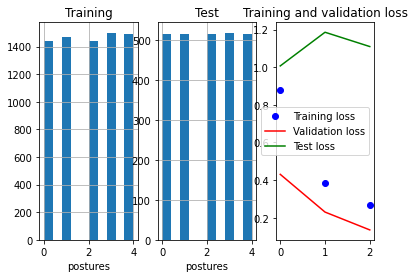

81/81 - 0s - loss: 1.1099 - accuracy: 0.6019

Test accuracy: 0.6018626093864441


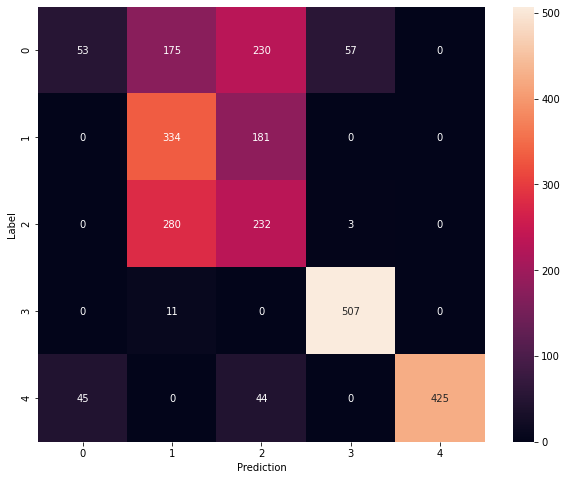

Model: "sequential_549"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_549 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1098 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4440      
_________________________________________________________________
dropout_1099 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,075
Trainable params: 6,075
Non-trainable params: 0
__________________________________________________

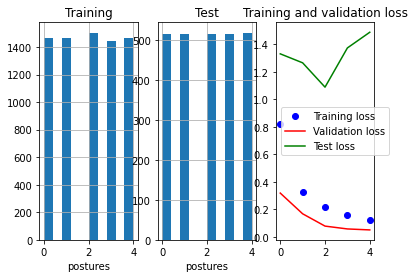

81/81 - 0s - loss: 1.4886 - accuracy: 0.5962

Test accuracy: 0.5961986184120178


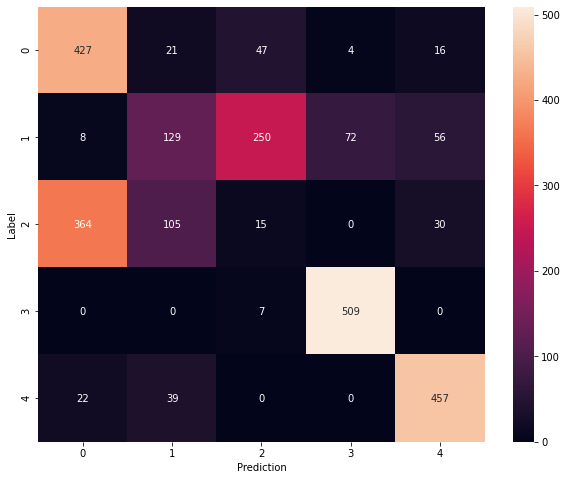

Model: "sequential_550"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_550 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1100 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4440      
_________________________________________________________________
dropout_1101 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,075
Trainable params: 6,075
Non-trainable params: 0
__________________________________________________

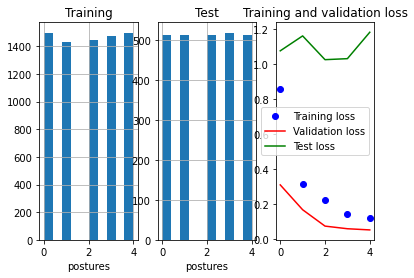

81/81 - 0s - loss: 1.1818 - accuracy: 0.7196

Test accuracy: 0.7195643782615662


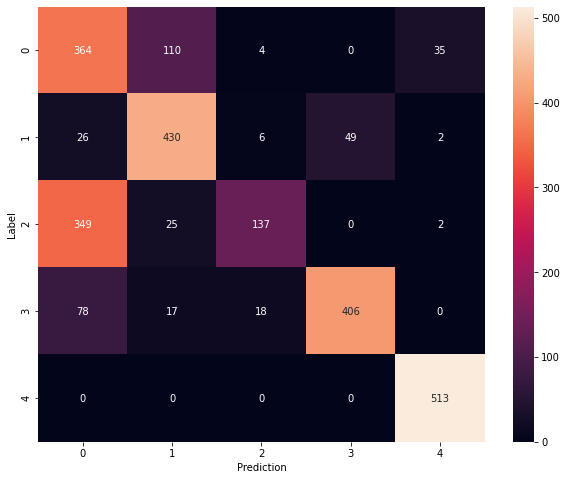

Model: "sequential_551"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_551 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1102 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4440      
_________________________________________________________________
dropout_1103 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,075
Trainable params: 6,075
Non-trainable params: 0
__________________________________________________

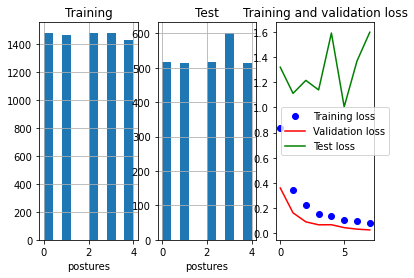

84/84 - 0s - loss: 1.5959 - accuracy: 0.6844

Test accuracy: 0.6844277381896973


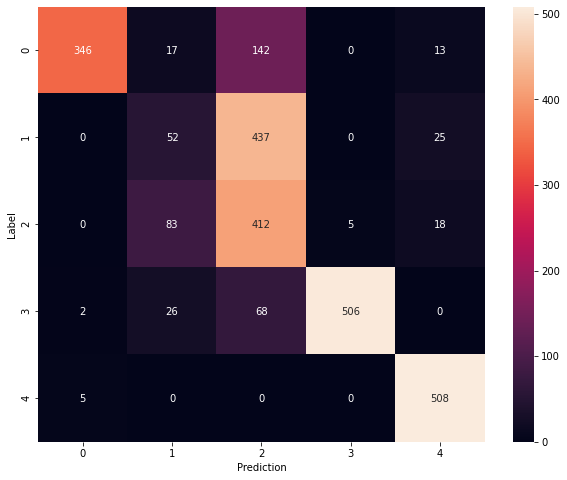

Model: "sequential_552"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_552 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1104 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4440      
_________________________________________________________________
dropout_1105 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,075
Trainable params: 6,075
Non-trainable params: 0
__________________________________________________

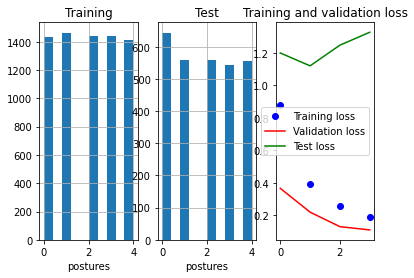

90/90 - 0s - loss: 1.3276 - accuracy: 0.6679

Test accuracy: 0.6679482460021973


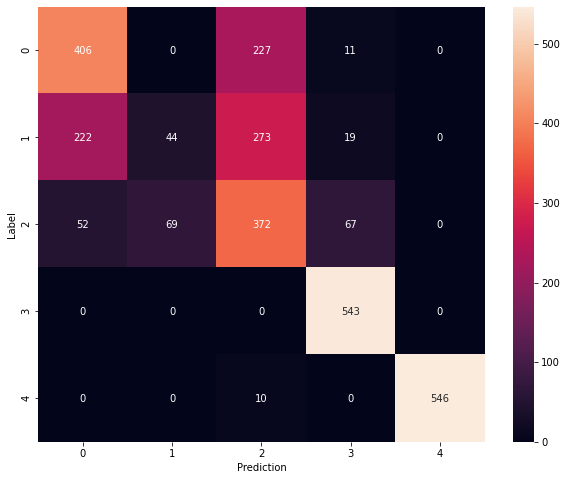

Model: "sequential_553"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_553 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1106 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4440      
_________________________________________________________________
dropout_1107 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,075
Trainable params: 6,075
Non-trainable params: 0
__________________________________________________

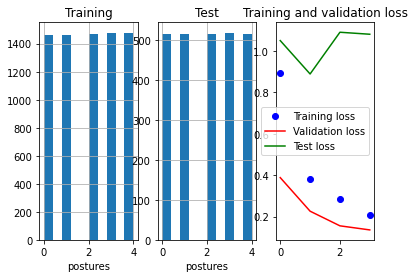

81/81 - 0s - loss: 1.0797 - accuracy: 0.6348

Test accuracy: 0.6348467469215393


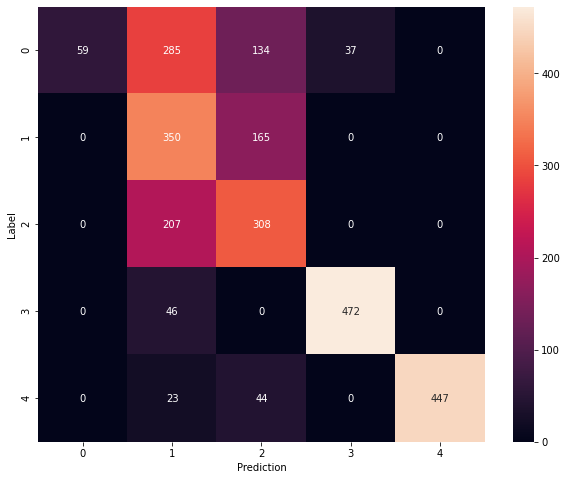

Model: "sequential_554"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_554 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1108 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4440      
_________________________________________________________________
dropout_1109 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,075
Trainable params: 6,075
Non-trainable params: 0
__________________________________________________

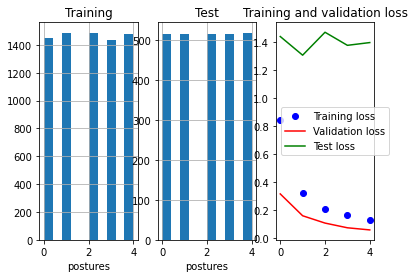

81/81 - 0s - loss: 1.3959 - accuracy: 0.5547

Test accuracy: 0.5546935796737671


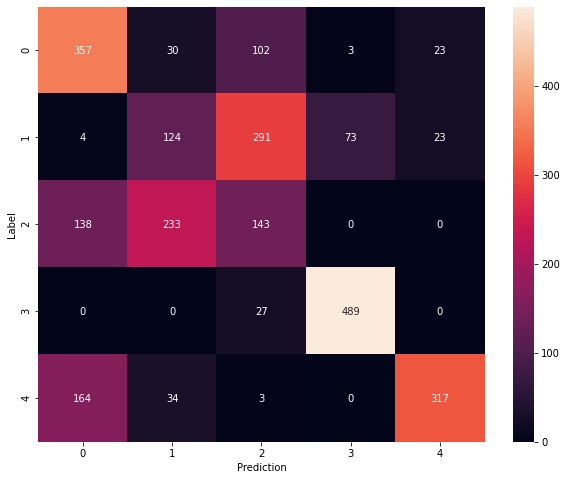

Model: "sequential_555"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_555 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 110)               1430      
_________________________________________________________________
dropout_1110 (Dropout)       (None, 110)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4440      
_________________________________________________________________
dropout_1111 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,075
Trainable params: 6,075
Non-trainable params: 0
__________________________________________________

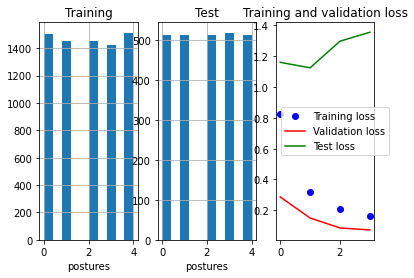

81/81 - 0s - loss: 1.3558 - accuracy: 0.6503

Test accuracy: 0.6503306031227112


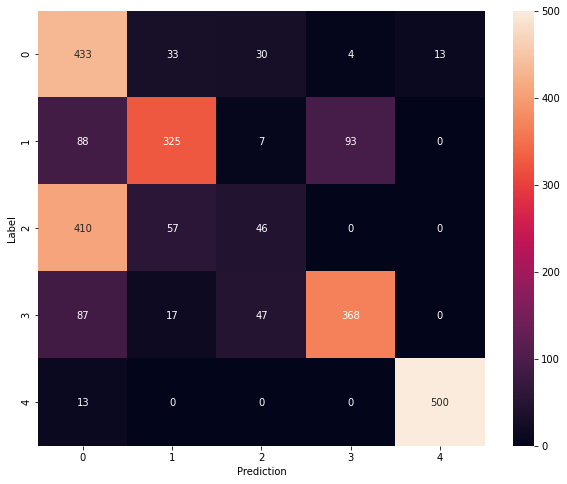

Model: "sequential_556"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_556 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1112 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3480      
_________________________________________________________________
dropout_1113 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 5,130
Trainable params: 5,130
Non-trainable params: 0
__________________________________________________

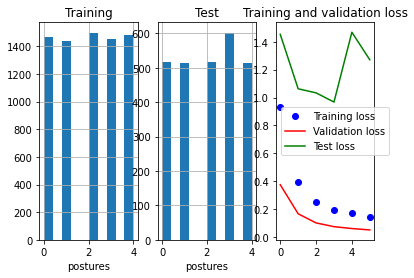

84/84 - 0s - loss: 1.2707 - accuracy: 0.7133

Test accuracy: 0.7133208513259888


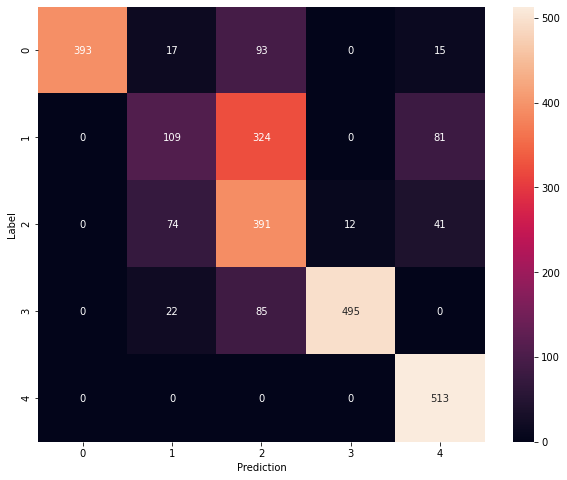

Model: "sequential_557"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_557 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1114 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3480      
_________________________________________________________________
dropout_1115 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 5,130
Trainable params: 5,130
Non-trainable params: 0
__________________________________________________

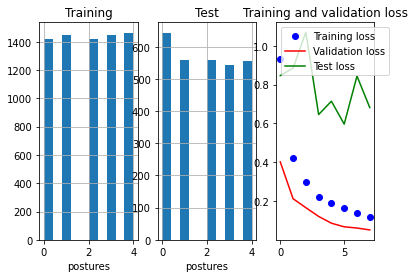

90/90 - 0s - loss: 0.6817 - accuracy: 0.7462

Test accuracy: 0.7462425827980042


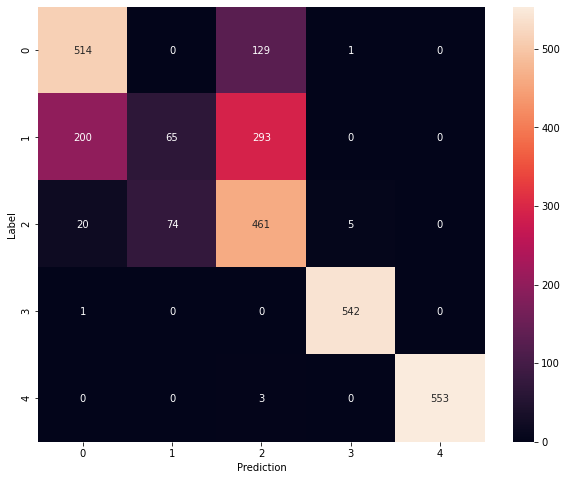

Model: "sequential_558"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_558 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1116 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3480      
_________________________________________________________________
dropout_1117 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 5,130
Trainable params: 5,130
Non-trainable params: 0
__________________________________________________

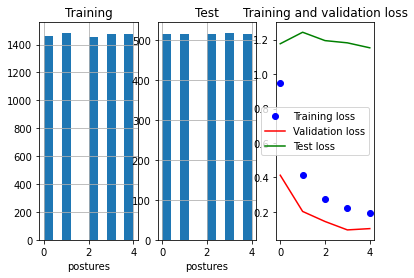

81/81 - 0s - loss: 1.1526 - accuracy: 0.6407

Test accuracy: 0.6406674385070801


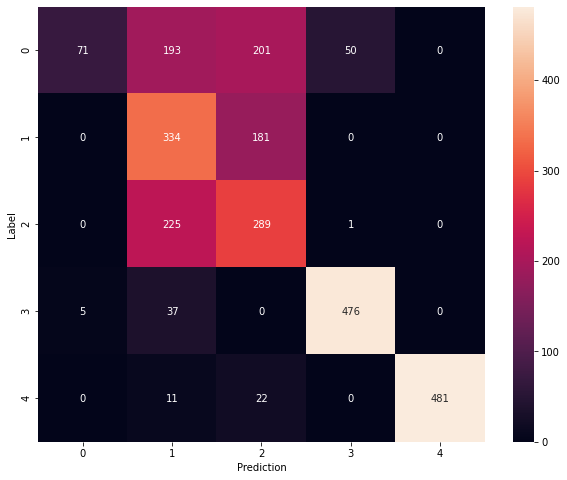

Model: "sequential_559"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_559 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1118 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3480      
_________________________________________________________________
dropout_1119 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 5,130
Trainable params: 5,130
Non-trainable params: 0
__________________________________________________

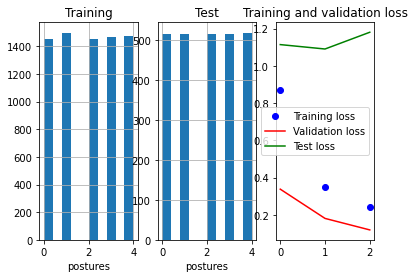

81/81 - 0s - loss: 1.1804 - accuracy: 0.5574

Test accuracy: 0.55740886926651


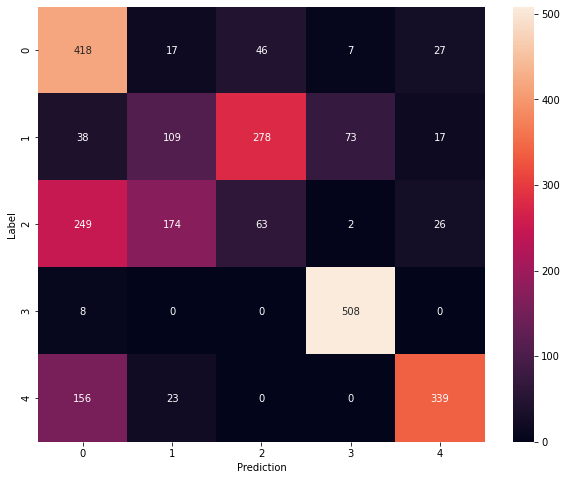

Model: "sequential_560"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_560 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1120 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3480      
_________________________________________________________________
dropout_1121 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 5,130
Trainable params: 5,130
Non-trainable params: 0
__________________________________________________

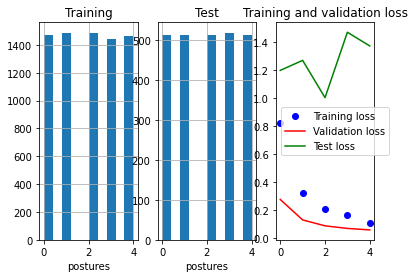

81/81 - 0s - loss: 1.3713 - accuracy: 0.6877

Test accuracy: 0.6876701712608337


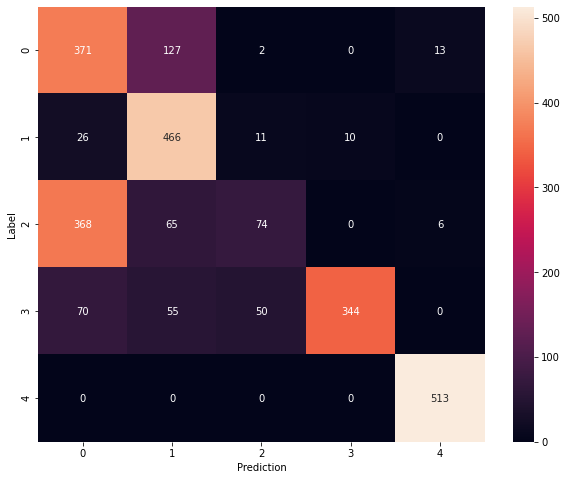

Model: "sequential_561"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_561 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1122 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3480      
_________________________________________________________________
dropout_1123 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 5,130
Trainable params: 5,130
Non-trainable params: 0
__________________________________________________

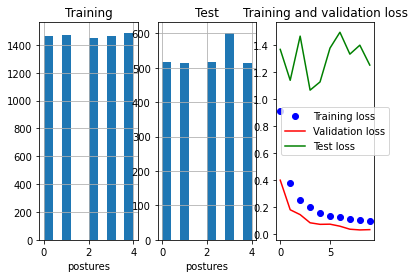

84/84 - 0s - loss: 1.2511 - accuracy: 0.7546

Test accuracy: 0.7545966506004333


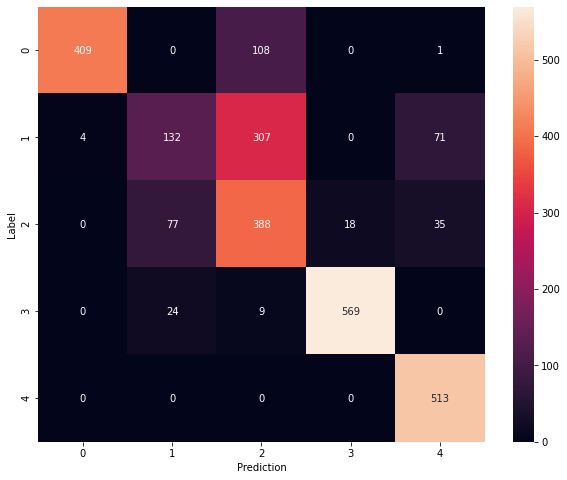

Model: "sequential_562"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_562 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1124 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3480      
_________________________________________________________________
dropout_1125 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 5,130
Trainable params: 5,130
Non-trainable params: 0
__________________________________________________

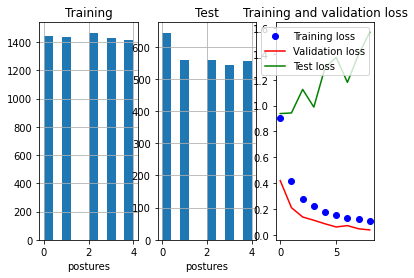

90/90 - 0s - loss: 1.5669 - accuracy: 0.7064

Test accuracy: 0.7063963413238525


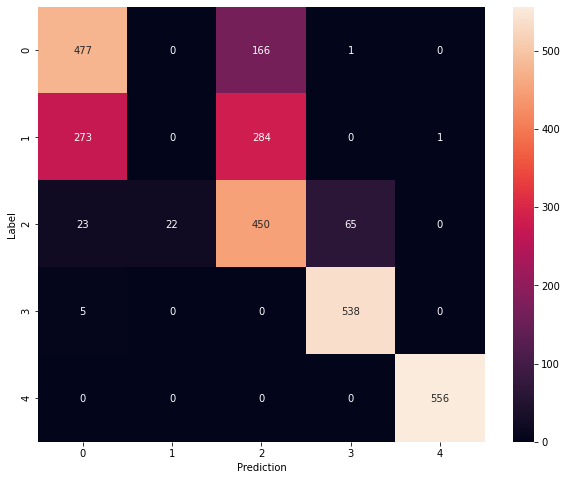

Model: "sequential_563"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_563 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1126 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3480      
_________________________________________________________________
dropout_1127 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 5,130
Trainable params: 5,130
Non-trainable params: 0
__________________________________________________

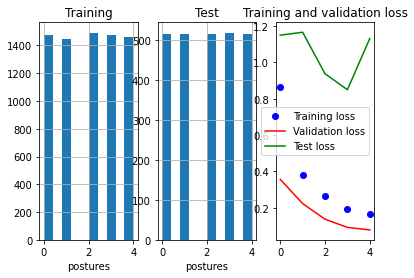

81/81 - 0s - loss: 1.1312 - accuracy: 0.7191

Test accuracy: 0.7190531492233276


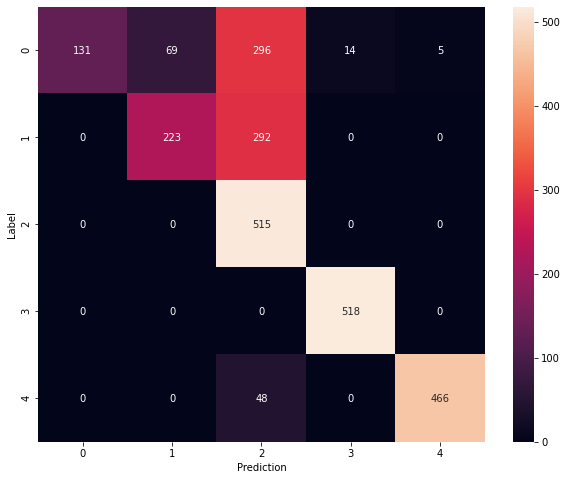

Model: "sequential_564"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_564 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1128 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3480      
_________________________________________________________________
dropout_1129 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 5,130
Trainable params: 5,130
Non-trainable params: 0
__________________________________________________

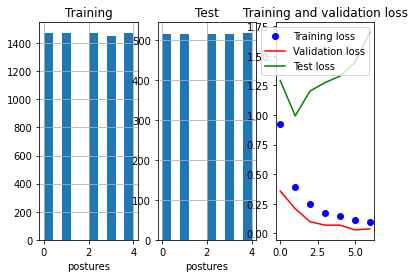

81/81 - 0s - loss: 1.6995 - accuracy: 0.5811

Test accuracy: 0.581070601940155


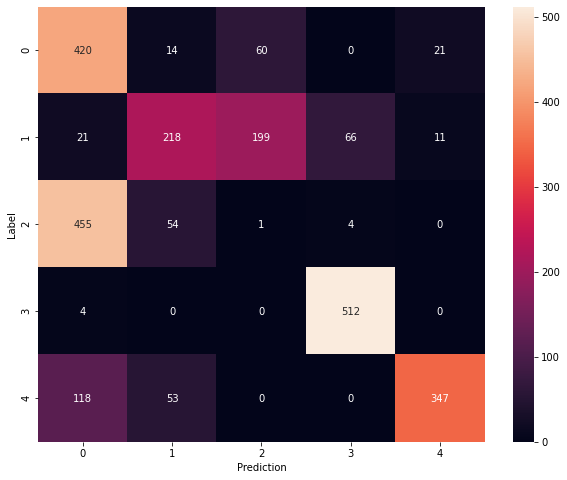

Model: "sequential_565"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_565 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1130 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3480      
_________________________________________________________________
dropout_1131 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 5,130
Trainable params: 5,130
Non-trainable params: 0
__________________________________________________

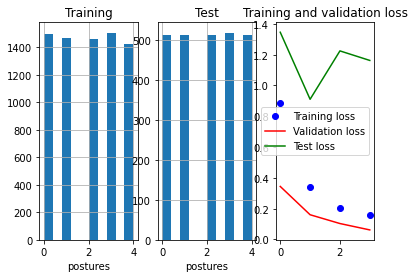

81/81 - 0s - loss: 1.1627 - accuracy: 0.6970

Test accuracy: 0.697005033493042


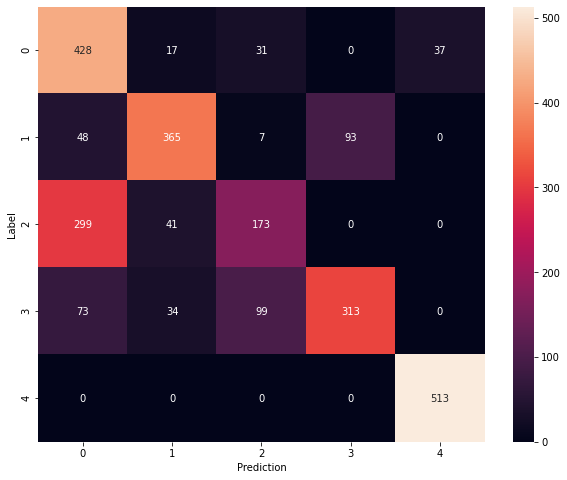

Model: "sequential_566"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_566 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1132 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                4060      
_________________________________________________________________
dropout_1133 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,735
Trainable params: 5,735
Non-trainable params: 0
__________________________________________________

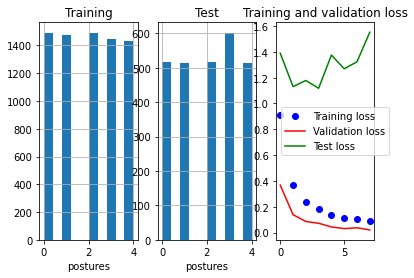

84/84 - 0s - loss: 1.5520 - accuracy: 0.6863

Test accuracy: 0.6863039135932922


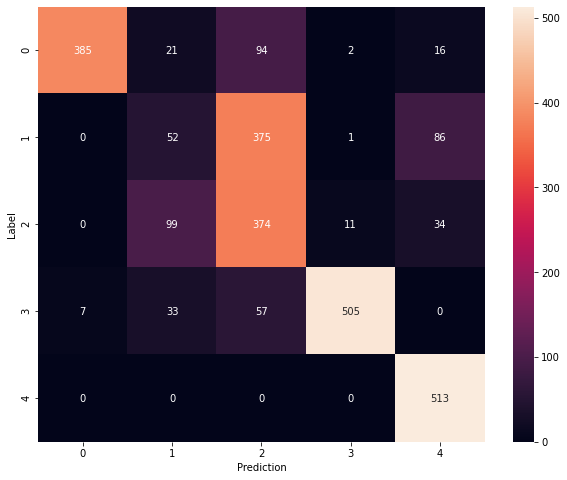

Model: "sequential_567"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_567 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1134 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                4060      
_________________________________________________________________
dropout_1135 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,735
Trainable params: 5,735
Non-trainable params: 0
__________________________________________________

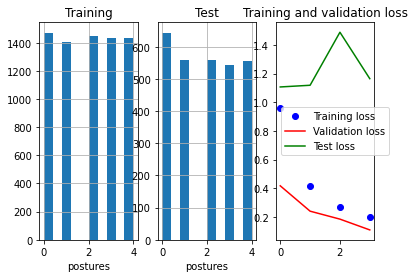

90/90 - 0s - loss: 1.1645 - accuracy: 0.6742

Test accuracy: 0.6742397546768188


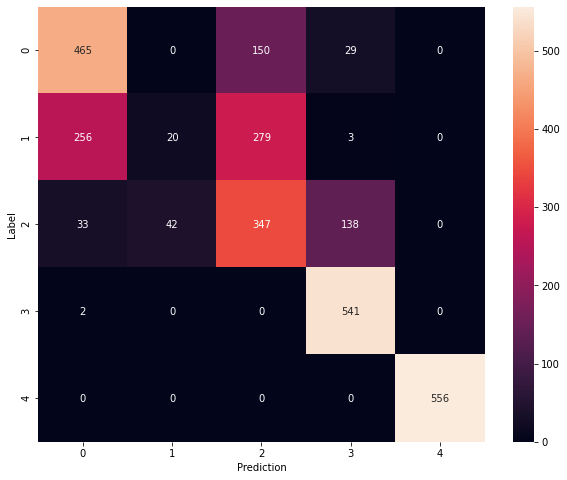

Model: "sequential_568"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_568 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1136 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                4060      
_________________________________________________________________
dropout_1137 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,735
Trainable params: 5,735
Non-trainable params: 0
__________________________________________________

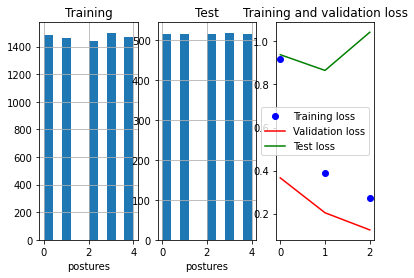

81/81 - 0s - loss: 1.0427 - accuracy: 0.6151

Test accuracy: 0.6150562763214111


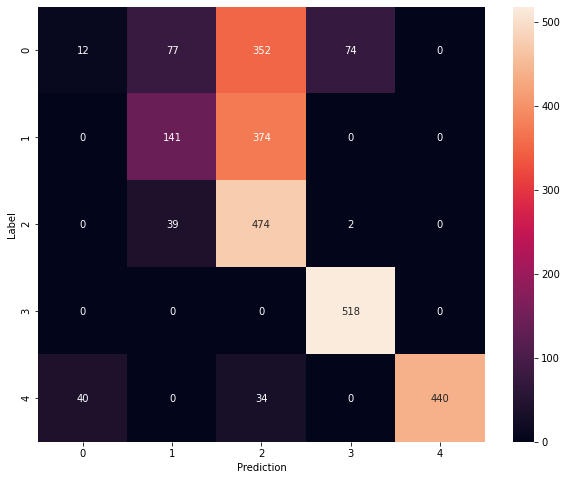

Model: "sequential_569"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_569 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1138 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                4060      
_________________________________________________________________
dropout_1139 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,735
Trainable params: 5,735
Non-trainable params: 0
__________________________________________________

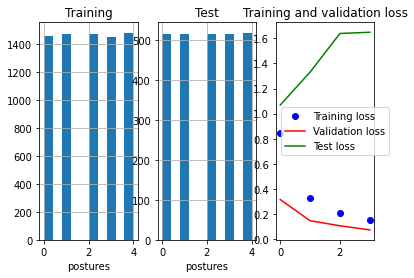

81/81 - 0s - loss: 1.6487 - accuracy: 0.5275

Test accuracy: 0.5275407433509827


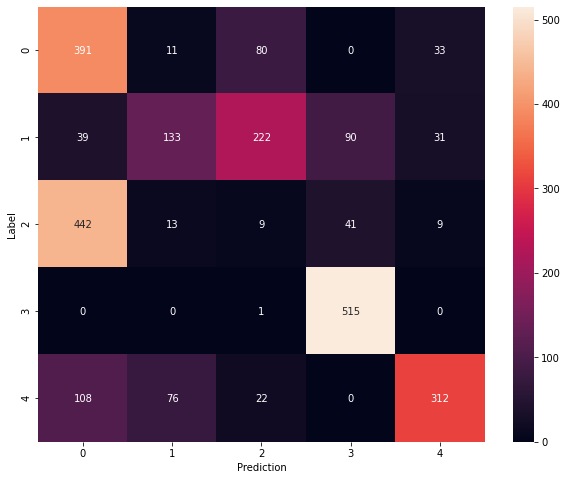

Model: "sequential_570"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_570 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1140 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                4060      
_________________________________________________________________
dropout_1141 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,735
Trainable params: 5,735
Non-trainable params: 0
__________________________________________________

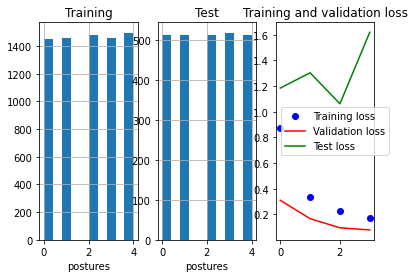

81/81 - 0s - loss: 1.6197 - accuracy: 0.6667

Test accuracy: 0.6666666865348816


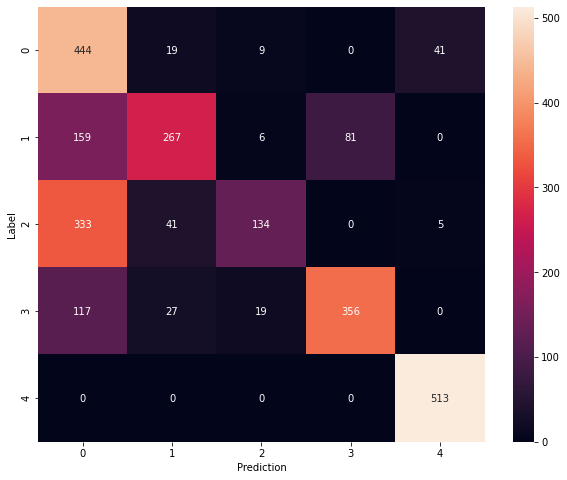

Model: "sequential_571"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_571 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1142 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                4060      
_________________________________________________________________
dropout_1143 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,735
Trainable params: 5,735
Non-trainable params: 0
__________________________________________________

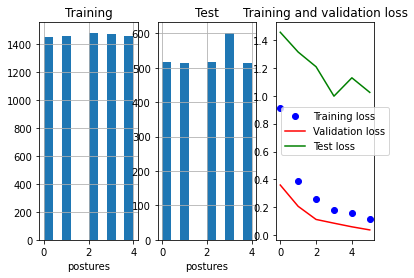

84/84 - 0s - loss: 1.0242 - accuracy: 0.6867

Test accuracy: 0.6866791844367981


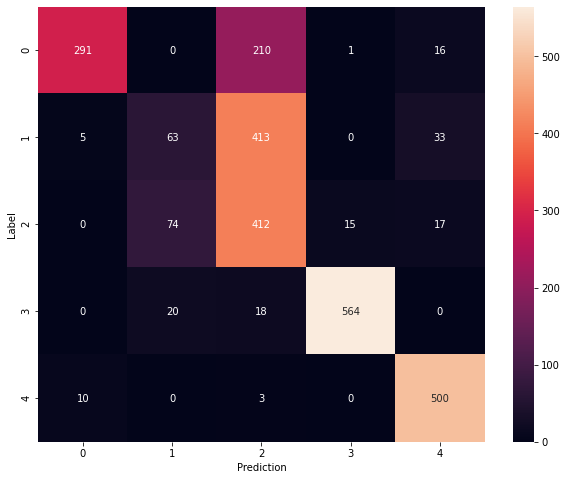

Model: "sequential_572"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_572 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1144 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                4060      
_________________________________________________________________
dropout_1145 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,735
Trainable params: 5,735
Non-trainable params: 0
__________________________________________________

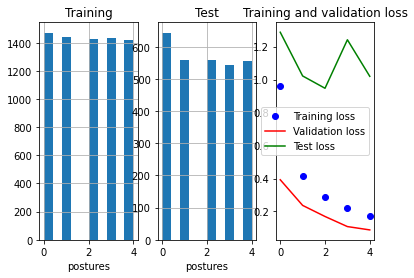

90/90 - 0s - loss: 1.0194 - accuracy: 0.6756

Test accuracy: 0.6756379008293152


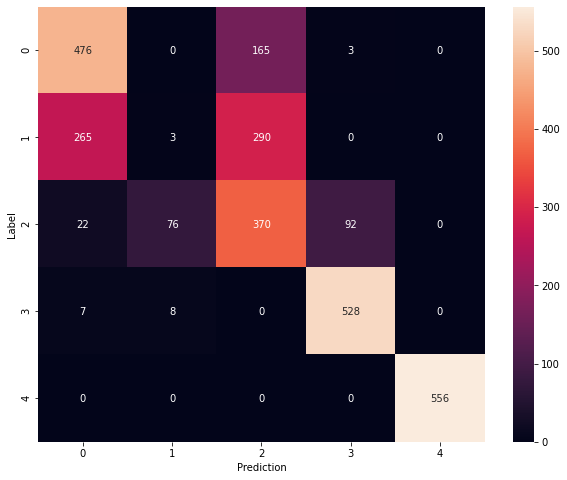

Model: "sequential_573"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_573 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1146 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                4060      
_________________________________________________________________
dropout_1147 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,735
Trainable params: 5,735
Non-trainable params: 0
__________________________________________________

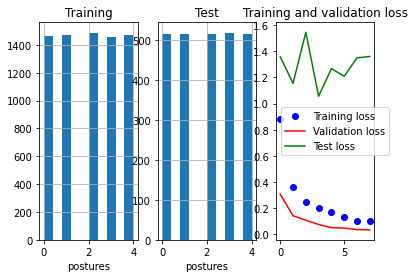

81/81 - 0s - loss: 1.3609 - accuracy: 0.6779

Test accuracy: 0.6779200434684753


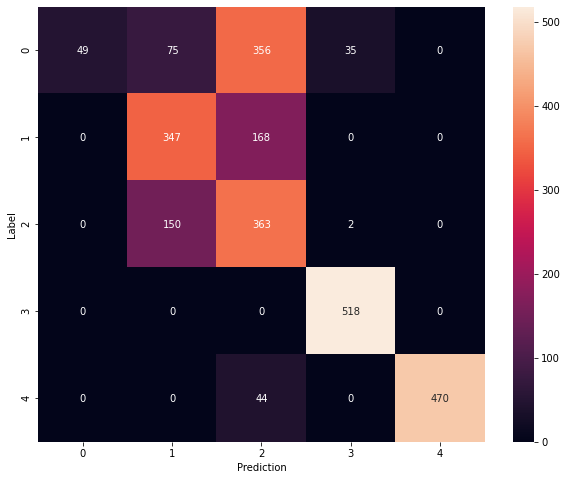

Model: "sequential_574"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_574 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1148 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                4060      
_________________________________________________________________
dropout_1149 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,735
Trainable params: 5,735
Non-trainable params: 0
__________________________________________________

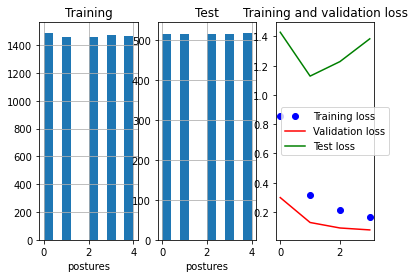

81/81 - 0s - loss: 1.3837 - accuracy: 0.5663

Test accuracy: 0.5663304924964905


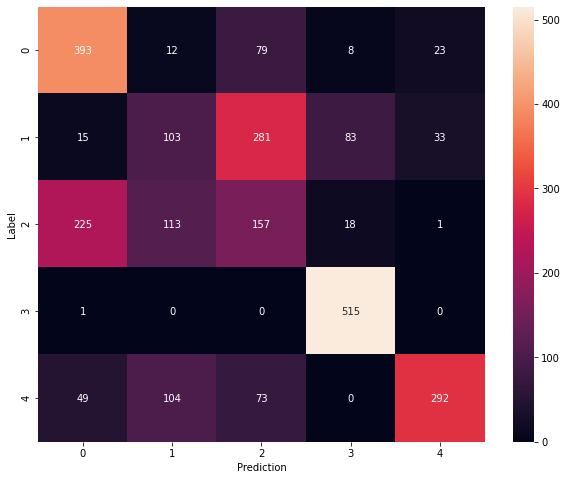

Model: "sequential_575"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_575 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1150 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                4060      
_________________________________________________________________
dropout_1151 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,735
Trainable params: 5,735
Non-trainable params: 0
__________________________________________________

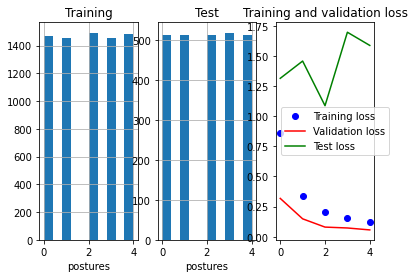

81/81 - 0s - loss: 1.5865 - accuracy: 0.6612

Test accuracy: 0.6612213253974915


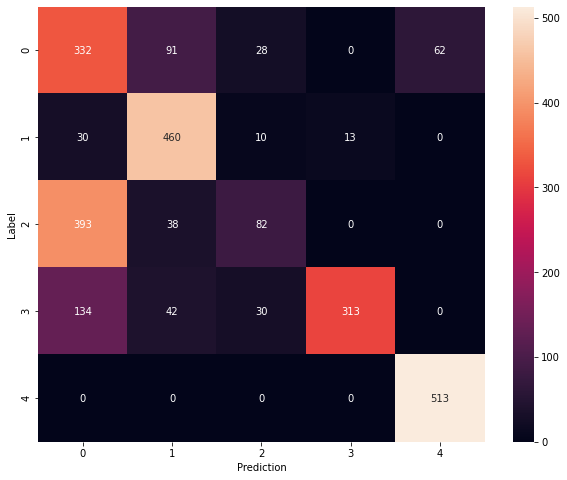

Model: "sequential_576"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_576 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1152 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4640      
_________________________________________________________________
dropout_1153 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,340
Trainable params: 6,340
Non-trainable params: 0
__________________________________________________

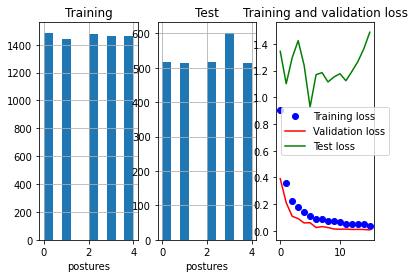

84/84 - 0s - loss: 1.4870 - accuracy: 0.7396

Test accuracy: 0.7395872473716736


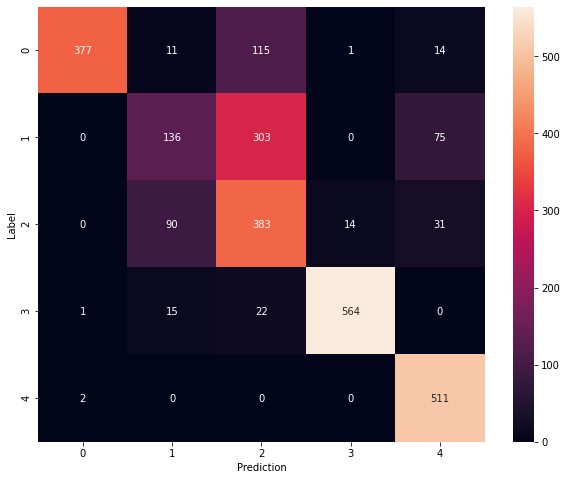

Model: "sequential_577"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_577 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1154 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4640      
_________________________________________________________________
dropout_1155 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,340
Trainable params: 6,340
Non-trainable params: 0
__________________________________________________

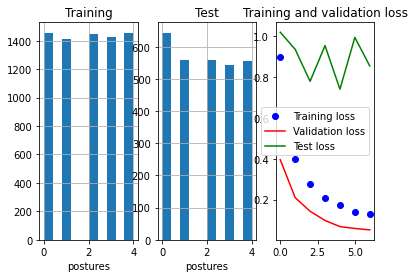

90/90 - 0s - loss: 0.8549 - accuracy: 0.7151

Test accuracy: 0.7151345610618591


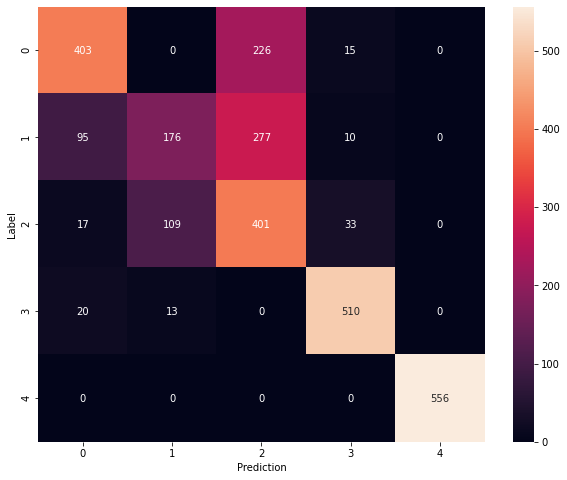

Model: "sequential_578"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_578 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1156 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4640      
_________________________________________________________________
dropout_1157 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,340
Trainable params: 6,340
Non-trainable params: 0
__________________________________________________

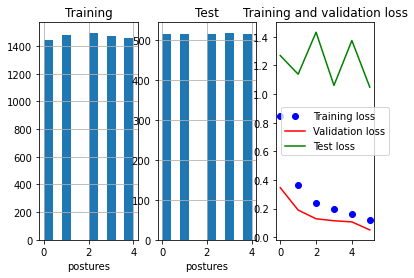

81/81 - 0s - loss: 1.0489 - accuracy: 0.6868

Test accuracy: 0.6868451833724976


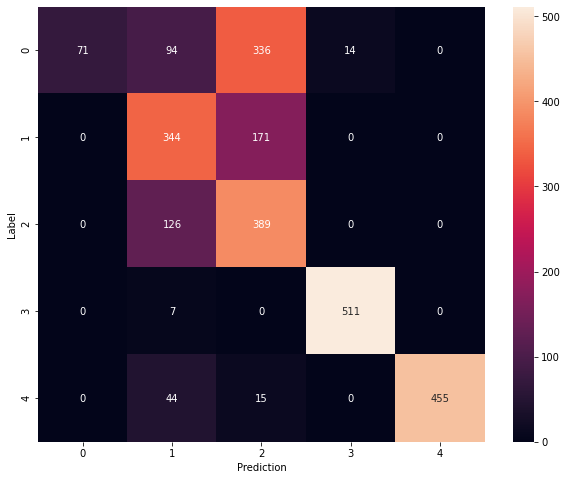

Model: "sequential_579"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_579 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1158 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4640      
_________________________________________________________________
dropout_1159 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,340
Trainable params: 6,340
Non-trainable params: 0
__________________________________________________

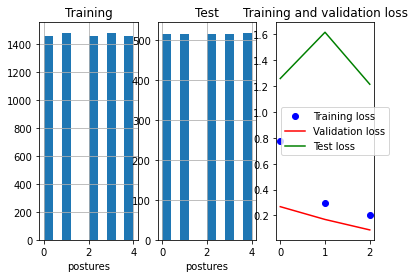

81/81 - 0s - loss: 1.2148 - accuracy: 0.5512

Test accuracy: 0.5512024760246277


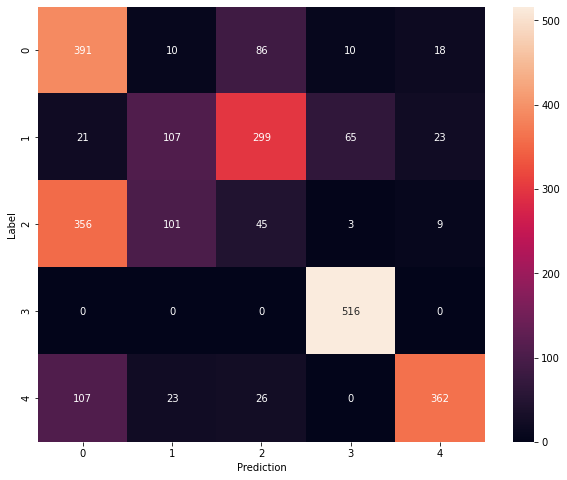

Model: "sequential_580"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_580 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1160 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4640      
_________________________________________________________________
dropout_1161 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,340
Trainable params: 6,340
Non-trainable params: 0
__________________________________________________

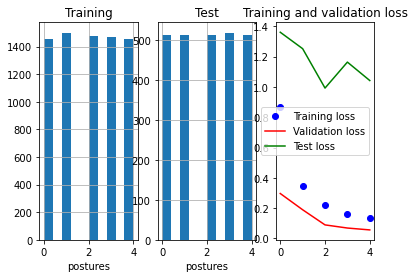

81/81 - 0s - loss: 1.0422 - accuracy: 0.7448

Test accuracy: 0.7448463439941406


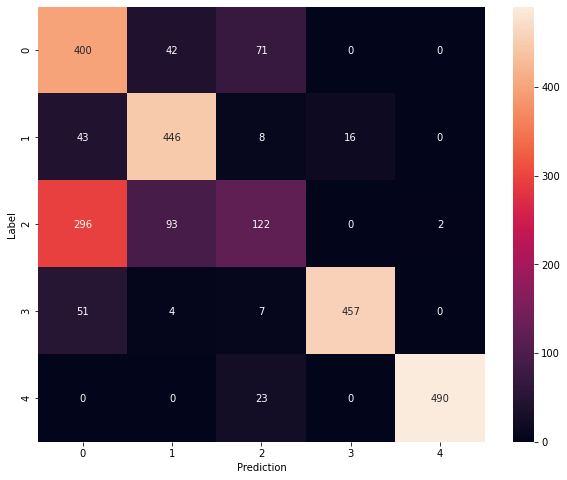

Model: "sequential_581"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_581 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1162 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4640      
_________________________________________________________________
dropout_1163 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,340
Trainable params: 6,340
Non-trainable params: 0
__________________________________________________

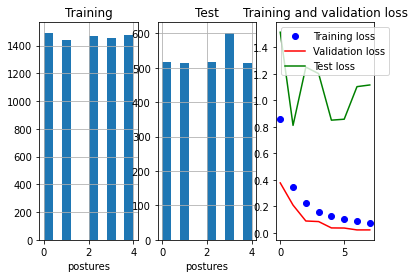

84/84 - 0s - loss: 1.1164 - accuracy: 0.6540

Test accuracy: 0.6540337800979614


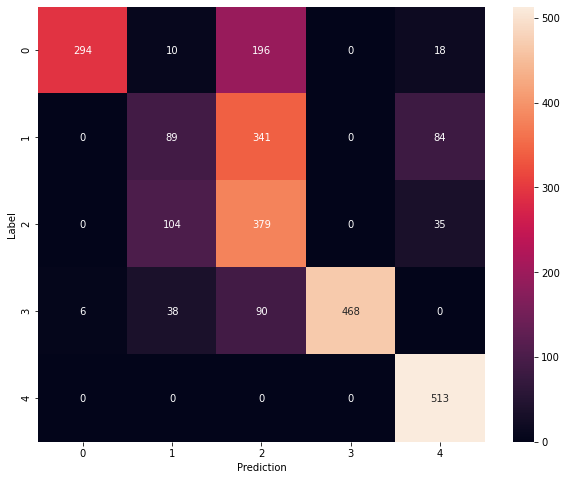

Model: "sequential_582"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_582 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1164 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4640      
_________________________________________________________________
dropout_1165 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,340
Trainable params: 6,340
Non-trainable params: 0
__________________________________________________

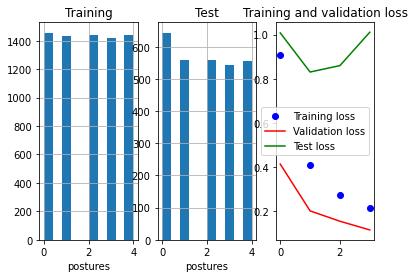

90/90 - 0s - loss: 1.0103 - accuracy: 0.7197

Test accuracy: 0.7196784615516663


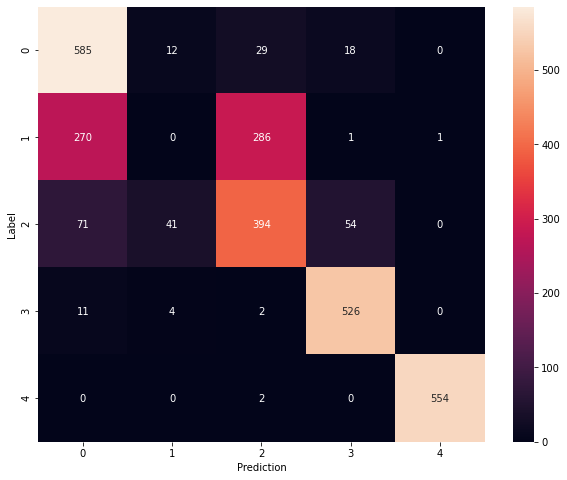

Model: "sequential_583"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_583 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1166 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4640      
_________________________________________________________________
dropout_1167 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,340
Trainable params: 6,340
Non-trainable params: 0
__________________________________________________

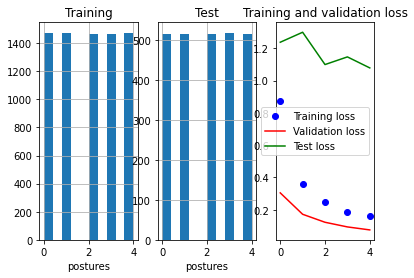

81/81 - 0s - loss: 1.0790 - accuracy: 0.6597

Test accuracy: 0.6596817970275879


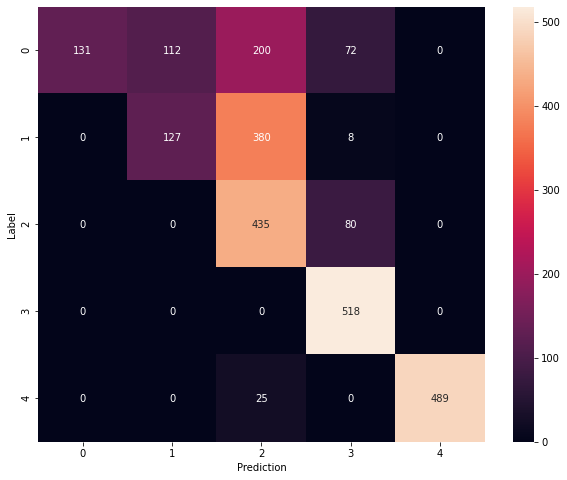

Model: "sequential_584"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_584 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1168 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4640      
_________________________________________________________________
dropout_1169 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,340
Trainable params: 6,340
Non-trainable params: 0
__________________________________________________

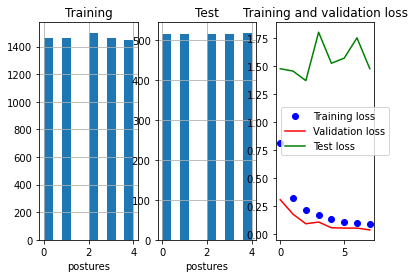

81/81 - 0s - loss: 1.4784 - accuracy: 0.5702

Test accuracy: 0.5702094435691833


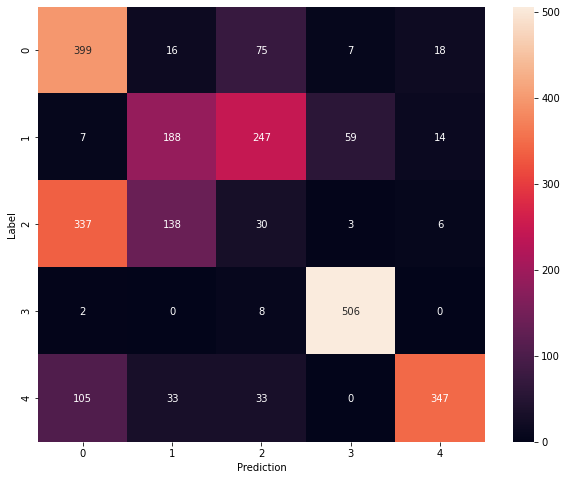

Model: "sequential_585"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_585 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 115)               1495      
_________________________________________________________________
dropout_1170 (Dropout)       (None, 115)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4640      
_________________________________________________________________
dropout_1171 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,340
Trainable params: 6,340
Non-trainable params: 0
__________________________________________________

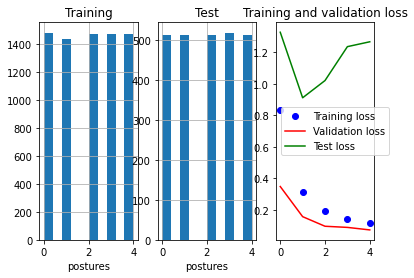

81/81 - 0s - loss: 1.2657 - accuracy: 0.6861

Test accuracy: 0.6861143708229065


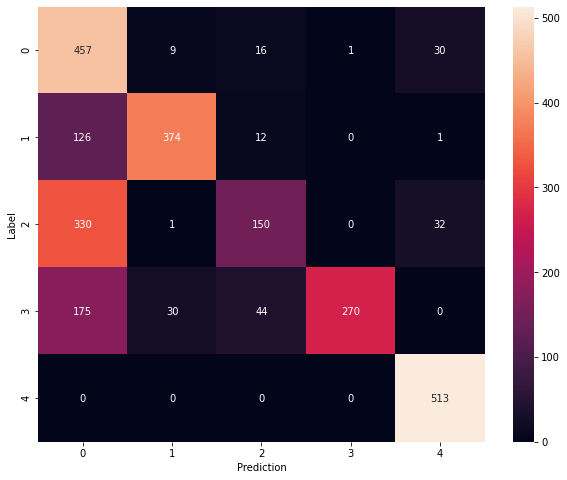

Model: "sequential_586"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_586 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1172 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3630      
_________________________________________________________________
dropout_1173 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 5,345
Trainable params: 5,345
Non-trainable params: 0
__________________________________________________

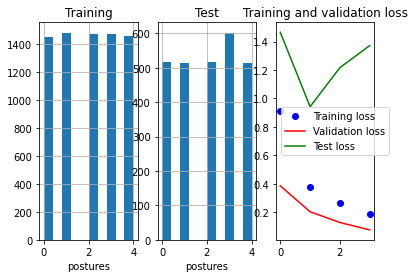

84/84 - 0s - loss: 1.3721 - accuracy: 0.6570

Test accuracy: 0.6570356488227844


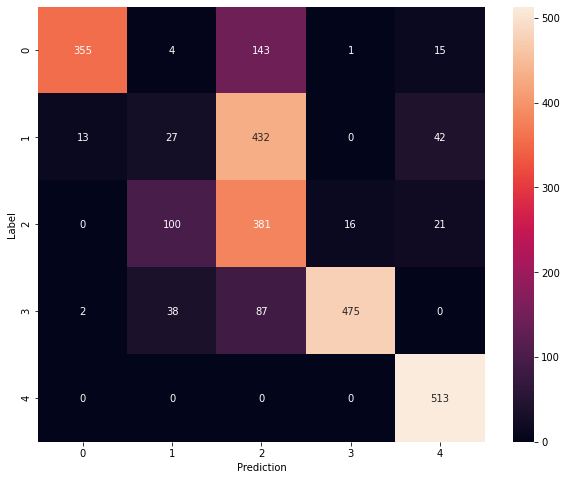

Model: "sequential_587"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_587 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1174 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3630      
_________________________________________________________________
dropout_1175 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 5,345
Trainable params: 5,345
Non-trainable params: 0
__________________________________________________

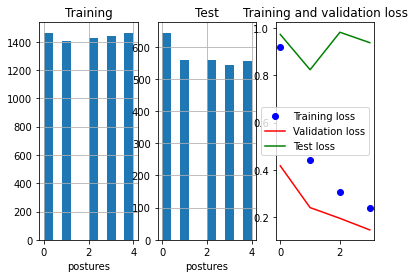

90/90 - 0s - loss: 0.9380 - accuracy: 0.6879

Test accuracy: 0.6878713965415955


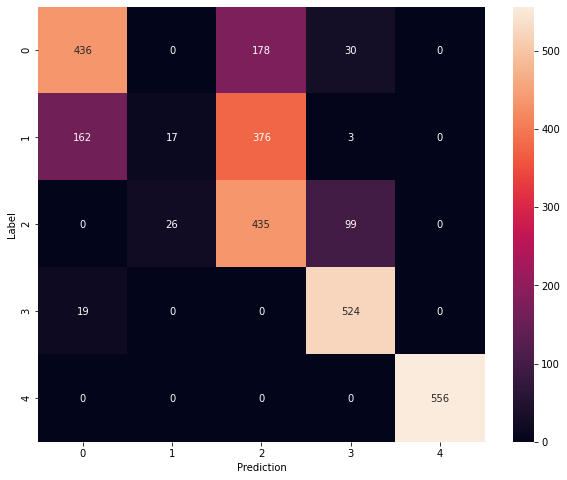

Model: "sequential_588"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_588 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1176 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3630      
_________________________________________________________________
dropout_1177 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 5,345
Trainable params: 5,345
Non-trainable params: 0
__________________________________________________

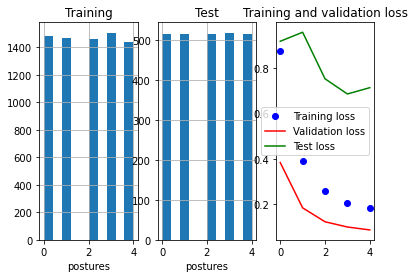

81/81 - 0s - loss: 0.7124 - accuracy: 0.7148

Test accuracy: 0.7147846221923828


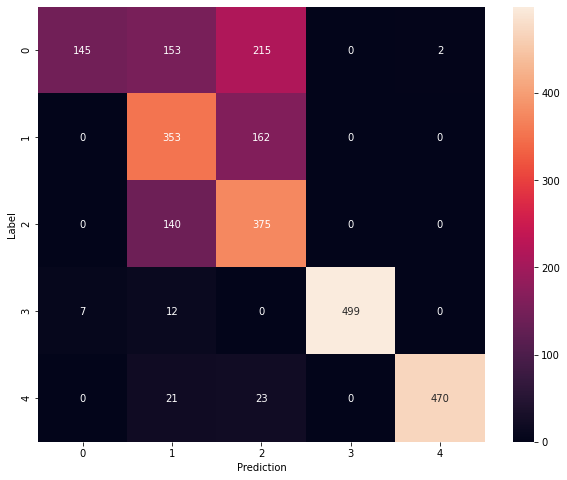

Model: "sequential_589"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_589 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1178 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3630      
_________________________________________________________________
dropout_1179 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 5,345
Trainable params: 5,345
Non-trainable params: 0
__________________________________________________

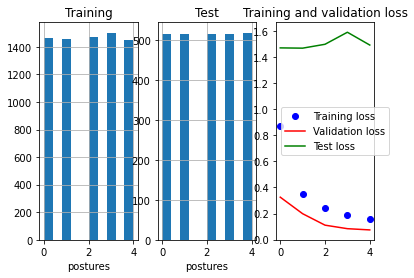

81/81 - 0s - loss: 1.4926 - accuracy: 0.5497

Test accuracy: 0.5496509075164795


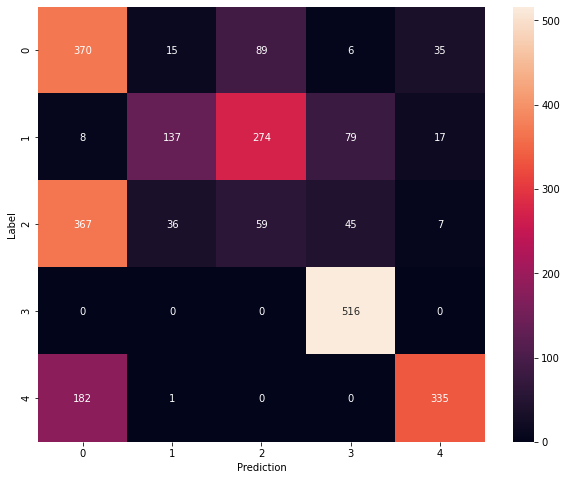

Model: "sequential_590"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_590 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1180 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3630      
_________________________________________________________________
dropout_1181 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 5,345
Trainable params: 5,345
Non-trainable params: 0
__________________________________________________

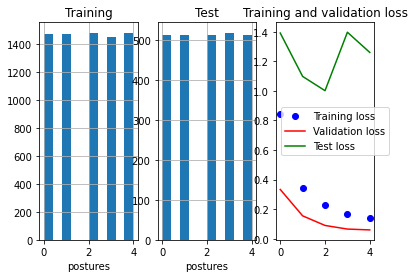

81/81 - 0s - loss: 1.2597 - accuracy: 0.6772

Test accuracy: 0.6771684288978577


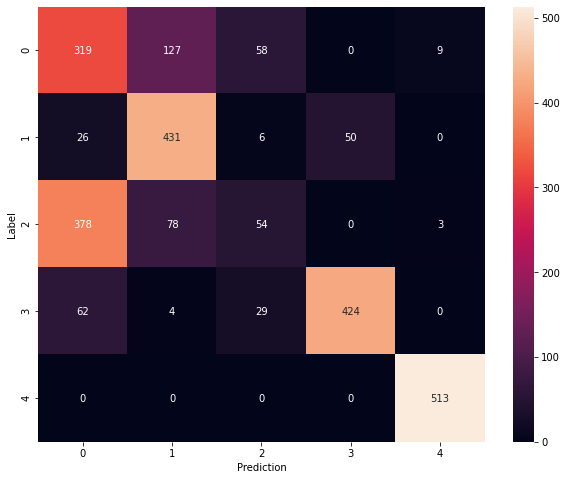

Model: "sequential_591"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_591 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1182 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3630      
_________________________________________________________________
dropout_1183 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 5,345
Trainable params: 5,345
Non-trainable params: 0
__________________________________________________

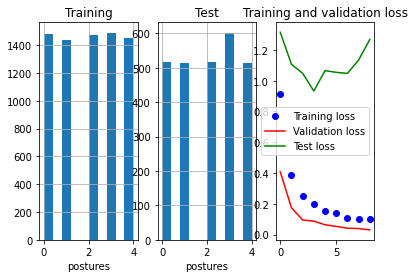

84/84 - 0s - loss: 1.2678 - accuracy: 0.6762

Test accuracy: 0.6761726140975952


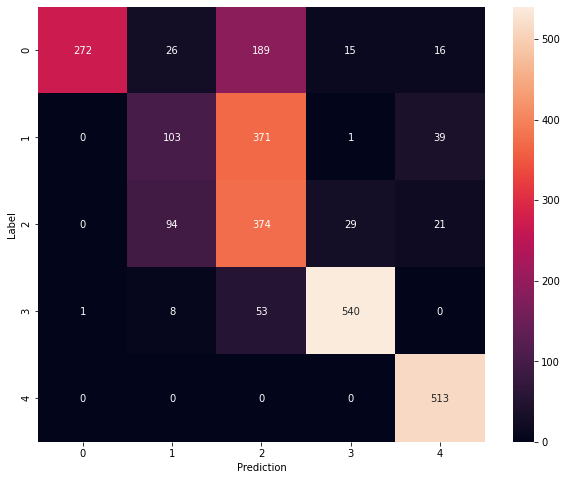

Model: "sequential_592"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_592 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1184 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3630      
_________________________________________________________________
dropout_1185 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 5,345
Trainable params: 5,345
Non-trainable params: 0
__________________________________________________

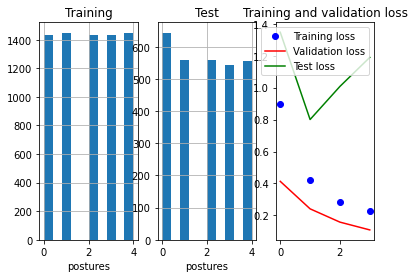

90/90 - 0s - loss: 1.1894 - accuracy: 0.6578

Test accuracy: 0.6578119397163391


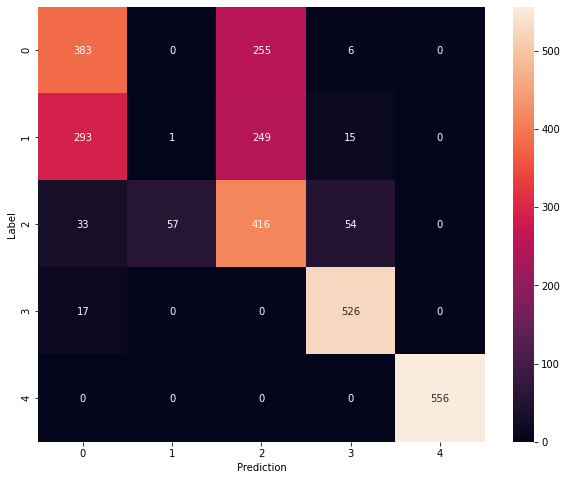

Model: "sequential_593"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_593 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1186 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3630      
_________________________________________________________________
dropout_1187 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 5,345
Trainable params: 5,345
Non-trainable params: 0
__________________________________________________

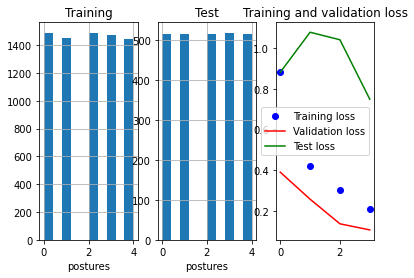

81/81 - 0s - loss: 0.7483 - accuracy: 0.6527

Test accuracy: 0.6526969075202942


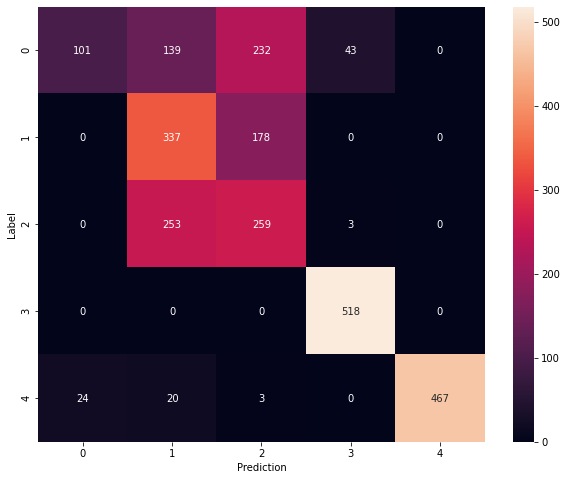

Model: "sequential_594"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_594 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1188 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3630      
_________________________________________________________________
dropout_1189 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 5,345
Trainable params: 5,345
Non-trainable params: 0
__________________________________________________

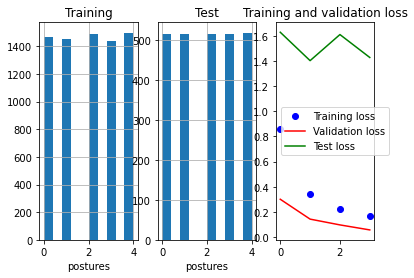

81/81 - 0s - loss: 1.4269 - accuracy: 0.5524

Test accuracy: 0.5523661971092224


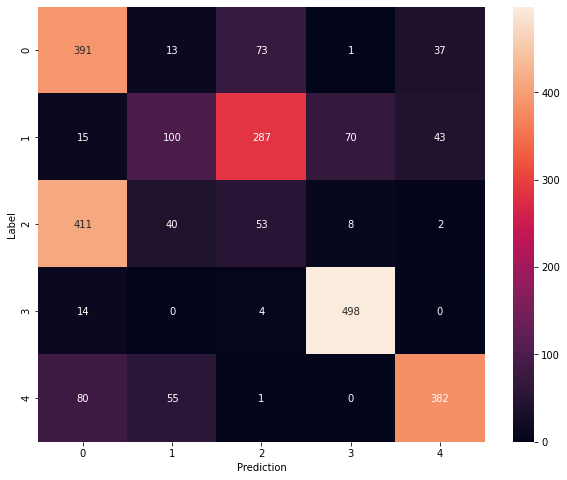

Model: "sequential_595"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_595 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1190 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 30)                3630      
_________________________________________________________________
dropout_1191 (Dropout)       (None, 30)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 155       
Total params: 5,345
Trainable params: 5,345
Non-trainable params: 0
__________________________________________________

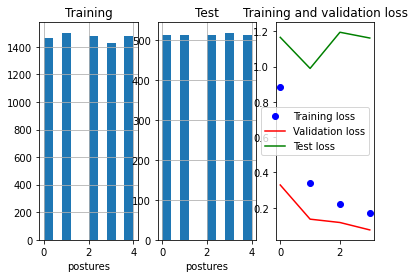

81/81 - 0s - loss: 1.1615 - accuracy: 0.6970

Test accuracy: 0.697005033493042


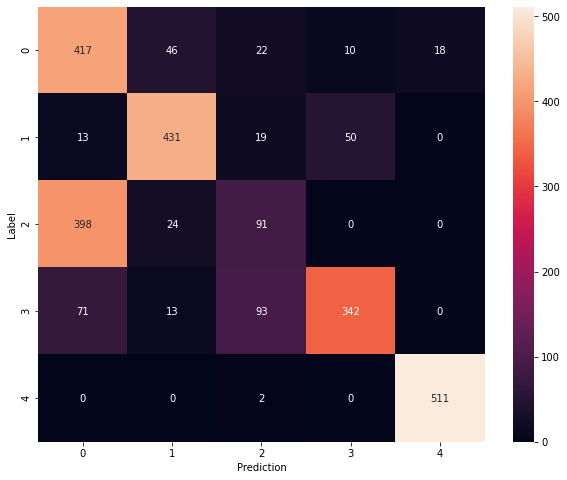

Model: "sequential_596"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_596 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1192 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                4235      
_________________________________________________________________
dropout_1193 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,975
Trainable params: 5,975
Non-trainable params: 0
__________________________________________________

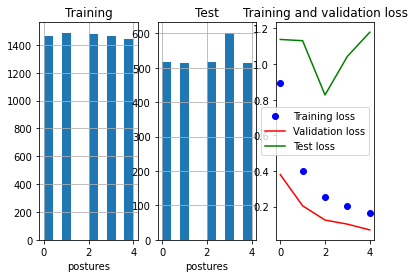

84/84 - 0s - loss: 1.1784 - accuracy: 0.7009

Test accuracy: 0.7009381055831909


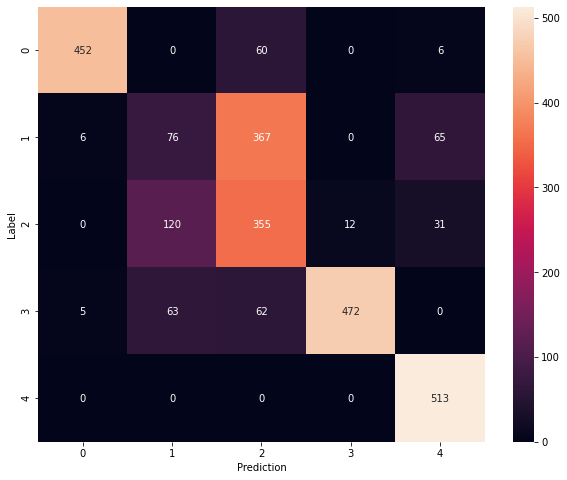

Model: "sequential_597"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_597 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1194 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                4235      
_________________________________________________________________
dropout_1195 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,975
Trainable params: 5,975
Non-trainable params: 0
__________________________________________________

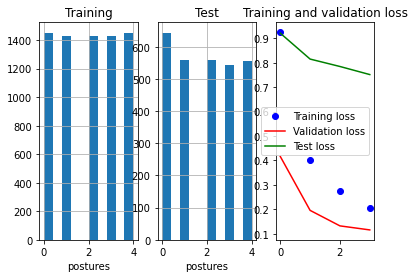

90/90 - 0s - loss: 0.7516 - accuracy: 0.6917

Test accuracy: 0.691716194152832


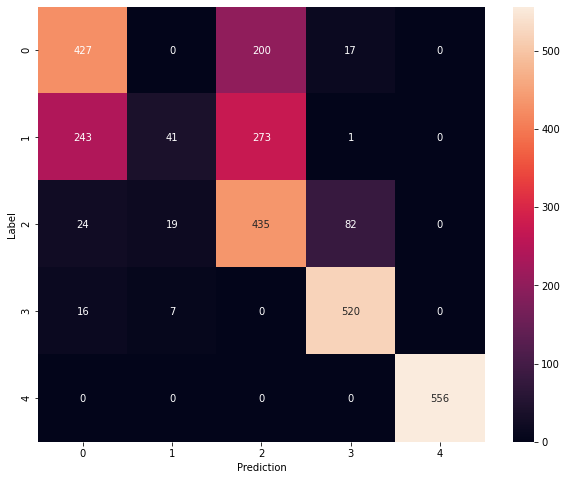

Model: "sequential_598"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_598 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1196 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                4235      
_________________________________________________________________
dropout_1197 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,975
Trainable params: 5,975
Non-trainable params: 0
__________________________________________________

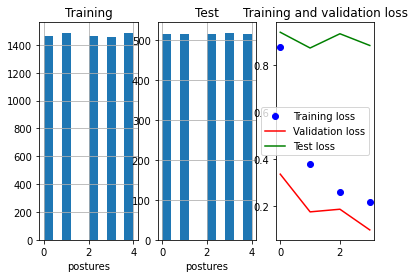

81/81 - 0s - loss: 0.8852 - accuracy: 0.6845

Test accuracy: 0.6845169067382812


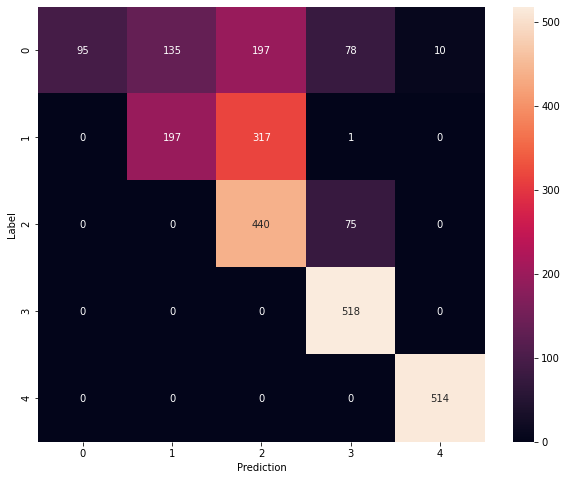

Model: "sequential_599"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_599 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1198 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                4235      
_________________________________________________________________
dropout_1199 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,975
Trainable params: 5,975
Non-trainable params: 0
__________________________________________________

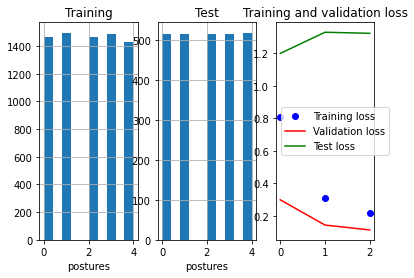

81/81 - 0s - loss: 1.3232 - accuracy: 0.5469

Test accuracy: 0.5469356179237366


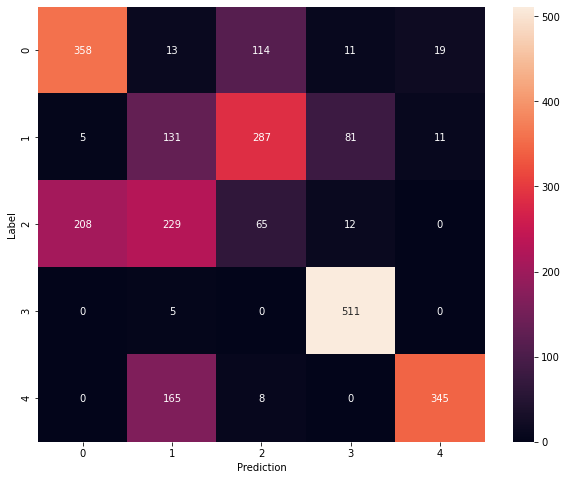

Model: "sequential_600"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_600 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1200 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                4235      
_________________________________________________________________
dropout_1201 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,975
Trainable params: 5,975
Non-trainable params: 0
__________________________________________________

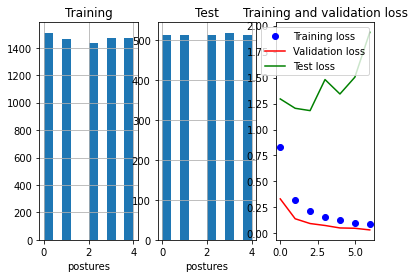

81/81 - 0s - loss: 1.9363 - accuracy: 0.6348

Test accuracy: 0.6347724795341492


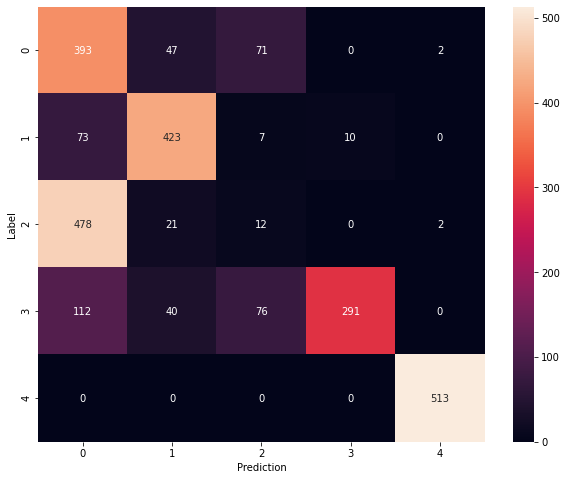

Model: "sequential_601"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_601 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1202 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                4235      
_________________________________________________________________
dropout_1203 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,975
Trainable params: 5,975
Non-trainable params: 0
__________________________________________________

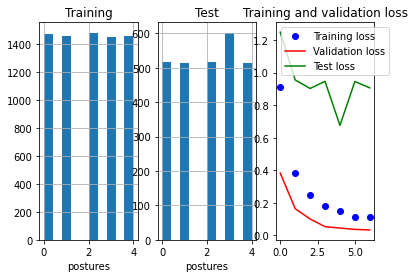

84/84 - 0s - loss: 0.9063 - accuracy: 0.7276

Test accuracy: 0.7275797128677368


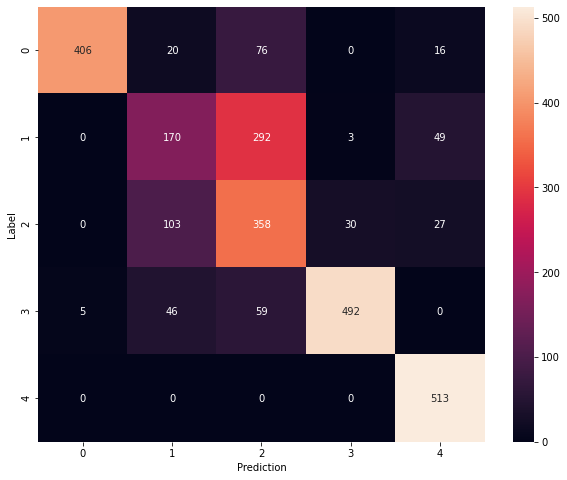

Model: "sequential_602"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_602 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1204 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                4235      
_________________________________________________________________
dropout_1205 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,975
Trainable params: 5,975
Non-trainable params: 0
__________________________________________________

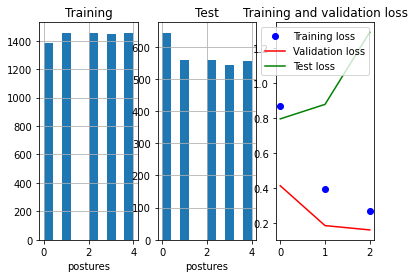

90/90 - 0s - loss: 1.2930 - accuracy: 0.6491

Test accuracy: 0.6490737795829773


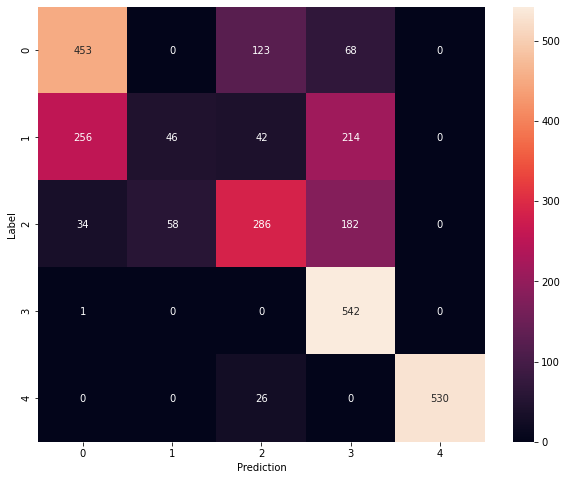

Model: "sequential_603"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_603 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1206 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                4235      
_________________________________________________________________
dropout_1207 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,975
Trainable params: 5,975
Non-trainable params: 0
__________________________________________________

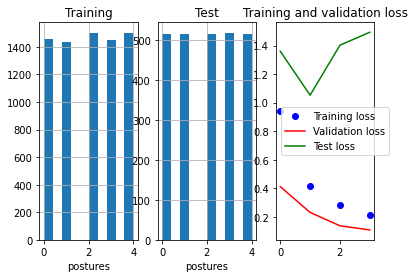

81/81 - 0s - loss: 1.4933 - accuracy: 0.6508

Test accuracy: 0.6507567167282104


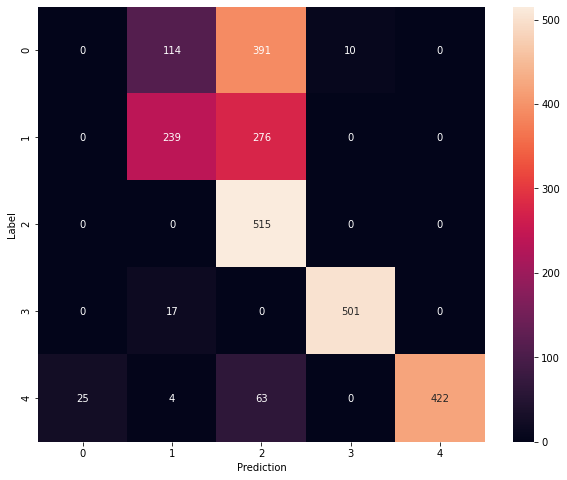

Model: "sequential_604"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_604 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1208 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                4235      
_________________________________________________________________
dropout_1209 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,975
Trainable params: 5,975
Non-trainable params: 0
__________________________________________________

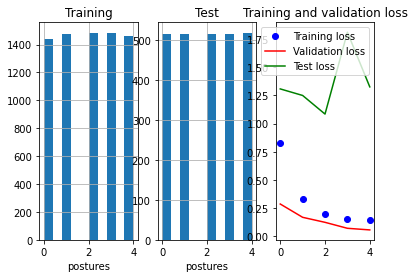

81/81 - 0s - loss: 1.3259 - accuracy: 0.5912

Test accuracy: 0.5911559462547302


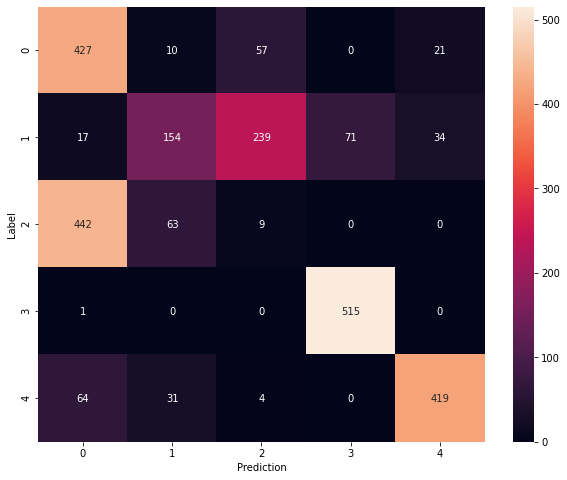

Model: "sequential_605"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_605 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1210 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 35)                4235      
_________________________________________________________________
dropout_1211 (Dropout)       (None, 35)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 180       
Total params: 5,975
Trainable params: 5,975
Non-trainable params: 0
__________________________________________________

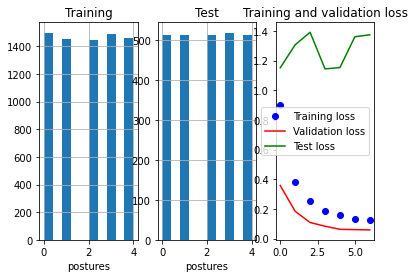

81/81 - 0s - loss: 1.3742 - accuracy: 0.6834

Test accuracy: 0.6833916902542114


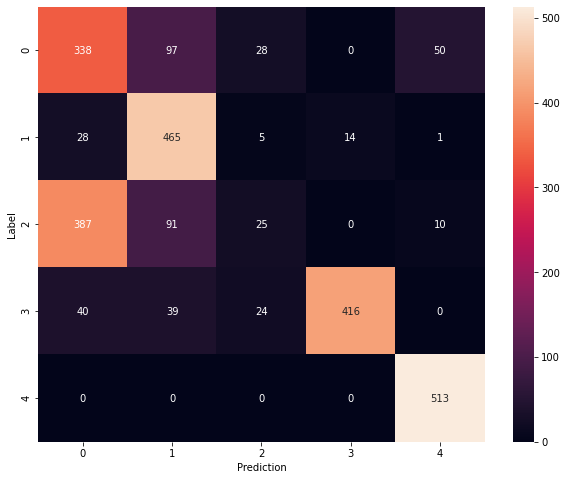

Model: "sequential_606"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_606 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1212 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4840      
_________________________________________________________________
dropout_1213 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,605
Trainable params: 6,605
Non-trainable params: 0
__________________________________________________

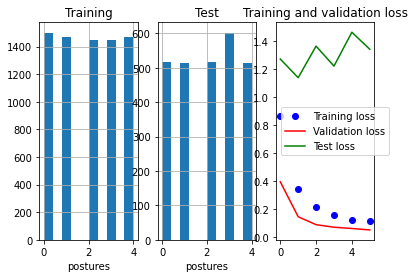

84/84 - 0s - loss: 1.3426 - accuracy: 0.6942

Test accuracy: 0.694183886051178


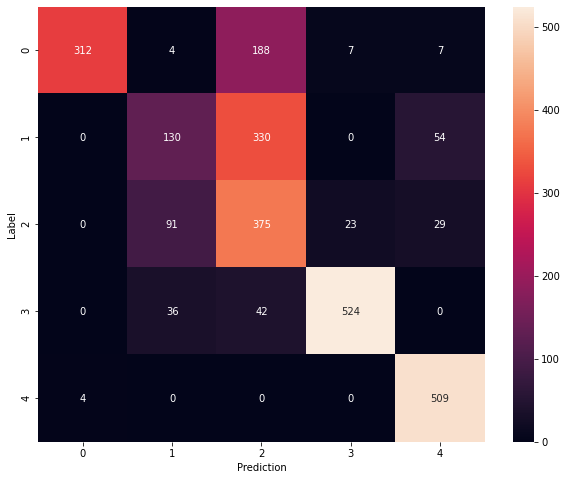

Model: "sequential_607"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_607 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1214 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4840      
_________________________________________________________________
dropout_1215 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,605
Trainable params: 6,605
Non-trainable params: 0
__________________________________________________

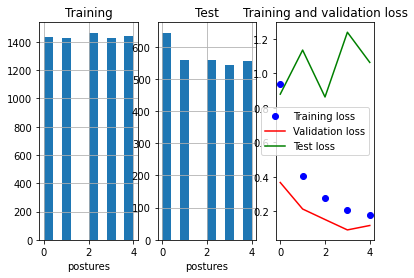

90/90 - 0s - loss: 1.0642 - accuracy: 0.6505

Test accuracy: 0.6504718661308289


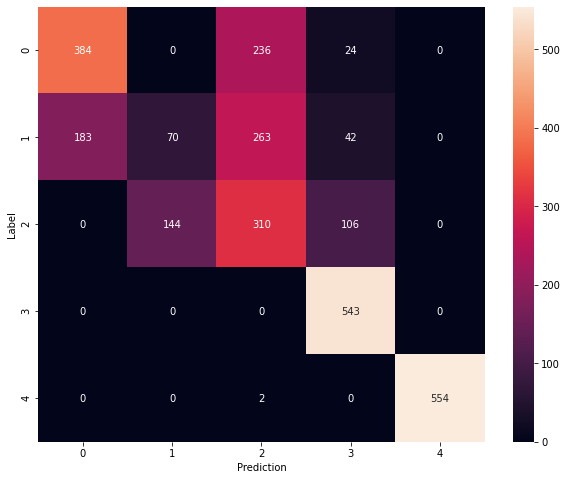

Model: "sequential_608"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_608 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1216 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4840      
_________________________________________________________________
dropout_1217 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,605
Trainable params: 6,605
Non-trainable params: 0
__________________________________________________

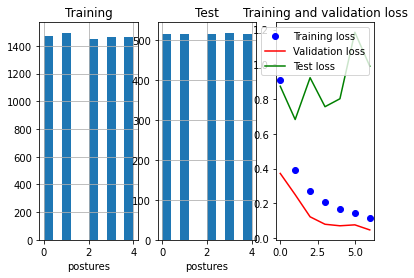

81/81 - 0s - loss: 0.9892 - accuracy: 0.7059

Test accuracy: 0.7058595418930054


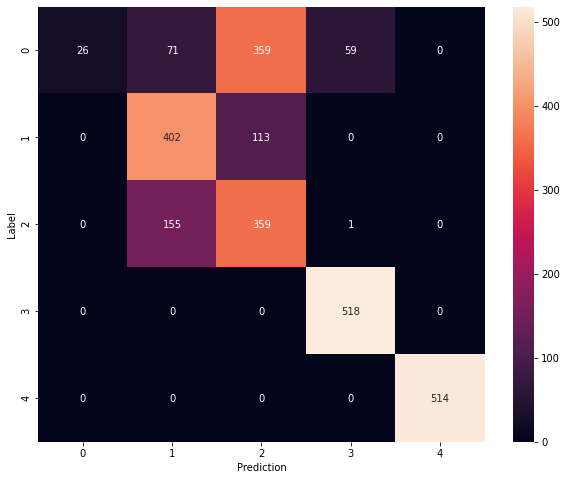

Model: "sequential_609"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_609 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1218 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4840      
_________________________________________________________________
dropout_1219 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,605
Trainable params: 6,605
Non-trainable params: 0
__________________________________________________

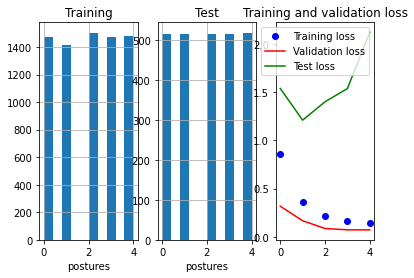

81/81 - 0s - loss: 2.1212 - accuracy: 0.5256

Test accuracy: 0.5256012678146362


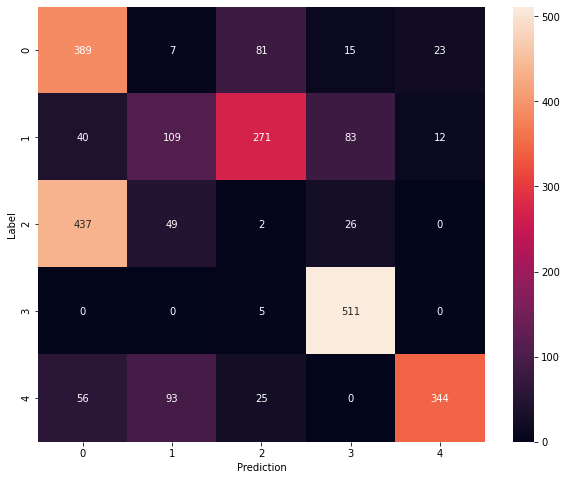

Model: "sequential_610"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_610 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1220 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4840      
_________________________________________________________________
dropout_1221 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,605
Trainable params: 6,605
Non-trainable params: 0
__________________________________________________

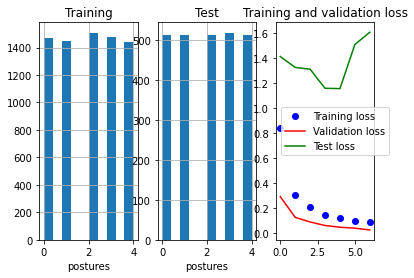

81/81 - 0s - loss: 1.6097 - accuracy: 0.6857

Test accuracy: 0.6857253909111023


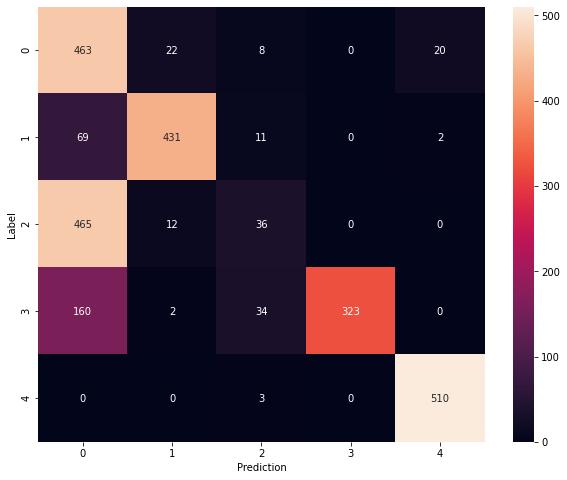

Model: "sequential_611"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_611 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1222 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4840      
_________________________________________________________________
dropout_1223 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,605
Trainable params: 6,605
Non-trainable params: 0
__________________________________________________

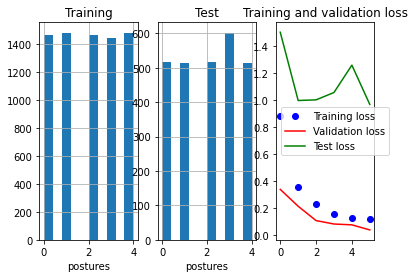

84/84 - 0s - loss: 0.9671 - accuracy: 0.7430

Test accuracy: 0.7429643273353577


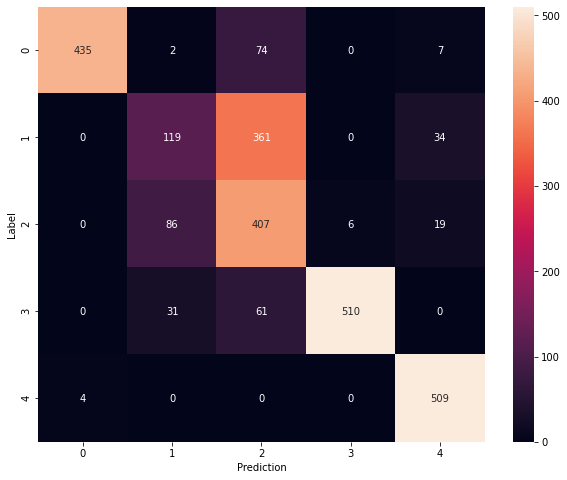

Model: "sequential_612"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_612 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1224 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4840      
_________________________________________________________________
dropout_1225 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,605
Trainable params: 6,605
Non-trainable params: 0
__________________________________________________

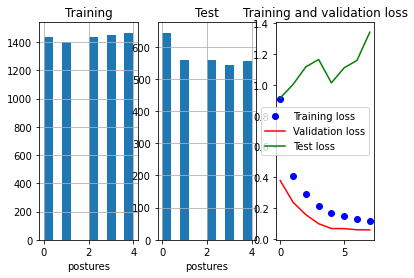

90/90 - 0s - loss: 1.3432 - accuracy: 0.6805

Test accuracy: 0.6805312633514404


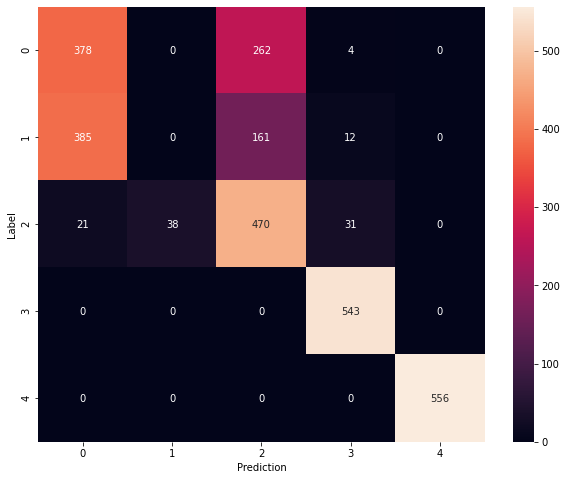

Model: "sequential_613"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_613 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1226 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4840      
_________________________________________________________________
dropout_1227 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,605
Trainable params: 6,605
Non-trainable params: 0
__________________________________________________

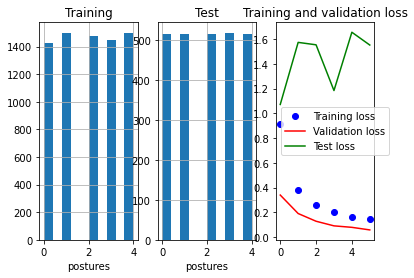

81/81 - 0s - loss: 1.5512 - accuracy: 0.7334

Test accuracy: 0.7334109544754028


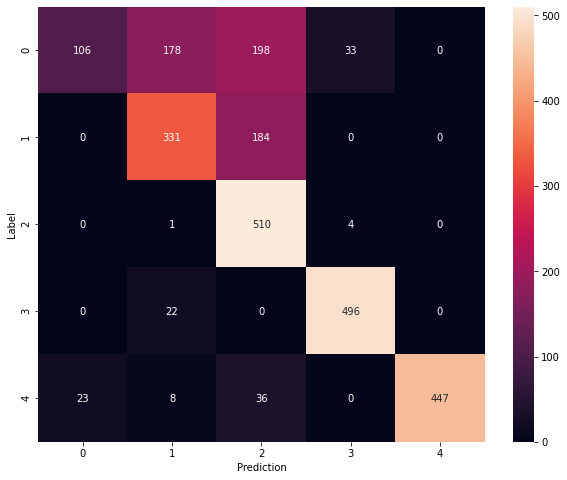

Model: "sequential_614"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_614 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1228 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4840      
_________________________________________________________________
dropout_1229 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,605
Trainable params: 6,605
Non-trainable params: 0
__________________________________________________

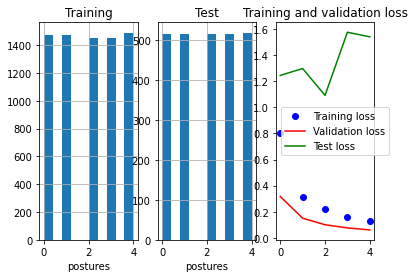

81/81 - 0s - loss: 1.5400 - accuracy: 0.6067

Test accuracy: 0.6066718101501465


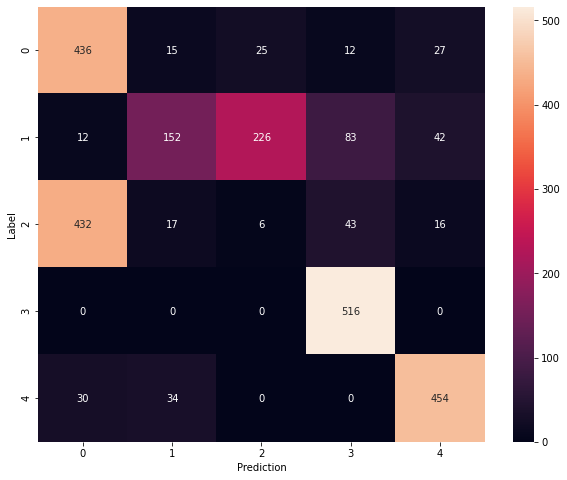

Model: "sequential_615"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_615 (Flatten)        (None, 12)                0         
_________________________________________________________________
Layer_1 (Dense)              (None, 120)               1560      
_________________________________________________________________
dropout_1230 (Dropout)       (None, 120)               0         
_________________________________________________________________
Layer_2 (Dense)              (None, 40)                4840      
_________________________________________________________________
dropout_1231 (Dropout)       (None, 40)                0         
_________________________________________________________________
Predicted_Posture (Dense)    (None, 5)                 205       
Total params: 6,605
Trainable params: 6,605
Non-trainable params: 0
__________________________________________________

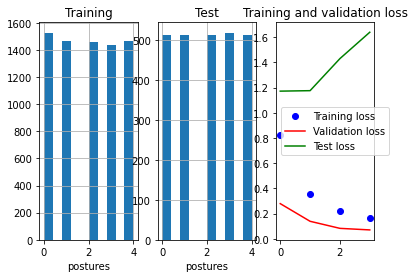

81/81 - 0s - loss: 1.6393 - accuracy: 0.6044

Test accuracy: 0.604434072971344


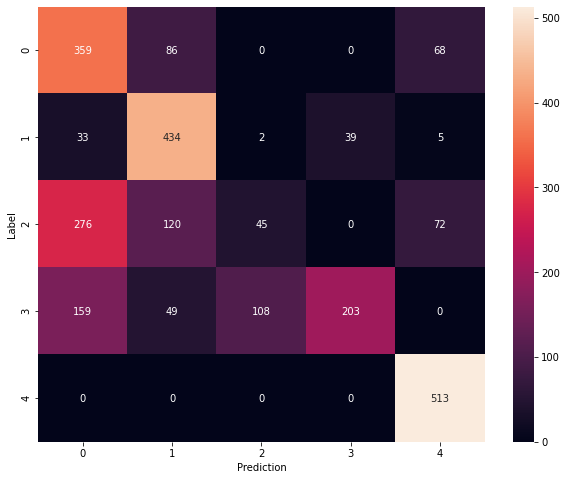

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [88]:
#########################################################################################################################################################################
#   This block of code is for trying different model configurations and seeing what works best
#########################################################################################################################################################################

#Affects the range of layers that the models will have and how much times we want to test that setup
i_range = 10
j_range = 3
k_range = 10 #use multiple of total datasets

hidden_layer_1 = 75
hidden_layer_2 = 30
hidden_layer_1_interval = 5
hidden_layer_2_interval = 5

starting_num_epochs = 30

dropout_percent = 0.2
callback_patience=2
decay_rate = 0.90
decay_steps = 200

saved_metric_name = 'Model_CONFIG_04'
#########################################################################################################################################################################

curr_run = 0
total_run = i_range*j_range*k_range 

#Test different configuration of models
test_history = pd.DataFrame(columns=['Accuracy','Layer 1','Layer 2','Dropout %','Average of','Patience','IN Learning Rate','decay_rate','decay_steps'])
for i in range(0,i_range):
  for j in range(0,j_range):
    average_accuracy = 0;
    for k in range(0,k_range):
      
      get_data(curr_run%5)
      plt.subplot(1,3,1)
      y_train.hist() #displays the histogram based on posture
      plt.title("Training")
      plt.xlabel('postures')
      plt.subplot(1,3,2)
      test_pop.hist()
      plt.title("Test")
      plt.xlabel('postures')

      initial_learning_rate = (hidden_layer_1+i*hidden_layer_1_interval)/10000
      #Creates the model structure and chooses the activation function for each layer
      model = tf.keras.Sequential([                      
          tf.keras.layers.Flatten(input_shape=(12,1)),
          tf.keras.layers.Dense(hidden_layer_1+i*hidden_layer_1_interval, activation='relu', name= "Layer_1"),  #hidden layers are generally: relu, sigmoid, tanh (Usually constant for all hidden layers)
          tf.keras.layers.Dropout(dropout_percent), #dropouts only occur during training
          tf.keras.layers.Dense(hidden_layer_2+j*hidden_layer_2_interval, activation='relu', name= "Layer_2"),  
          tf.keras.layers.Dropout(dropout_percent),
          tf.keras.layers.Dense(5, activation='linear', name= "Predicted_Posture"), #output layers are generally: linear, sigmoid, softmax
      ])
      model.summary()

      #Stops the model training early to prevent overfitting
      callbacks = [
      tf.keras.callbacks.EarlyStopping(# Stop training when `val_loss` is no longer improving
          monitor="val_accuracy",
          # min_delta=callback_delta,
          mode='auto',
          patience=callback_patience,# "no longer improving" being further defined as "for at least x epochs"
          verbose=1,
        )
      ] 

      #Addes the x_val dataset to be tested 
      val_test = AdditionalValidationSets([(x_val, y_val, 'val2')])

      #Saves the models when the accuracy is highest based on the test values
      checkpoint_path = "training_"+str(curr_run)+"/cp.ckpt"
      checkpoint_dir = os.path.dirname(checkpoint_path)
      cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path, monitor="val_accuracy",mode= "auto",save_best_only=True,save_weights_only=True,verbose=1)

      #Assign type of: optimizer, loss, and metric
      lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(initial_learning_rate, decay_steps=decay_steps, decay_rate=decay_rate, staircase=True)
      opt = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
      model.compile(optimizer=opt,loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),metrics=['accuracy'])

      #Print out which loop we are undergoing
      print(str(curr_run)+" out of "+str(total_run) + " runs")

      #Train the model with the training data and save the stats in history
      history = model.fit(x_train,y_train,epochs=starting_num_epochs,callbacks = [val_test,callbacks,cp_callback],validation_data=(test, test_pop))

      #Plots the training vs validation loss
      loss = history.history['loss']
      test_loss = history.history['val_loss']
      val_loss = val_test.history['val2_loss']
      epochs = history.epoch
      plt.subplot(1,3,3)
      plt.plot(epochs, loss, 'bo', label='Training loss')
      plt.plot(epochs, val_loss, 'r', label='Validation loss')
      plt.plot(epochs, test_loss, 'g', label='Test loss')
      plt.title('Training and validation loss')
      plt.legend()
      plt.show()

      #Test the model with unseen data from the original training dataset that was split
      # x_test_loss, x_test_acc = model.evaluate(x_test,  y_test, verbose=2)
      # print('\nX_Test accuracy:', x_test_acc)

      #Test the model with unseen data and record the settings
      test_loss, test_acc = model.evaluate(test,  test_pop, verbose=2)
      print('\nTest accuracy:', test_acc)

      #create a confusion matrix to see model performance
      predictions = model.predict(test)
      predictions = np.argmax(predictions,axis = 1)
      confusion_mtx = tf.math.confusion_matrix(
          test_pop, predictions, 5, weights=None, dtype=tf.dtypes.int32,
          name='PCD_Confusion_Matrix'
      )
      plt.figure(figsize=(10, 8))
      sns.heatmap(confusion_mtx,annot=True, fmt='g')
      plt.xlabel('Prediction')
      plt.ylabel('Label')
      plt.show()
      average_accuracy = average_accuracy + test_acc
      curr_run = curr_run + 1

    #Records the test results for specific model configuration
    average_accuracy = average_accuracy/k_range
    new_row = {'Accuracy':average_accuracy,'Layer 1':hidden_layer_1+i*hidden_layer_1_interval,'Layer 2':hidden_layer_2+j*hidden_layer_2_interval,'Dropout %':dropout_percent,
               'Average of':k_range,'Patience':callback_patience,'IN Learning Rate':initial_learning_rate,'decay_rate':decay_rate,'decay_steps':decay_steps}
    test_history = test_history.append(new_row, ignore_index=True)
test_history.to_csv(saved_metric_name+".csv",index=False)
from google.colab import files
files.download(saved_metric_name+".csv")
#########################################################################################################################################################################

In [132]:
# Loads the weights
model.load_weights("training_1/cp.ckpt")

# Re-evaluate the model
loss, acc = model.evaluate(test, test_pop, verbose=2)
print("Restored model, accuracy: {:5.2f}%".format(100 * acc))

90/90 - 0s - loss: 1.0651 - accuracy: 0.5883
Restored model, accuracy: 58.83%


In [140]:
 test_history

,Accuracy,Layer 1,Layer 2,Dropout %,Average of,Patience,IN Learning Rate,decay_rate,decay_steps
0,0.383865,30.0,15.0,0.1,1.0,2.0,0.003,0.9,200.0
1,0.569381,30.0,20.0,0.1,1.0,2.0,0.003,0.9,200.0


In [77]:
def softmax(x):
    ex = np.exp(x)
    sum_ex = np.sum( np.exp(x))
    return ex/sum_ex

In [87]:
predictions = model.predict(test[1:2])
predictions = softmax(predictions)
predictions = predictions*100
np.round(predictions,3)

array([[3.5357e+01, 5.7385e+01, 7.0240e+00, 6.0000e-03, 2.2800e-01]],
      dtype=float32)

In [76]:
from google.colab import files
test_history.to_csv('Dropout_01_5.csv',index=False)
files.download("Dropout_01_5.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **CONVERT**

In [99]:
#########################################################################################################################################################################
#   Optimize the model for size and convert to tflite model
#########################################################################################################################################################################

#Covert the model to a tflite model & optimize to reduce the size
converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.optimizations = [tf.lite.Optimize.OPTIMIZE_FOR_SIZE]
tflite_model = converter.convert()
open(tflite_model_name + '.tflite', 'wb').write(tflite_model)

#########################################################################################################################################################################

INFO:tensorflow:Assets written to: /tmp/tmp7zmu5mu3/assets


7792

In [100]:
#########################################################################################################################################################################
#   Function to convert tflite file to C header file
#########################################################################################################################################################################

# Function: Convert some hex value into an array for C programming
def hex_to_c_array(hex_data, var_name):

  c_str = ''

  # Create header guard
  c_str += '#ifndef ' + var_name.upper() + '_H\n'
  c_str += '#define ' + var_name.upper() + '_H\n\n'

  # Add array length at top of file
  c_str += '\nunsigned int ' + var_name + '_len = ' + str(len(hex_data)) + ';\n'

  # Declare C variable
  c_str += 'unsigned char ' + var_name + '[] = {'
  hex_array = []
  for i, val in enumerate(hex_data) :

    # Construct string from hex
    hex_str = format(val, '#04x')

    # Add formatting so each line stays within 80 characters
    if (i + 1) < len(hex_data):
      hex_str += ','
    if (i + 1) % 12 == 0:
      hex_str += '\n '
    hex_array.append(hex_str)

  # Add closing brace
  c_str += '\n ' + format(' '.join(hex_array)) + '\n};\n\n'

  # Close out header guard
  c_str += '#endif //' + var_name.upper() + '_H'

  return c_str

#########################################################################################################################################################################

In [101]:
#########################################################################################################################################################################
#   Convert to c-header file via function
#########################################################################################################################################################################

# Write TFLite model to a C source (or header) file
with open(c_model_name + '.h', 'w') as file:
  file.write(hex_to_c_array(tflite_model, c_model_name))

#########################################################################################################################################################################